#Credit Card Fraud Detection
##Anonymized credit card transactions labeled as fraudulent or genuine

Source: https://www.kaggle.com/mlg-ulb/creditcardfraud



In [1]:
# Get data from public drive upload by me
!gdown https://drive.google.com/u/0/uc?id=1kf7qYGHXa_LPf1yClxkcjkBKompl92ZV

Downloading...
From: https://drive.google.com/u/0/uc?id=1kf7qYGHXa_LPf1yClxkcjkBKompl92ZV
To: /content/creditcard.csv
151MB [00:02, 70.7MB/s]


In [2]:
# Import needed packages
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tensorflow import keras

##Basic Considerations of the dataset

In [3]:
# Generate dataframe
data_csv = pd.read_csv("creditcard.csv")
print(data_csv.columns)
print(len(data_csv.columns))
data_csv.describe()

Index(['Time', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10',
       'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20',
       'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'Amount',
       'Class'],
      dtype='object')
31


,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
count,284807.000000,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,284807.000000,284807.000000
mean,94813.859575,3.919560e-15,5.688174e-16,-8.769071e-15,2.782312e-15,-1.552563e-15,2.010663e-15,-1.694249e-15,-1.927028e-16,-3.137024e-15,1.768627e-15,9.170318e-16,-1.810658e-15,1.693438e-15,1.479045e-15,3.482336e-15,1.392007e-15,-7.528491e-16,4.328772e-16,9.049732e-16,5.085503e-16,1.537294e-16,7.959909e-16,5.367590e-16,4.458112e-15,1.453003e-15,1.699104e-15,-3.660161e-16,-1.206049e-16,88.349619,0.001727
std,47488.145955,1.958696e+00,1.651309e+00,1.516255e+00,1.415869e+00,1.380247e+00,1.332271e+00,1.237094e+00,1.194353e+00,1.098632e+00,1.088850e+00,1.020713e+00,9.992014e-01,9.952742e-01,9.585956e-01,9.153160e-01,8.762529e-01,8.493371e-01,8.381762e-01,8.140405e-01,7.709250e-01,7.345240e-01,7.257016e-01,6.244603e-01,6.056471e-01,5.212781e-01,4.822270e-01,4.036325e-01,3.300833e-01,250.120109,0.041527
min,0.000000,-5.640751e+01,-7.271573e+01,-4.832559e+01,-5.683171e+00,-1.137433e+02,-2.616051e+01,-4.355724e+01,-7.321672e+01,-1.343407e+01,-2.458826e+01,-4.797473e+00,-1.868371e+01,-5.791881e+00,-1.921433e+01,-4.498945e+00,-1.412985e+01,-2.516280e+01,-9.498746e+00,-7.213527e+00,-5.449772e+01,-3.483038e+01,-1.093314e+01,-4.480774e+01,-2.836627e+00,-1.029540e+01,-2.604551e+00,-2.256568e+01,-1.543008e+01,0.000000,0.000000
25%,54201.500000,-9.203734e-01,-5.985499e-01,-8.903648e-01,-8.486401e-01,-6.915971e-01,-7.682956e-01,-5.540759e-01,-2.086297e-01,-6.430976e-01,-5.354257e-01,-7.624942e-01,-4.055715e-01,-6.485393e-01,-4.255740e-01,-5.828843e-01,-4.680368e-01,-4.837483e-01,-4.988498e-01,-4.562989e-01,-2.117214e-01,-2.283949e-01,-5.423504e-01,-1.618463e-01,-3.545861e-01,-3.171451e-01,-3.269839e-01,-7.083953e-02,-5.295979e-02,5.600000,0.000000
50%,84692.000000,1.810880e-02,6.548556e-02,1.798463e-01,-1.984653e-02,-5.433583e-02,-2.741871e-01,4.010308e-02,2.235804e-02,-5.142873e-02,-9.291738e-02,-3.275735e-02,1.400326e-01,-1.356806e-02,5.060132e-02,4.807155e-02,6.641332e-02,-6.567575e-02,-3.636312e-03,3.734823e-03,-6.248109e-02,-2.945017e-02,6.781943e-03,-1.119293e-02,4.097606e-02,1.659350e-02,-5.213911e-02,1.342146e-03,1.124383e-02,22.000000,0.000000
75%,139320.500000,1.315642e+00,8.037239e-01,1.027196e+00,7.433413e-01,6.119264e-01,3.985649e-01,5.704361e-01,3.273459e-01,5.971390e-01,4.539234e-01,7.395934e-01,6.182380e-01,6.625050e-01,4.931498e-01,6.488208e-01,5.232963e-01,3.996750e-01,5.008067e-01,4.589494e-01,1.330408e-01,1.863772e-01,5.285536e-01,1.476421e-01,4.395266e-01,3.507156e-01,2.409522e-01,9.104512e-02,7.827995e-02,77.165000,0.000000
max,172792.000000,2.454930e+00,2.205773e+01,9.382558e+00,1.687534e+01,3.480167e+01,7.330163e+01,1.205895e+02,2.000721e+01,1.559499e+01,2.374514e+01,1.201891e+01,7.848392e+00,7.126883e+00,1.052677e+01,8.877742e+00,1.731511e+01,9.253526e+00,5.041069e+00,5.591971e+00,3.942090e+01,2.720284e+01,1.050309e+01,2.252841e+01,4.584549e+00,7.519589e+00,3.517346e+00,3.161220e+01,3.384781e+01,25691.160000,1.000000


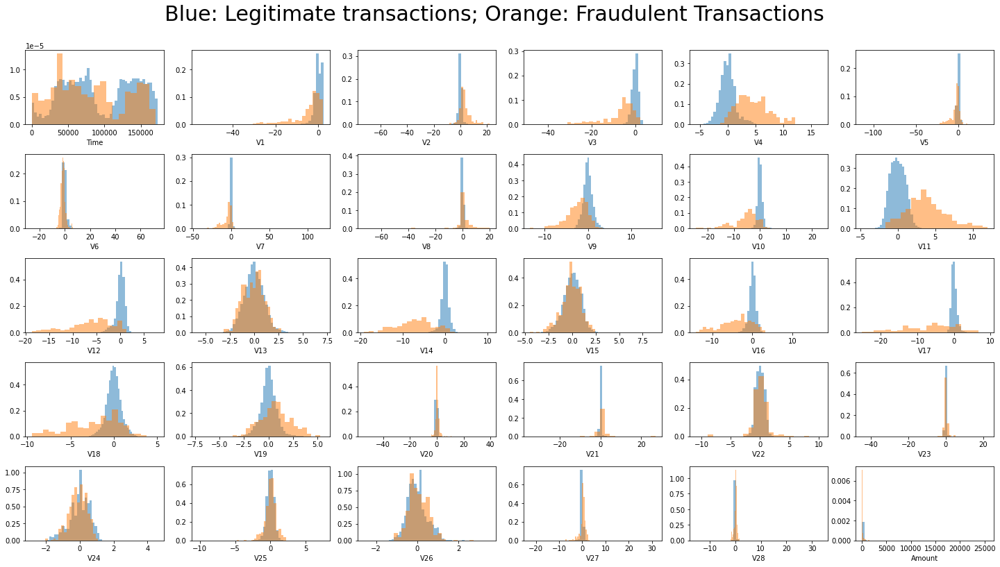

In [4]:
# Let's see the distributions of features for legitimate and fraudulent transactions
data = np.array(data_csv)

plt.figure(figsize=(25,13))
plt.suptitle(r"Blue: Legitimate transactions; Orange: Fraudulent Transactions", y=0.95, size=30)
plt.subplots_adjust(wspace=0.2, hspace=0.4)
for i in range(data.shape[1]-1):
    plt.subplot(5,6,i+1)
    plt.hist(data[np.where(data[:,-1] == 0)[0],i], 50, alpha=0.5, density=True)
    plt.hist(data[np.where(data[:,-1] == 1)[0],i], 20, alpha=0.5, density=True)
    plt.xlabel(data_csv.columns[i])
plt.show()

In [5]:
# Separate the data in legitimate and fraudulent transactions to check the balance of different classes of the dataset

legit = data[np.where(data[:,-1] == 0)[0]]
fraud = data[np.where(data[:,-1] == 1)[0]]

print(legit.shape)
print(fraud.shape)
print("Proportion of frauds: %.3f%%" % (fraud.shape[0]/(data.shape[0])*100))

(284315, 31)
(492, 31)
Proportion of frauds: 0.173%


##Functions for building the model and generating metrics

In [6]:
# As the dataset is highly unbalanced, we need to make sure there will be elements of both classes in the train, validation and test sets.

from sklearn.utils.class_weight import compute_class_weight
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE

# Ignore a few warnings
from warnings import simplefilter
# ignore all future warnings
simplefilter(action='ignore', category=FutureWarning)

# Separate the data in train, validation and test sets, according to different sampling methods
def train_val_test_sets(data, sampling="standard", smote_n=5):
    
    # Separate legitimate and fraudulent transactions
    legit = data[np.where(data[:,-1]==0)[0]]
    fraud = data[np.where(data[:,-1]==1)[0]]

    # Shuffle data
    np.random.shuffle(legit)
    np.random.shuffle(fraud)

    # Separate same proportions of legitimate and fraudulent transactions for joining them later
    train_legit = legit[:int(0.7*len(legit))]
    val_legit = legit[int(0.7*len(legit)):int(0.85*len(legit))]
    test_legit = legit[int(0.85*len(legit)):]

    train_fraud = fraud[:int(0.7*len(fraud))]
    val_fraud = fraud[int(0.7*len(fraud)):int(0.85*len(fraud))]
    test_fraud = fraud[int(0.85*len(fraud)):]

    # The validation and test sets should be the same independent of the sampling method for training
    test = np.concatenate((test_legit, test_fraud), axis=0)
    val = np.concatenate((val_legit, val_fraud), axis=0)

    # Create scaler based on all training data
    train = np.concatenate((train_legit, train_fraud), axis=0)
    train_scaler = StandardScaler()
    train[:,:-1] = train_scaler.fit_transform(train[:,:-1])

    train_legit = train[np.where(train[:,-1]==0)[0]]
    train_fraud = train[np.where(train[:,-1]==1)[0]]

    # Standard sampling: we simply ignore the fact that the dataset is highly imbalanced
    if (sampling == "standard"):
        
        # Just concatenate the legitimiate and fraudulent transactions sets to maintain the proportion of the classes
        train = np.concatenate((train_legit, train_fraud), axis=0)      

    # Undersampling: sample from the class with more examples only the same amount of samples of the minority class
    elif (sampling == "undersampling"):

        # Get indexes of legitimate transactions list, and sort a few of them
        train_ids = np.arange(len(train_legit))
        train = np.concatenate((train_fraud, train_legit[np.random.choice(train_ids, len(train_fraud))]), axis=0)

        # If we don't do the same for the validation in this case, the calculations for the validation set during the training take too long
        val_ids = np.arange(len(val_legit))
        val = np.concatenate((val_fraud, val_legit[np.random.choice(val_ids, len(val_fraud))]), axis=0)
    
    # Oversampling: sample from the minority class enough samples to have the same amount of both classes, even if it means repeating data
    elif (sampling == "oversampling"):
        
        # Get indexes of legitimate transactions list, and sort a many of them
        train_ids = np.arange(len(train_fraud))
        train = np.concatenate((train_legit, train_fraud[np.random.choice(train_ids, len(train_legit))]), axis=0)

    # SMOTE: Synthetic Minority Oversampling Technique: generate data in the midpoint between two data points in the feature space
    # for the minority class, until we have the same amount of examples from both classes.
    # It's done for a given number of nearest neighbors (standard=5)
    elif (sampling == "SMOTE"):

        train = np.concatenate((train_legit, train_fraud), axis=0)

        # It automatically determines the minority class and generate new data
        x, y = SMOTE(k_neighbors=smote_n).fit_resample(train[:,:-1], train[:,-1])

        # Include new data in the training set
        train = np.concatenate((x, y.reshape(-1,1)), axis=1)

    # Shuffle data so there is no overfit in one class before fitting the other
    np.random.shuffle(train)
    np.random.shuffle(val)
    np.random.shuffle(test)

    # Scale features
    val[:,:-1] = train_scaler.transform(val[:,:-1])
    test[:,:-1] = train_scaler.transform(test[:,:-1])

    # Compute class weights to balance the classes in the training process, in case we want to use it
    class_weights = compute_class_weight("balanced", [0,1], train[:,-1])

    return train, val, test, {0:class_weights[0], 1:class_weights[1]}

train, val, test, cw = train_val_test_sets(data, sampling="standard")

# Separate features and labels
train_data = train[:,:-1]
train_label = train[:,-1]
val_data = val[:,:-1]
val_label = val[:,-1]
test_data = test[:,:-1]
test_label = test[:,-1]

print(train_data.shape)
print(train_label.shape)
print(val_data.shape)
print(val_label.shape)
print(test_data.shape)
print(test_label.shape)
print(cw)

/usr/local/lib/python3.6/dist-packages/sklearn/externals/six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.neighbors.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.neighbors. Anything that cannot be imported from sklearn.neighbors is now part of the private API.
  warnings.warn(message, FutureWarning)


(199364, 30)
(199364,)
(42721, 30)
(42721,)
(42722, 30)
(42722,)
{0: 0.5008642347502763, 1: 289.7732558139535}


In [7]:
from tensorflow.keras.models import Sequential # Model of sequential layers
from tensorflow.keras.layers import Dense, Dropout # Layers to be used
from keras.metrics import Precision, Recall, AUC # Additional metrics

metrics = [AUC(name="auc"), Precision(name="precision"), Recall(name="recall")]

def make_model(neurons=[16], dropouts=[0.5], mid_activation="relu", input_shape=(30,)):
    
    # Model definition
    model = Sequential()
    model.add(Dense(neurons[0], activation=mid_activation, input_shape=input_shape))
    model.add(Dropout(dropouts[0]))

    for i in range(1, len(neurons)):

        model.add(Dense(neurons[i], activation=mid_activation))
        model.add(Dropout(dropouts[i]))

    model.add(Dense(1, activation="sigmoid"))
    
    model.summary()

    # Model compilation
    model.compile(
        optimizer = "adam",
        loss = "binary_crossentropy",
        metrics = metrics,
    )

    return model

model = make_model()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 16)                496       
_________________________________________________________________
dropout (Dropout)            (None, 16)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________


In [8]:
# Model fitting
def model_fit(model, data, label, val_data, val_label, verbose, class_weights, epochs, validation=True):

    # When we do K-fold cross-validation, we won't generate validations sets
    if validation:

        val = (val_data, val_label)

    else:

        val = None

    history = model.fit(
        data,
        label,
        epochs = epochs,
        batch_size = len(label)//50,
        validation_data = val,
        verbose=verbose,
        class_weight = class_weights,
    )

    return history

history = model_fit(model, train_data, train_label, val_data, val_label, 2, None, 20)

Epoch 1/20
51/51 - 1s - loss: 0.6064 - auc: 0.2034 - precision: 8.2259e-04 - recall: 0.1424 - val_loss: 0.3778 - val_auc: 0.1674 - val_precision: 9.4429e-04 - val_recall: 0.0270
Epoch 2/20
51/51 - 0s - loss: 0.3800 - auc: 0.2026 - precision: 8.8156e-04 - recall: 0.0669 - val_loss: 0.2250 - val_auc: 0.1667 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 3/20
51/51 - 0s - loss: 0.2654 - auc: 0.2726 - precision: 0.0018 - recall: 0.0640 - val_loss: 0.1440 - val_auc: 0.1953 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 4/20
51/51 - 0s - loss: 0.1998 - auc: 0.3763 - precision: 0.0057 - recall: 0.1017 - val_loss: 0.0951 - val_auc: 0.4924 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 5/20
51/51 - 0s - loss: 0.1571 - auc: 0.6004 - precision: 0.0179 - recall: 0.1686 - val_loss: 0.0653 - val_auc: 0.7654 - val_precision: 1.0000 - val_recall: 0.1081
Epoch 6/20
51/51 - 0s - loss: 0.1299 - auc: 0.6224 - precision: 0.0257 - recall: 0.1483 - val_loss: 0.0483 - val_a

Final Train auc: 88.215%
Final Validation auc: 91.144%
Final Train precision: 75.472%
Final Validation precision: 92.683%
Final Train recall: 34.884%
Final Validation recall: 51.351%


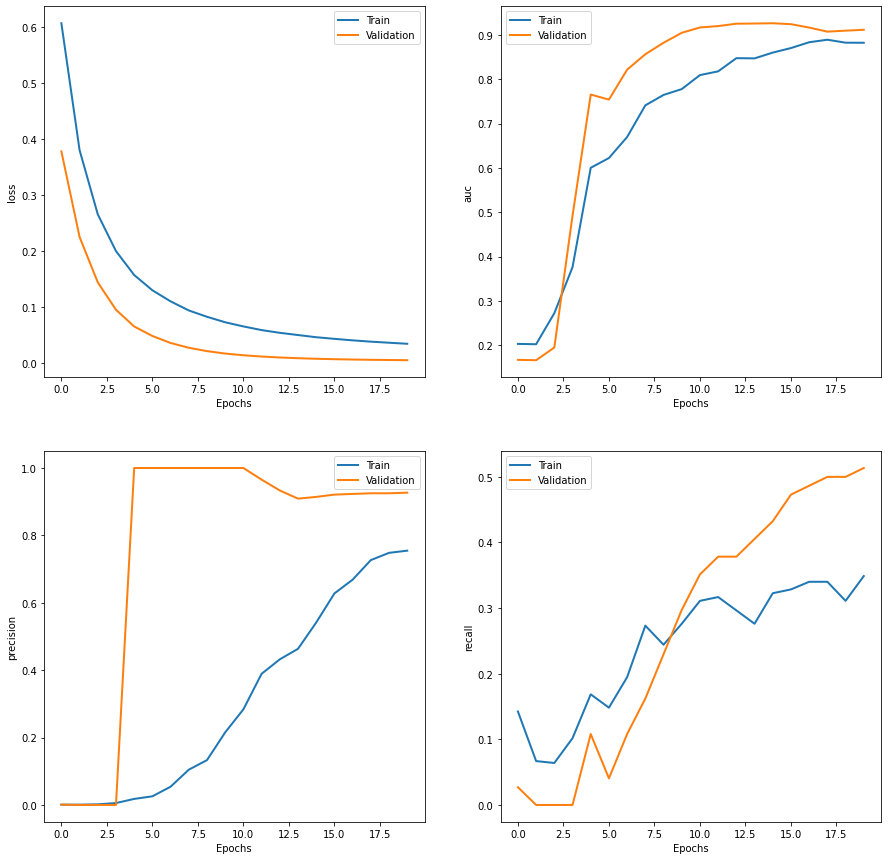

In [9]:
# Metrics names
metrics_ = ["loss", "auc", "precision", "recall"]

# Plot metrics
def plot_metrics(history):

    # Print final metrics
    for i in range(1, len(metrics_)):
        print("Final Train %s: %.3f%%" % (metrics_[i], history[metrics_[i]][-1]*100))
        if ("val_loss" in history.keys()):
            print("Final Validation %s: %.3f%%" % (metrics_[i], history["val_"+metrics_[i]][-1]*100))

    # Plot metrics' evolution through training epochs
    plt.figure(figsize=(15,15))

    for i in range(len(metrics_)):
        
        plt.subplot(2,2,i+1)
        plt.plot(history[metrics_[i]], lw=2, label="Train")
        if ("val_loss" in history.keys()):
            plt.plot(history["val_"+metrics_[i]], lw=2, label="Validation")
        plt.xlabel("Epochs")
        plt.ylabel(metrics_[i])
        plt.legend()
    plt.show()

plot_metrics(history.history)

###Testing a few different network architectures, for different samplings

####Standard sampling

In [10]:
train, val, test, cw = train_val_test_sets(data, sampling="standard")

# Separate features and labels
train_data = train[:,:-1]
train_label = train[:,-1]
val_data = val[:,:-1]
val_label = val[:,-1]
test_data = test[:,:-1]
test_label = test[:,-1]

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2 (Dense)              (None, 16)                496       
_________________________________________________________________
dropout_1 (Dropout)          (None, 16)                0         
_________________________________________________________________
dense_3 (Dense)              (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Final Train auc: 92.930%
Final Validation auc: 89.730%
Final Train precision: 81.185%
Final Validation precision: 88.525%
Final Train recall: 67.733%
Final Validation recall: 72.973%


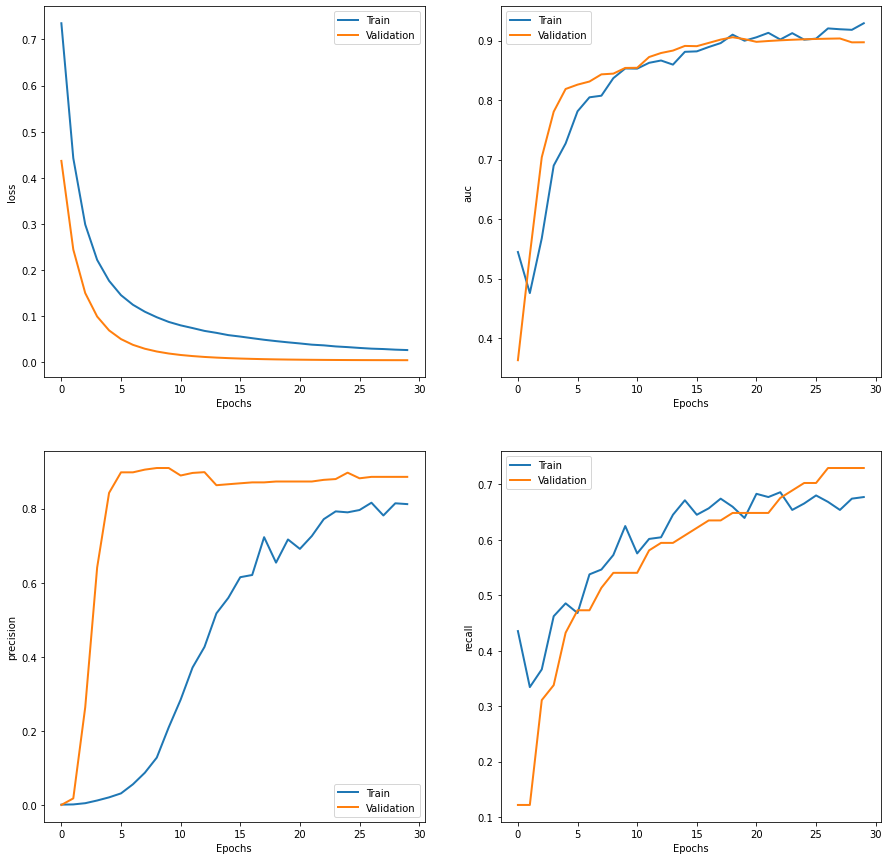

In [11]:
model = make_model([16], [0.5])
history = model_fit(model, train_data, train_label, val_data, val_label, 0, None, 30)
plot_metrics(history.history)

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_4 (Dense)              (None, 32)                992       
_________________________________________________________________
dropout_2 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_5 (Dense)              (None, 1)                 33        
Total params: 1,025
Trainable params: 1,025
Non-trainable params: 0
_________________________________________________________________
Final Train auc: 93.638%
Final Validation auc: 87.799%
Final Train precision: 84.387%
Final Validation precision: 92.727%
Final Train recall: 65.988%
Final Validation recall: 68.919%


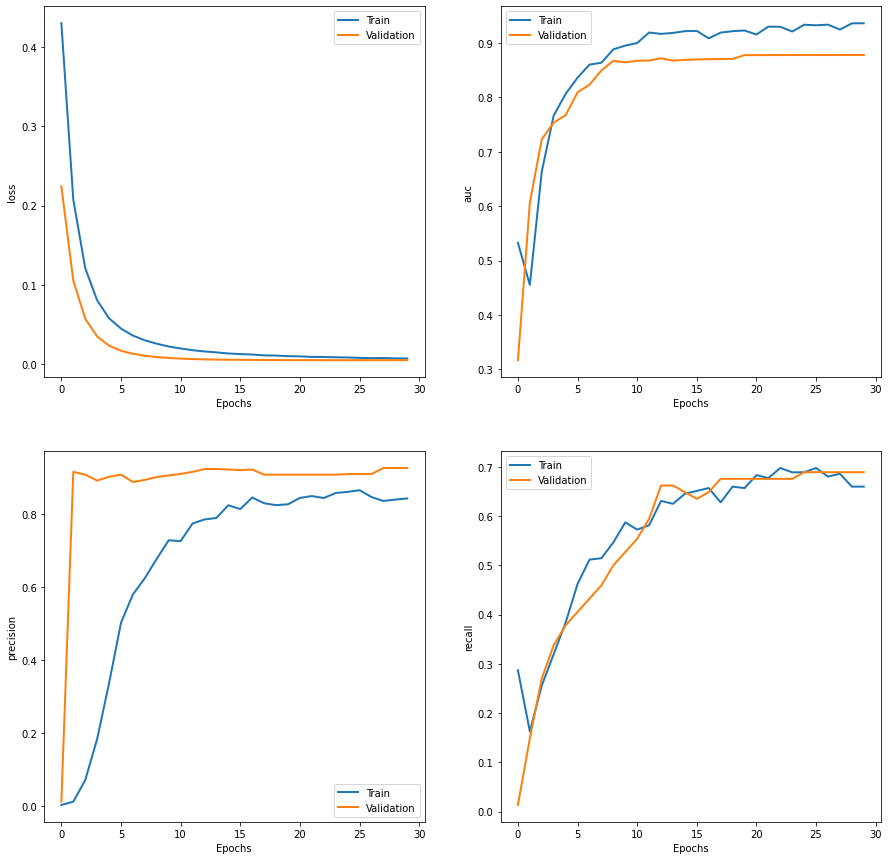

In [12]:
model = make_model([32], [0.5])
history = model_fit(model, train_data, train_label, val_data, val_label, 0, None, 30)
plot_metrics(history.history)

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_6 (Dense)              (None, 16)                496       
_________________________________________________________________
dropout_3 (Dropout)          (None, 16)                0         
_________________________________________________________________
dense_7 (Dense)              (None, 16)                272       
_________________________________________________________________
dropout_4 (Dropout)          (None, 16)                0         
_________________________________________________________________
dense_8 (Dense)              (None, 1)                 17        
Total params: 785
Trainable params: 785
Non-trainable params: 0
_________________________________________________________________
Final Train auc: 94.104%
Final Validation auc: 87.800%
Final Train precision: 0.000%
Final Validation precision: 0.000%
Fi

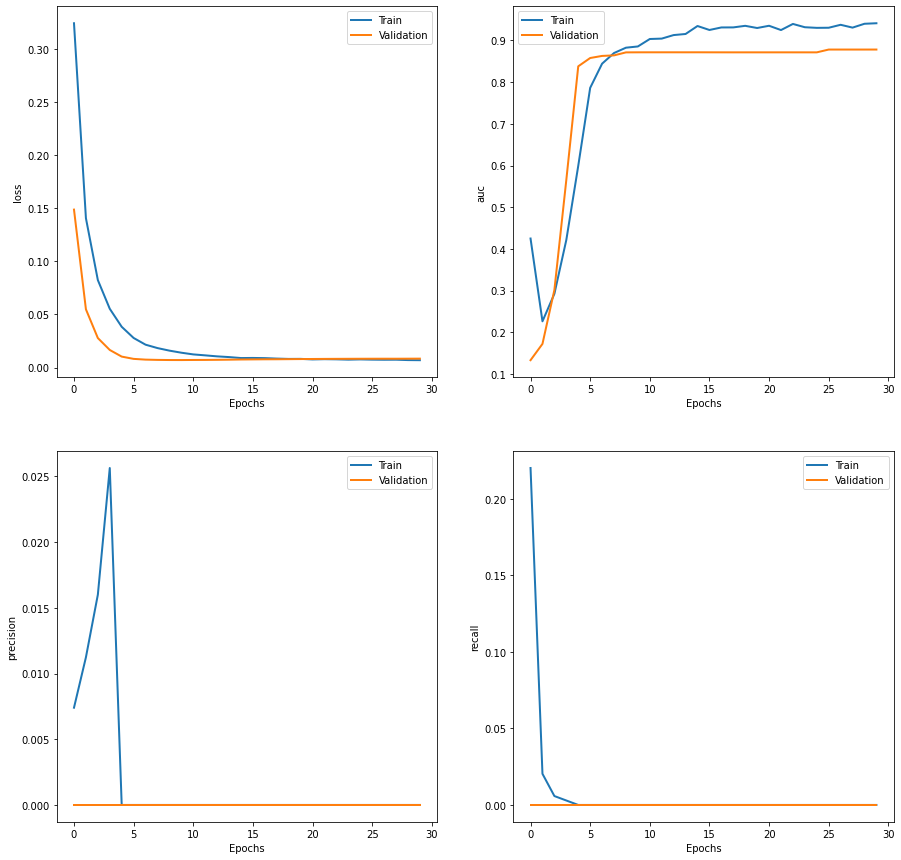

In [13]:
model = make_model([16, 16], [0.5, 0.2])
history = model_fit(model, train_data, train_label, val_data, val_label, 0, None, 30)
plot_metrics(history.history)

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_9 (Dense)              (None, 32)                992       
_________________________________________________________________
dropout_5 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_10 (Dense)             (None, 32)                1056      
_________________________________________________________________
dropout_6 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_11 (Dense)             (None, 1)                 33        
Total params: 2,081
Trainable params: 2,081
Non-trainable params: 0
_________________________________________________________________
Final Train auc: 94.172%
Final Validation auc: 88.479%
Final Train precision: 86.207%
Final Validation precision: 91.5

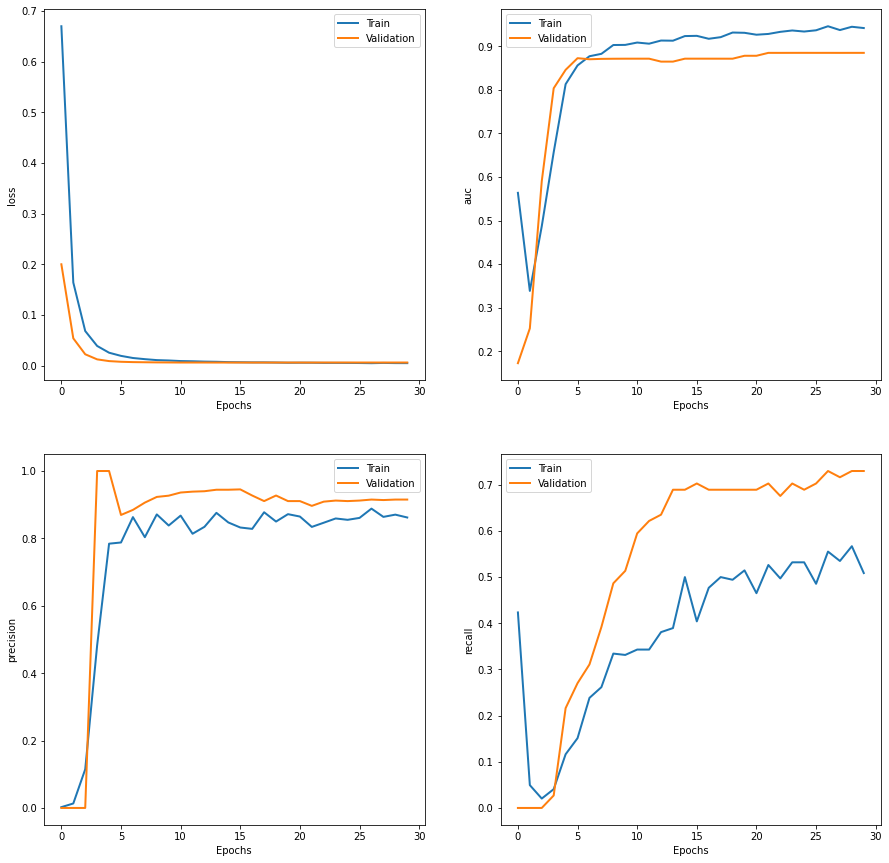

In [14]:
model = make_model([32, 32], [0.5, 0.2])
history = model_fit(model, train_data, train_label, val_data, val_label, 0, None, 30)
plot_metrics(history.history)

####Undersampling

In [15]:
train, val, test, cw = train_val_test_sets(data, sampling="undersampling")

# Separate features and labels
train_data = train[:,:-1]
train_label = train[:,-1]
val_data = val[:,:-1]
val_label = val[:,-1]
test_data = test[:,:-1]
test_label = test[:,-1]

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_12 (Dense)             (None, 16)                496       
_________________________________________________________________
dropout_7 (Dropout)          (None, 16)                0         
_________________________________________________________________
dense_13 (Dense)             (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Final Train auc: 98.146%
Final Validation auc: 98.146%
Final Train precision: 97.476%
Final Validation precision: 95.775%
Final Train recall: 89.826%
Final Validation recall: 91.892%


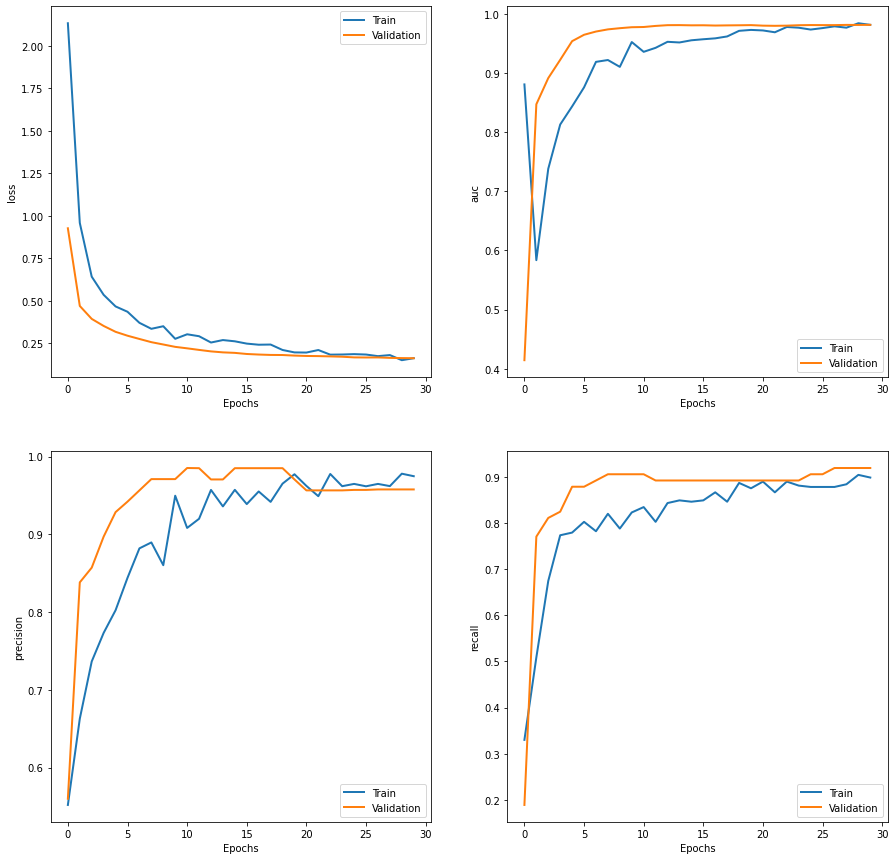

In [16]:
model = make_model([16], [0.5])
history = model_fit(model, train_data, train_label, val_data, val_label, 0, None, 30)
plot_metrics(history.history)

Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_14 (Dense)             (None, 32)                992       
_________________________________________________________________
dropout_8 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_15 (Dense)             (None, 1)                 33        
Total params: 1,025
Trainable params: 1,025
Non-trainable params: 0
_________________________________________________________________
Final Train auc: 98.595%
Final Validation auc: 98.503%
Final Train precision: 97.273%
Final Validation precision: 94.366%
Final Train recall: 93.314%
Final Validation recall: 90.541%


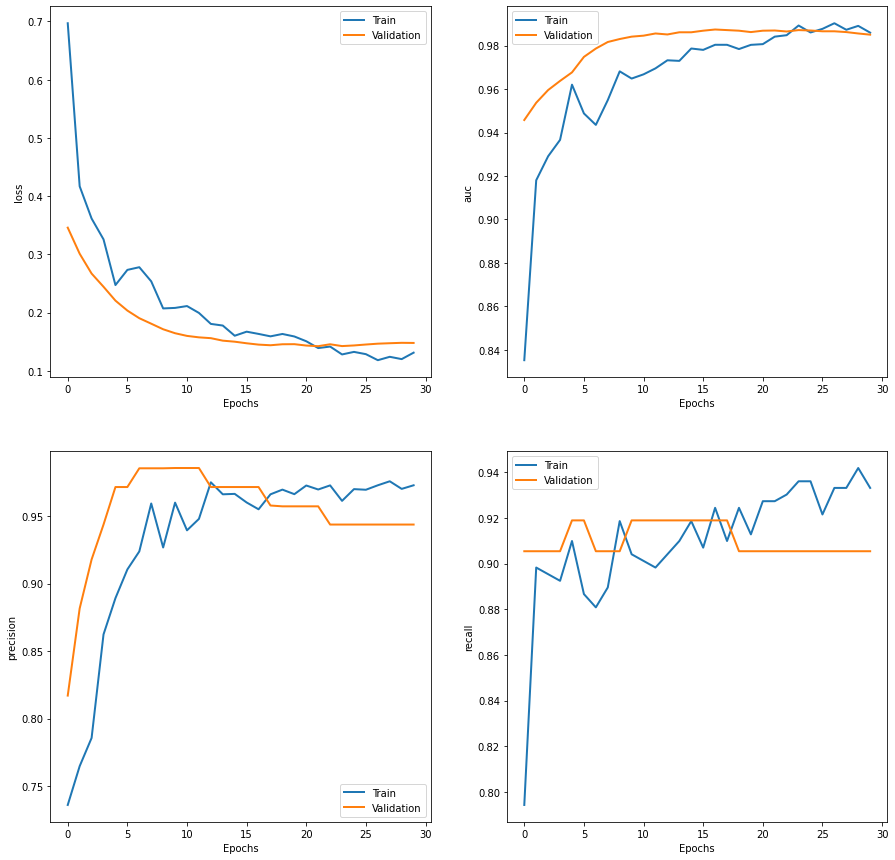

In [17]:
model = make_model([32], [0.5])
history = model_fit(model, train_data, train_label, val_data, val_label, 0, None, 30)
plot_metrics(history.history)

Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_16 (Dense)             (None, 16)                496       
_________________________________________________________________
dropout_9 (Dropout)          (None, 16)                0         
_________________________________________________________________
dense_17 (Dense)             (None, 16)                272       
_________________________________________________________________
dropout_10 (Dropout)         (None, 16)                0         
_________________________________________________________________
dense_18 (Dense)             (None, 1)                 17        
Total params: 785
Trainable params: 785
Non-trainable params: 0
_________________________________________________________________
Final Train auc: 97.876%
Final Validation auc: 97.772%
Final Train precision: 97.161%
Final Validation precision: 98.507%


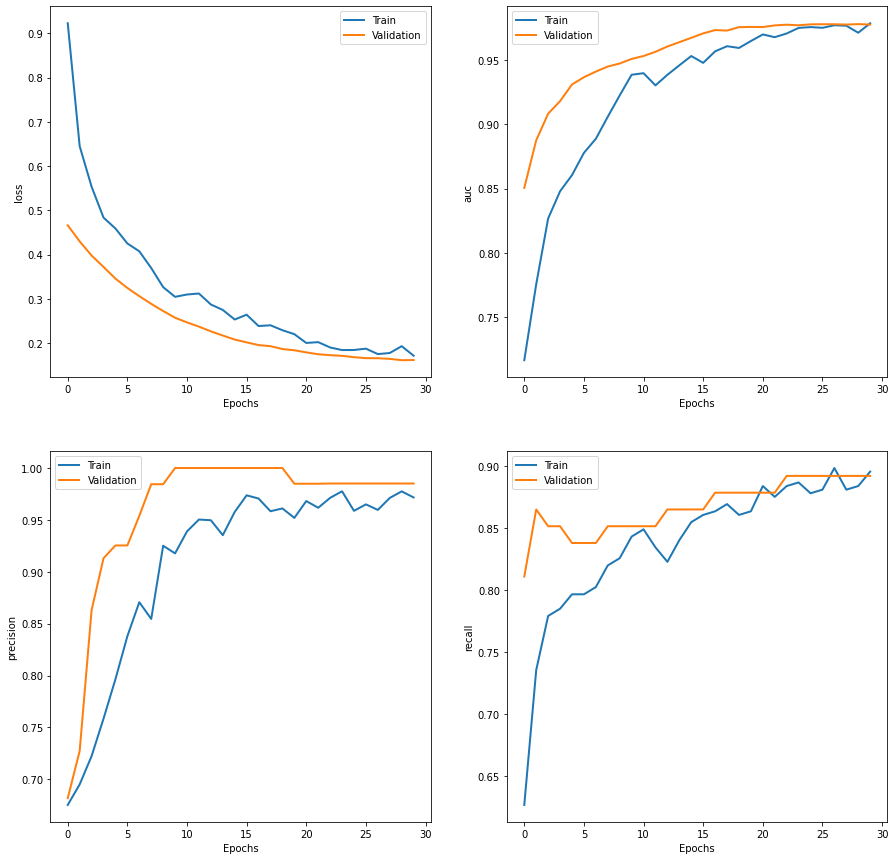

In [18]:
model = make_model([16, 16], [0.5, 0.2])
history = model_fit(model, train_data, train_label, val_data, val_label, 0, None, 30)
plot_metrics(history.history)

Model: "sequential_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_19 (Dense)             (None, 32)                992       
_________________________________________________________________
dropout_11 (Dropout)         (None, 32)                0         
_________________________________________________________________
dense_20 (Dense)             (None, 32)                1056      
_________________________________________________________________
dropout_12 (Dropout)         (None, 32)                0         
_________________________________________________________________
dense_21 (Dense)             (None, 1)                 33        
Total params: 2,081
Trainable params: 2,081
Non-trainable params: 0
_________________________________________________________________
Final Train auc: 99.003%
Final Validation auc: 98.119%
Final Train precision: 97.859%
Final Validation precision: 94.2

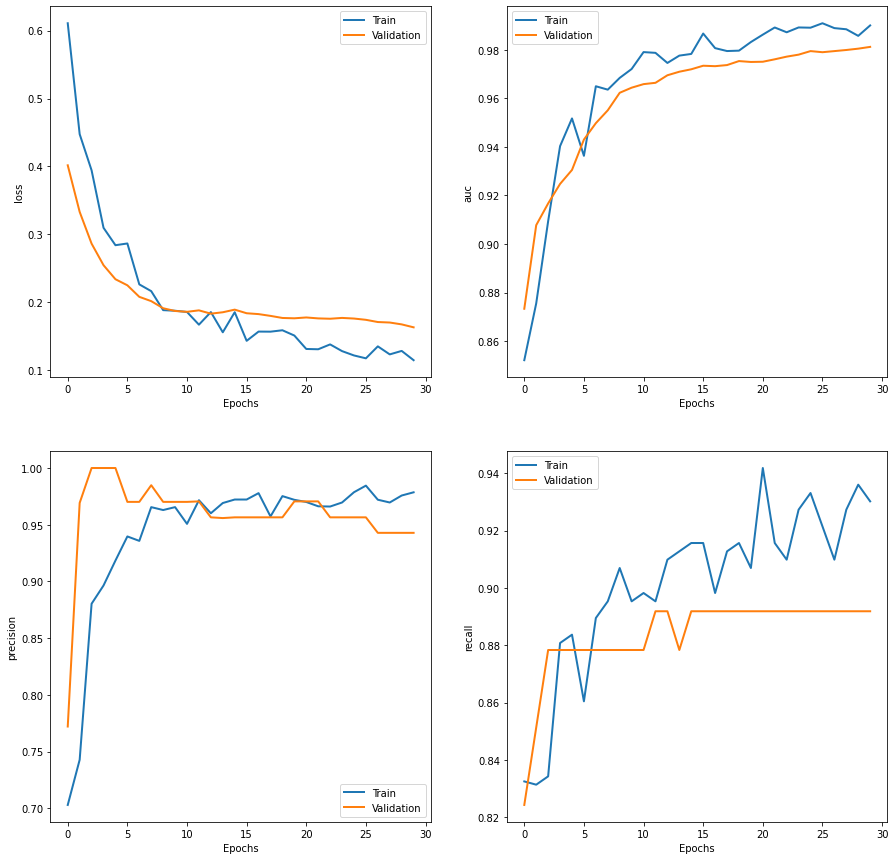

In [19]:
model = make_model([32, 32], [0.5, 0.2])
history = model_fit(model, train_data, train_label, val_data, val_label, 0, None, 30)
plot_metrics(history.history)

####Oversampling

In [20]:
train, val, test, cw = train_val_test_sets(data, sampling="oversampling")

# Separate features and labels
train_data = train[:,:-1]
train_label = train[:,-1]
val_data = val[:,:-1]
val_label = val[:,-1]
test_data = test[:,:-1]
test_label = test[:,-1]

Model: "sequential_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_22 (Dense)             (None, 16)                496       
_________________________________________________________________
dropout_13 (Dropout)         (None, 16)                0         
_________________________________________________________________
dense_23 (Dense)             (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Final Train auc: 99.200%
Final Validation auc: 98.296%
Final Train precision: 97.504%
Final Validation precision: 9.517%
Final Train recall: 93.902%
Final Validation recall: 90.541%


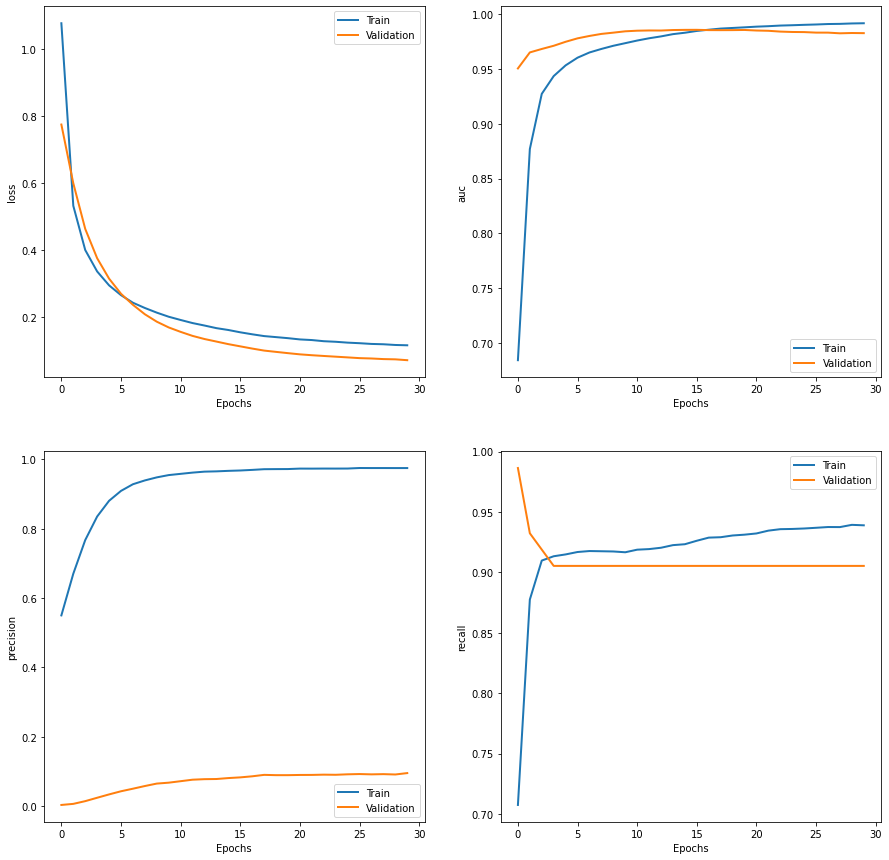

In [21]:
model = make_model([16], [0.5])
history = model_fit(model, train_data, train_label, val_data, val_label, 0, None, 30)
plot_metrics(history.history)

Model: "sequential_10"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_24 (Dense)             (None, 32)                992       
_________________________________________________________________
dropout_14 (Dropout)         (None, 32)                0         
_________________________________________________________________
dense_25 (Dense)             (None, 1)                 33        
Total params: 1,025
Trainable params: 1,025
Non-trainable params: 0
_________________________________________________________________
Final Train auc: 99.739%
Final Validation auc: 96.662%
Final Train precision: 97.992%
Final Validation precision: 13.701%
Final Train recall: 97.106%
Final Validation recall: 90.541%


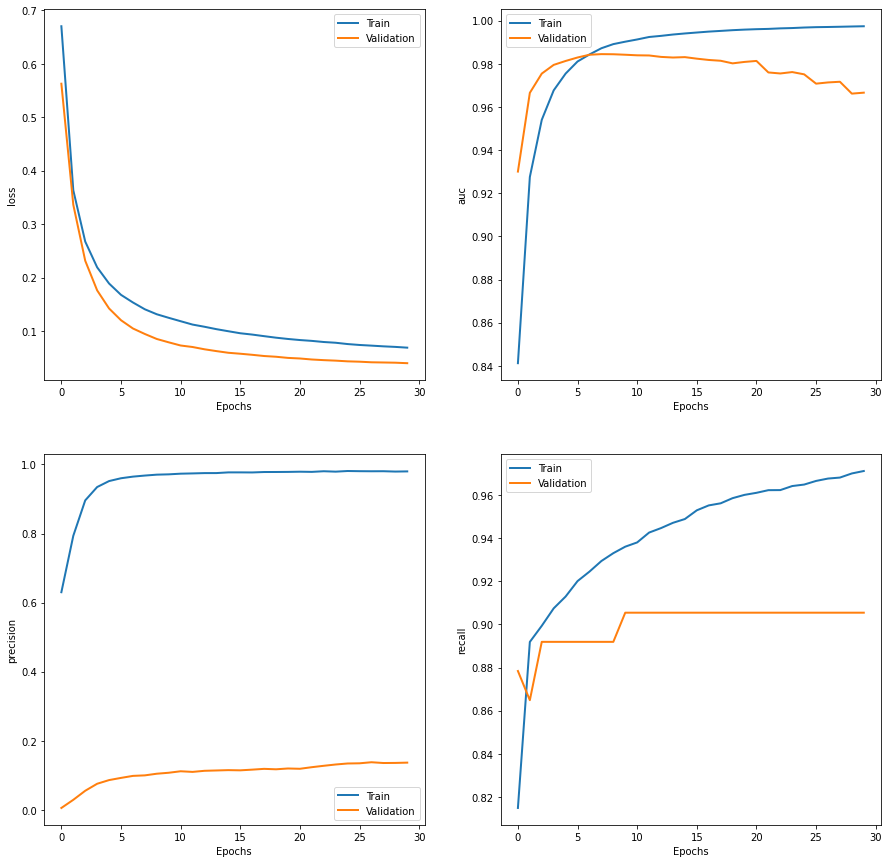

In [22]:
model = make_model([32], [0.5])
history = model_fit(model, train_data, train_label, val_data, val_label, 0, None, 30)
plot_metrics(history.history)

Model: "sequential_11"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_26 (Dense)             (None, 16)                496       
_________________________________________________________________
dropout_15 (Dropout)         (None, 16)                0         
_________________________________________________________________
dense_27 (Dense)             (None, 16)                272       
_________________________________________________________________
dropout_16 (Dropout)         (None, 16)                0         
_________________________________________________________________
dense_28 (Dense)             (None, 1)                 17        
Total params: 785
Trainable params: 785
Non-trainable params: 0
_________________________________________________________________
Final Train auc: 99.615%
Final Validation auc: 95.945%
Final Train precision: 96.875%
Final Validation precision: 11.453%

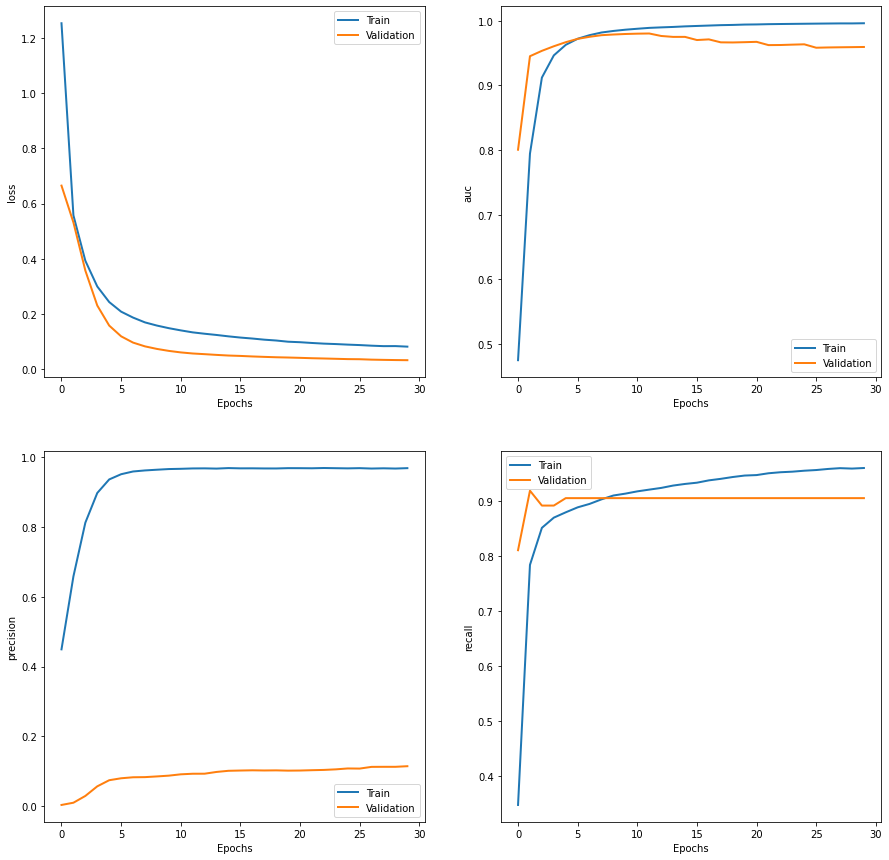

In [23]:
model = make_model([16, 16], [0.5, 0.2])
history = model_fit(model, train_data, train_label, val_data, val_label, 0, None, 30)
plot_metrics(history.history)

Model: "sequential_12"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_29 (Dense)             (None, 32)                992       
_________________________________________________________________
dropout_17 (Dropout)         (None, 32)                0         
_________________________________________________________________
dense_30 (Dense)             (None, 32)                1056      
_________________________________________________________________
dropout_18 (Dropout)         (None, 32)                0         
_________________________________________________________________
dense_31 (Dense)             (None, 1)                 33        
Total params: 2,081
Trainable params: 2,081
Non-trainable params: 0
_________________________________________________________________
Final Train auc: 99.862%
Final Validation auc: 95.550%
Final Train precision: 97.706%
Final Validation precision: 17.

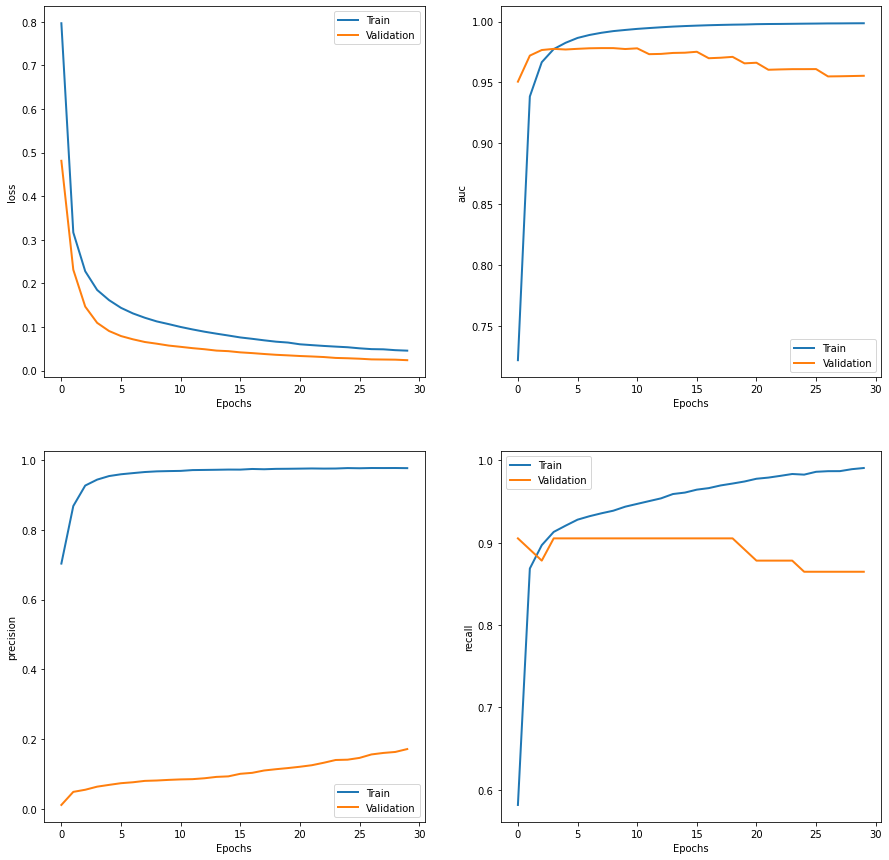

In [24]:
model = make_model([32, 32], [0.5, 0.2])
history = model_fit(model, train_data, train_label, val_data, val_label, 0, None, 30)
plot_metrics(history.history)

####SMOTE sampling

In [25]:
train, val, test, cw = train_val_test_sets(data, sampling="SMOTE")

# Separate features and labels
train_data = train[:,:-1]
train_label = train[:,-1]
val_data = val[:,:-1]
val_label = val[:,-1]
test_data = test[:,:-1]
test_label = test[:,-1]

Model: "sequential_13"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_32 (Dense)             (None, 16)                496       
_________________________________________________________________
dropout_19 (Dropout)         (None, 16)                0         
_________________________________________________________________
dense_33 (Dense)             (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Final Train auc: 99.203%
Final Validation auc: 98.608%
Final Train precision: 97.038%
Final Validation precision: 8.185%
Final Train recall: 93.212%
Final Validation recall: 93.243%


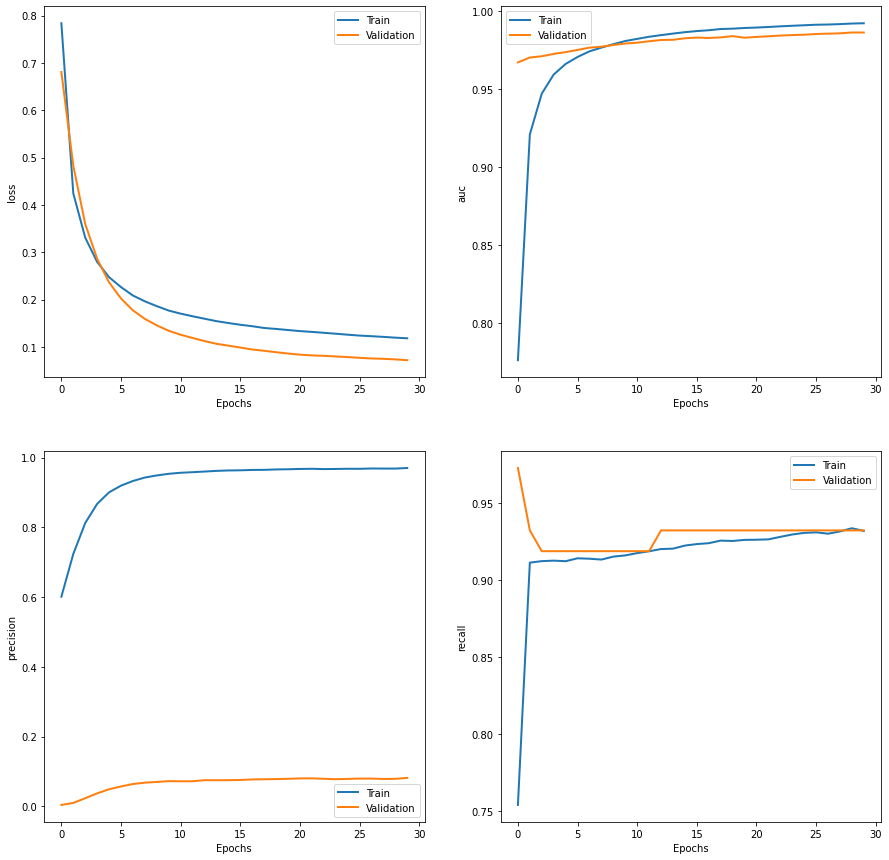

In [26]:
model = make_model([16], [0.5])
history = model_fit(model, train_data, train_label, val_data, val_label, 0, None, 30)
plot_metrics(history.history)

Model: "sequential_14"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_34 (Dense)             (None, 32)                992       
_________________________________________________________________
dropout_20 (Dropout)         (None, 32)                0         
_________________________________________________________________
dense_35 (Dense)             (None, 1)                 33        
Total params: 1,025
Trainable params: 1,025
Non-trainable params: 0
_________________________________________________________________
Final Train auc: 99.777%
Final Validation auc: 97.903%
Final Train precision: 97.442%
Final Validation precision: 11.815%
Final Train recall: 97.721%
Final Validation recall: 93.243%


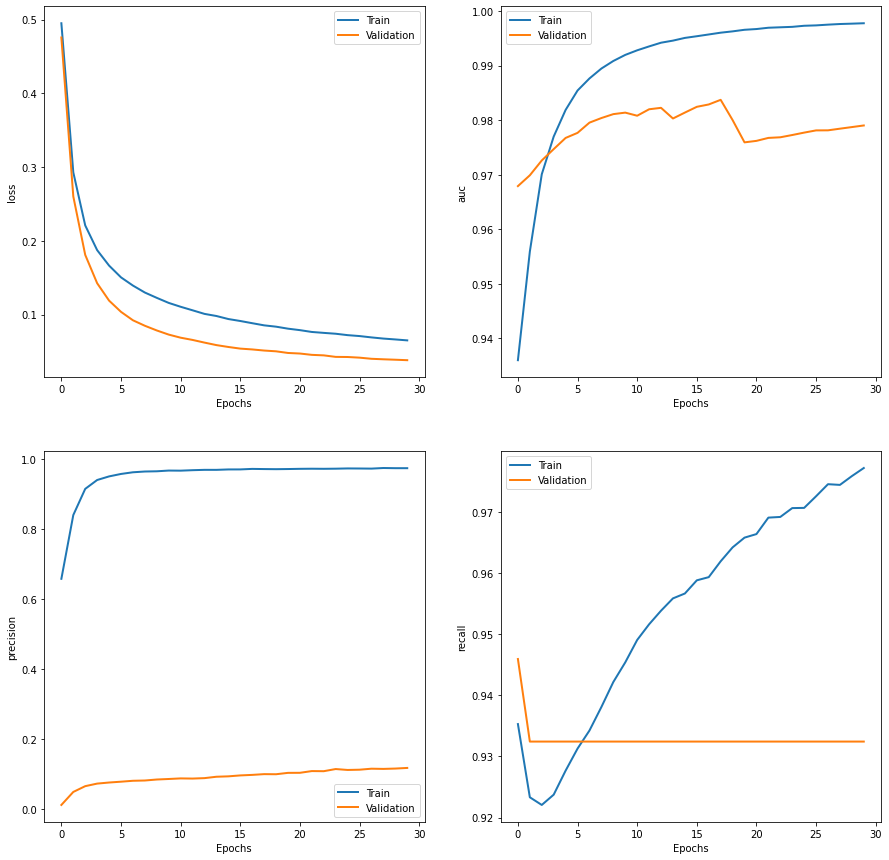

In [27]:
model = make_model([32], [0.5])
history = model_fit(model, train_data, train_label, val_data, val_label, 0, None, 30)
plot_metrics(history.history)

Model: "sequential_15"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_36 (Dense)             (None, 16)                496       
_________________________________________________________________
dropout_21 (Dropout)         (None, 16)                0         
_________________________________________________________________
dense_37 (Dense)             (None, 16)                272       
_________________________________________________________________
dropout_22 (Dropout)         (None, 16)                0         
_________________________________________________________________
dense_38 (Dense)             (None, 1)                 17        
Total params: 785
Trainable params: 785
Non-trainable params: 0
_________________________________________________________________
Final Train auc: 99.605%
Final Validation auc: 98.199%
Final Train precision: 96.999%
Final Validation precision: 13.996%

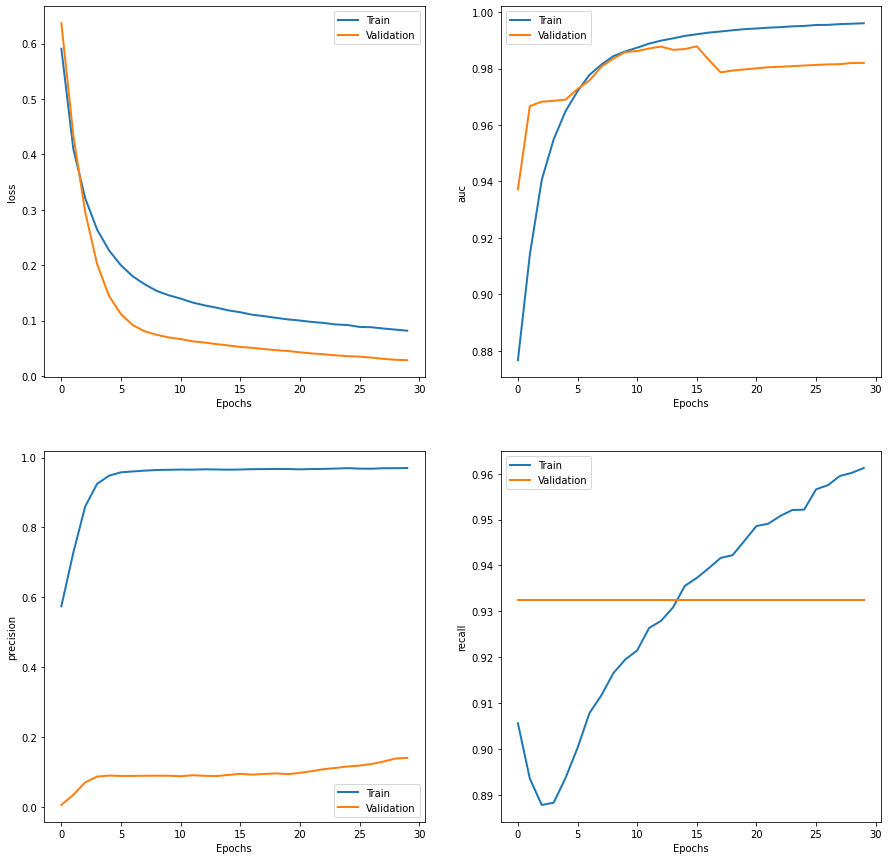

In [28]:
model = make_model([16, 16], [0.5, 0.2])
history = model_fit(model, train_data, train_label, val_data, val_label, 0, None, 30)
plot_metrics(history.history)

Model: "sequential_16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_39 (Dense)             (None, 32)                992       
_________________________________________________________________
dropout_23 (Dropout)         (None, 32)                0         
_________________________________________________________________
dense_40 (Dense)             (None, 32)                1056      
_________________________________________________________________
dropout_24 (Dropout)         (None, 32)                0         
_________________________________________________________________
dense_41 (Dense)             (None, 1)                 33        
Total params: 2,081
Trainable params: 2,081
Non-trainable params: 0
_________________________________________________________________
Final Train auc: 99.885%
Final Validation auc: 96.429%
Final Train precision: 97.851%
Final Validation precision: 19.

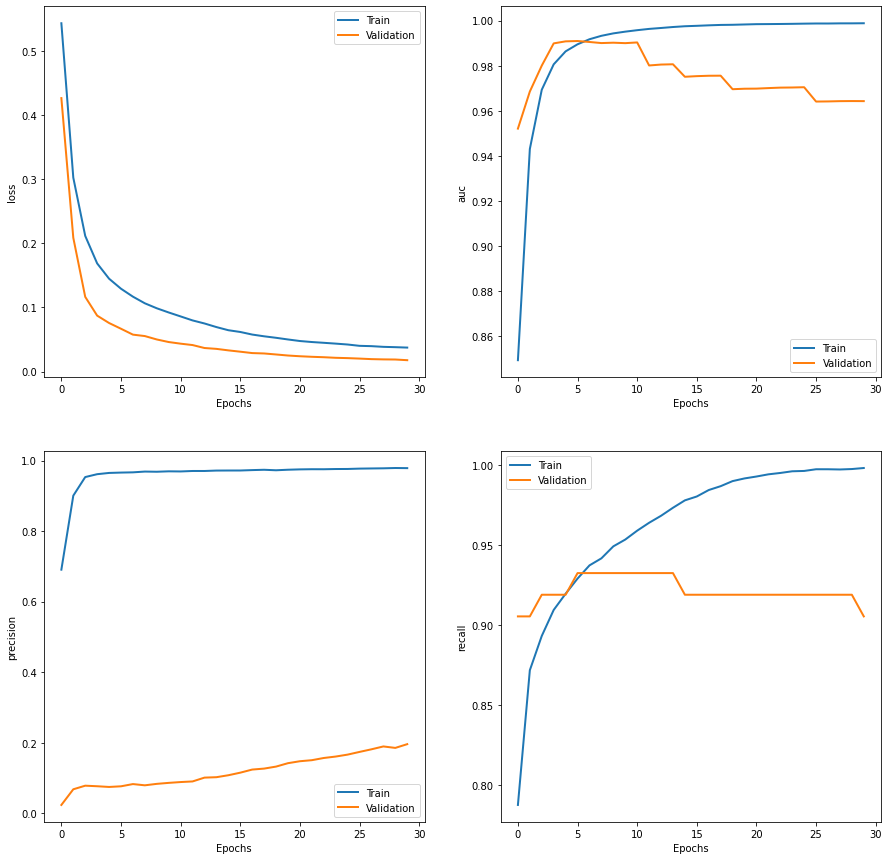

In [29]:
model = make_model([32, 32], [0.5, 0.2])
history = model_fit(model, train_data, train_label, val_data, val_label, 0, None, 30)
plot_metrics(history.history)

Considering the results for all different samplings, we'll settle with the single 16 neuron ReLu layer, followed by the final sigmoid layer

###Back to generating metrics

Model: "sequential_17"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_42 (Dense)             (None, 16)                496       
_________________________________________________________________
dropout_25 (Dropout)         (None, 16)                0         
_________________________________________________________________
dense_43 (Dense)             (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Final Train auc: 91.340%
Final Validation auc: 93.202%
Final Train precision: 88.785%
Final Validation precision: 79.412%
Final Train recall: 55.233%
Final Validation recall: 72.973%


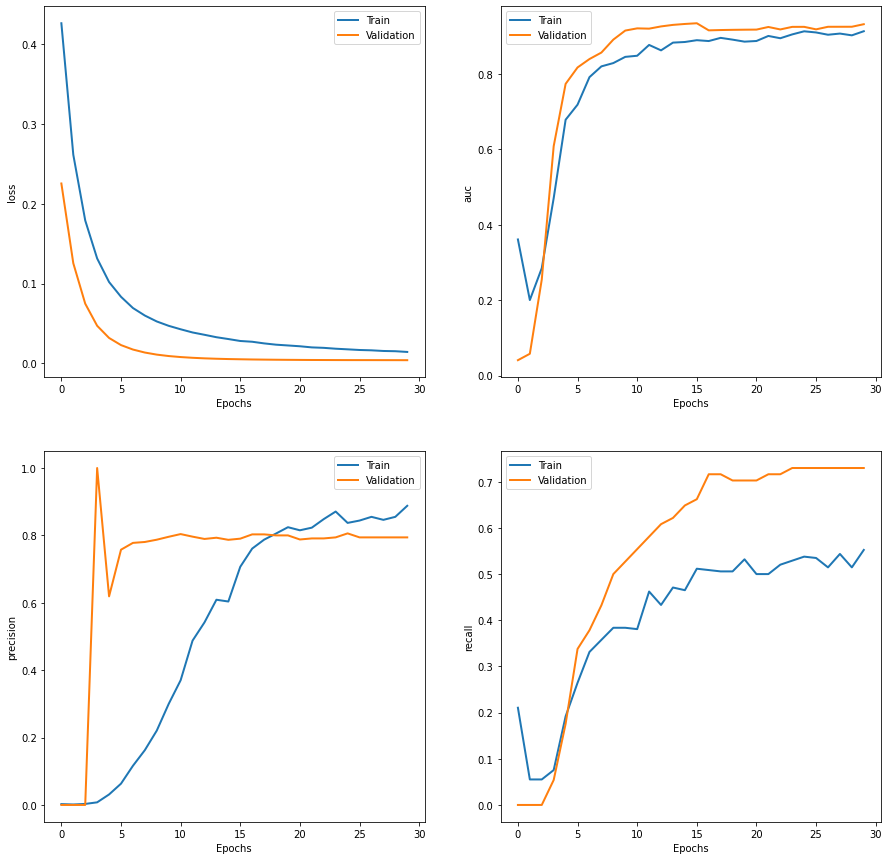

In [30]:
train, val, test, cw = train_val_test_sets(data, sampling="standard")

# Separate features and labels
train_data = train[:,:-1]
train_label = train[:,-1]
val_data = val[:,:-1]
val_label = val[:,-1]
test_data = test[:,:-1]
test_label = test[:,-1]

model = make_model()
history = model_fit(model, train_data, train_label, val_data, val_label, 0, None, 30)
plot_metrics(history.history)

Correct predictions for Train data: 99.933%
Train Precision: 88.930%
Train Recall: 70.058%
Correct predictions for Validation data: 99.920%
Validation Precision: 79.412%
Validation Recall: 72.973%
Correct predictions for Test data: 99.946%
Test Precision: 93.220%
Test Recall: 74.324%


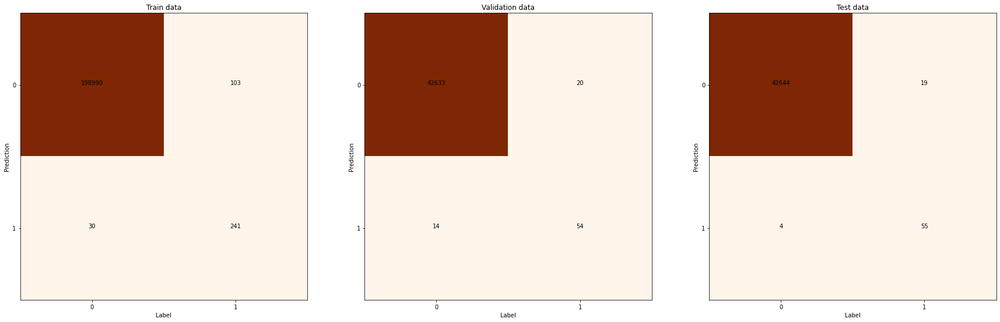

In [31]:
from sklearn.metrics import confusion_matrix

# For organization, a list of features and labels sets, with their names
data_label = [[train_data, train_label, "Train"], [val_data, val_label, "Validation"], [test_data, test_label, "Test"]]

def confusion_matrix_show(model, data_label):
    plt.figure(figsize=(10*len(data_label),10))

    # Create a list to save the different confusion matrices
    cms = []

    for k in range(len(data_label)):
        plt.subplot(1,len(data_label),k+1)

        # Get predictions and round them to 0 or 1
        pred = np.round(model.predict(data_label[k][0]))

        # Calculate confusion matrix
        cm = confusion_matrix(data_label[k][1], pred)
        cms.append(cm)
        print(r"Correct predictions for %s data: %.3f%%" % (data_label[k][2], 100*np.trace(cm)/len(data_label[k][1])))

        # Calculate precision and recall
        precision = cm[1,1]/(cm[1,1]+cm[0,1])
        recall = cm[1,1]/(cm[1,1]+cm[1,0])

        # Print obtained precision and recall
        print("%s Precision: %.3f%%" % (data_label[k][2], precision*100))
        print("%s Recall: %.3f%%" % (data_label[k][2], recall*100))

        # Plot confusion matrices
        plt.imshow(cm.T, cmap="Oranges")
        for i in range(cm.shape[0]):
            for j in range(cm.shape[1]):
                plt.text(i, j, "%i"%cm[i,j], ha="center")
        plt.xticks(np.unique(pred))
        plt.yticks(np.unique(data_label[k][1]))
        plt.xlabel("Label")
        plt.ylabel("Prediction")
        plt.gca().set_title("%s data" % (data_label[k][2]))

    return cms

confusion_matrix_show(model, data_label);

Area under ROC curve: 0.947
Area under Precision-Recall curve: 0.816
F1 Score: 0.827


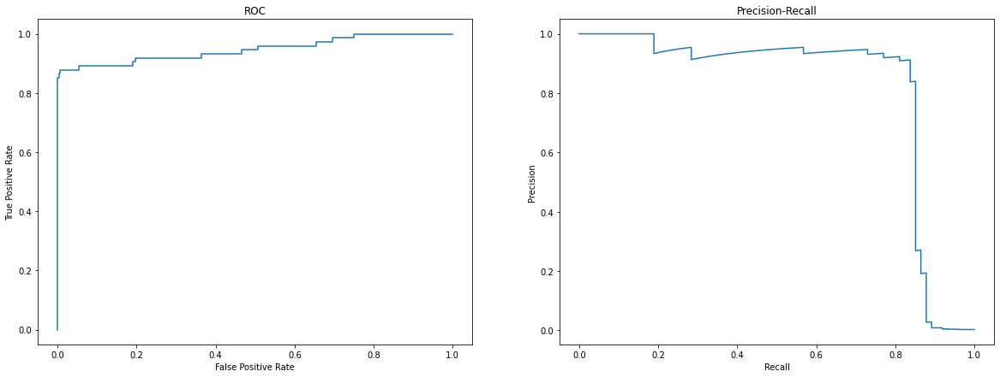

In [32]:
from sklearn.metrics import roc_curve, precision_recall_curve, f1_score, auc

# Calculate and plot ROC, Precision-Recall, and F1 Score
def roc_pr_f1_scores(label, pred):

    # Generate curves and calculate F1
    roc = roc_curve(label, pred) # ROC
    pr = precision_recall_curve(label, pred) # Precision-Recall
    f1 = f1_score(label, np.round(pred))

    # Print scores
    print("Area under ROC curve: %.3f" % auc(roc[0], roc[1])) # ROC-AUC Score
    print("Area under Precision-Recall curve: %.3f" % auc(pr[1], pr[0])) # PR-AUC Score
    print("F1 Score: %.3f" % f1) # F1 Score

    # Plot curves
    plt.figure(figsize=(20,7))

    # ROC curve
    plt.subplot(1,2,1)
    plt.plot(roc[0], roc[1])
    plt.title("ROC")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    
    # Precision-Recall curve
    plt.subplot(1,2,2)
    plt.plot(pr[1], pr[0])
    plt.title("Precision-Recall")
    plt.xlabel("Recall")
    plt.ylabel("Precision")

    plt.show()

    return roc, pr, f1

roc_pr_f1_scores(test_label, model.predict(test_data));

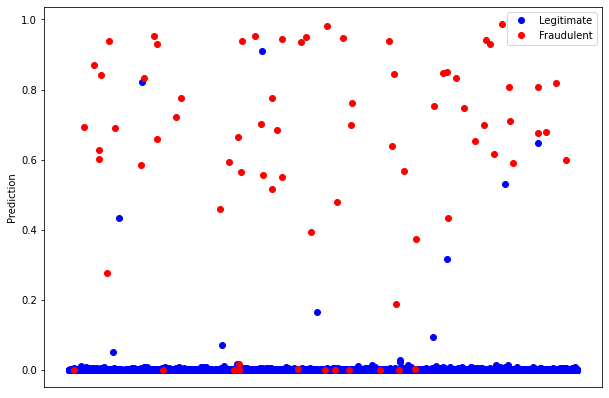

In [33]:
# Check sigmoid threshold effect on predictions

# Visualize how separated are the predictions for the different classes
def plot_separation(label, pred):

    plt.figure(figsize=(10, 7))
    plt.plot(np.random.uniform(0, 1, size=len(pred[np.where(label == 0)[0]])), pred[np.where(label == 0)[0]], "o", color="blue", label="Legitimate")
    plt.plot(np.random.uniform(0, 1, size=len(pred[np.where(label == 1)[0]])), pred[np.where(label == 1)[0]], "o", color="red", label="Fraudulent")
    plt.ylabel("Prediction")
    plt.legend()
    plt.xticks([]);
    plt.show()

plot_separation(test_label, model.predict(test_data))

##Check other sampling methods

Model: "sequential_18"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_44 (Dense)             (None, 16)                496       
_________________________________________________________________
dropout_26 (Dropout)         (None, 16)                0         
_________________________________________________________________
dense_45 (Dense)             (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Final Train auc: 98.256%
Final Validation auc: 96.357%
Final Train precision: 95.455%
Final Validation precision: 92.754%
Final Train recall: 91.570%
Final Validation recall: 86.486%


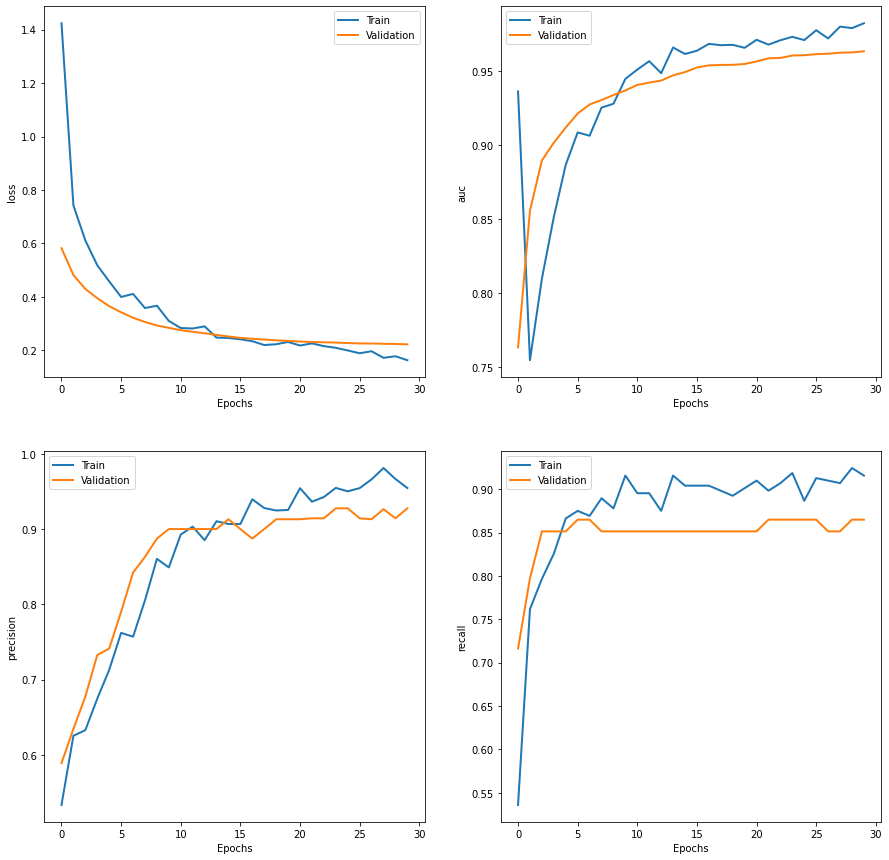

Correct predictions for Train data: 95.494%
Train Precision: 99.060%
Train Recall: 91.860%
Correct predictions for Validation data: 89.865%
Validation Precision: 92.754%
Validation Recall: 86.486%
Correct predictions for Test data: 95.815%
Test Precision: 3.825%
Test Recall: 95.946%


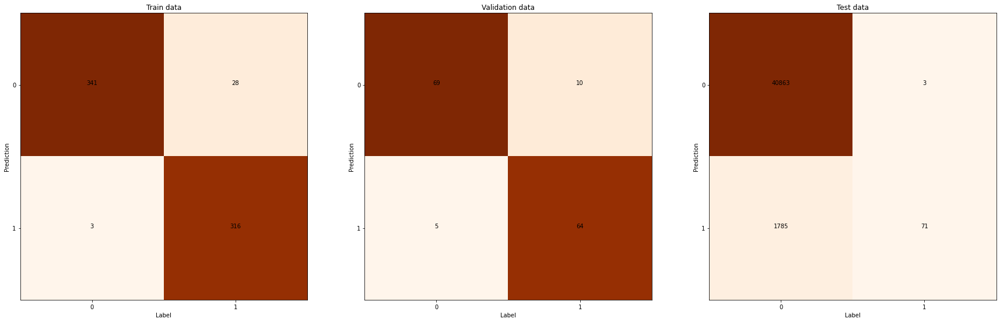

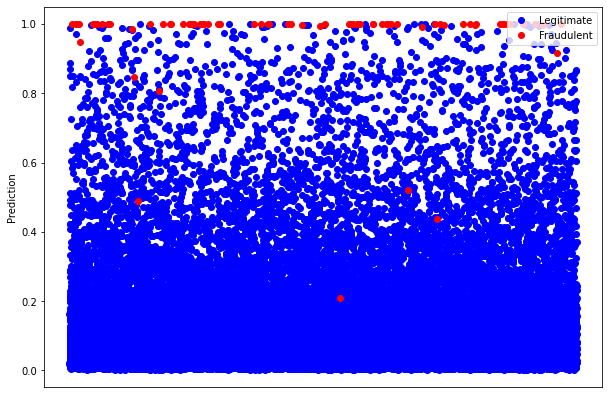

In [34]:
# Undersampling

train, val, test, cw = train_val_test_sets(data, "undersampling")

# Separate features and labels
train_data = train[:,:-1]
train_label = train[:,-1]
val_data = val[:,:-1]
val_label = val[:,-1]
test_data = test[:,:-1]
test_label = test[:,-1]

model = make_model()
history = model_fit(model, train_data, train_label, val_data, val_label, 0, None, 30)
plot_metrics(history.history)
data_label = [[train_data, train_label, "Train"], [val_data, val_label, "Validation"], [test_data, test_label, "Test"]]
confusion_matrix_show(model, data_label)
plot_separation(test_label, model.predict(test_data))

Model: "sequential_19"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_46 (Dense)             (None, 16)                496       
_________________________________________________________________
dropout_27 (Dropout)         (None, 16)                0         
_________________________________________________________________
dense_47 (Dense)             (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Final Train auc: 99.128%
Final Validation auc: 97.415%
Final Train precision: 97.318%
Final Validation precision: 9.116%
Final Train recall: 93.442%
Final Validation recall: 90.541%


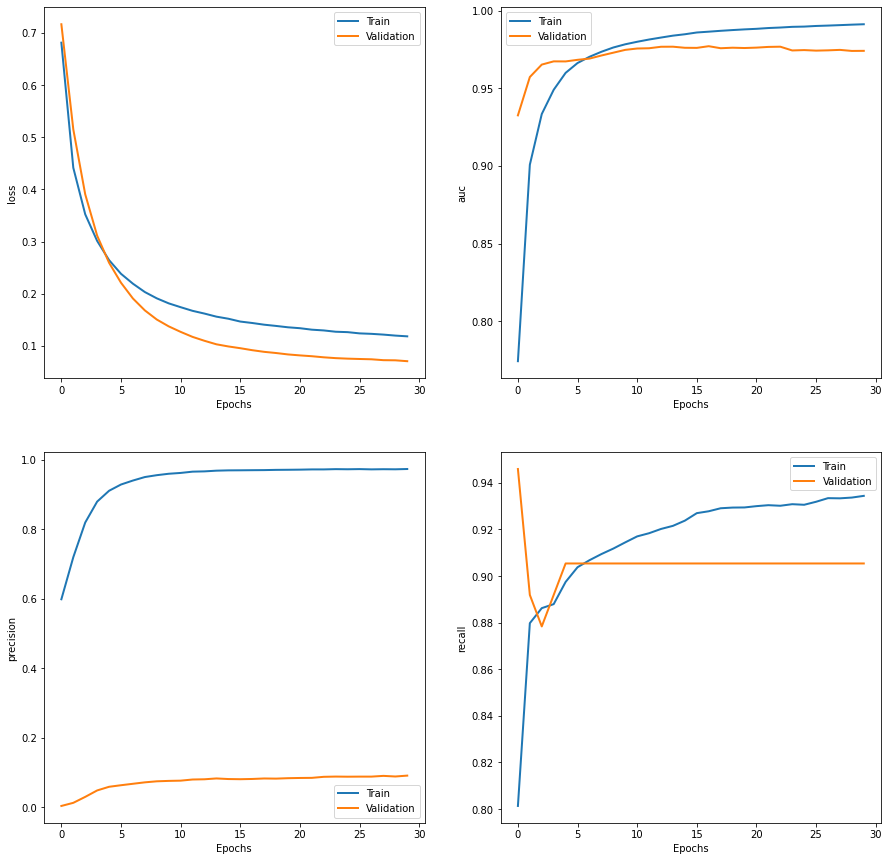

Correct predictions for Train data: 96.370%
Train Precision: 98.340%
Train Recall: 94.333%
Correct predictions for Validation data: 98.420%
Validation Precision: 9.116%
Validation Recall: 90.541%
Correct predictions for Test data: 98.448%
Test Precision: 9.040%
Test Recall: 87.838%


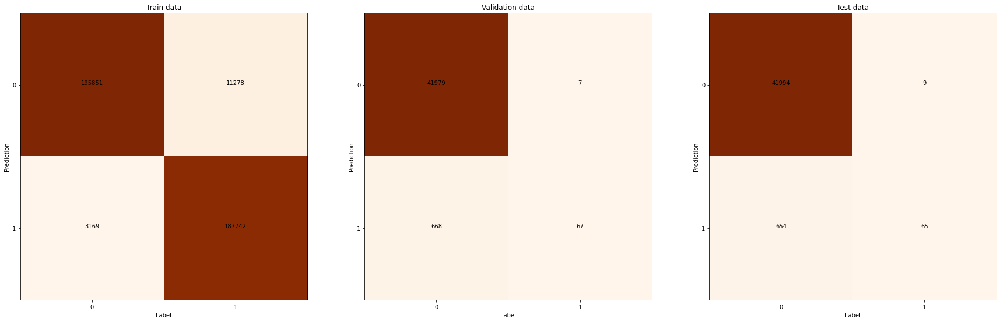

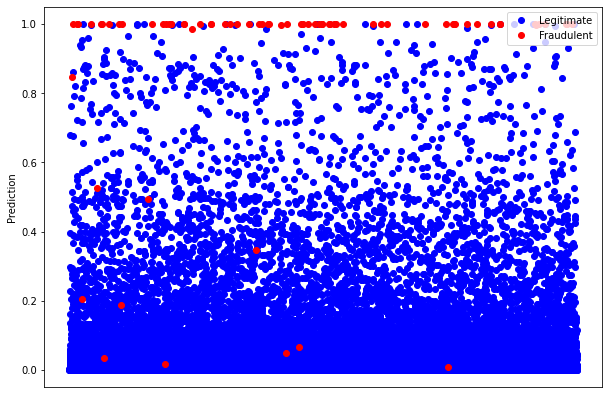

In [35]:
# Oversampling

train, val, test, cw = train_val_test_sets(data, "oversampling") 

# Separate features and labels
train_data = train[:,:-1]
train_label = train[:,-1]
val_data = val[:,:-1]
val_label = val[:,-1]
test_data = test[:,:-1]
test_label = test[:,-1]

model = make_model()
history = model_fit(model, train_data, train_label, val_data, val_label, 0, None, 30)
plot_metrics(history.history)
data_label = [[train_data, train_label, "Train"], [val_data, val_label, "Validation"], [test_data, test_label, "Test"]]
confusion_matrix_show(model, data_label)
plot_separation(test_label, model.predict(test_data))

Model: "sequential_20"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_48 (Dense)             (None, 16)                496       
_________________________________________________________________
dropout_28 (Dropout)         (None, 16)                0         
_________________________________________________________________
dense_49 (Dense)             (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Final Train auc: 98.567%
Final Validation auc: 93.468%
Final Train precision: 4.838%
Final Validation precision: 6.484%
Final Train recall: 91.570%
Final Validation recall: 79.730%


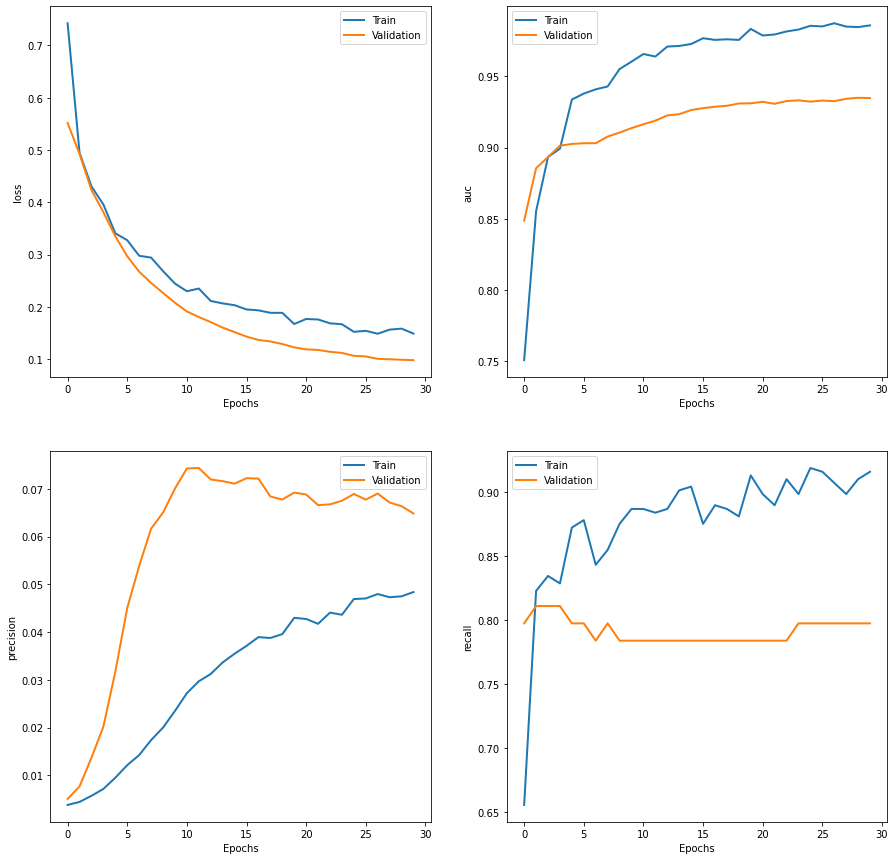

Correct predictions for Train data: 98.063%
Train Precision: 7.635%
Train Recall: 92.151%
Correct predictions for Validation data: 97.973%
Validation Precision: 6.484%
Validation Recall: 79.730%
Correct predictions for Test data: 97.903%
Test Precision: 7.365%
Test Recall: 95.946%


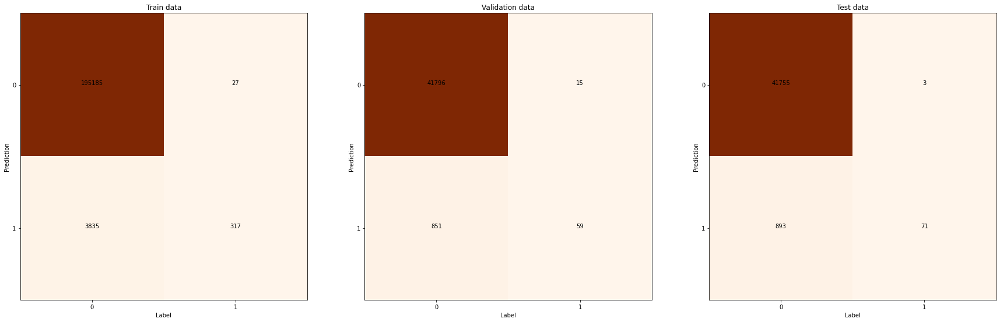

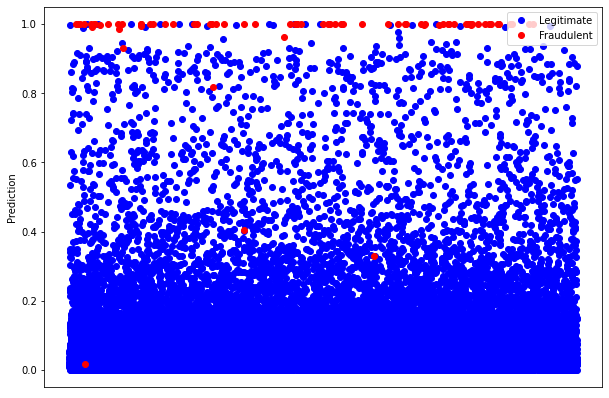

In [36]:
# Standard sampling with class weights

train, val, test, cw = train_val_test_sets(data, "standard")

# Separate features and labels
train_data = train[:,:-1]
train_label = train[:,-1]
val_data = val[:,:-1]
val_label = val[:,-1]
test_data = test[:,:-1]
test_label = test[:,-1]

model = make_model()
history = model_fit(model, train_data, train_label, val_data, val_label, 0, cw, 30)
plot_metrics(history.history)
data_label = [[train_data, train_label, "Train"], [val_data, val_label, "Validation"], [test_data, test_label, "Test"]]
confusion_matrix_show(model, data_label)
plot_separation(test_label, model.predict(test_data))

Model: "sequential_21"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_50 (Dense)             (None, 16)                496       
_________________________________________________________________
dropout_29 (Dropout)         (None, 16)                0         
_________________________________________________________________
dense_51 (Dense)             (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Final Train auc: 99.217%
Final Validation auc: 97.017%
Final Train precision: 96.718%
Final Validation precision: 8.397%
Final Train recall: 93.232%
Final Validation recall: 89.189%


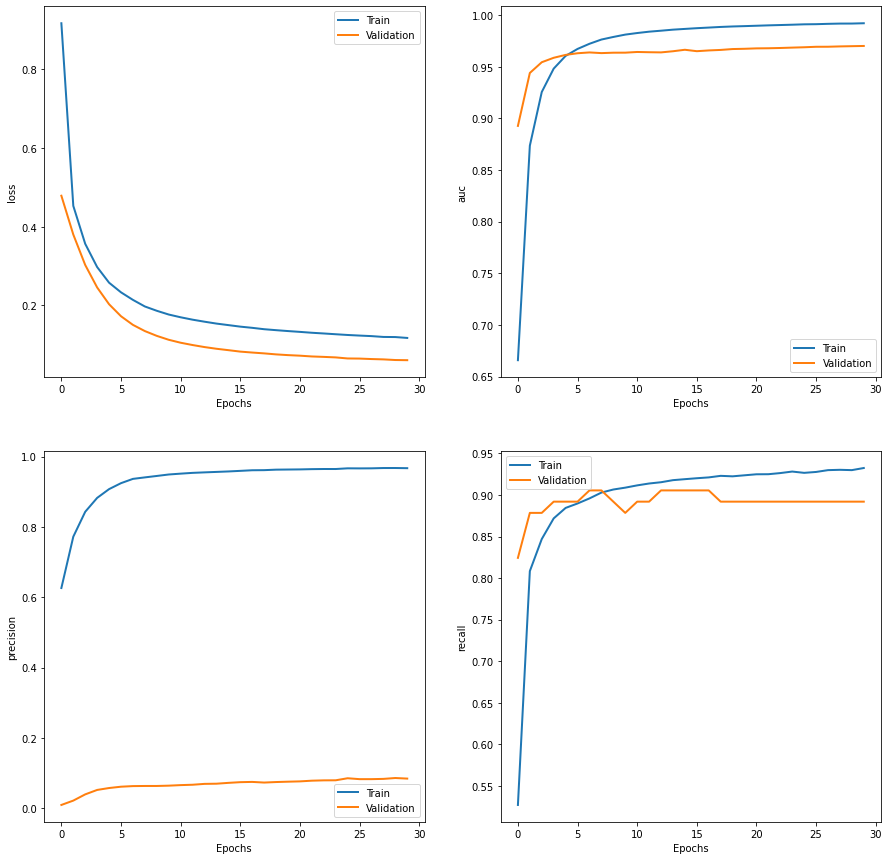

Correct predictions for Train data: 96.664%
Train Precision: 98.301%
Train Recall: 94.969%
Correct predictions for Validation data: 98.296%
Validation Precision: 8.397%
Validation Recall: 89.189%
Correct predictions for Test data: 98.287%
Test Precision: 8.668%
Test Recall: 93.243%


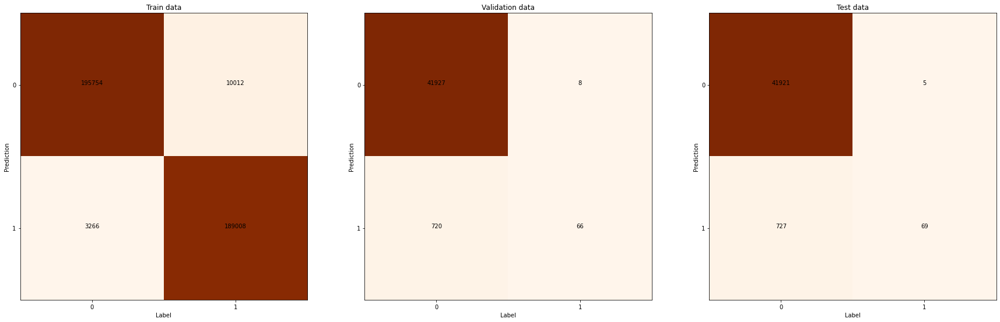

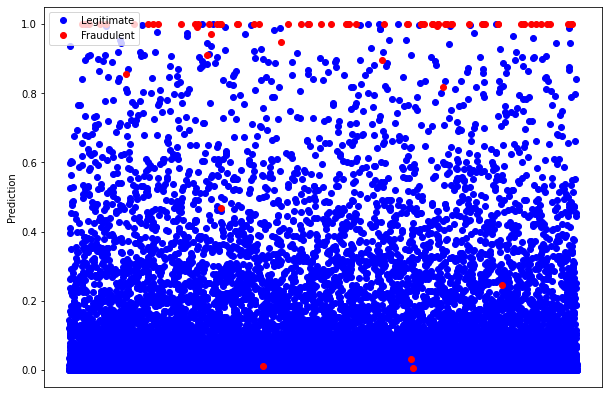

In [37]:
# SMOTE sampling

train, val, test, cw = train_val_test_sets(data, "SMOTE")

# Separate features and labels
train_data = train[:,:-1]
train_label = train[:,-1]
val_data = val[:,:-1]
val_label = val[:,-1]
test_data = test[:,:-1]
test_label = test[:,-1]

model = make_model()
history = model_fit(model, train_data, train_label, val_data, val_label, 0, None, 30)
plot_metrics(history.history)
data_label = [[train_data, train_label, "Train"], [val_data, val_label, "Validation"], [test_data, test_label, "Test"]]
confusion_matrix_show(model, data_label)
plot_separation(test_label, model.predict(test_data))

##K-fold Cross-Validation

###Functions for the realizations of all folds and statistics generation at the end

---------------------------------------------------------------
Model: "sequential_22"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_52 (Dense)             (None, 16)                496       
_________________________________________________________________
dropout_30 (Dropout)         (None, 16)                0         
_________________________________________________________________
dense_53 (Dense)             (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Correct predictions for Train data: 99.939%
Train Precision: 90.159%
Train Recall: 72.265%
Correct predictions for Test data: 99.930%
Test Precision: 90.411%
Test Recall: 66.667%
Final Train auc: 94.552%
Final Train precision: 87.109%
Final Train recall: 56.743%


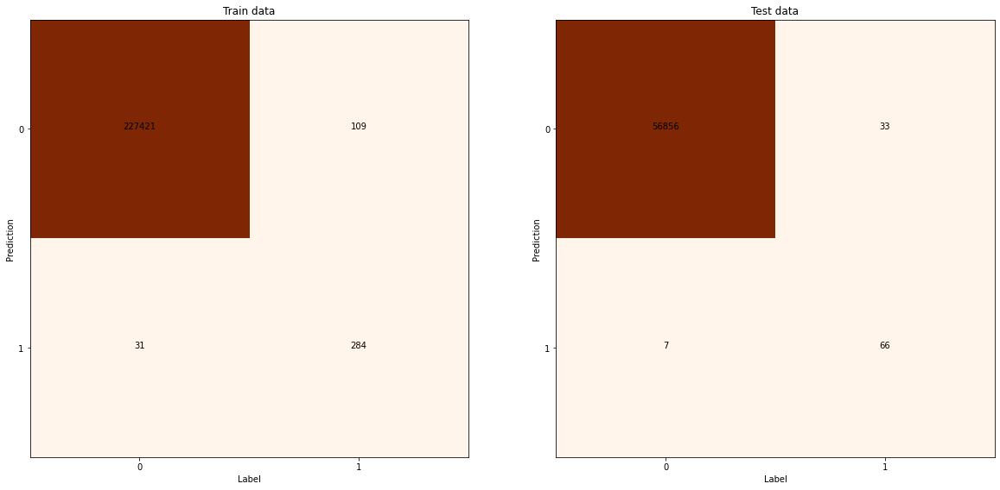

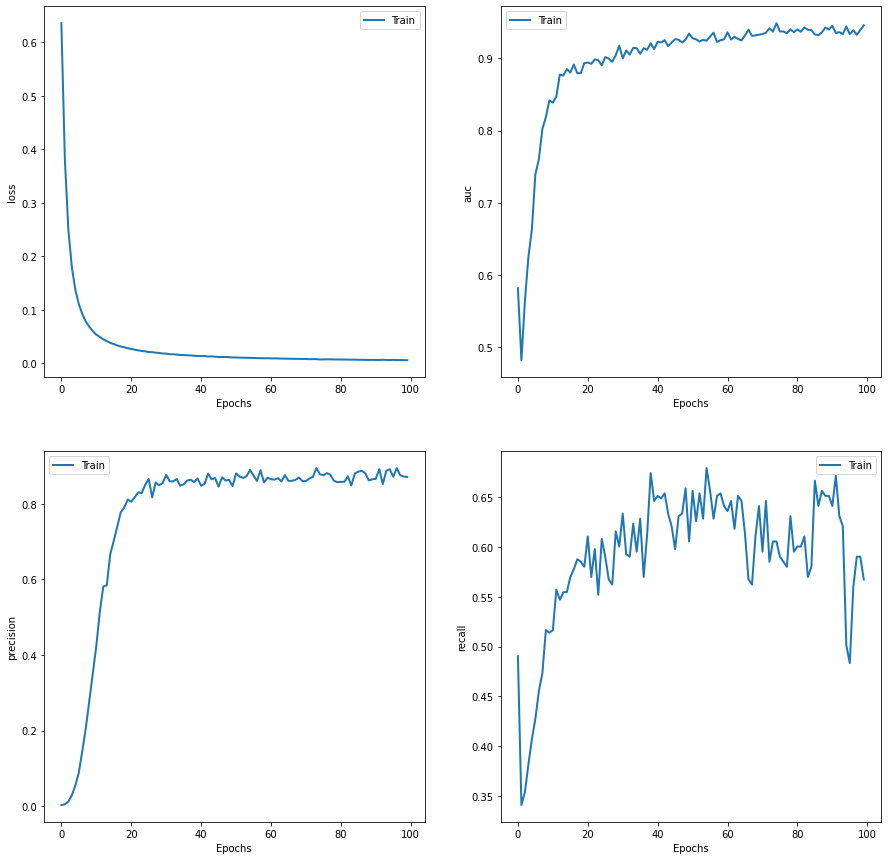

Area under ROC curve: 0.974
Area under Precision-Recall curve: 0.813
F1 Score: 0.767


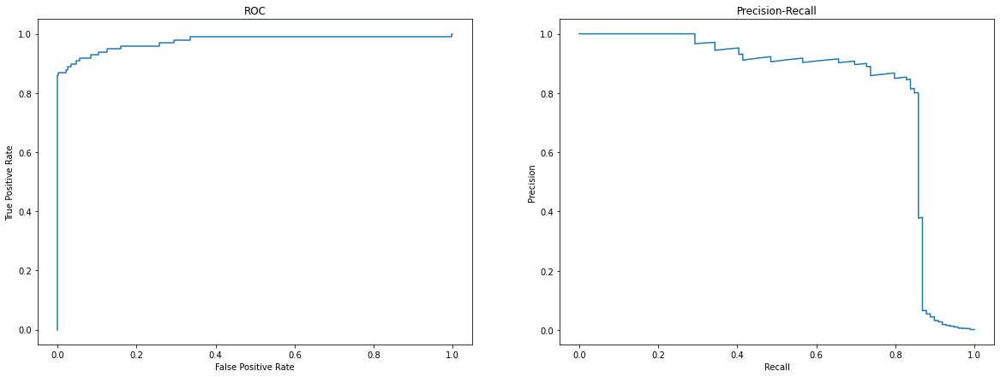

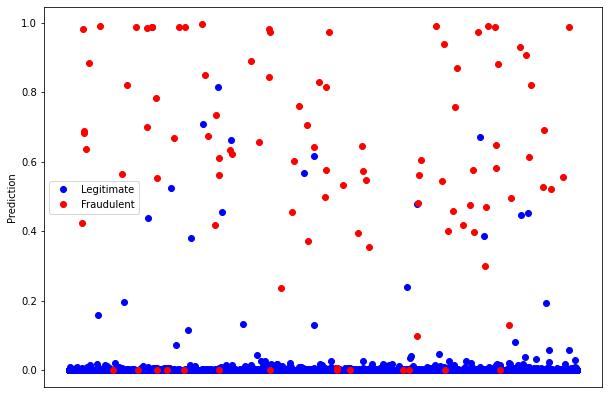

---------------------------------------------------------------
Model: "sequential_23"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_54 (Dense)             (None, 16)                496       
_________________________________________________________________
dropout_31 (Dropout)         (None, 16)                0         
_________________________________________________________________
dense_55 (Dense)             (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Correct predictions for Train data: 99.940%
Train Precision: 90.031%
Train Recall: 73.537%
Correct predictions for Test data: 99.949%
Test Precision: 89.773%
Test Recall: 79.798%
Final Train auc: 93.771%
Final Train precision: 85.666%
Final Train recall: 63.868%


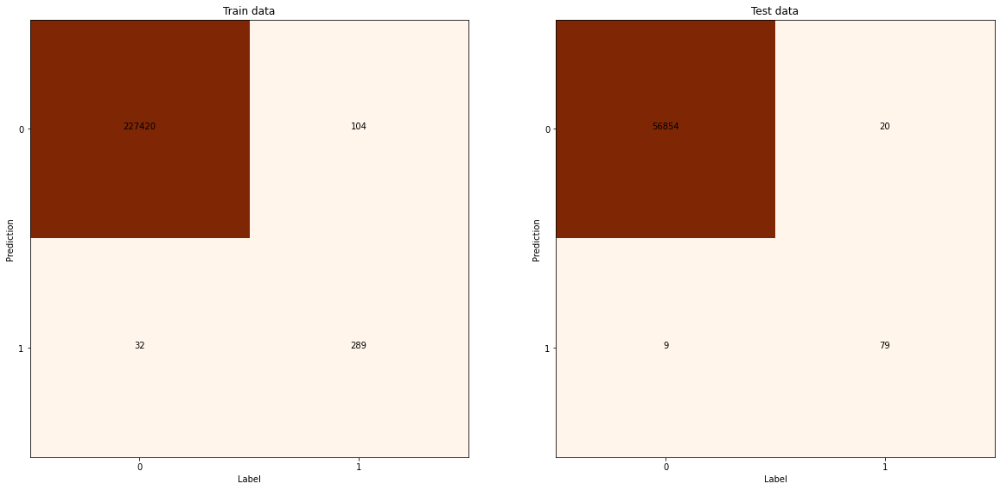

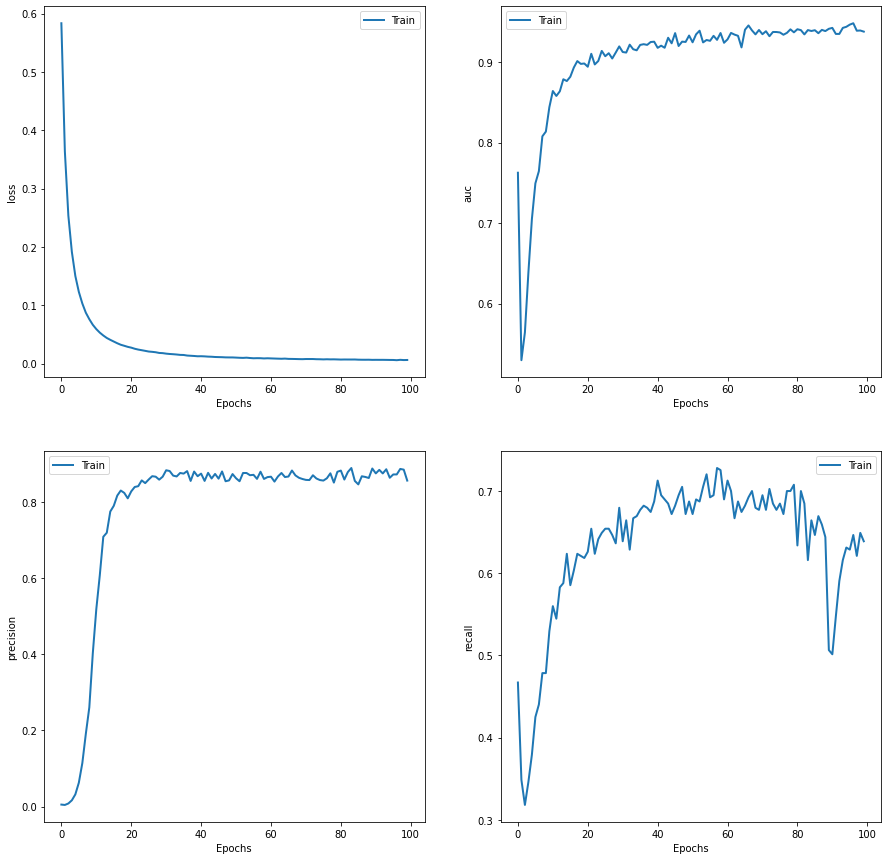

Area under ROC curve: 0.968
Area under Precision-Recall curve: 0.788
F1 Score: 0.845


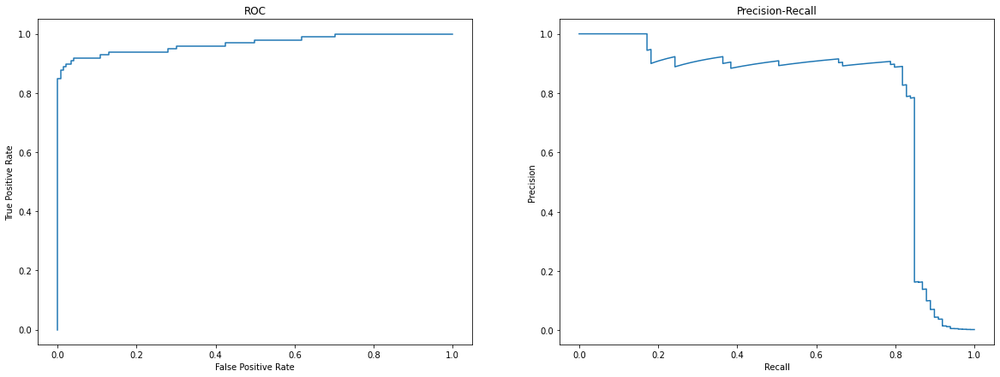

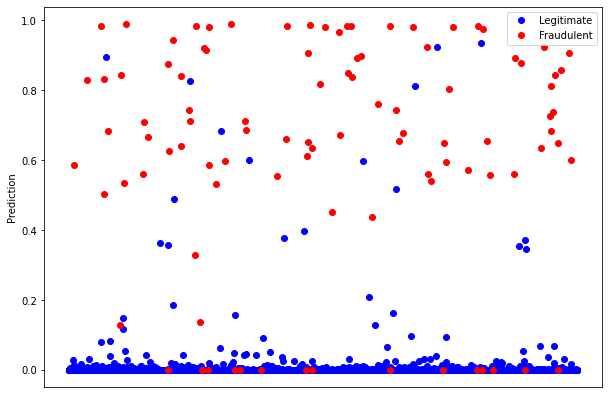

---------------------------------------------------------------
Model: "sequential_24"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_56 (Dense)             (None, 16)                496       
_________________________________________________________________
dropout_32 (Dropout)         (None, 16)                0         
_________________________________________________________________
dense_57 (Dense)             (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Correct predictions for Train data: 99.942%
Train Precision: 89.458%
Train Recall: 75.381%
Correct predictions for Test data: 99.932%
Test Precision: 85.542%
Test Recall: 72.449%
Final Train auc: 93.875%
Final Train precision: 88.800%
Final Train recall: 56.345%


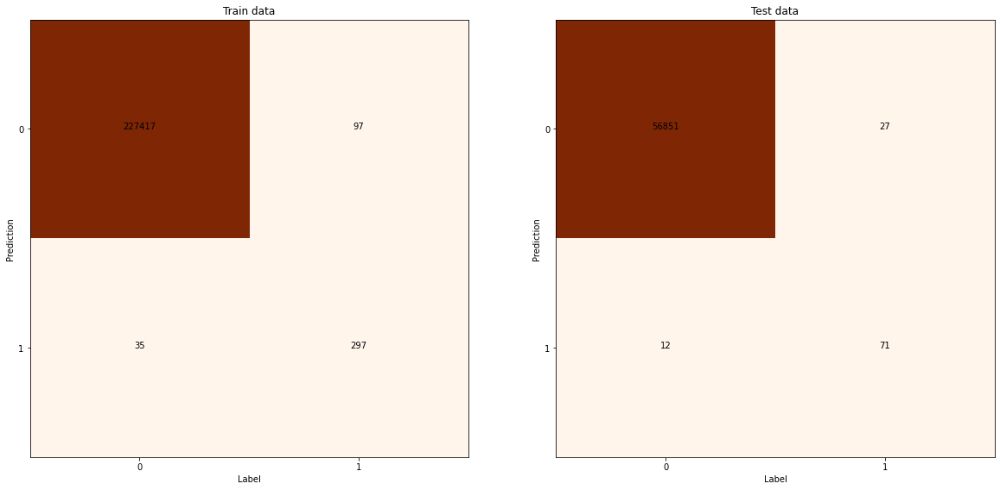

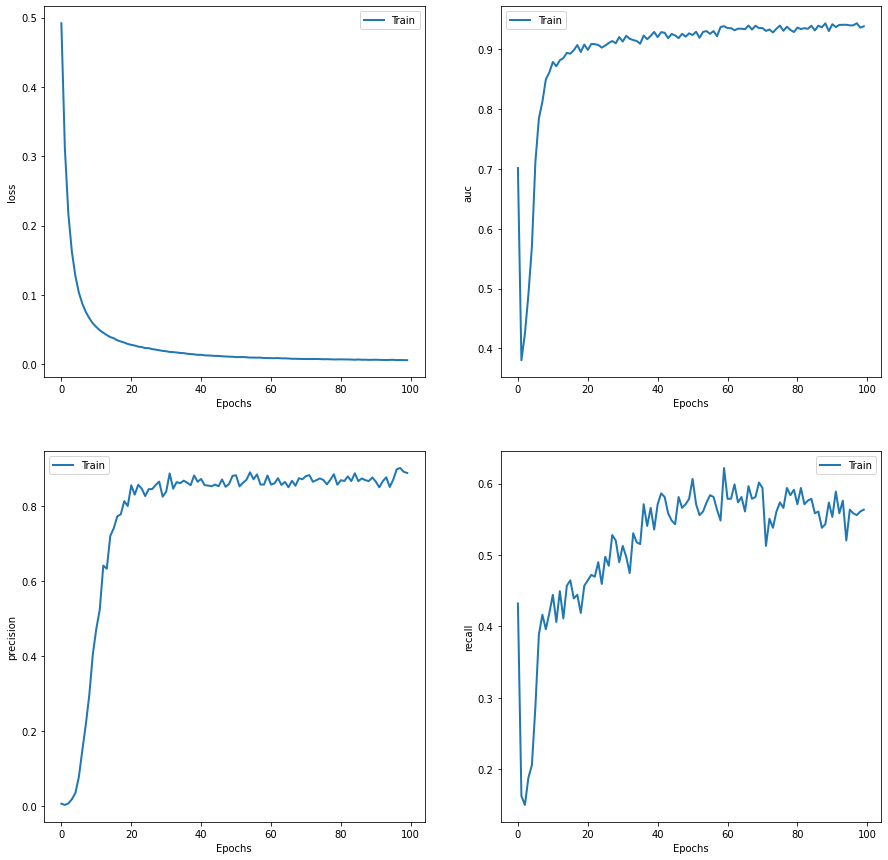

Area under ROC curve: 0.984
Area under Precision-Recall curve: 0.747
F1 Score: 0.785


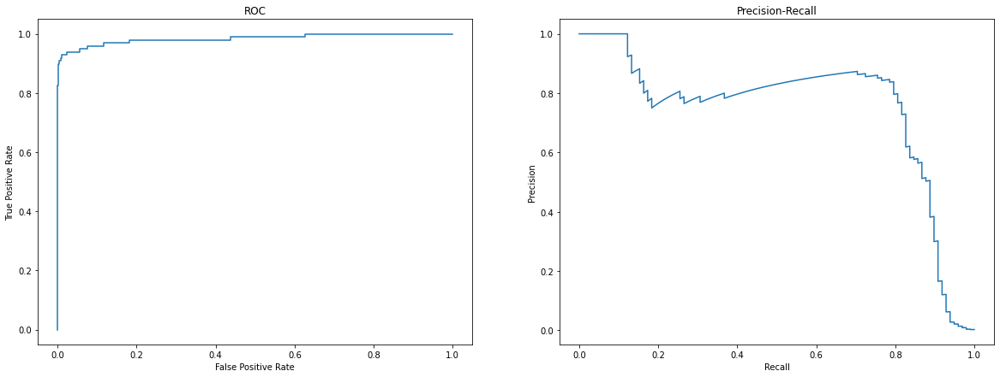

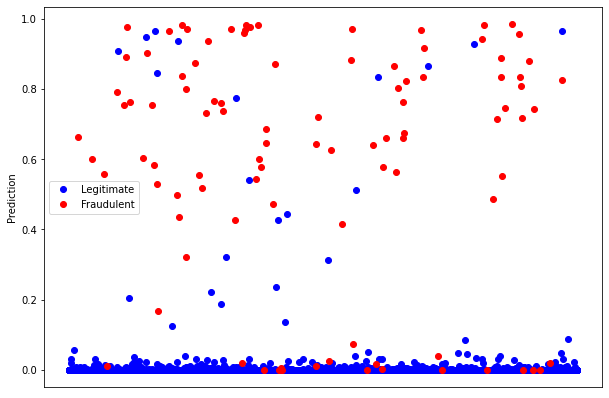

---------------------------------------------------------------
Model: "sequential_25"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_58 (Dense)             (None, 16)                496       
_________________________________________________________________
dropout_33 (Dropout)         (None, 16)                0         
_________________________________________________________________
dense_59 (Dense)             (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Correct predictions for Train data: 99.906%
Train Precision: 87.815%
Train Recall: 53.046%
Correct predictions for Test data: 99.898%
Test Precision: 85.714%
Test Recall: 48.980%
Final Train auc: 93.999%
Final Train precision: 86.957%
Final Train recall: 40.609%


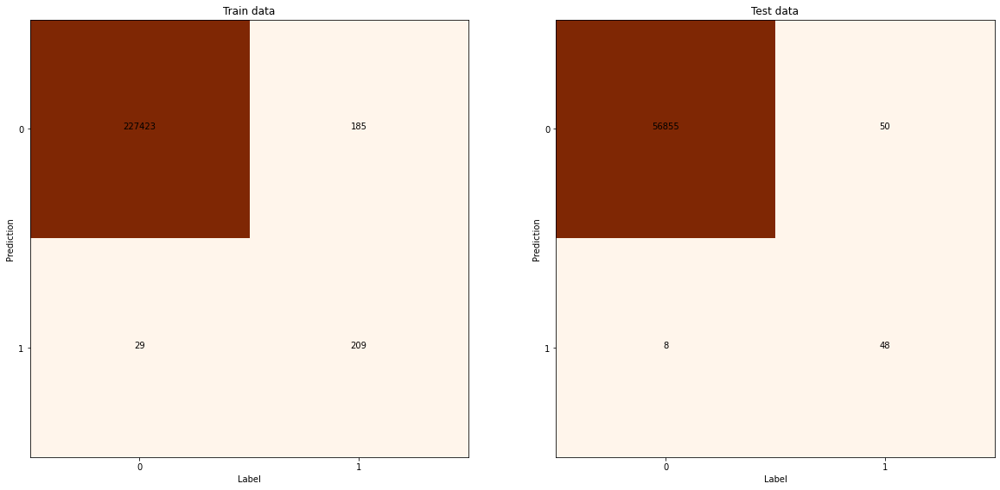

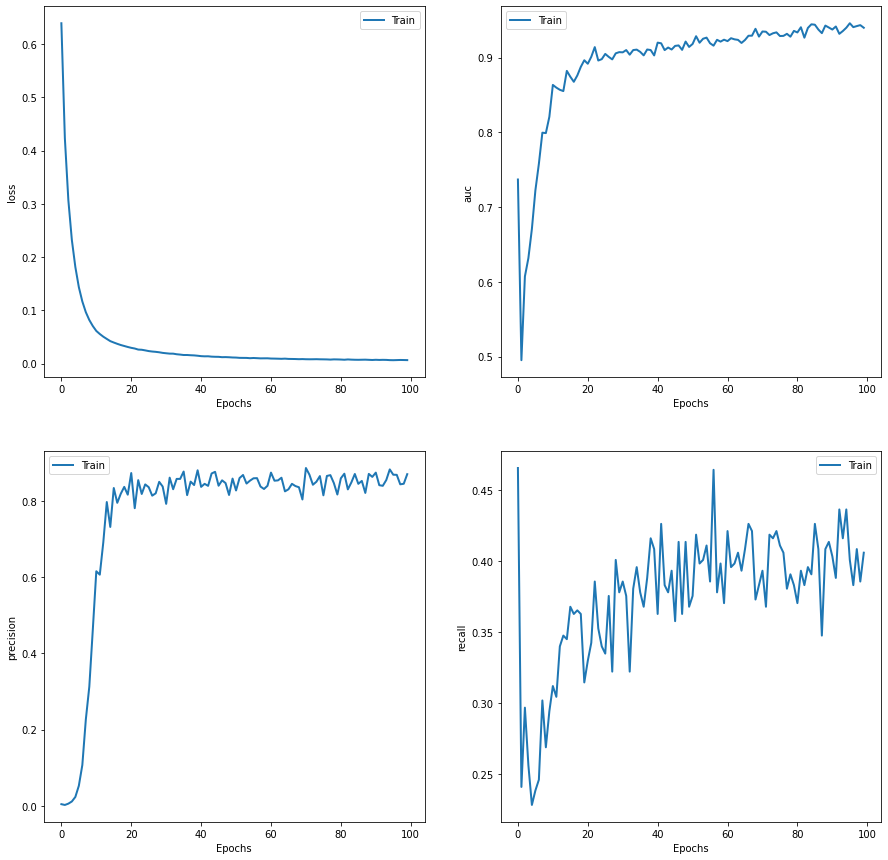

Area under ROC curve: 0.987
Area under Precision-Recall curve: 0.768
F1 Score: 0.623


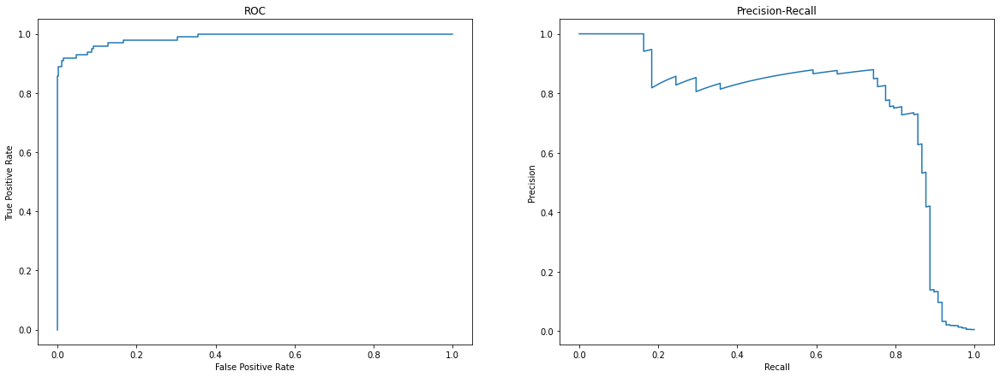

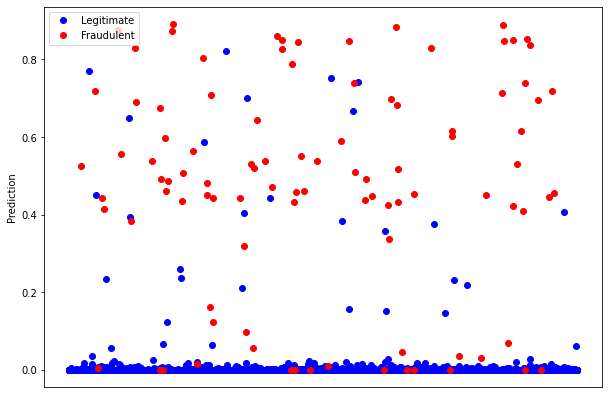

---------------------------------------------------------------
Model: "sequential_26"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_60 (Dense)             (None, 16)                496       
_________________________________________________________________
dropout_34 (Dropout)         (None, 16)                0         
_________________________________________________________________
dense_61 (Dense)             (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Correct predictions for Train data: 99.941%
Train Precision: 88.235%
Train Recall: 76.142%
Correct predictions for Test data: 99.937%
Test Precision: 89.744%
Test Recall: 71.429%
Final Train auc: 93.590%
Final Train precision: 86.833%
Final Train recall: 61.929%


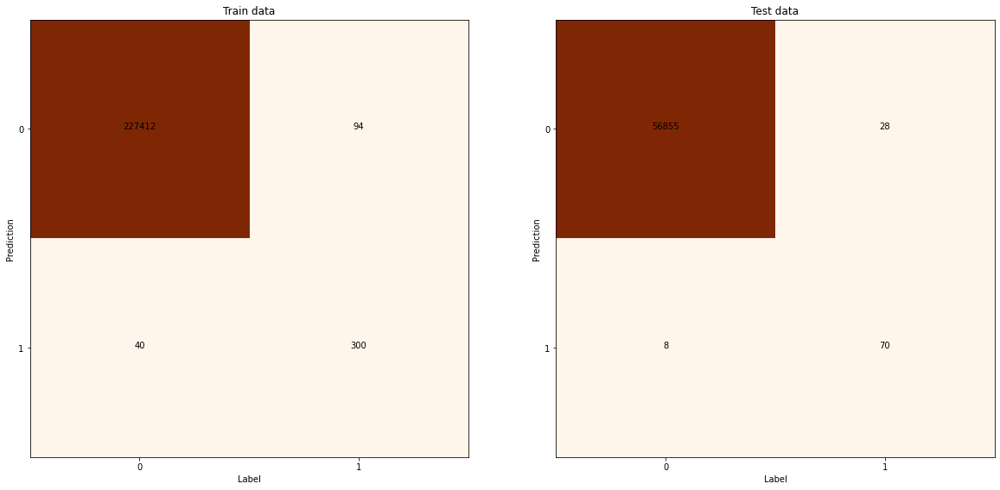

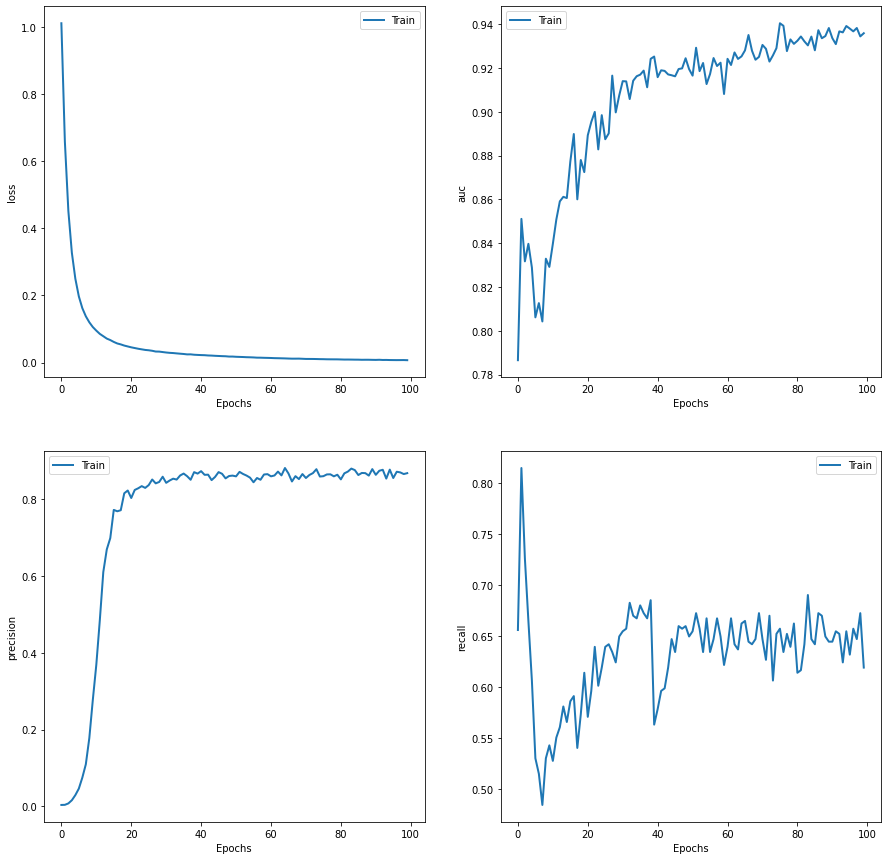

Area under ROC curve: 0.968
Area under Precision-Recall curve: 0.787
F1 Score: 0.795


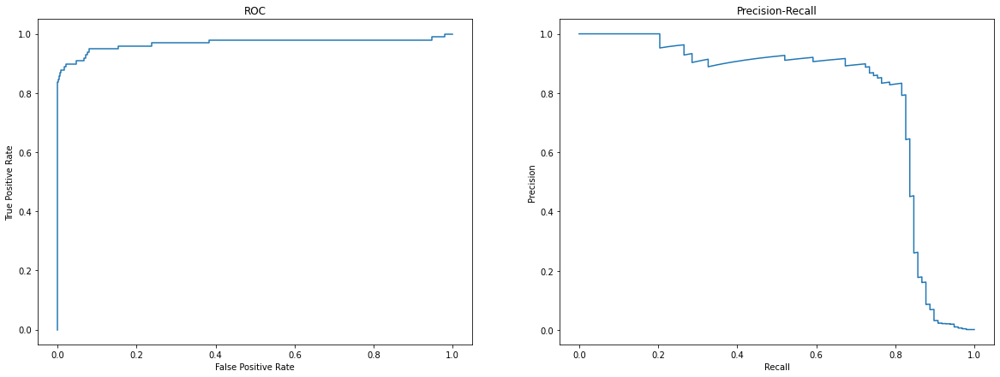

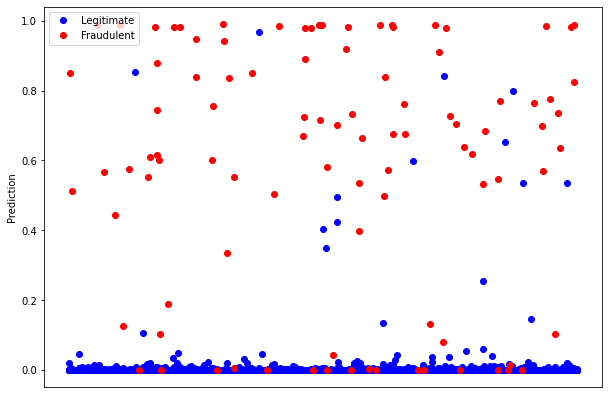

In [38]:
# Let's do cross-validation
from sklearn.model_selection import StratifiedKFold

def kfold(k, data, sampling="standard", mid_activation="relu", class_weight=None, input_shape=(30,), smote_n=5):

    # Save lists of metrics for all folds
    h = [] # history: metrics throuhg epochs
    cm = [] # confusion matrices
    roc = [] # roc curves
    pr = [] # precision-recall curves
    f1 = [] # F1 scores

    # Lists to save train and test sets for each fold
    train = []
    test = []

    # List to save original training sets for scaling independent of sampling method
    orig_train = []

    # Separate k lists of train and test sets, both with the same proportions of each class existent in the dataset
    # This function returns k pair of lists of indexes of the data array, each pair with a list for train and the other for test
    skf = StratifiedKFold(k, shuffle=True)
    
    # Standard sampling
    if (sampling == "standard"):
        
        # Passing by all the pair of lists, we add the sets for each fold to the train and test lists
        for train_index, test_index in skf.split(data[:,:-1], data[:,-1]):

            train.append(data[train_index])
            orig_train.append(data[train_index])
            test.append(data[test_index])

    # Undersampling
    if (sampling == "undersampling"):
        
        for train_index, test_index in skf.split(data[:,:-1], data[:,-1]):

            train_ = data[train_index]
            orig_train.append(data[train_index])
            test.append(data[test_index])
            
            train_fraud = train_[np.where(train_[:,-1]==1)[0]]

            # Get the indexes of the majority class in the training set, and sort just a few of them to have the same amount of samples as in the minority class
            train_legit_id = np.where(train_[:,-1]==0)[0]
            train_ = np.concatenate((train_fraud, train_[np.random.choice(train_legit_id, len(train_fraud))]), axis=0)
            
            np.random.shuffle(train_)
            train.append(train_)

    # Oversampling
    if (sampling == "oversampling"):
        
        for train_index, test_index in skf.split(data[:,:-1], data[:,-1]):

            train_ = data[train_index]
            orig_train.append(data[train_index])
            test.append(data[test_index])

            train_legit = train_[np.where(train_[:,-1]==0)[0]]

            # Get the indexes of the minorty class in the training set, and sort many of them to have the same amount of samples as in the majority class
            train_fraud_id = np.where(train_[:,-1]==1)[0]
            train_ = np.concatenate((train_legit, train_[np.random.choice(train_fraud_id, len(train_legit))]), axis=0)
            
            np.random.shuffle(train_)
            train.append(train_)

    # SMOTE
    if (sampling == "SMOTE"):

        for train_index, test_index in skf.split(data[:,:-1], data[:,-1]):

            train.append(data[train_index])
            orig_train.append(data[train_index])
            test.append(data[test_index])

            # Make SMOTE oversampling and add the new data to the original
            x, y = SMOTE(k_neighbors=smote_n).fit_resample(train[-1][:,:-1], train[-1][:,-1])
            train_ = np.concatenate((x, y.reshape(-1,1)), axis=1)
            
            np.random.shuffle(train_)
            train[-1] = train_

    # Fitting the model and generating metrics for each fold
    for i in range(k):
        
        print("---------------------------------------------------------------")

        # Scale data
        train_scaler = StandardScaler()
        # train_scaler = MinMaxScaler((-1, 1))
        # train_scaler = MaxAbsScaler()
        # train_scaler = RobustScaler()
        train_scaler.fit(orig_train[i][:,:-1])
        train[i][:,:-1] = train_scaler.transform(train[i][:,:-1])
        test[i][:,:-1] = train_scaler.transform(test[i][:,:-1])

        train_data = train[i][:,:-1]
        train_label = train[i][:,-1]
        test_data = test[i][:,:-1]
        test_label = test[i][:,-1]

        # Build model
        model = make_model()

        # Fit and save metrics' evolution through epochs
        history = model_fit(model, train_data, train_label, None, None, 0, class_weight, 100, False)

        # Calculate confusion matrices
        data_label = [[train_data, train_label, "Train"], [test_data, test_label, "Test"]]
        cm.append(confusion_matrix_show(model, data_label))

        # Plot metrics
        plot_metrics(history.history)
        h.append(history.history)

        # Calculate ROC and Precision-Recall curves, and F1 Score
        roc_, pr_, f1_ = roc_pr_f1_scores(test_label, model.predict(test_data))

        # Plot the separation between the predictions of the diffrent classes
        plot_separation(test_label, model.predict(test_data))

        roc.append(roc_)
        pr.append(pr_)
        f1.append(f1_)

    return h, cm, roc, pr, f1

h, cm, roc, pr, f1 = kfold(5, data, "standard");

Final Train loss: 0.006316 (0.005941 - 0.006691)
Final Train auc: 0.939574 (0.936311 - 0.942837)
Final Train precision: 0.870728 (0.860692 - 0.880764)
Final Train recall: 0.558988 (0.477189 - 0.640787)


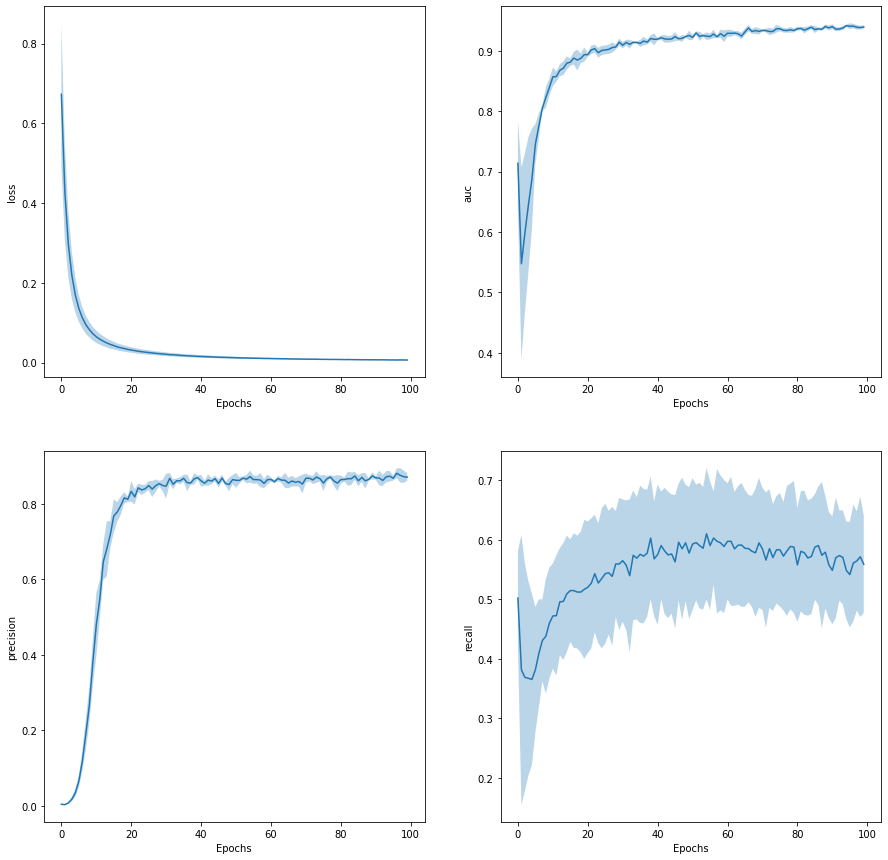

Test Precision: 0.883598 +/- 0.035973
Test Recall: 0.678862 +/- 0.104709


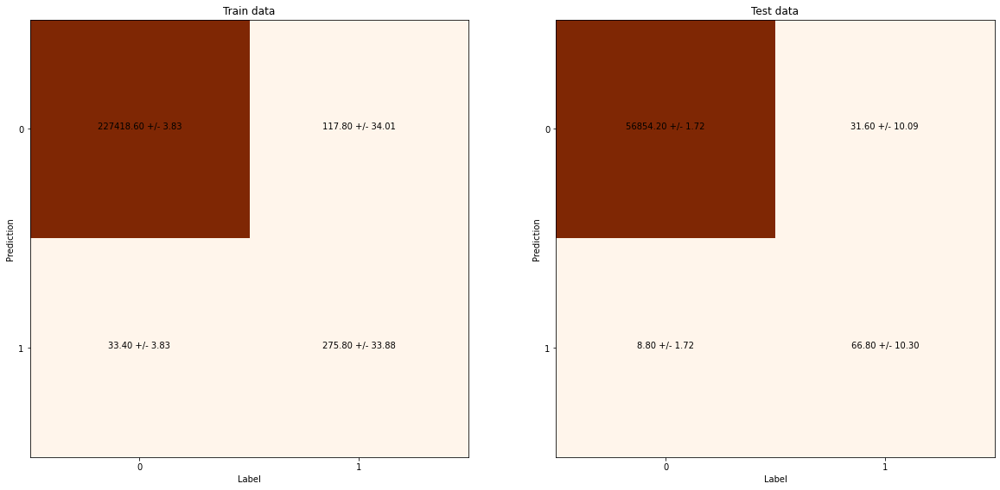

F1 Score: 0.763 +/- 0.074
Area under ROC curve: 0.971317 (0.952039 - 0.990596)
Area under Precision-Recall curve: 0.788530 (0.755449 - 0.821611)


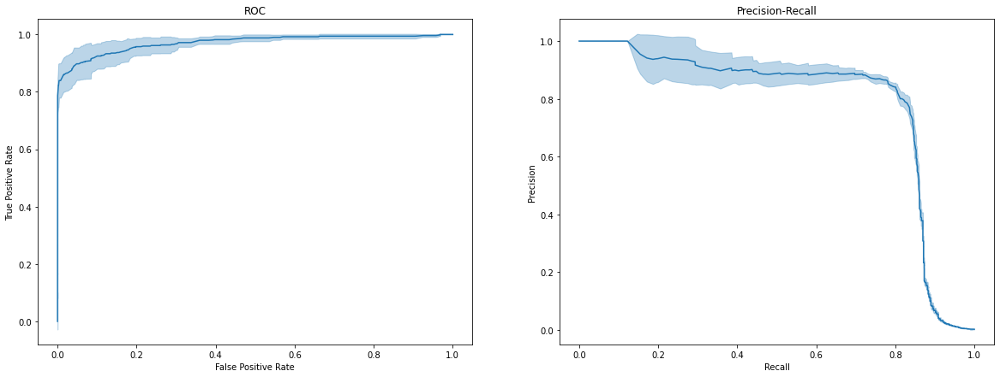

In [39]:
# Generate k-fold statistics
def kfold_stats(h, cm, roc, pr, f1):

    # Metrics' plots
    plt.figure(figsize=(15,15))

    # Loop over each metric considered, calculating average and standard deviation
    for i in range(len(metrics_)):
        
        # Create array with the evolution of each metric through epochs
        m = []
        for j in range(len(h)):

            m.append(h[j][metrics_[i]])
        m = np.array(m).reshape((len(h), len(h[j][metrics_[i]])))

        # Calculate average and standard deviation for each metric
        m_avg = np.mean(m, axis=0)
        m_std = np.std(m, axis=0)

        # Plot final metrics obtained for training set
        print("Final Train %s: %f (%f - %f)" % (metrics_[i], m_avg[-1], m_avg[-1]-m_std[-1], m_avg[-1]+m_std[-1]))

        # Plot metrics' averages with uncertainties
        plt.subplot(2,2,i+1)
        plt.plot(m_avg, label="Train Average")
        plt.fill_between(range(len(m_avg)), m_avg-m_std, m_avg+m_std, alpha=0.3)
        plt.xlabel("Epochs")
        plt.ylabel(metrics_[i])
    plt.show()

    ############################################################################

    # Confusion matrix

    # List to save confusion matrices for train and test sets
    cms = [[],[]]

    # Save the respective matrices on the lists
    for i in range(len(cm)):

        cms[0].append(cm[i][0])
        cms[1].append(cm[i][1])

    # Convert to array
    cms[0] = np.array(cms[0])
    cms[1] = np.array(cms[1])

    # Lists to save average and standard deviation of each cell of the confusion matrices
    cms_avg = []
    cms_std = []

    data_label = [[train_data, train_label, "Train"], [test_data, test_label, "Test"]]

    plt.figure(figsize=(20,10))
    for k in range(2):
        
        # Calculate averages and standard deviation of confusion matrices cells over the folds
        cms_avg.append(np.mean(cms[k], axis=0))
        cms_std.append(np.std(cms[k], axis=0))

        # Print results for the test set
        if (k == 1):
            
            # Calculate precision, recall, and the respective standard deviations over folds
            precision = cms_avg[k][1,1]/(cms_avg[k][1,1]+cms_avg[k][0,1])
            precision_std = (cms_std[k][1,1]*cms_avg[k][0,1] + cms_std[k][0,1]*cms_avg[k][1,1])/(cms_avg[k][1,1]+cms_avg[k][0,1])**2
            recall = cms_avg[k][1,1]/(cms_avg[k][1,1]+cms_avg[k][1,0])
            recall_std = cms_std[k][1,1]/(cms_avg[k][1,1]+cms_avg[k][1,0])

            print("Test Precision: %f +/- %f" % (precision, precision_std))
            print("Test Recall: %f +/- %f" % (recall, recall_std))

        # Plot confusion matrices
        plt.subplot(1,2,k+1)        
        plt.imshow(cms_avg[k].T, cmap="Oranges")
        for i in range(cms_avg[k].shape[0]):
            for j in range(cms_avg[k].shape[1]):
                plt.text(i, j, "%.2f +/- %.2f" % (cms_avg[k][i,j], cms_std[k][i,j]), ha="center")
        plt.xticks([0,1])
        plt.yticks([0,1])
        plt.xlabel("Label")
        plt.ylabel("Prediction")
        plt.gca().set_title("%s data" % (data_label[k][2]))
    plt.show()

    ############################################################################

    # F1 Score
    
    f1_avg = np.mean(f1)
    f1_std = np.std(f1)
    print("F1 Score: %.3f +/- %.3f" % (f1_avg, f1_std))

    ############################################################################

    # ROC + Precision-Recall

    # Lists to save FPR and TPR of each fold
    fpr = [roc[0][0]]
    tpr = [roc[0][1]]

    # Save all of them, interpolating to a same set o thresholds
    for i in range(1, len(roc)):
        
        # The .flip is needed as the threshold array generated by sklearn.metrics.roc_curve is decrescent
        fpr.append(np.interp(np.flip(roc[0][2]), np.flip(roc[i][2]), roc[i][0]))
        tpr.append(np.interp(np.flip(roc[0][2]), np.flip(roc[i][2]), roc[i][1]))

    # Convert to array
    tpr = np.array(tpr)
    fpr = np.array(fpr)

    # Calculate mean and standard deviation
    tpr_avg = np.mean(tpr, axis=0)
    tpr_std = np.std(tpr, axis=0)
    fpr_avg = np.mean(fpr, axis=0)
    fpr_std = np.std(fpr, axis=0)

    # Lists so save precision and recall curves of each fold
    p = [pr[0][0]]
    r = [pr[0][1]]

    # Save all of them, interpolating to a same set o thresholds
    for i in range(len(pr)):

        p.append(np.interp([0]+list(pr[0][2]), [0]+list(pr[i][2]), pr[i][0]))
        r.append(np.interp([0]+list(pr[0][2]), [0]+list(pr[i][2]), pr[i][1]))

    # Convert to array
    p = np.array(p)
    r = np.array(r)
    
    # Calculate average and standard deviation
    p_avg = np.mean(p, axis=0)
    p_std = np.std(p, axis=0)
    r_avg = np.mean(r, axis=0)
    r_std = np.std(r, axis=0)

    # Print results of area under ROC and Precision-Recall curves
    print("Area under ROC curve: %f (%f - %f)" % (auc(fpr_avg, tpr_avg), auc(fpr_avg, tpr_avg-tpr_std), auc(fpr_avg, tpr_avg+tpr_std)))
    print("Area under Precision-Recall curve: %f (%f - %f)" % (auc(r_avg, p_avg), auc(r_avg, p_avg-p_std), auc(r_avg, p_avg+p_std)))

    # Plot averages and deviations for ROC and Precision-Recall curves, with deviations considered only for the y-axis,
    # so the plot don't get very poluted
    plt.figure(figsize=(20,7))

    plt.subplot(1,2,1)
    plt.plot(fpr_avg, tpr_avg)
    plt.fill_between(fpr_avg, tpr_avg-tpr_std, tpr_avg+tpr_std, color="C0", alpha=0.3)
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("ROC")

    plt.subplot(1,2,2)
    plt.plot(r_avg, p_avg)
    plt.fill_between(r_avg, p_avg-p_std, p_avg+p_std, color="C0", alpha=0.3)
    plt.xlabel("Recall")
    plt.ylabel("Precision")
    plt.title("Precision-Recall")
    plt.show()

    return cms_avg, cms_std, fpr_avg, fpr_std, tpr_avg, tpr_std, f1_avg, f1_std, p_avg, p_std, r_avg, r_std

kfold_stats(h, cm, roc, pr, f1);

###Doing Cross-Validation for the different sampling possibilities

####Standard Sampling

---------------------------------------------------------------
Model: "sequential_167"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_342 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_175 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_343 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Correct predictions for Train data: 99.912%
Train Precision: 88.889%
Train Recall: 55.982%
Correct predictions for Test data: 99.905%
Test Precision: 82.353%
Test Recall: 57.143%
Final Train auc: 93.870%
Final Train precision: 83.495%
Final Train recall: 38.826%


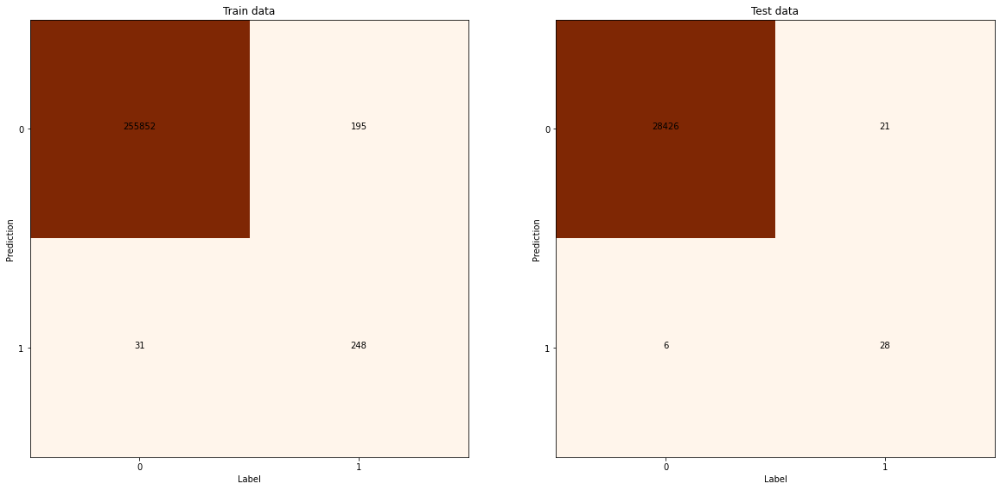

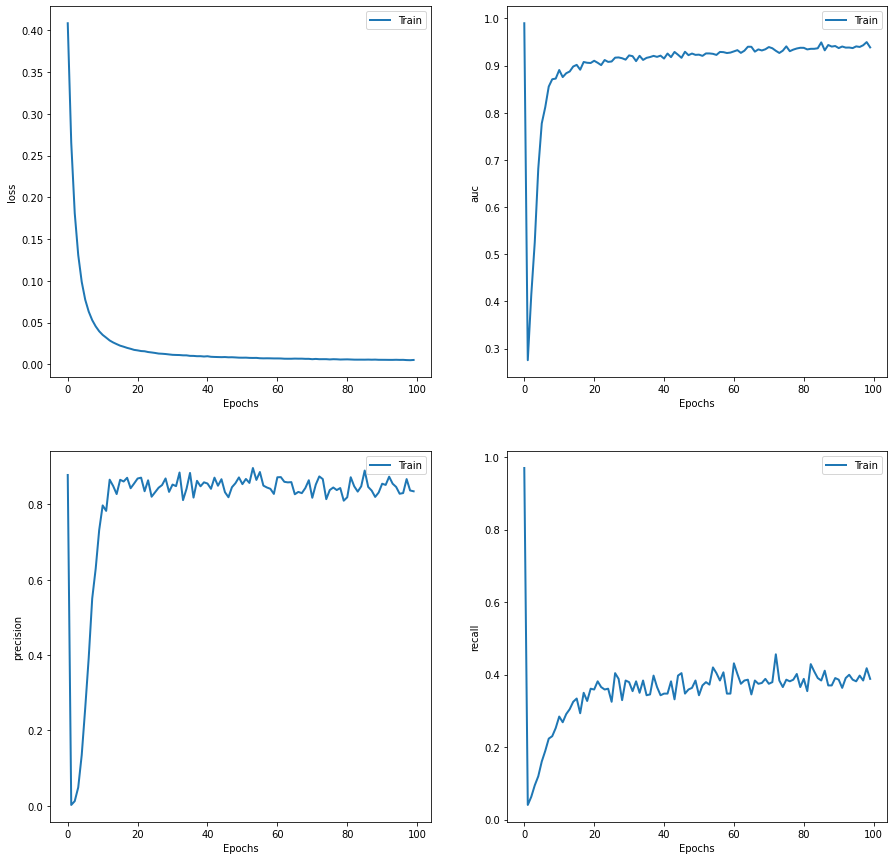

Area under ROC curve: 0.995
Area under Precision-Recall curve: 0.786
F1 Score: 0.675


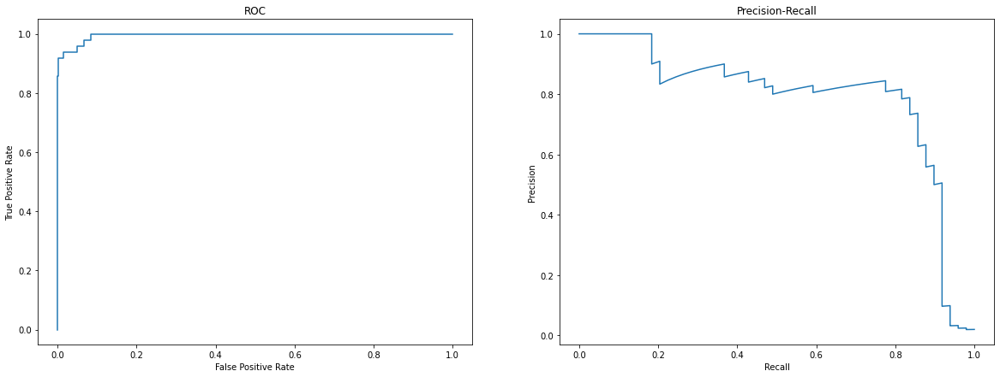

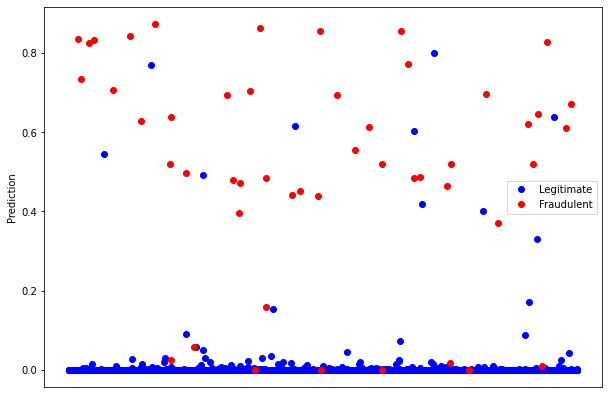

---------------------------------------------------------------
Model: "sequential_168"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_344 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_176 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_345 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Correct predictions for Train data: 99.946%
Train Precision: 88.579%
Train Recall: 78.781%
Correct predictions for Test data: 99.940%
Test Precision: 90.000%
Test Recall: 73.469%
Final Train auc: 94.045%
Final Train precision: 86.207%
Final Train recall: 67.720%


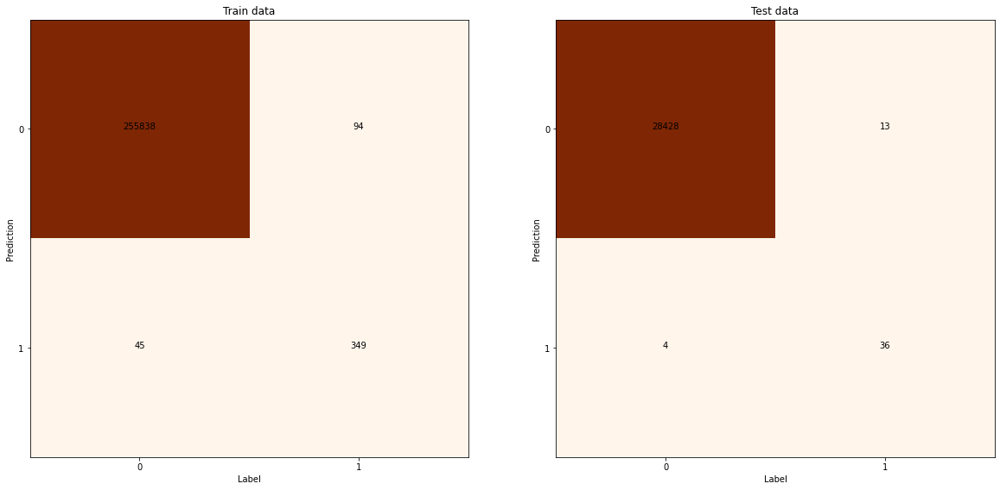

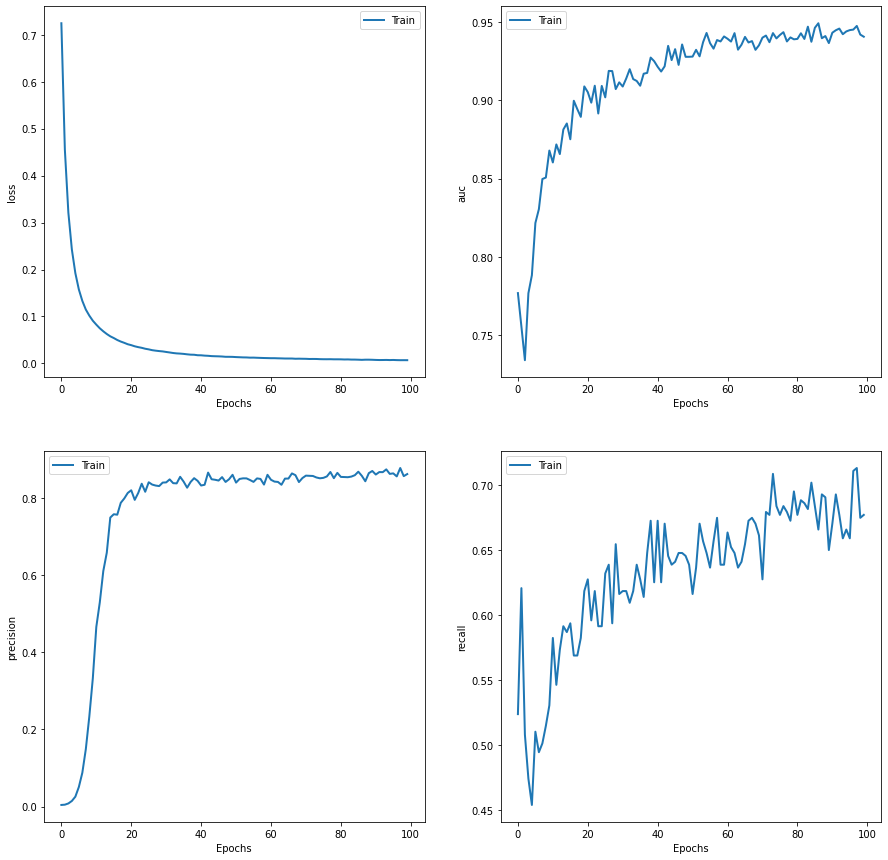

Area under ROC curve: 0.972
Area under Precision-Recall curve: 0.755
F1 Score: 0.809


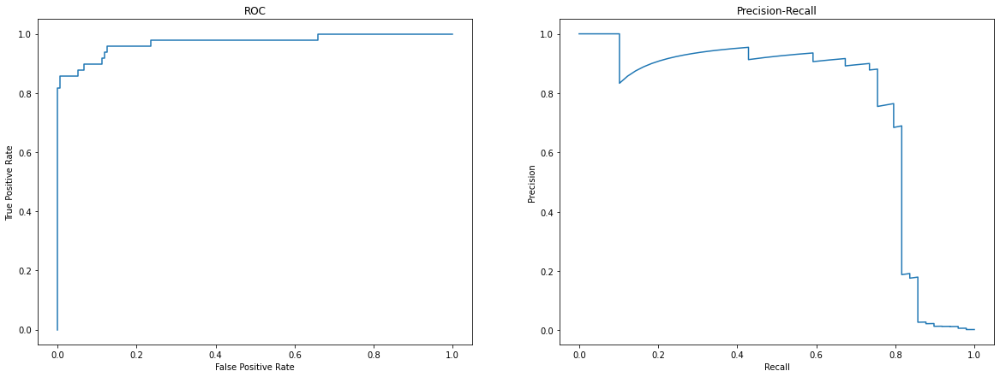

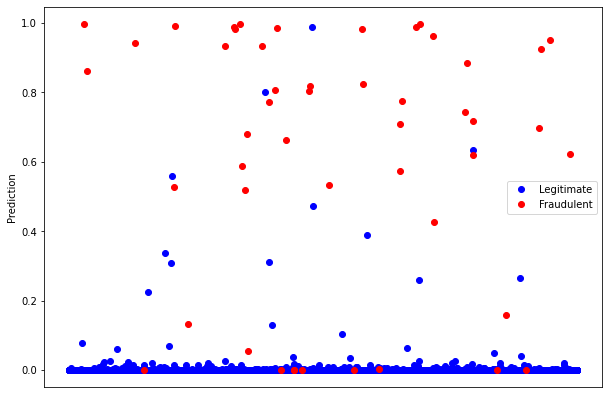

---------------------------------------------------------------
Model: "sequential_169"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_346 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_177 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_347 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Correct predictions for Train data: 99.941%
Train Precision: 89.488%
Train Recall: 74.944%
Correct predictions for Test data: 99.933%
Test Precision: 85.714%
Test Recall: 73.469%
Final Train auc: 93.822%
Final Train precision: 85.799%
Final Train recall: 65.463%


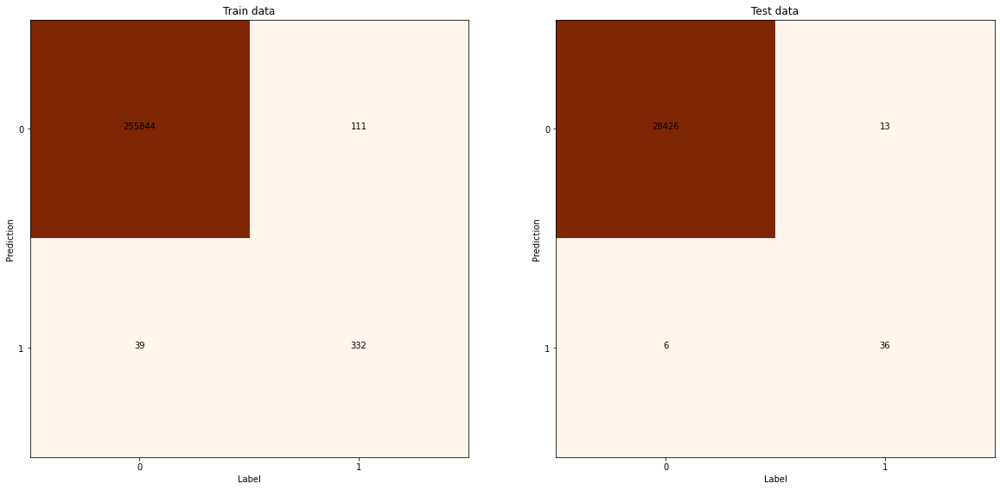

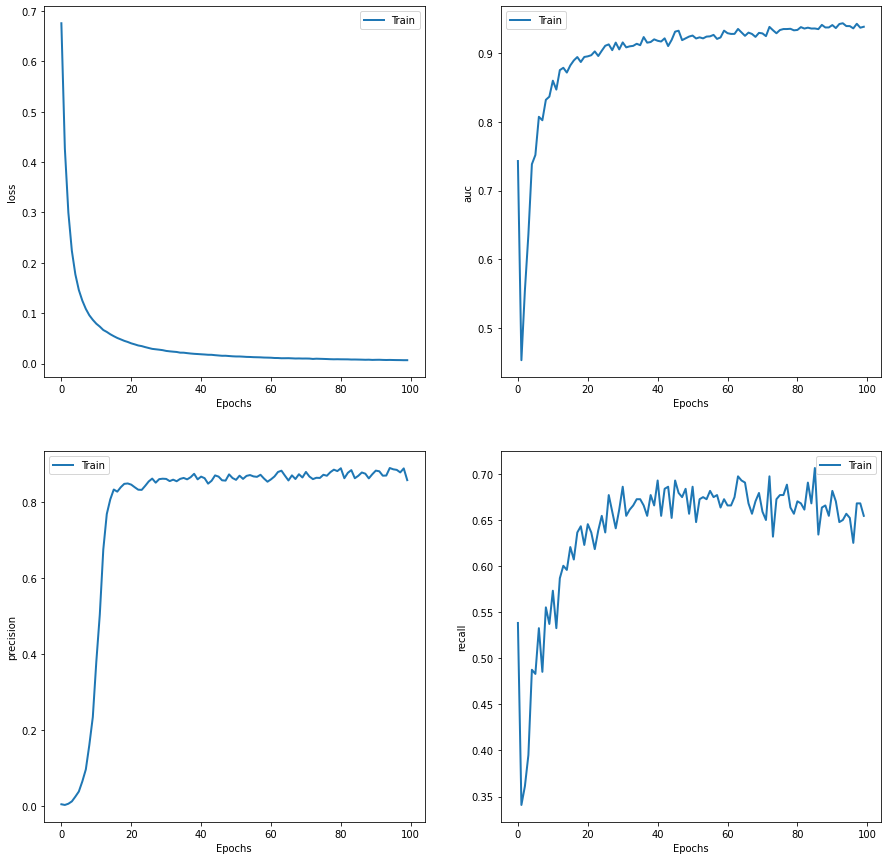

Area under ROC curve: 0.995
Area under Precision-Recall curve: 0.737
F1 Score: 0.791


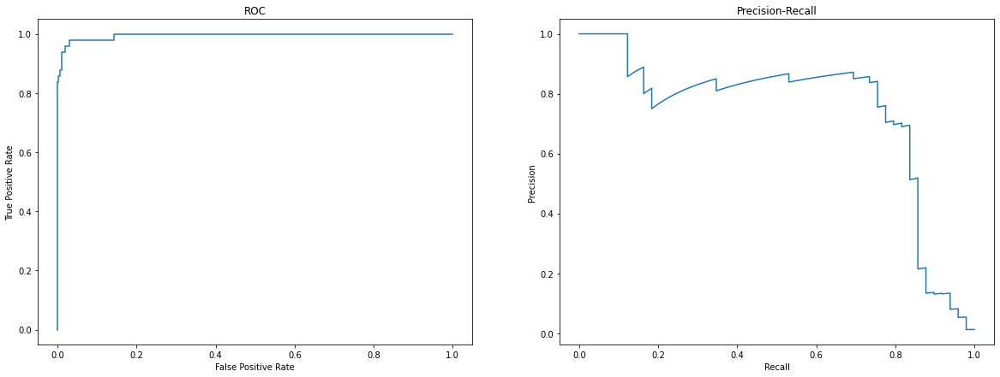

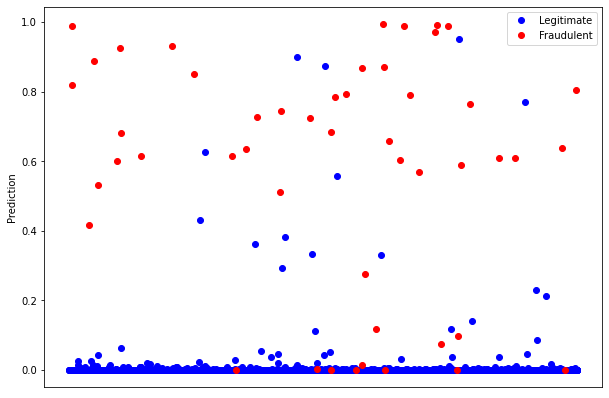

---------------------------------------------------------------
Model: "sequential_170"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_348 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_178 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_349 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Correct predictions for Train data: 99.940%
Train Precision: 88.919%
Train Recall: 74.266%
Correct predictions for Test data: 99.944%
Test Precision: 88.372%
Test Recall: 77.551%
Final Train auc: 93.573%
Final Train precision: 86.787%
Final Train recall: 65.237%


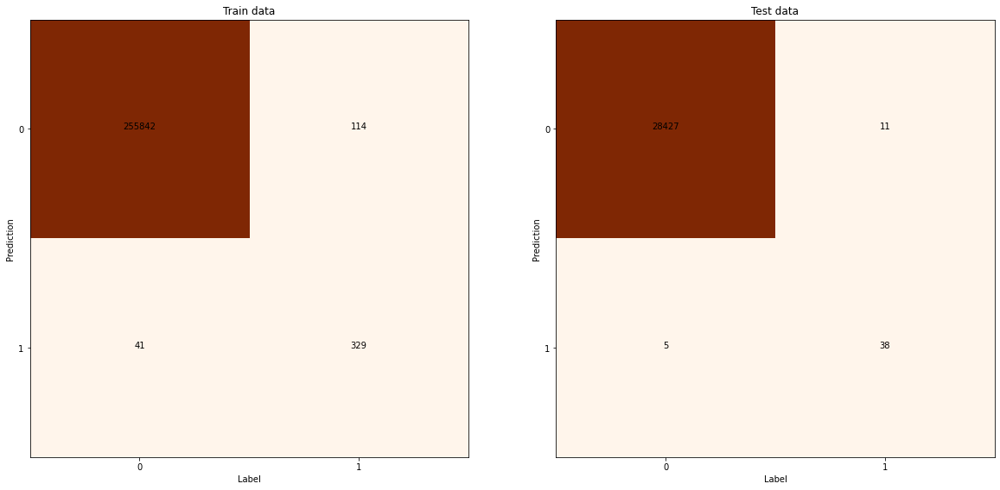

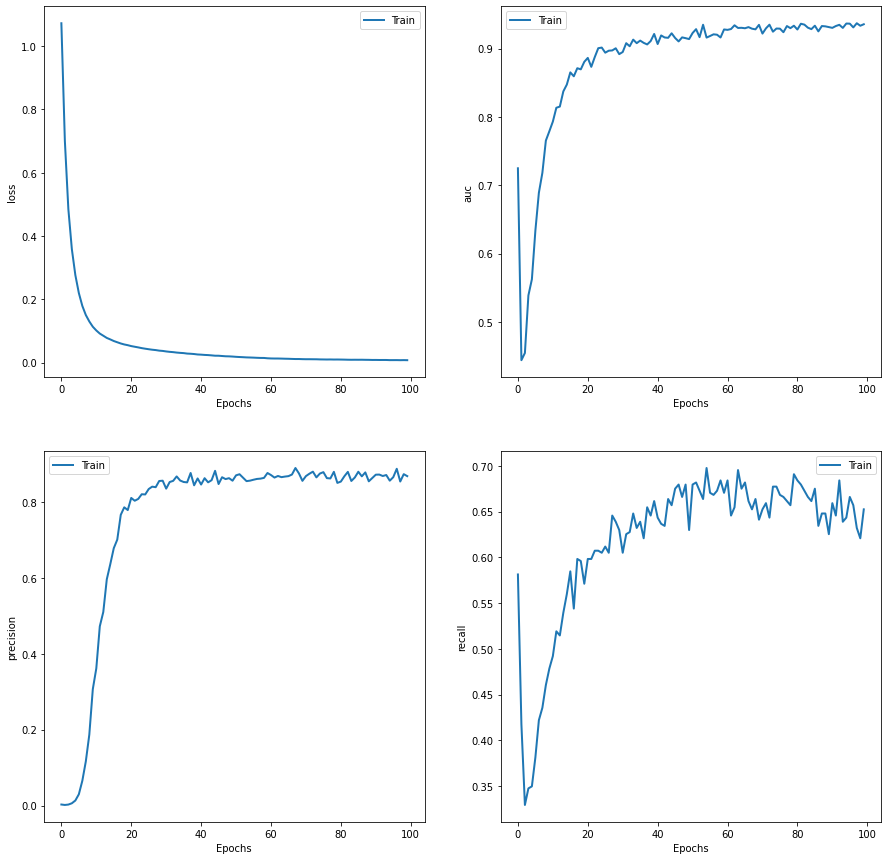

Area under ROC curve: 0.981
Area under Precision-Recall curve: 0.814
F1 Score: 0.826


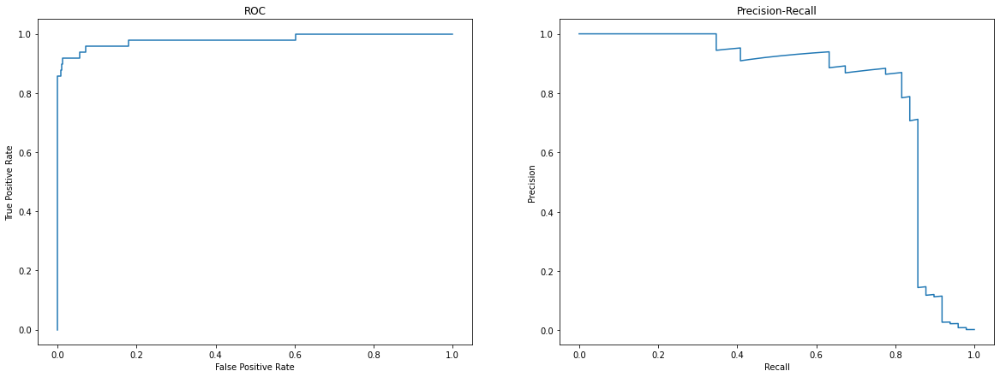

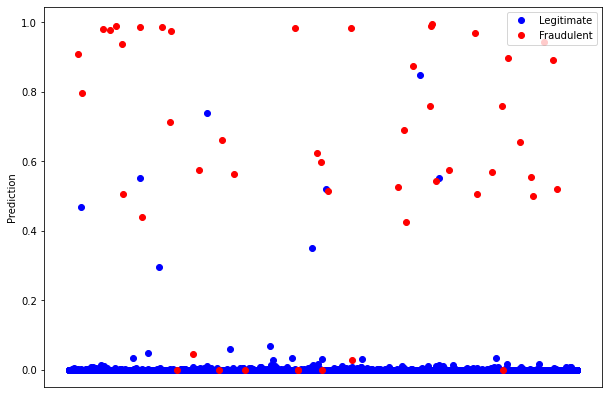

---------------------------------------------------------------
Model: "sequential_171"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_350 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_179 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_351 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Correct predictions for Train data: 99.946%
Train Precision: 89.003%
Train Recall: 78.555%
Correct predictions for Test data: 99.940%
Test Precision: 90.000%
Test Recall: 73.469%
Final Train auc: 93.880%
Final Train precision: 87.898%
Final Train recall: 62.302%


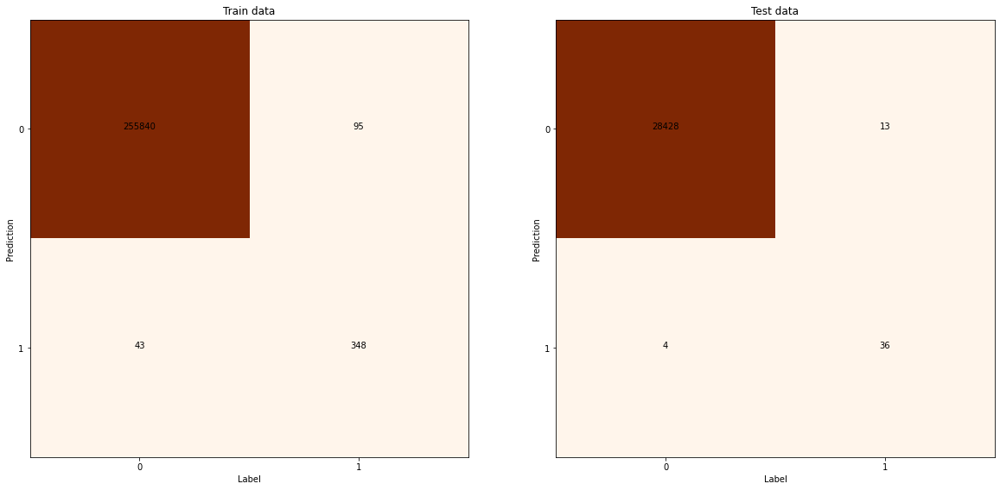

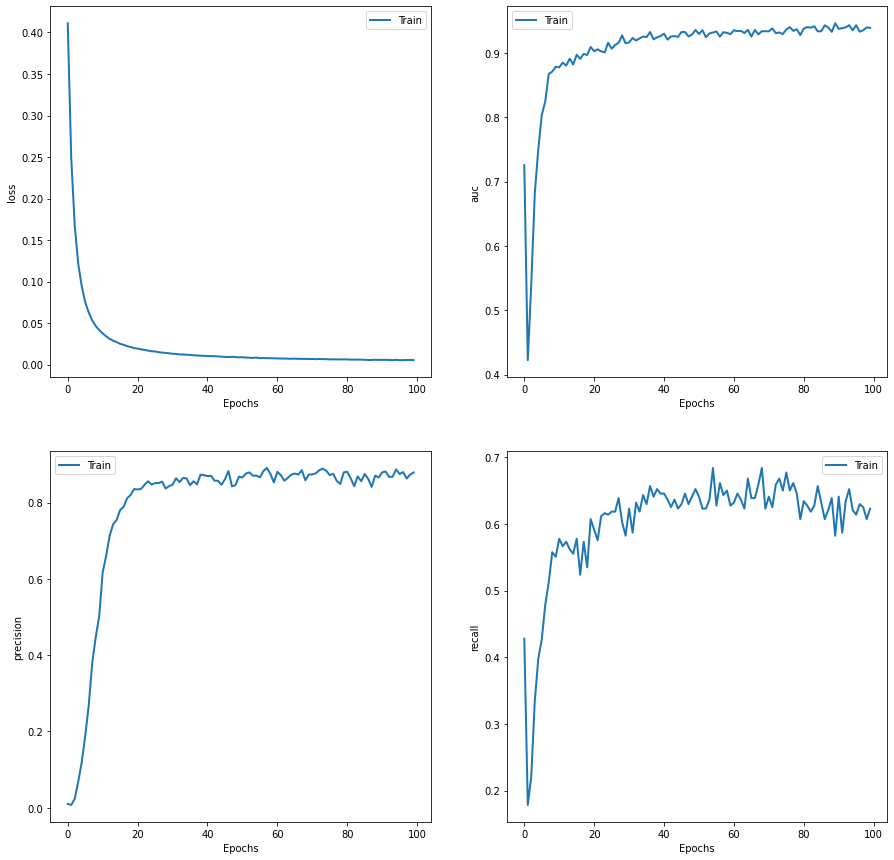

Area under ROC curve: 0.971
Area under Precision-Recall curve: 0.764
F1 Score: 0.809


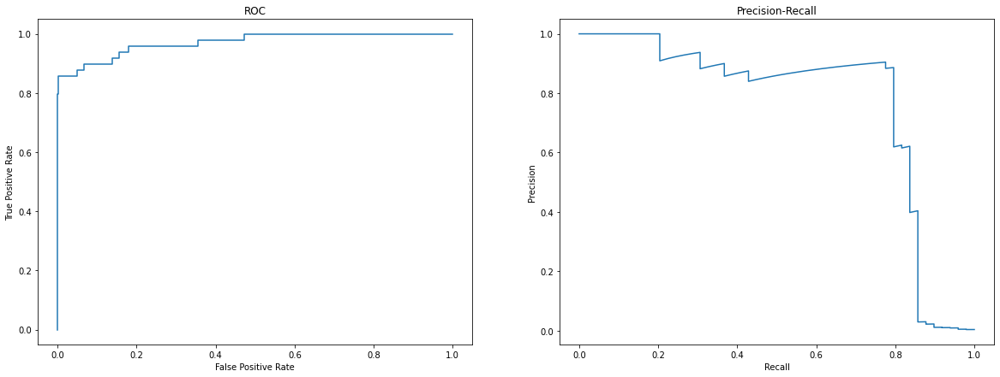

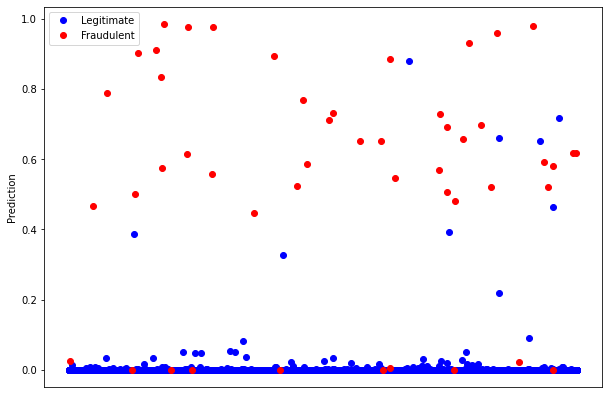

---------------------------------------------------------------
Model: "sequential_172"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_352 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_180 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_353 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Correct predictions for Train data: 99.944%
Train Precision: 88.630%
Train Recall: 77.602%
Correct predictions for Test data: 99.923%
Test Precision: 80.435%
Test Recall: 74.000%
Final Train auc: 94.276%
Final Train precision: 87.387%
Final Train recall: 65.837%


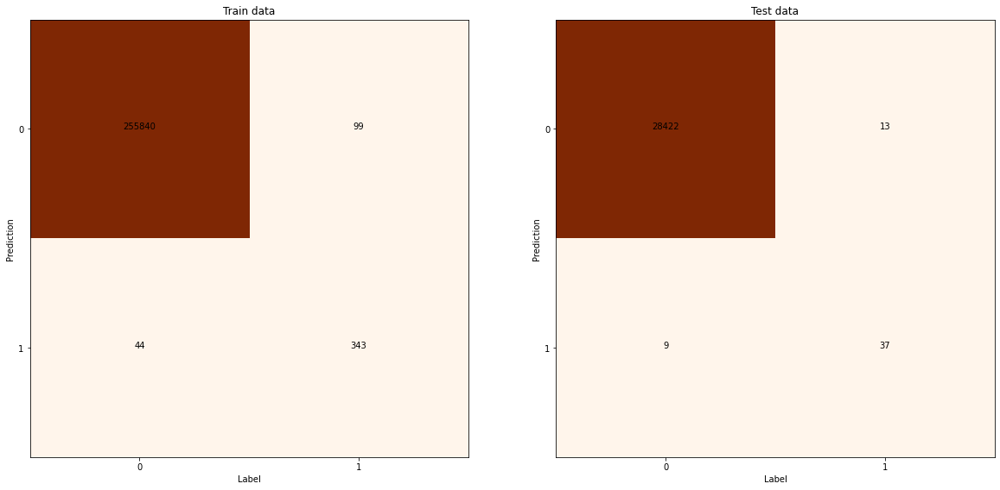

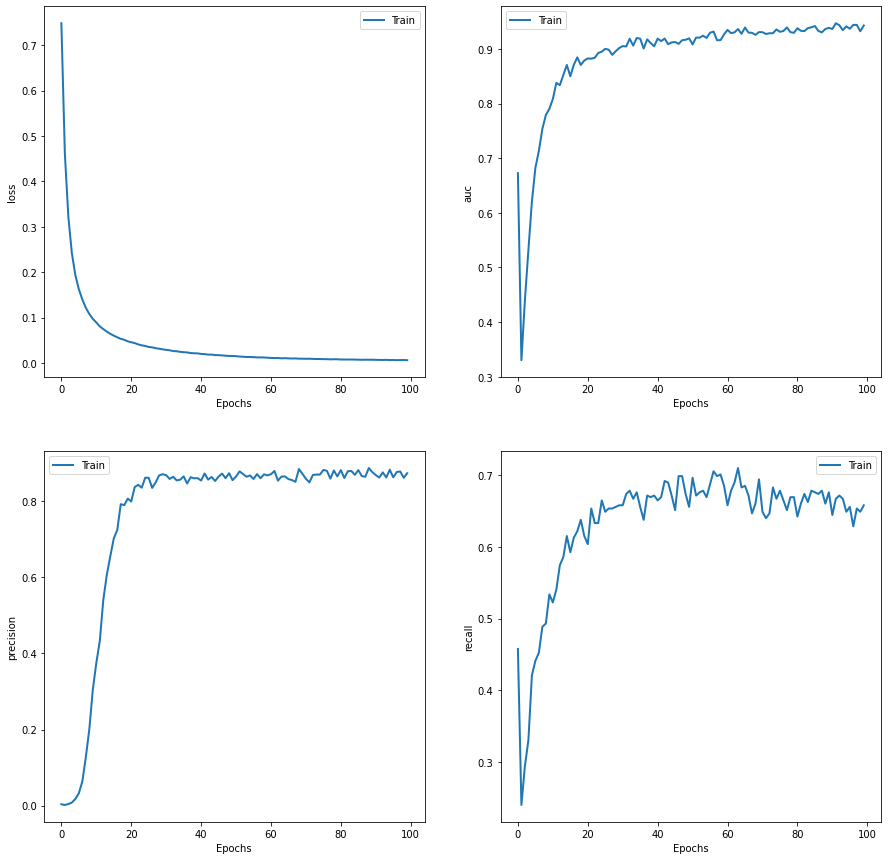

Area under ROC curve: 0.966
Area under Precision-Recall curve: 0.717
F1 Score: 0.771


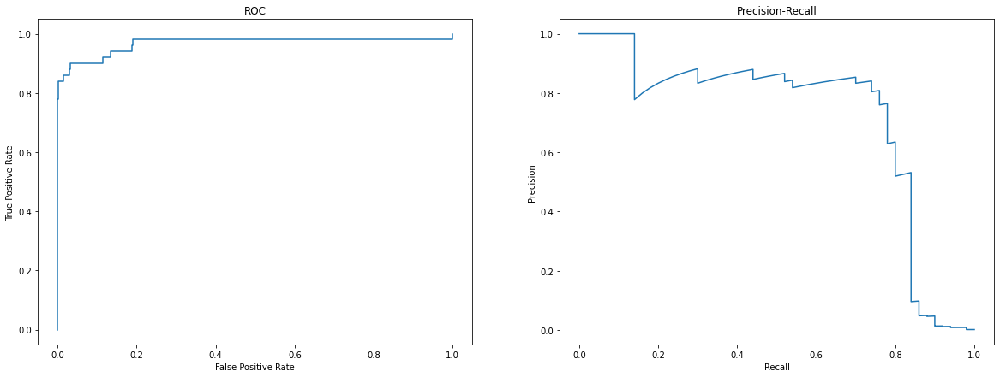

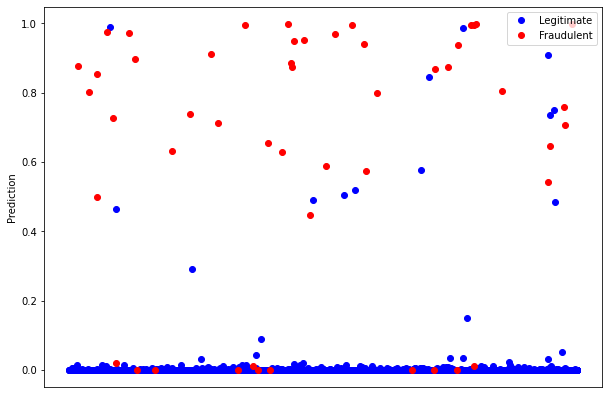

---------------------------------------------------------------
Model: "sequential_173"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_354 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_181 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_355 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Correct predictions for Train data: 99.938%
Train Precision: 87.733%
Train Recall: 74.434%
Correct predictions for Test data: 99.951%
Test Precision: 97.368%
Test Recall: 74.000%
Final Train auc: 93.455%
Final Train precision: 85.664%
Final Train recall: 55.430%


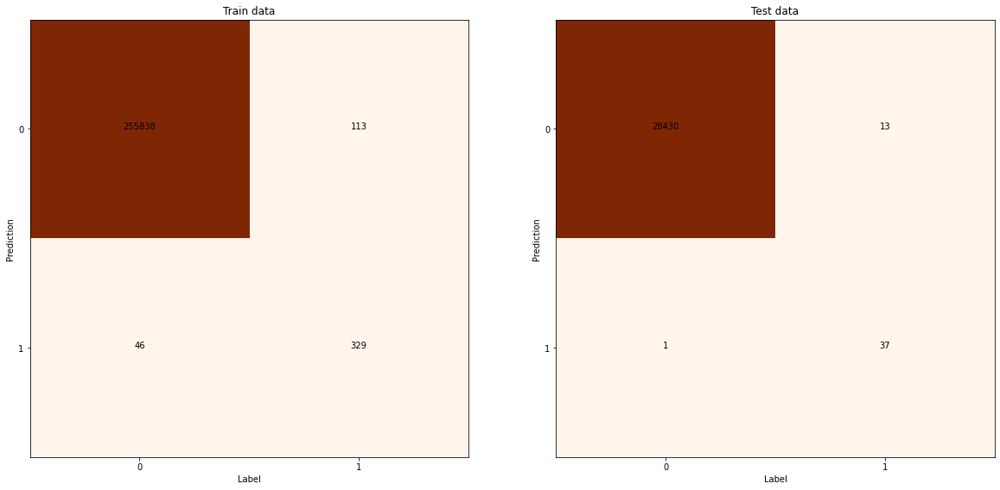

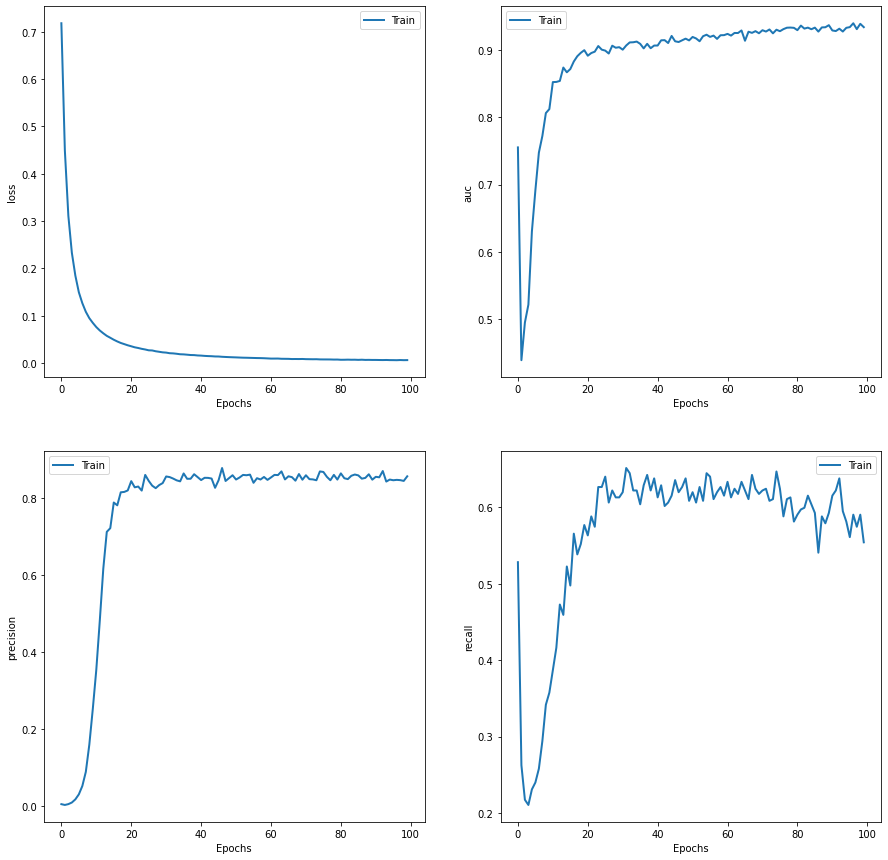

Area under ROC curve: 0.973
Area under Precision-Recall curve: 0.839
F1 Score: 0.841


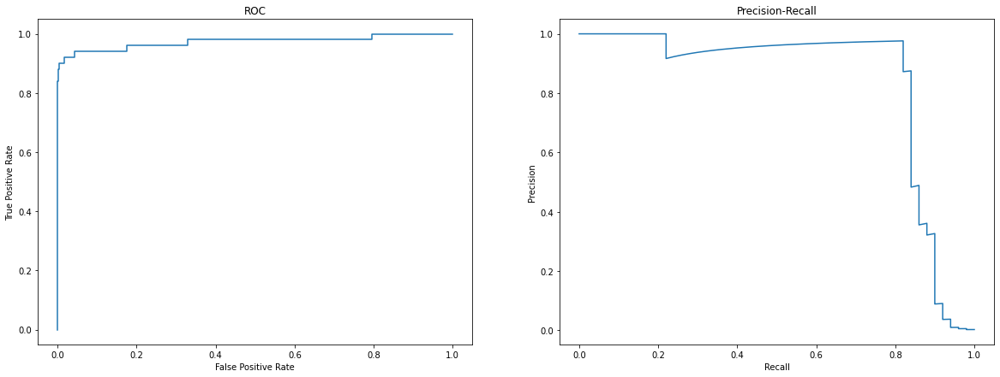

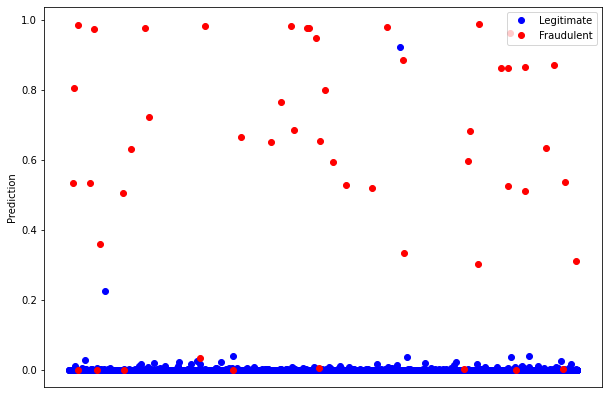

---------------------------------------------------------------
Model: "sequential_174"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_356 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_182 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_357 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Correct predictions for Train data: 99.944%
Train Precision: 88.630%
Train Recall: 77.427%
Correct predictions for Test data: 99.947%
Test Precision: 86.957%
Test Recall: 81.633%
Final Train auc: 94.016%
Final Train precision: 87.000%
Final Train recall: 58.916%


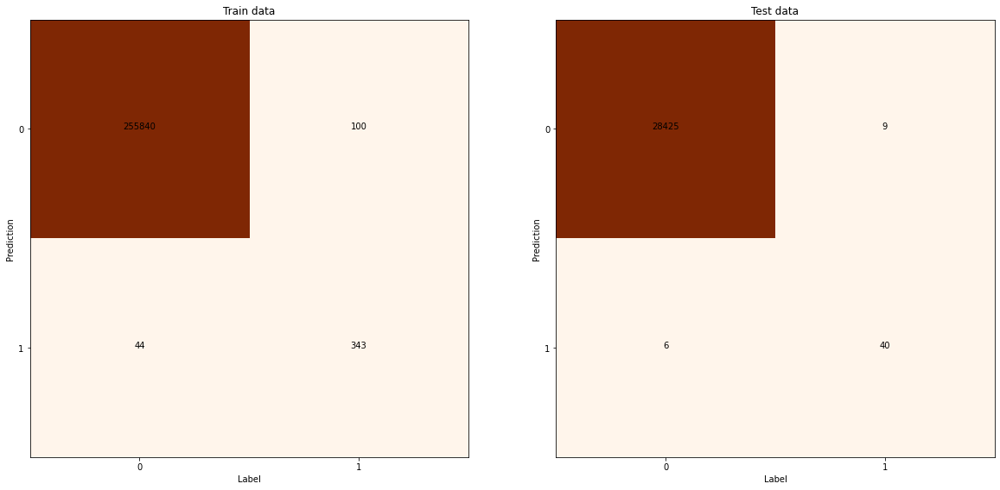

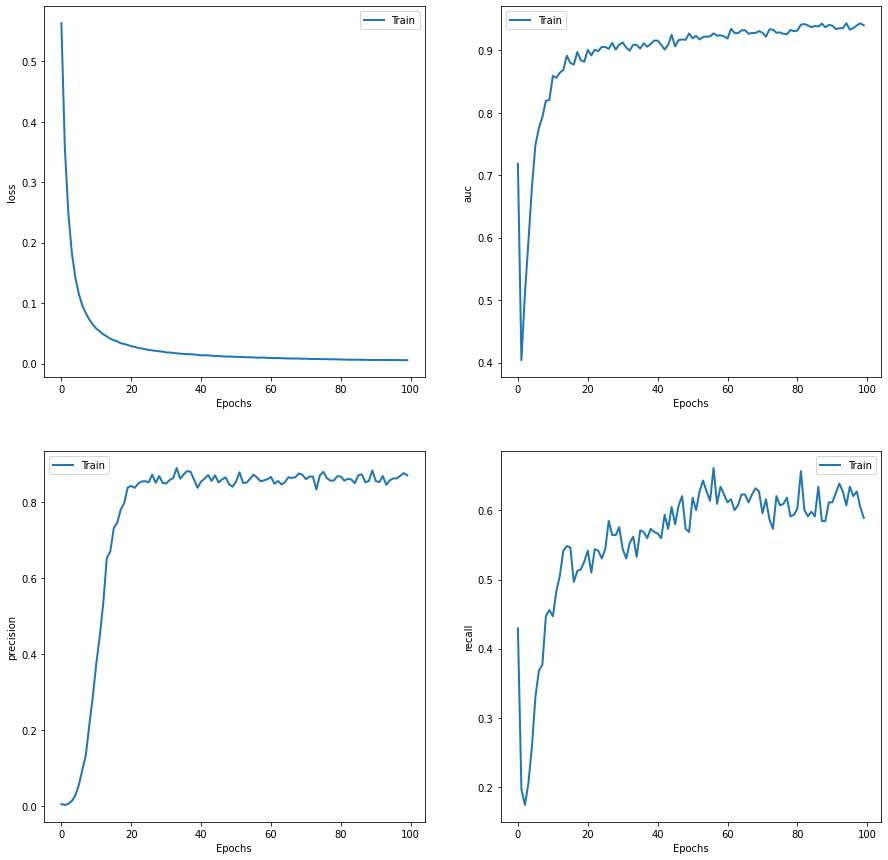

Area under ROC curve: 0.975
Area under Precision-Recall curve: 0.788
F1 Score: 0.842


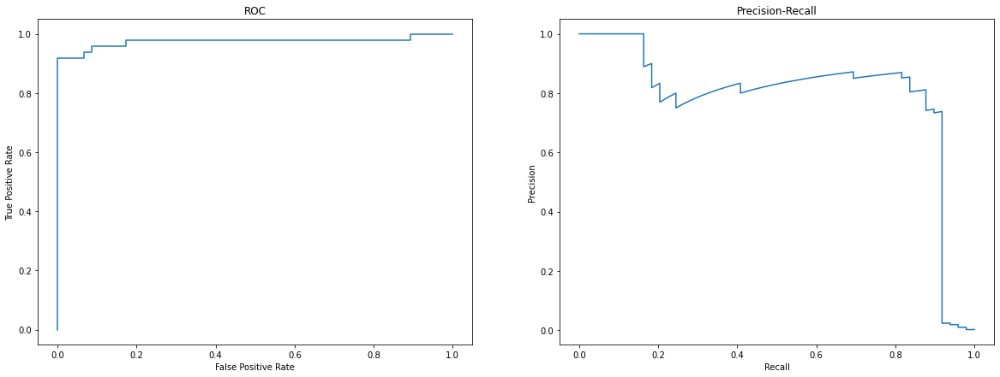

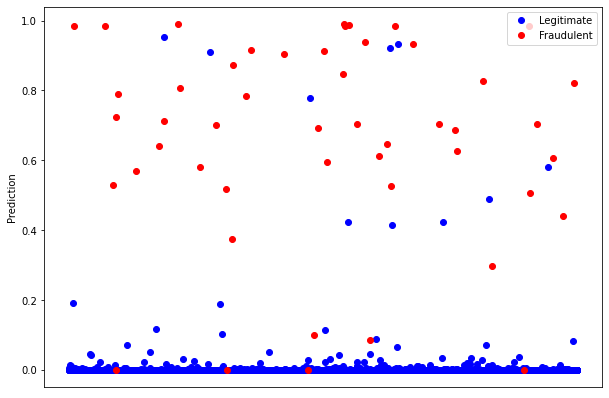

---------------------------------------------------------------
Model: "sequential_175"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_358 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_183 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_359 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Correct predictions for Train data: 99.941%
Train Precision: 88.421%
Train Recall: 75.847%
Correct predictions for Test data: 99.954%
Test Precision: 87.500%
Test Recall: 85.714%
Final Train auc: 94.073%
Final Train precision: 86.250%
Final Train recall: 62.302%


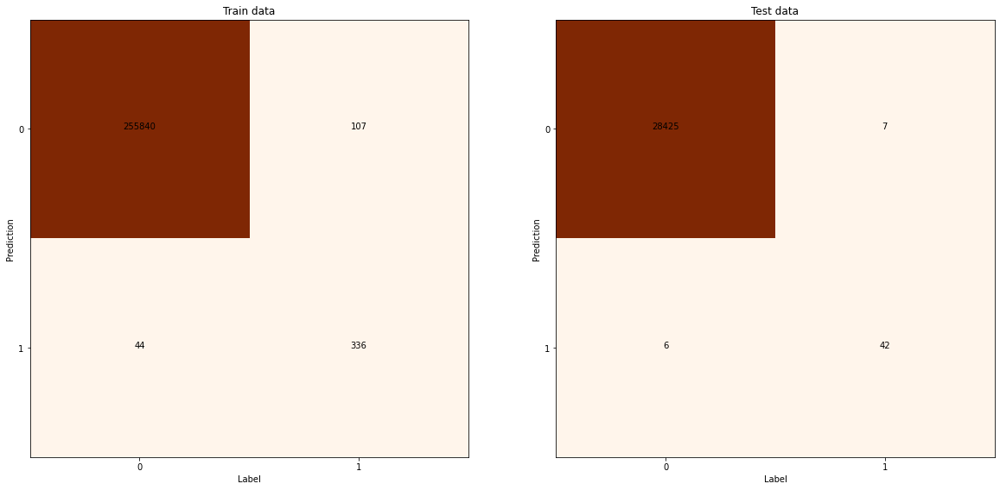

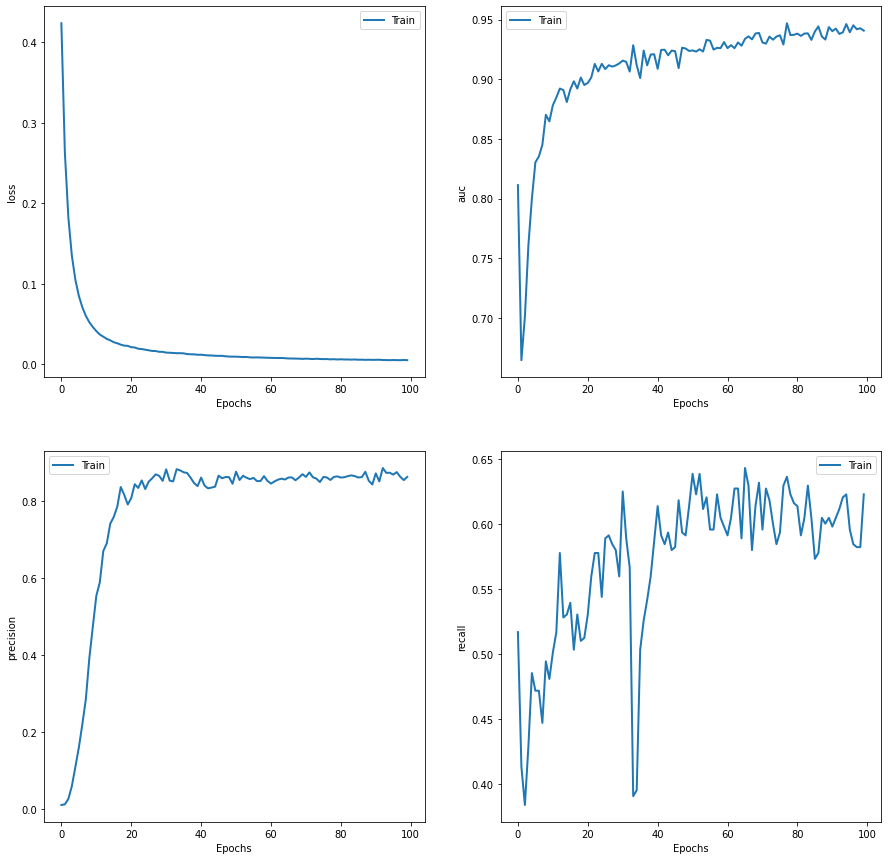

Area under ROC curve: 0.990
Area under Precision-Recall curve: 0.779
F1 Score: 0.866


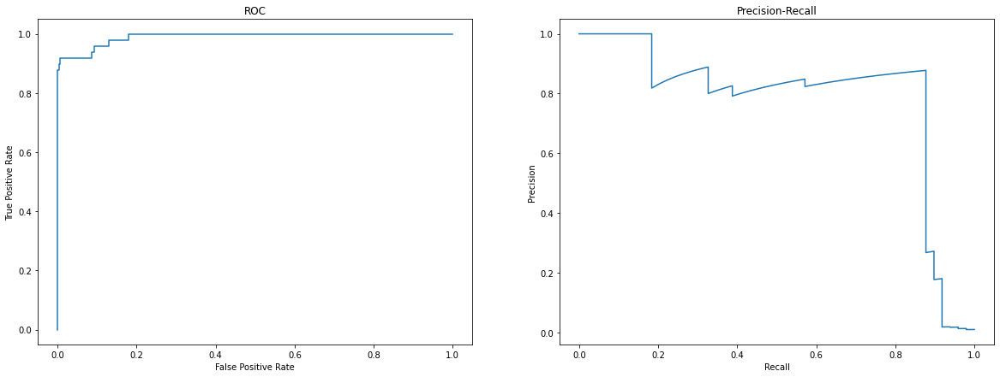

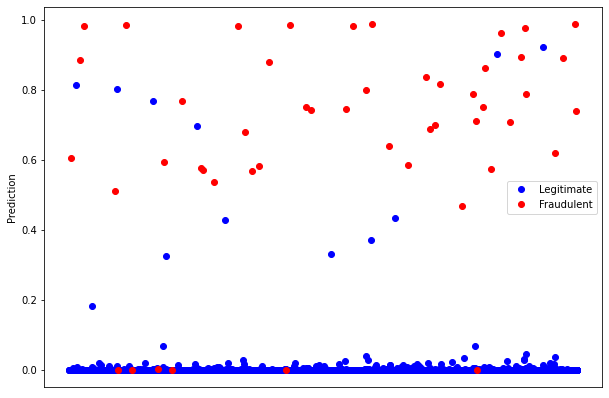

---------------------------------------------------------------
Model: "sequential_176"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_360 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_184 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_361 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Correct predictions for Train data: 99.942%
Train Precision: 88.482%
Train Recall: 76.298%
Correct predictions for Test data: 99.951%
Test Precision: 94.872%
Test Recall: 75.510%
Final Train auc: 93.521%
Final Train precision: 87.296%
Final Train recall: 60.497%


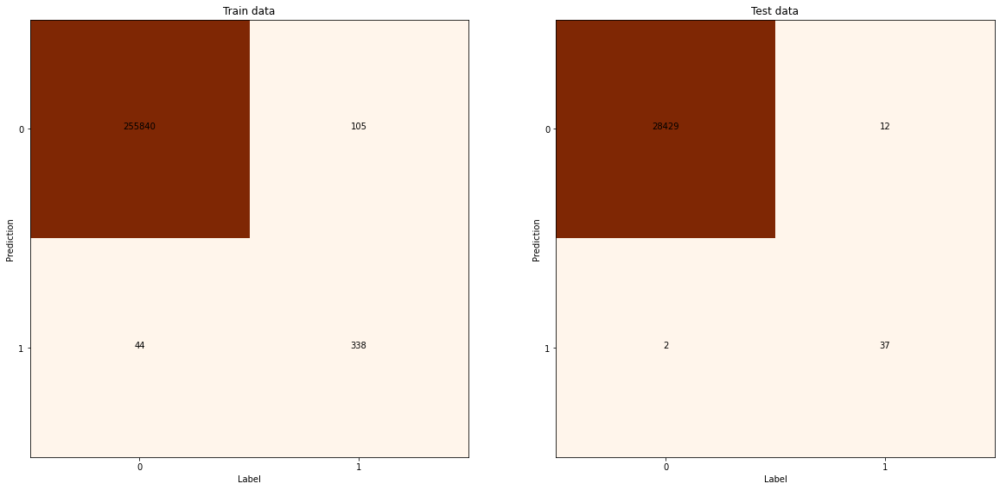

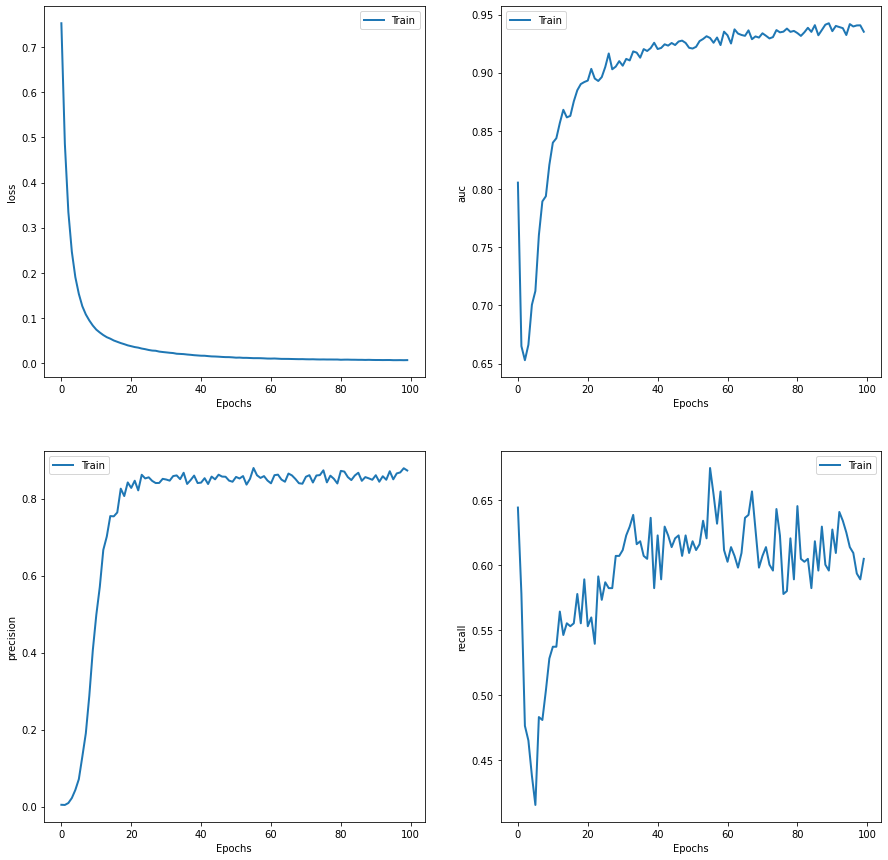

Area under ROC curve: 0.956
Area under Precision-Recall curve: 0.811
F1 Score: 0.841


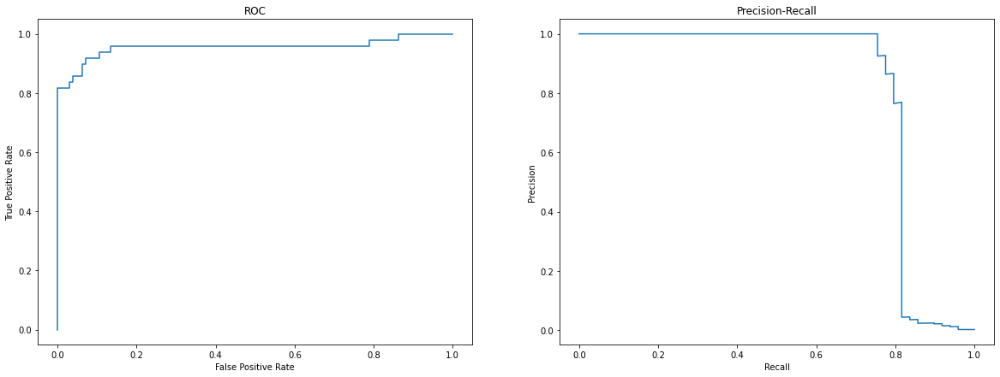

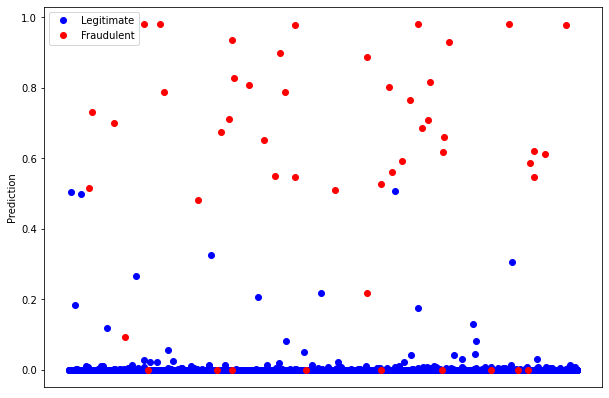

In [68]:
# Standard sampling k-fold
stsamp_kfold = kfold(10, data, "standard");

Final Train loss: 0.006177 (0.005382 - 0.006972)
Final Train auc: 0.938531 (0.936001 - 0.941061)
Final Train precision: 0.863784 (0.851982 - 0.875586)
Final Train recall: 0.602531 (0.523062 - 0.682001)


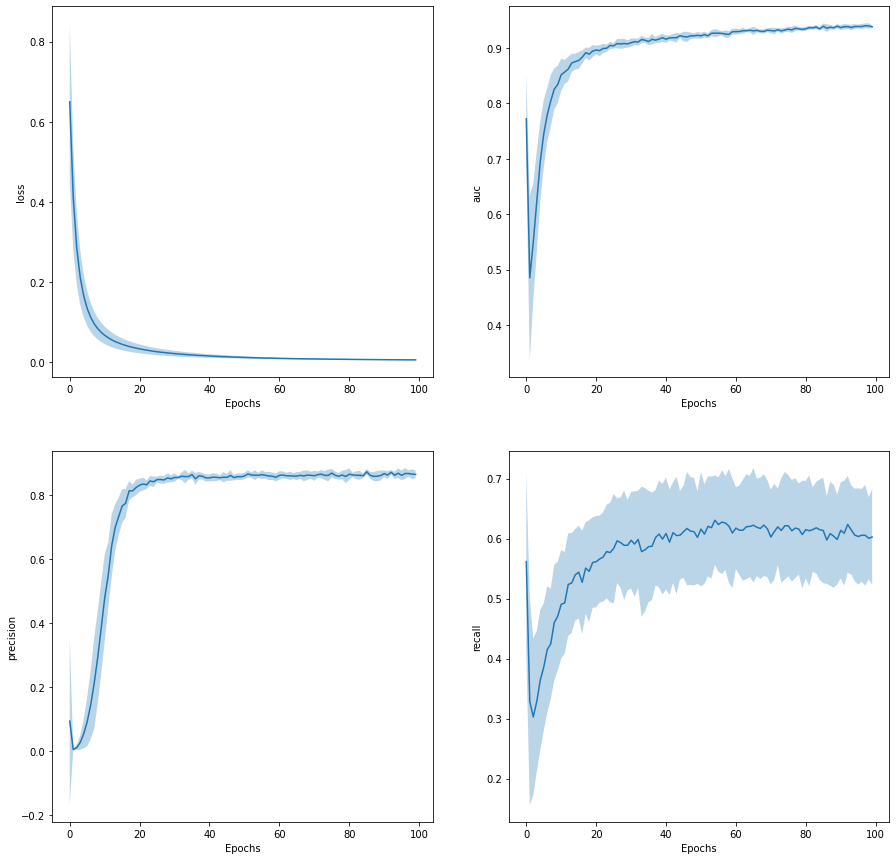

Test Precision: 0.882212 +/- 0.055657
Test Recall: 0.745935 +/- 0.069849


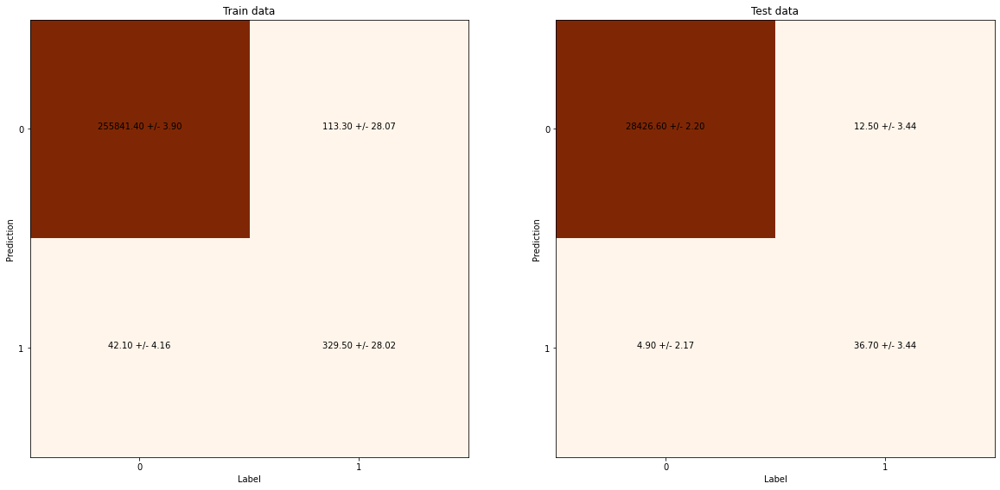

F1 Score: 0.807 +/- 0.051
Area under ROC curve: 0.941508 (0.888977 - 0.994040)
Area under Precision-Recall curve: 0.575220 (0.535700 - 0.614741)


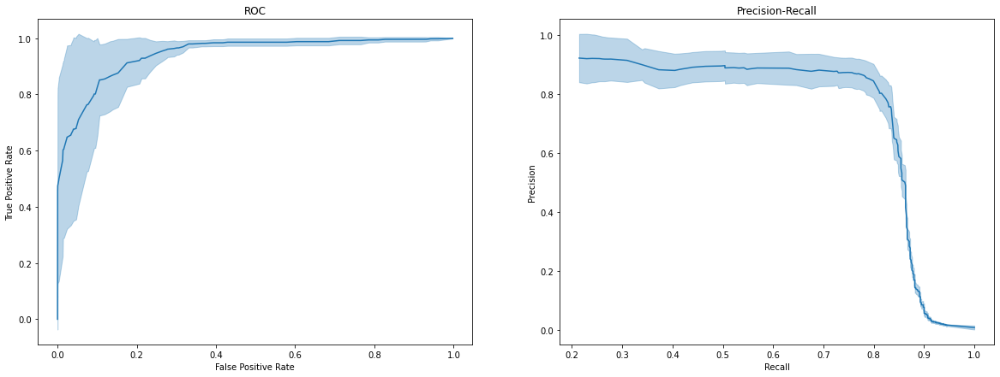

In [69]:
stsamp_stats = kfold_stats(*stsamp_kfold)

####Undersampling

---------------------------------------------------------------
Model: "sequential_177"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_362 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_185 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_363 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Correct predictions for Train data: 96.614%
Train Precision: 99.284%
Train Recall: 93.905%
Correct predictions for Test data: 97.398%
Test Precision: 5.412%
Test Recall: 85.714%
Final Train auc: 98.830%
Final Train precision: 97.619%
Final Train recall: 92.551%


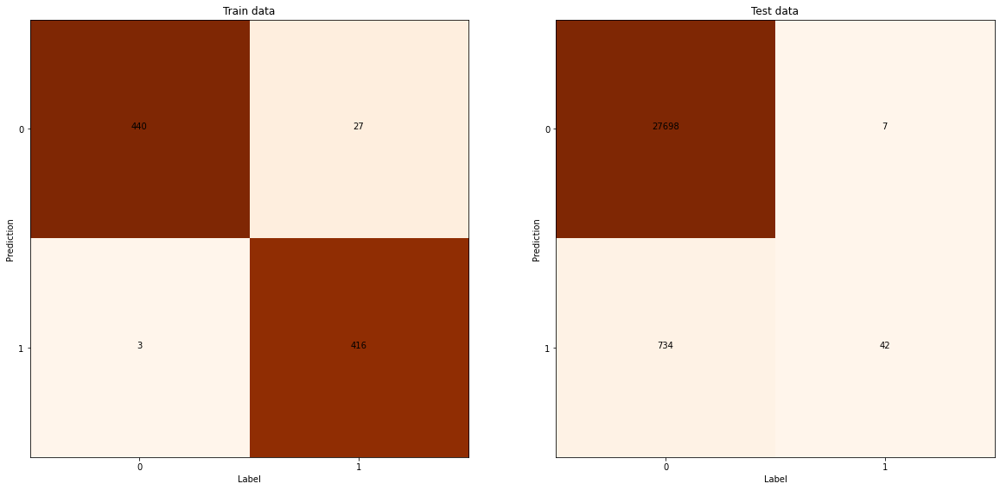

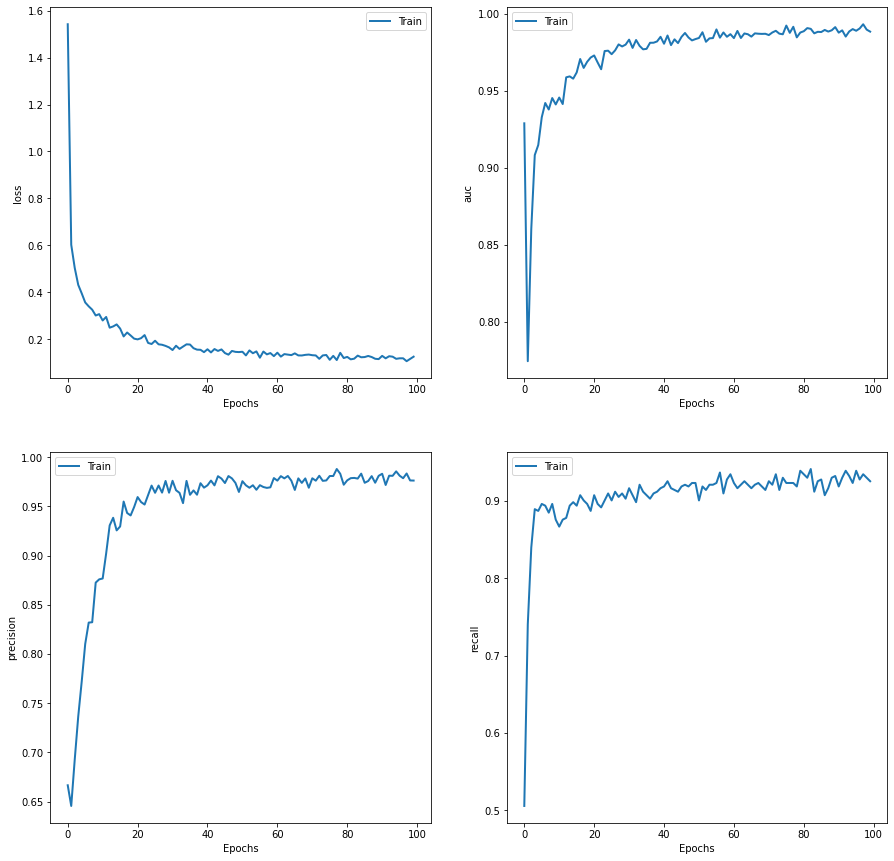

Area under ROC curve: 0.969
Area under Precision-Recall curve: 0.691
F1 Score: 0.102


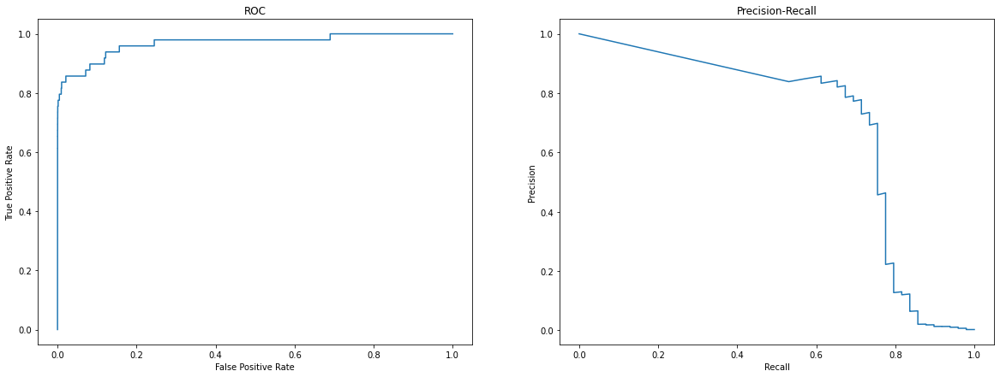

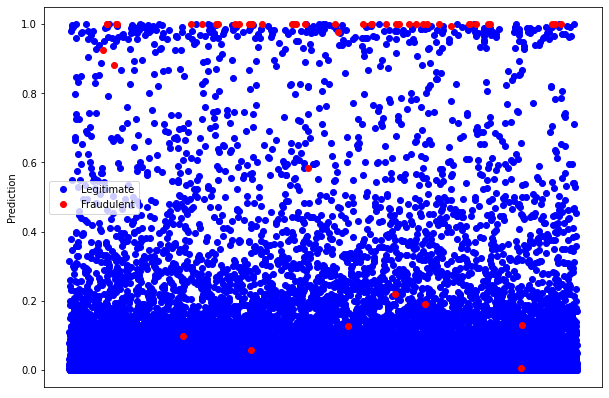

---------------------------------------------------------------
Model: "sequential_178"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_364 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_186 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_365 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Correct predictions for Train data: 97.968%
Train Precision: 100.000%
Train Recall: 95.937%
Correct predictions for Test data: 95.650%
Test Precision: 3.588%
Test Recall: 93.878%
Final Train auc: 99.330%
Final Train precision: 98.104%
Final Train recall: 93.454%


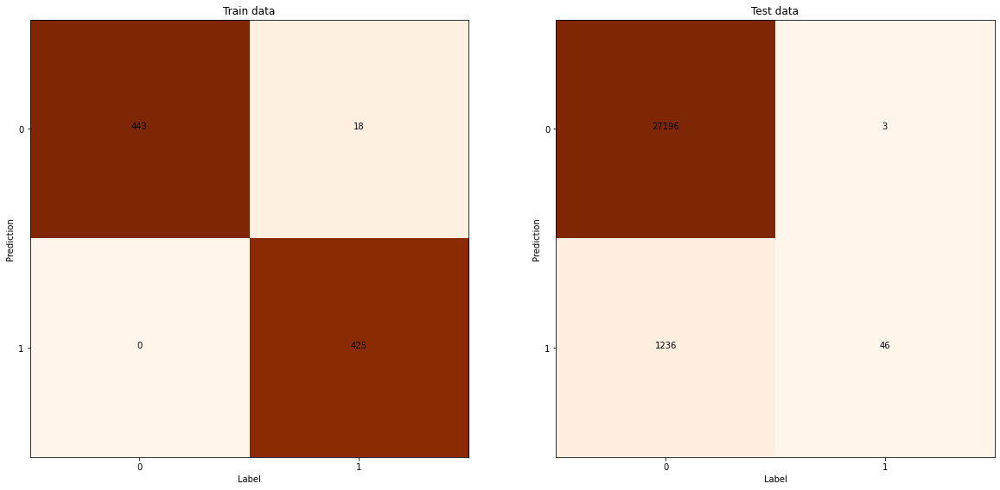

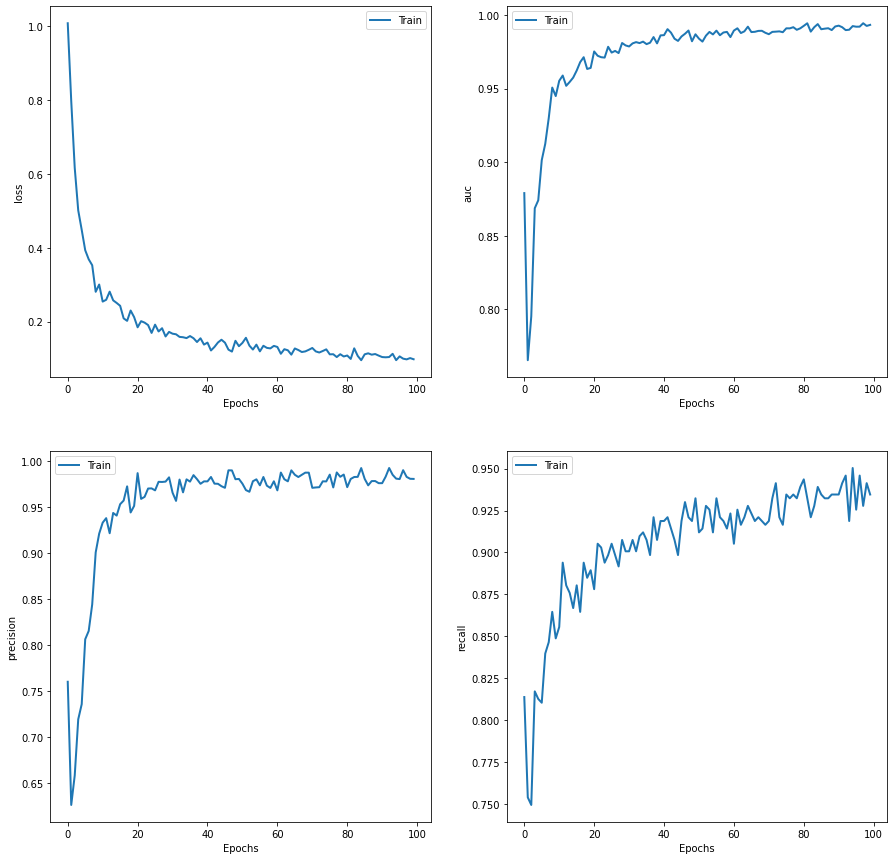

Area under ROC curve: 0.991
Area under Precision-Recall curve: 0.757
F1 Score: 0.069


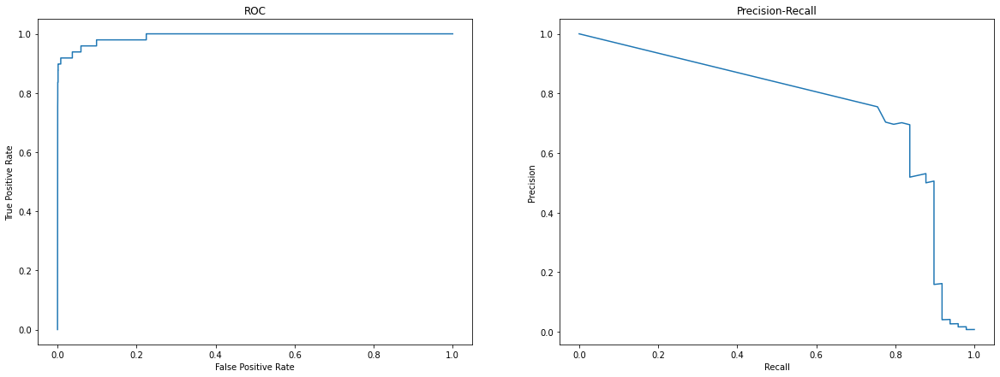

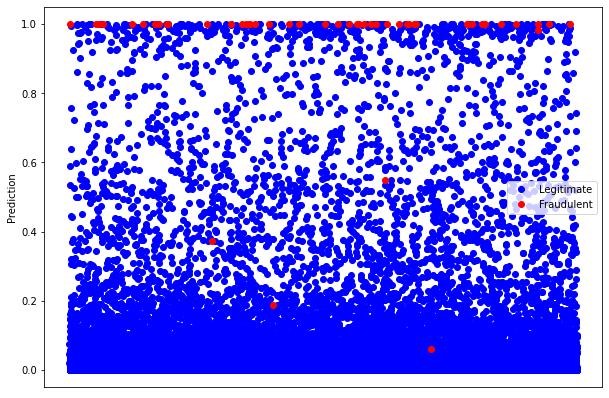

---------------------------------------------------------------
Model: "sequential_179"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_366 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_187 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_367 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Correct predictions for Train data: 97.743%
Train Precision: 99.532%
Train Recall: 95.937%
Correct predictions for Test data: 96.110%
Test Precision: 3.836%
Test Recall: 89.796%
Final Train auc: 99.122%
Final Train precision: 97.356%
Final Train recall: 91.422%


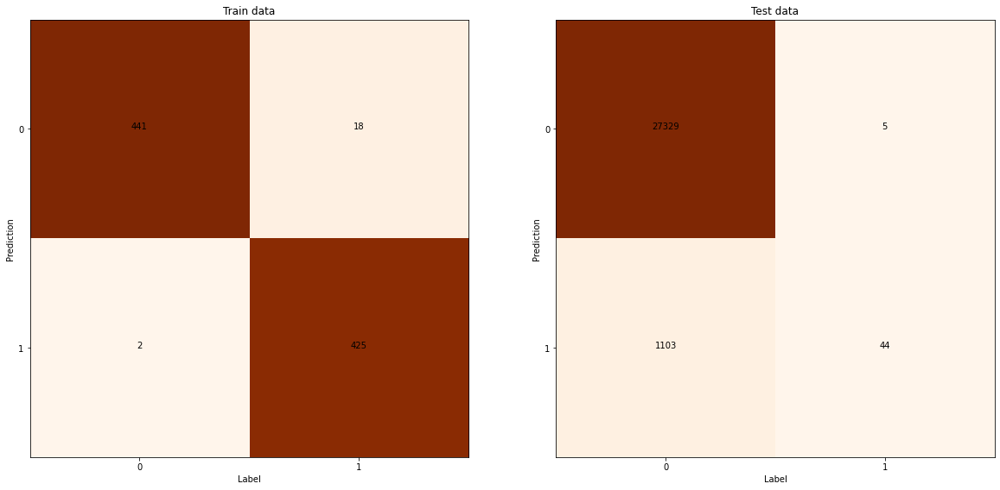

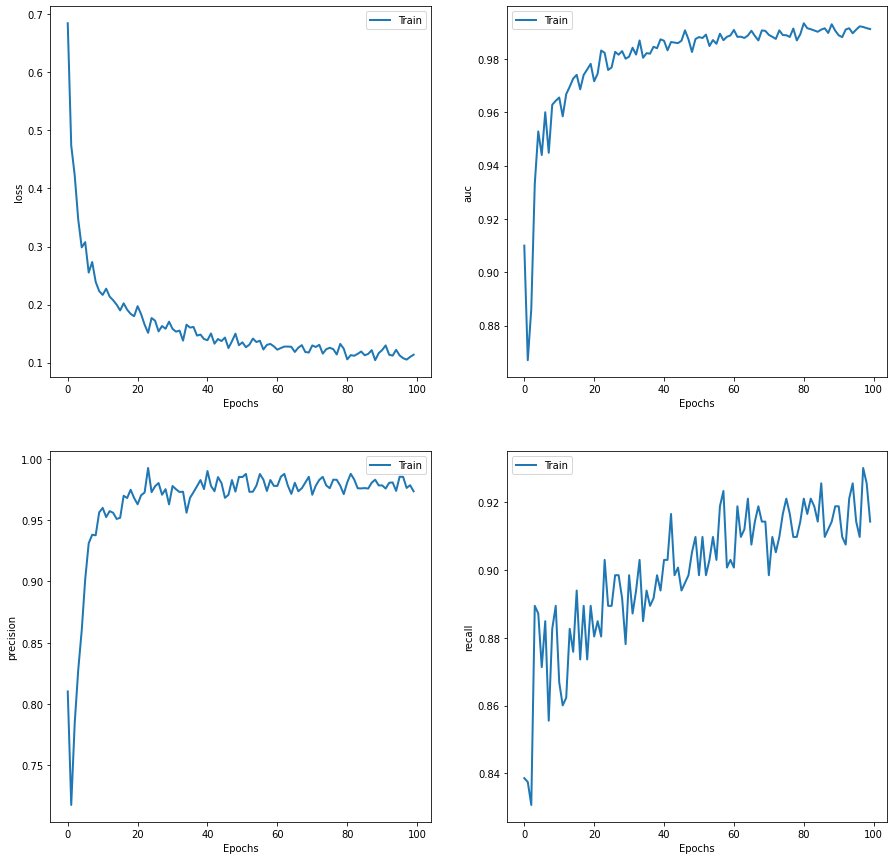

Area under ROC curve: 0.986
Area under Precision-Recall curve: 0.745
F1 Score: 0.074


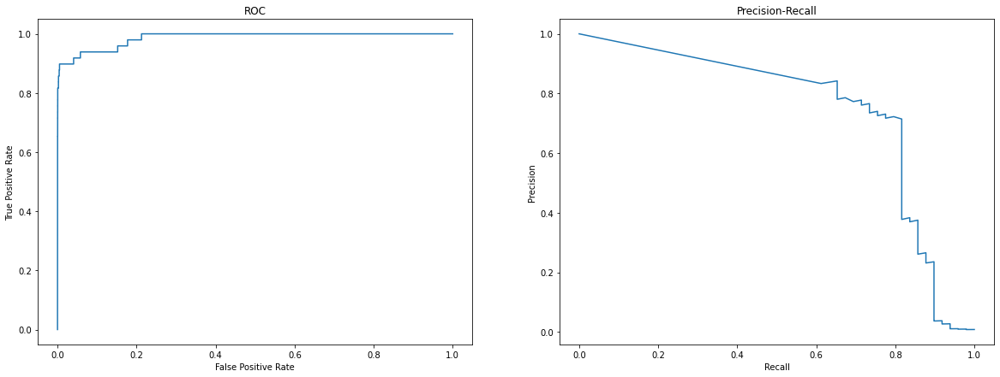

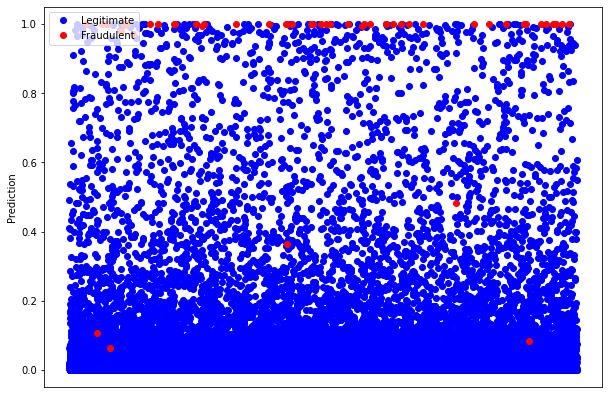

---------------------------------------------------------------
Model: "sequential_180"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_368 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_188 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_369 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Correct predictions for Train data: 97.630%
Train Precision: 99.070%
Train Recall: 96.163%
Correct predictions for Test data: 95.464%
Test Precision: 3.446%
Test Recall: 93.878%
Final Train auc: 98.905%
Final Train precision: 97.857%
Final Train recall: 92.777%


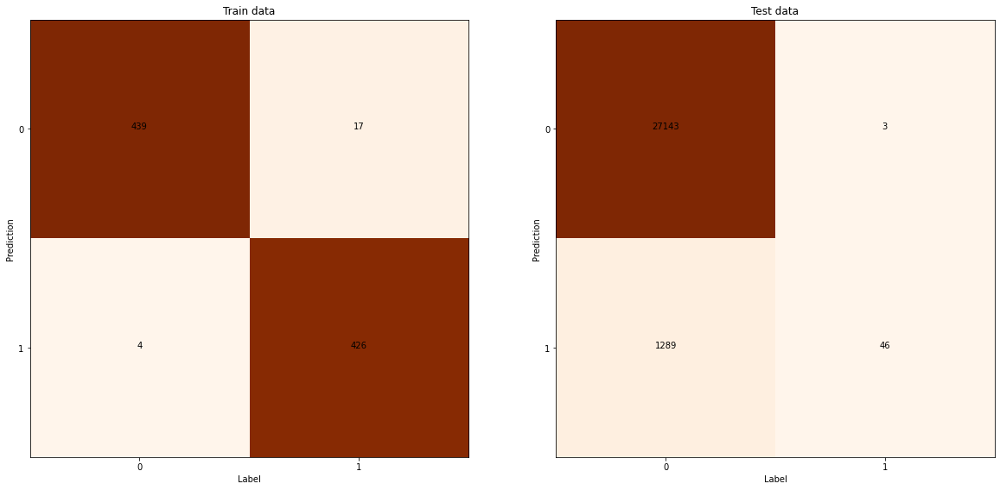

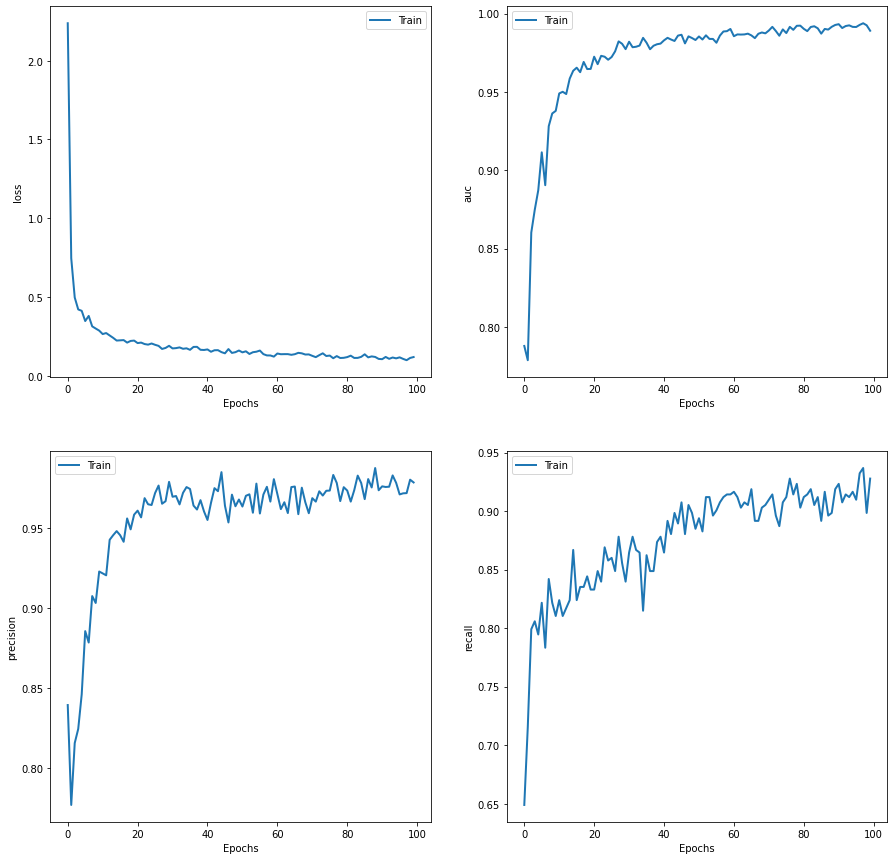

Area under ROC curve: 0.971
Area under Precision-Recall curve: 0.795
F1 Score: 0.066


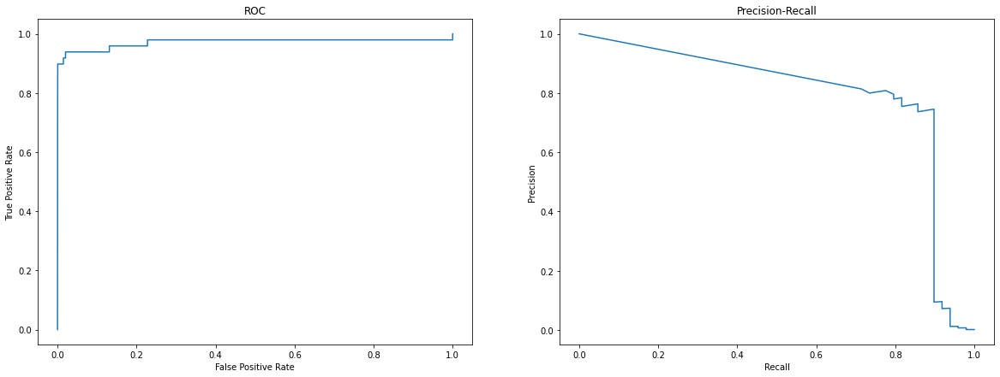

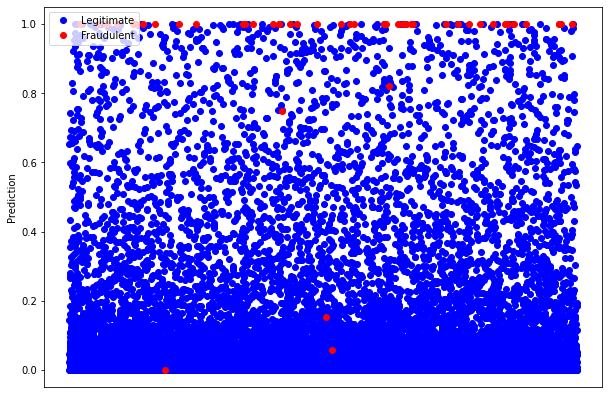

---------------------------------------------------------------
Model: "sequential_181"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_370 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_189 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_371 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Correct predictions for Train data: 97.630%
Train Precision: 98.843%
Train Recall: 96.388%
Correct predictions for Test data: 96.075%
Test Precision: 3.883%
Test Recall: 91.837%
Final Train auc: 99.319%
Final Train precision: 98.072%
Final Train recall: 91.874%


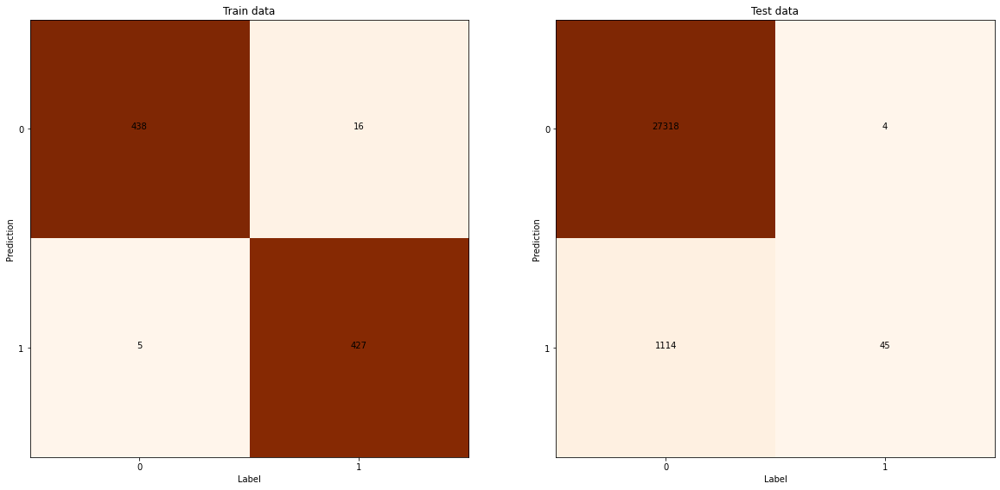

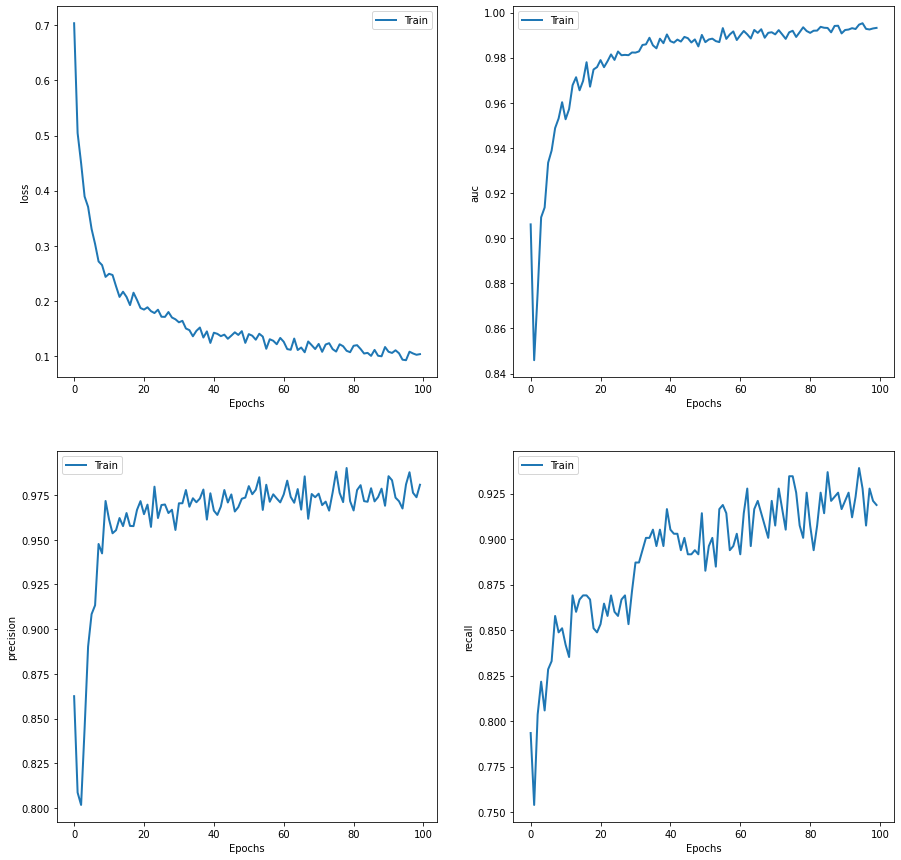

Area under ROC curve: 0.978
Area under Precision-Recall curve: 0.767
F1 Score: 0.075


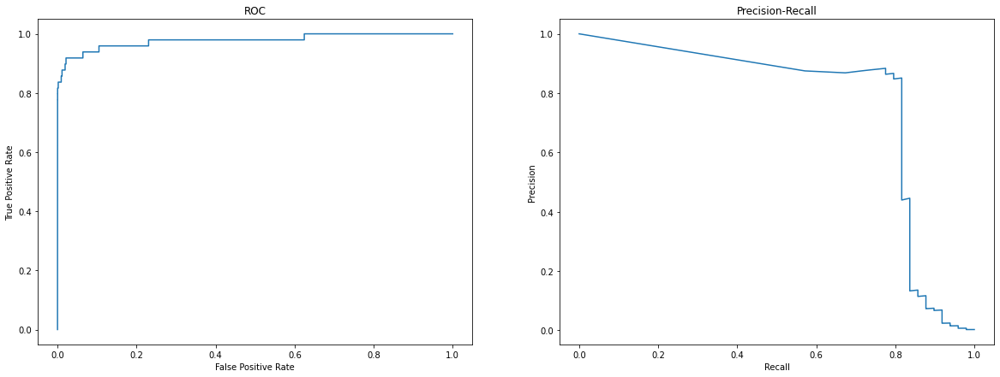

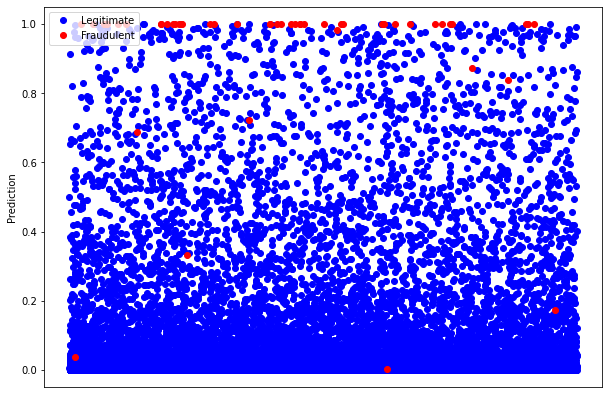

---------------------------------------------------------------
Model: "sequential_182"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_372 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_190 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_373 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Correct predictions for Train data: 96.493%
Train Precision: 98.812%
Train Recall: 94.118%
Correct predictions for Test data: 96.984%
Test Precision: 5.304%
Test Recall: 96.000%
Final Train auc: 98.844%
Final Train precision: 96.941%
Final Train recall: 93.213%


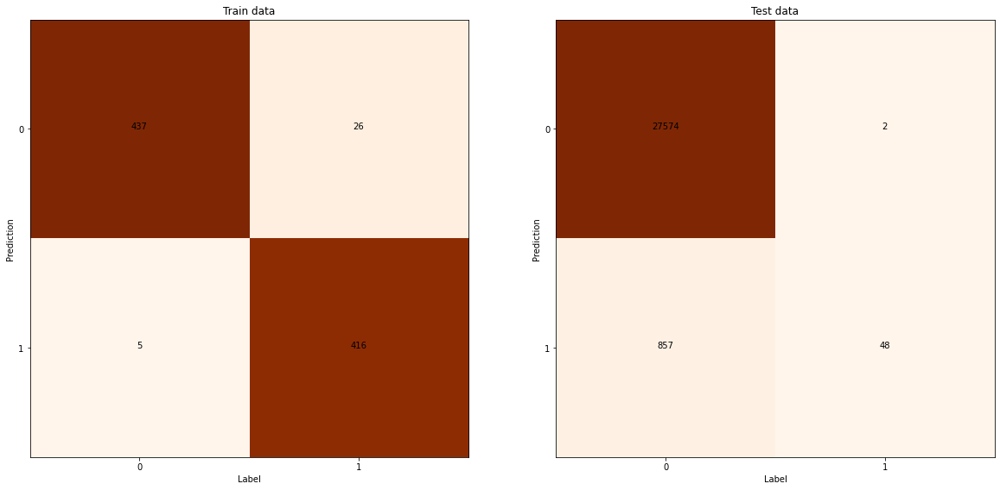

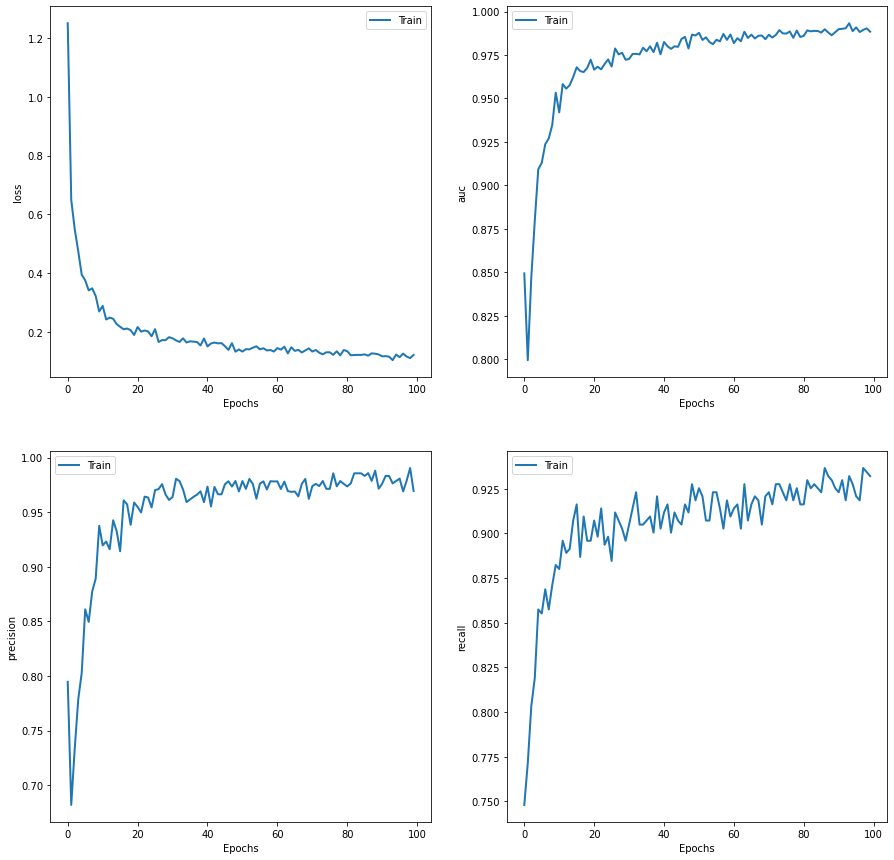

Area under ROC curve: 0.993
Area under Precision-Recall curve: 0.768
F1 Score: 0.101


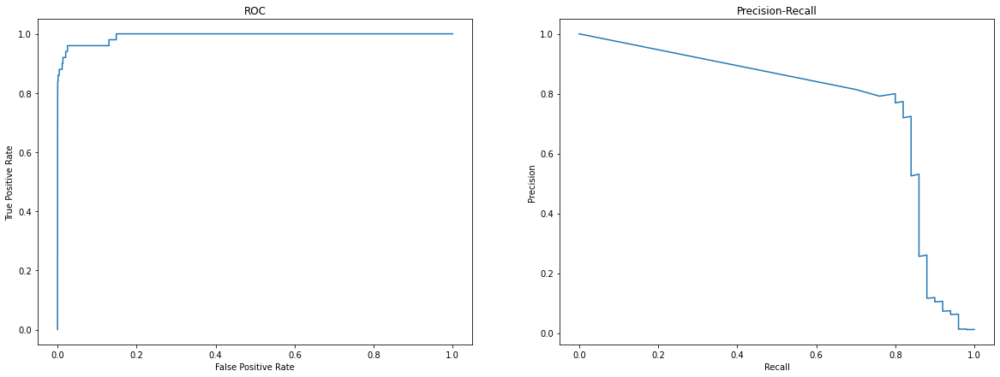

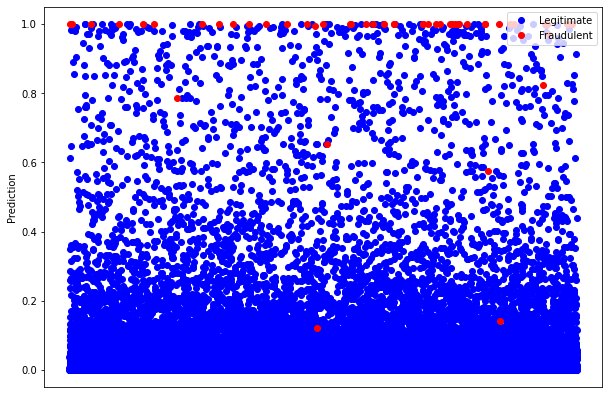

---------------------------------------------------------------
Model: "sequential_183"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_374 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_191 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_375 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Correct predictions for Train data: 96.606%
Train Precision: 99.048%
Train Recall: 94.118%
Correct predictions for Test data: 96.285%
Test Precision: 4.182%
Test Recall: 92.000%
Final Train auc: 99.279%
Final Train precision: 97.862%
Final Train recall: 93.213%


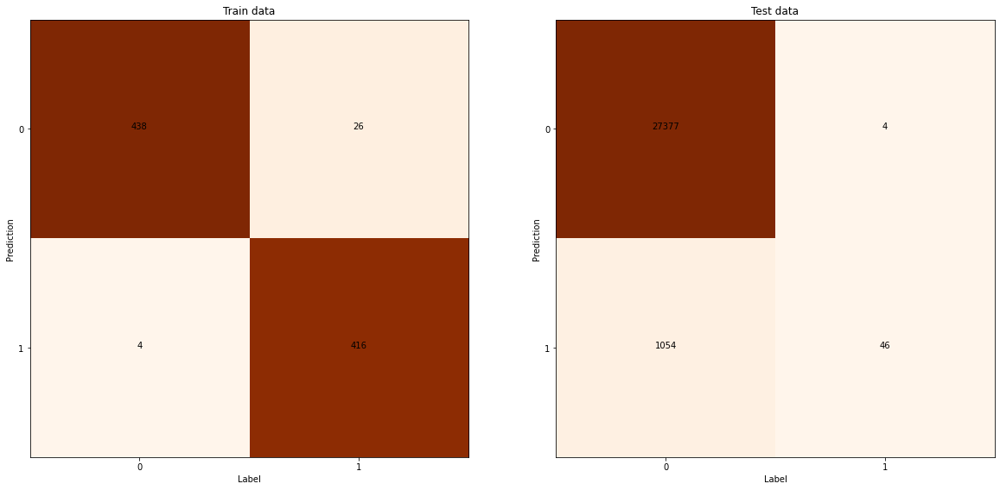

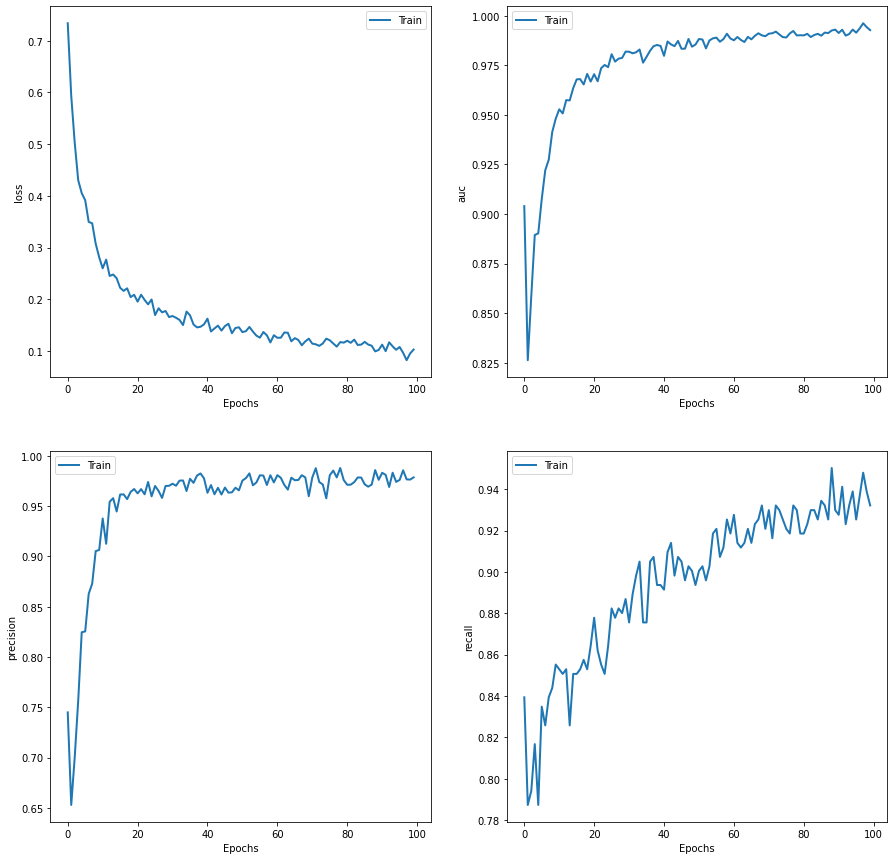

Area under ROC curve: 0.990
Area under Precision-Recall curve: 0.767
F1 Score: 0.080


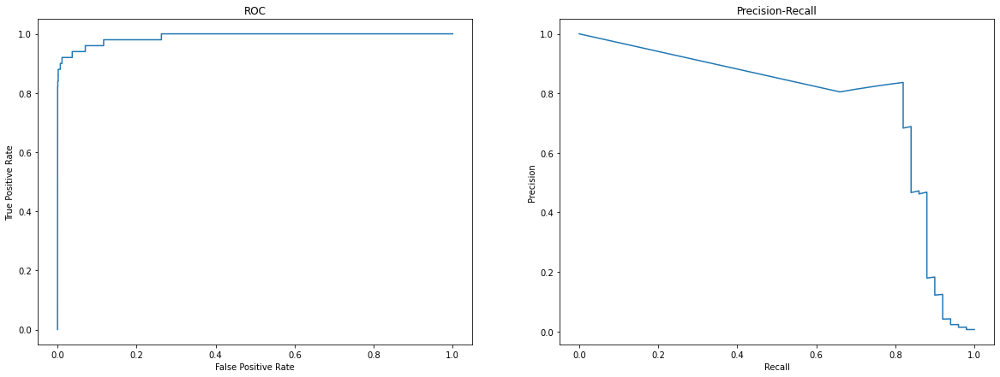

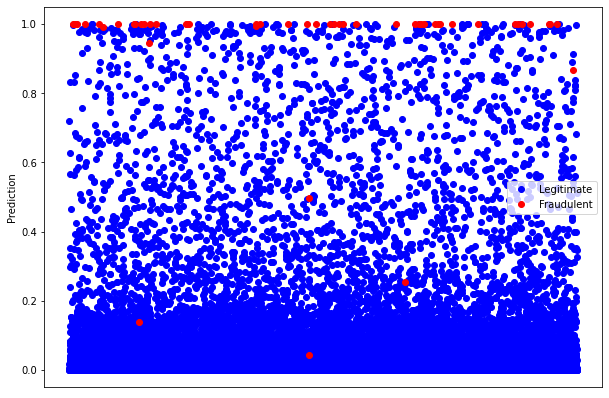

---------------------------------------------------------------
Model: "sequential_184"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_376 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_192 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_377 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Correct predictions for Train data: 97.065%
Train Precision: 98.829%
Train Recall: 95.260%
Correct predictions for Test data: 96.289%
Test Precision: 4.182%
Test Recall: 93.878%
Final Train auc: 99.412%
Final Train precision: 97.877%
Final Train recall: 93.679%


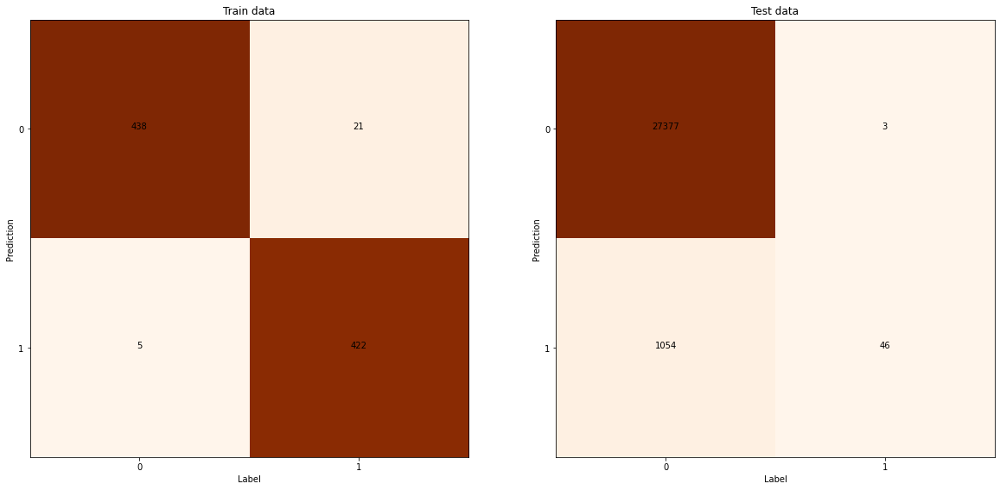

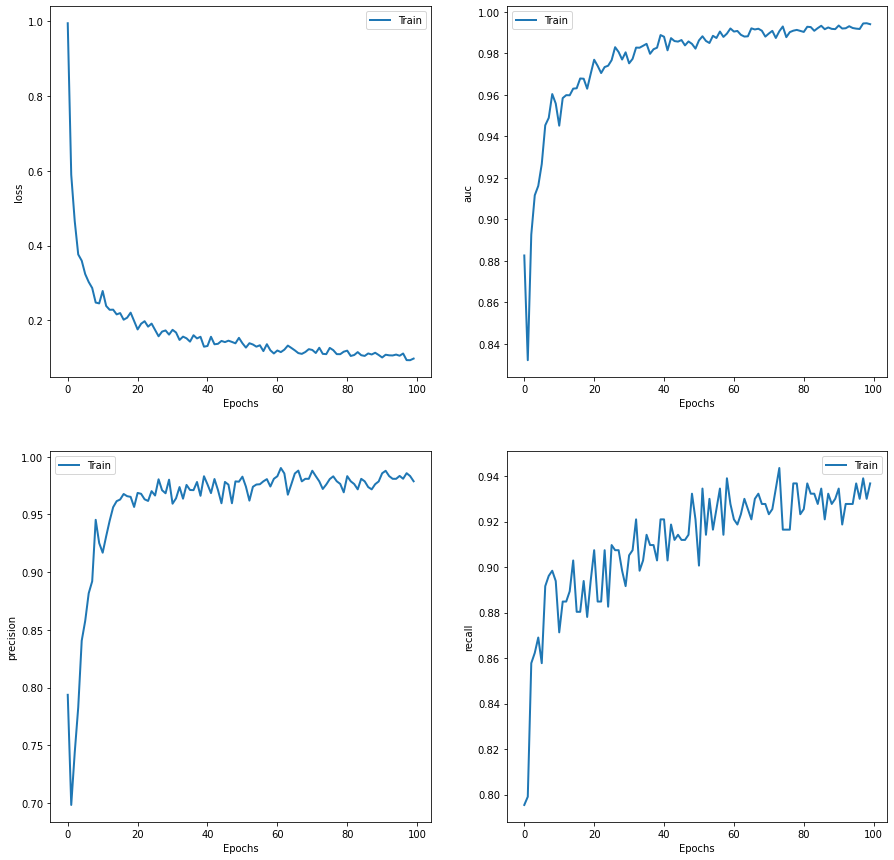

Area under ROC curve: 0.984
Area under Precision-Recall curve: 0.744
F1 Score: 0.080


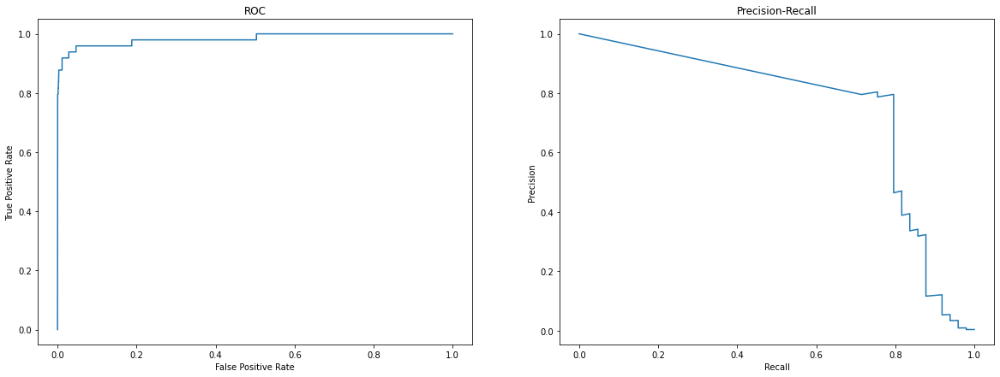

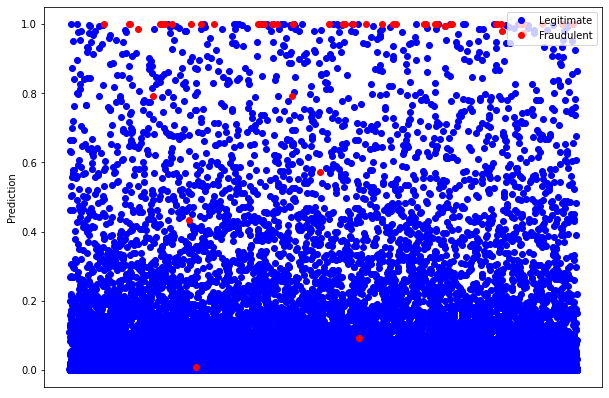

---------------------------------------------------------------
Model: "sequential_185"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_378 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_193 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_379 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Correct predictions for Train data: 96.275%
Train Precision: 98.810%
Train Recall: 93.679%
Correct predictions for Test data: 97.258%
Test Precision: 5.474%
Test Recall: 91.837%
Final Train auc: 99.177%
Final Train precision: 98.561%
Final Train recall: 92.777%


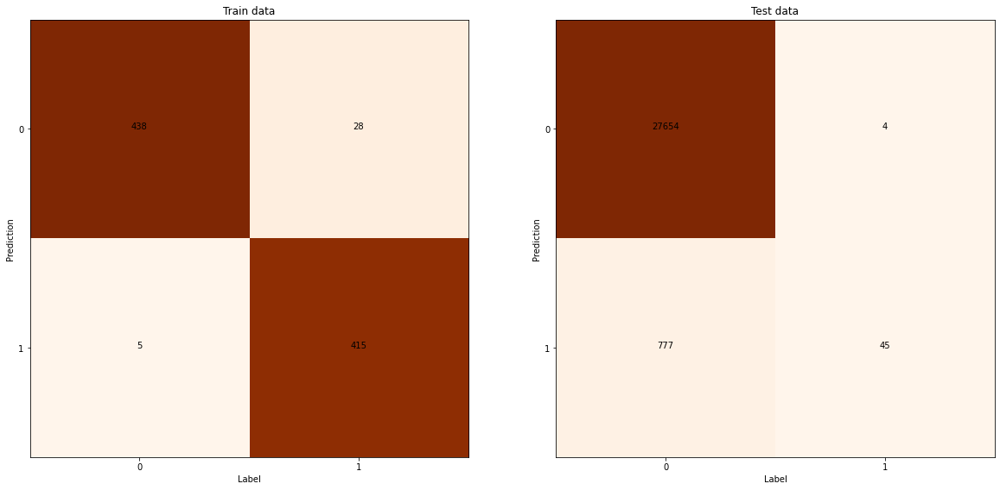

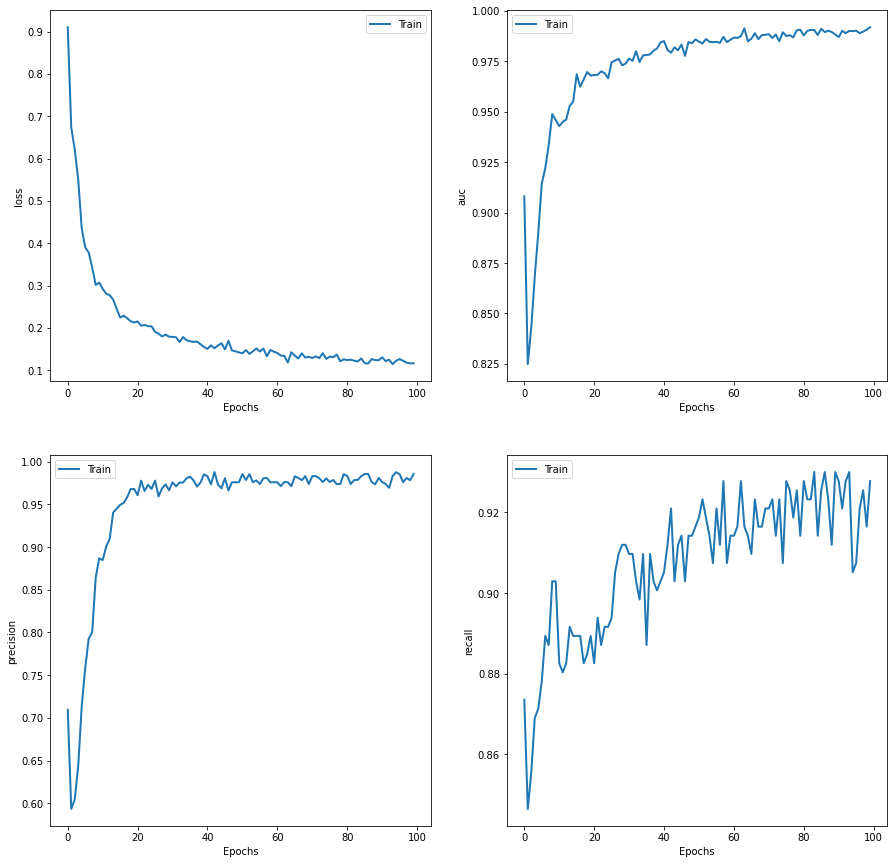

Area under ROC curve: 0.973
Area under Precision-Recall curve: 0.721
F1 Score: 0.103


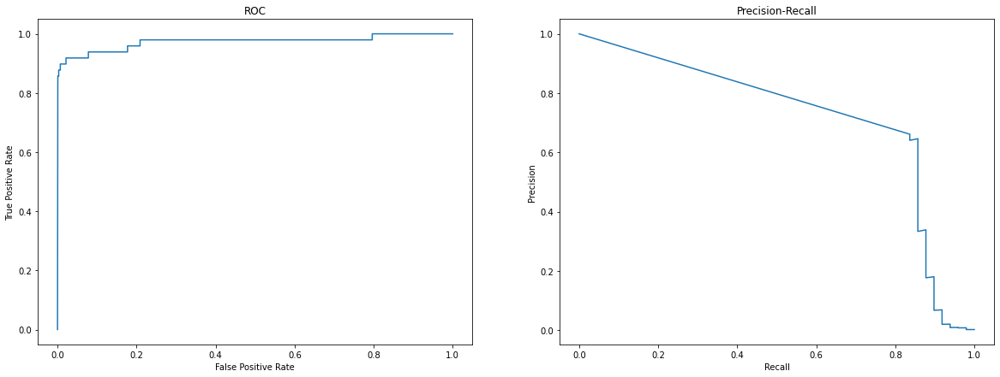

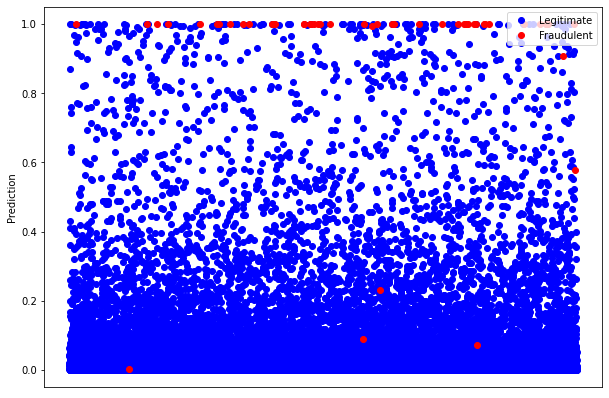

---------------------------------------------------------------
Model: "sequential_186"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_380 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_194 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_381 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Correct predictions for Train data: 96.953%
Train Precision: 99.289%
Train Recall: 94.582%
Correct predictions for Test data: 96.362%
Test Precision: 4.007%
Test Recall: 87.755%
Final Train auc: 99.281%
Final Train precision: 98.091%
Final Train recall: 92.777%


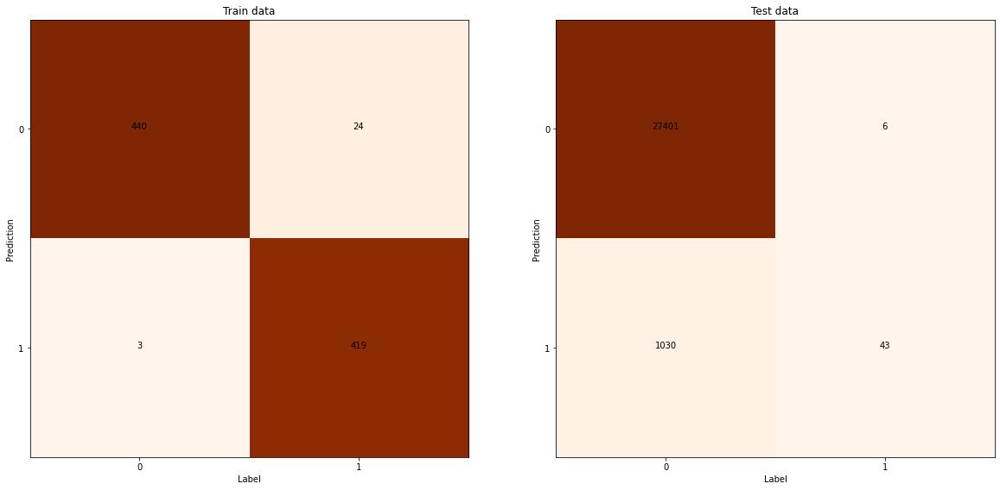

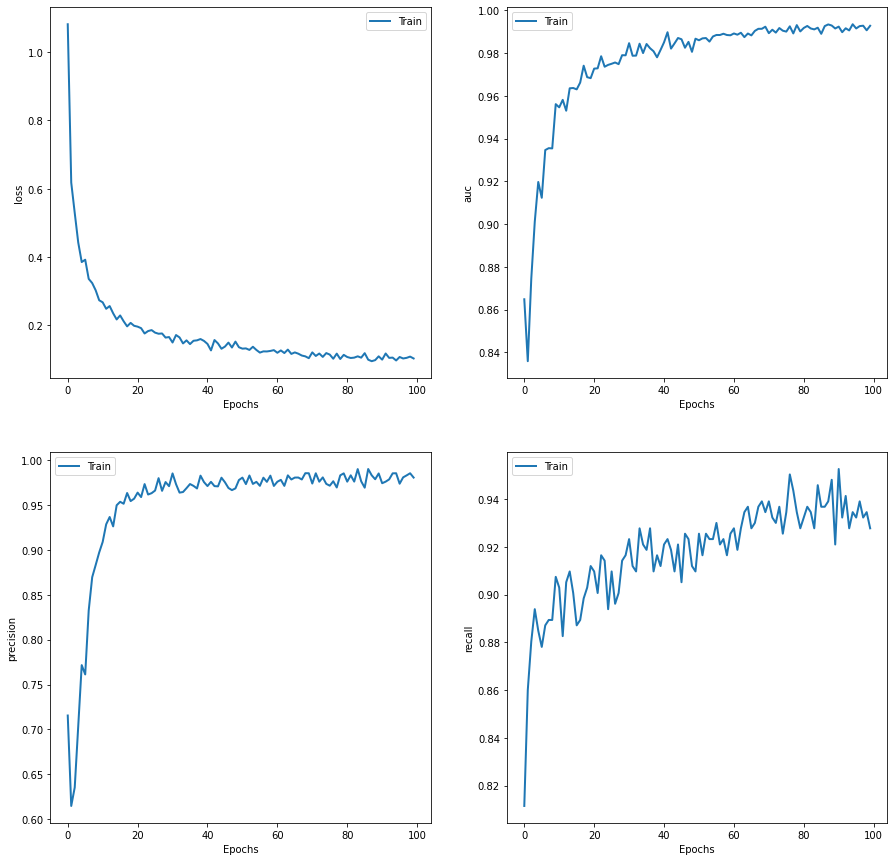

Area under ROC curve: 0.965
Area under Precision-Recall curve: 0.670
F1 Score: 0.077


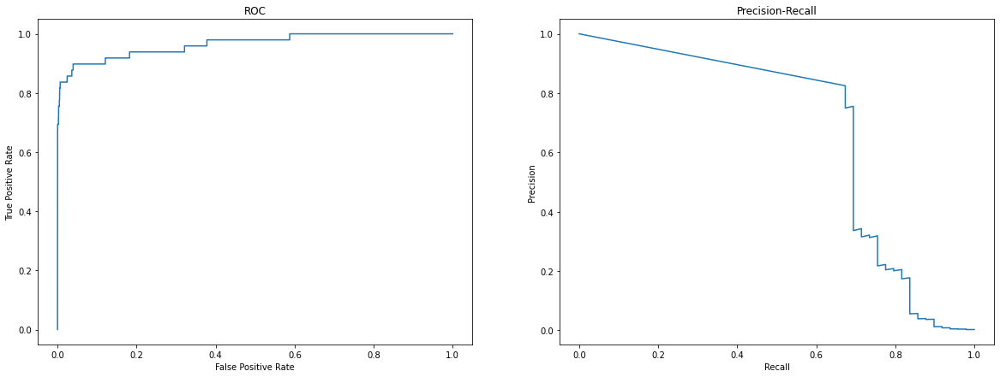

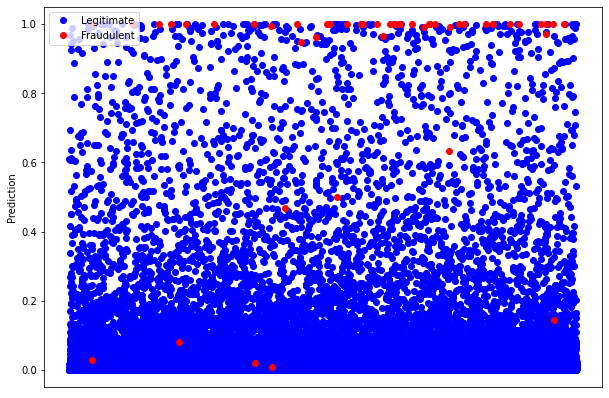

In [70]:
# Undersampling k-fold
undersamp_kfold = kfold(10, data, sampling="undersampling");

Final Train loss: 0.109979 (0.100345 - 0.119612)
Final Train auc: 0.991499 (0.989447 - 0.993551)
Final Train precision: 0.978341 (0.974099 - 0.982583)
Final Train recall: 0.927735 (0.921135 - 0.934334)


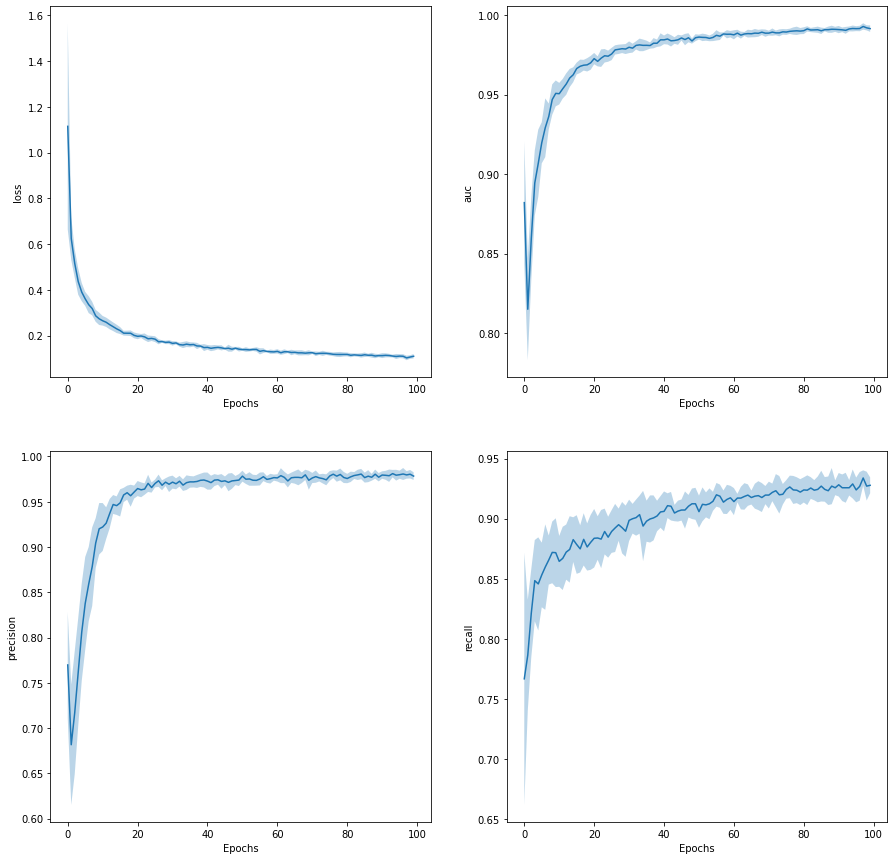

Test Precision: 0.042153 +/- 0.008342
Test Recall: 0.916667 +/- 0.033336


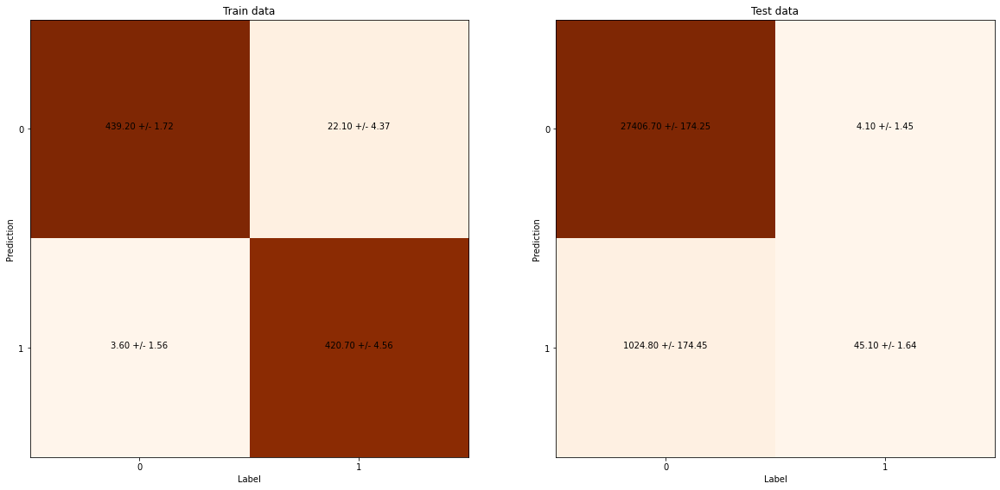

F1 Score: 0.083 +/- 0.013
Area under ROC curve: 0.969547 (0.946267 - 0.992826)
Area under Precision-Recall curve: 0.735901 (0.697279 - 0.774522)


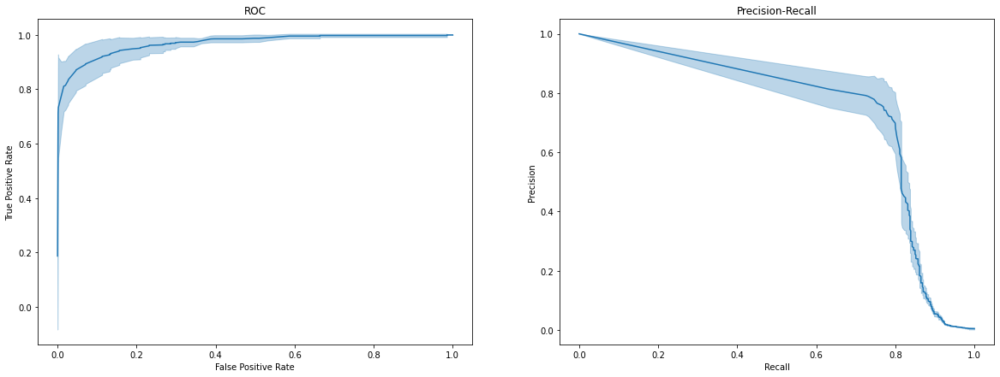

In [71]:
undersamp_stats = kfold_stats(*undersamp_kfold)

####Oversampling

---------------------------------------------------------------
Model: "sequential_187"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_382 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_195 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_383 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Correct predictions for Train data: 97.232%
Train Precision: 98.934%
Train Recall: 95.494%
Correct predictions for Test data: 98.940%
Test Precision: 13.333%
Test Recall: 93.878%
Final Train auc: 99.484%
Final Train precision: 97.698%
Final Train recall: 94.323%


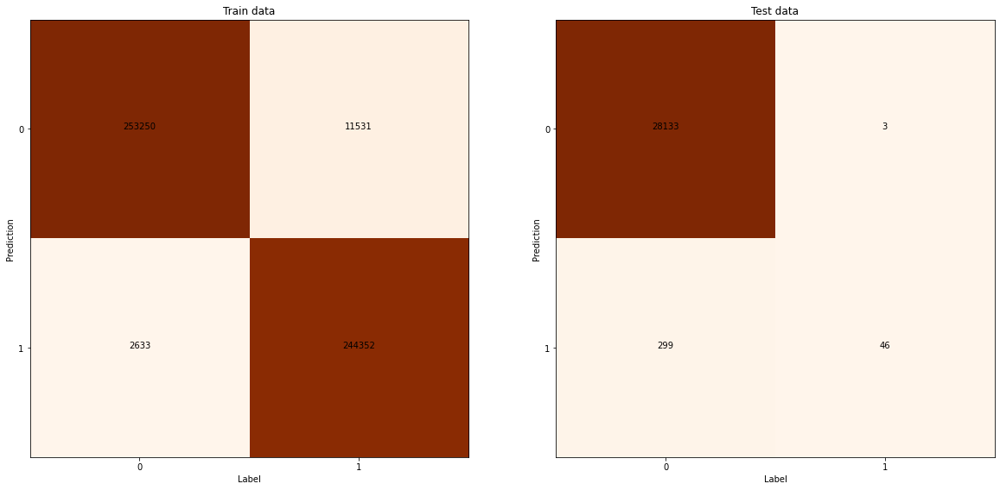

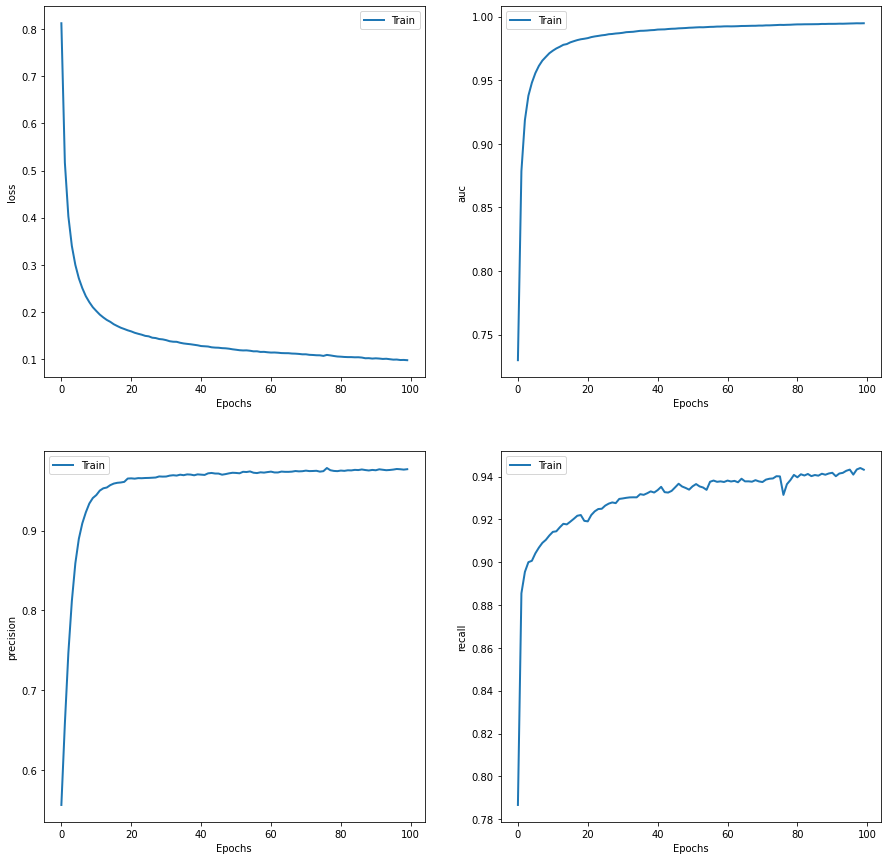

Area under ROC curve: 0.988
Area under Precision-Recall curve: 0.875
F1 Score: 0.234


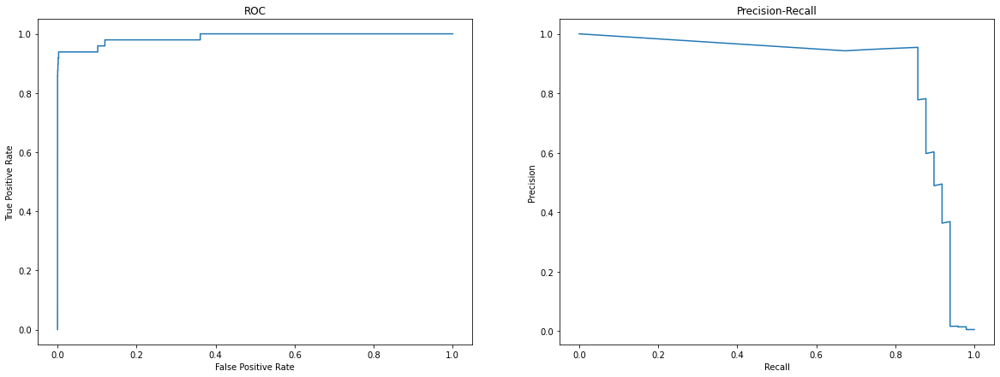

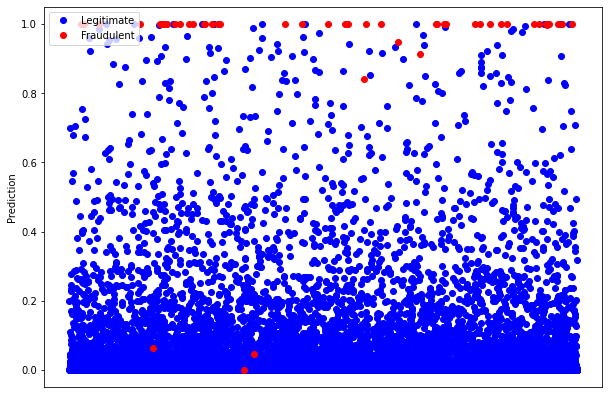

---------------------------------------------------------------
Model: "sequential_188"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_384 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_196 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_385 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Correct predictions for Train data: 97.784%
Train Precision: 98.689%
Train Recall: 96.855%
Correct predictions for Test data: 98.589%
Test Precision: 10.158%
Test Recall: 91.837%
Final Train auc: 99.525%
Final Train precision: 97.330%
Final Train recall: 94.893%


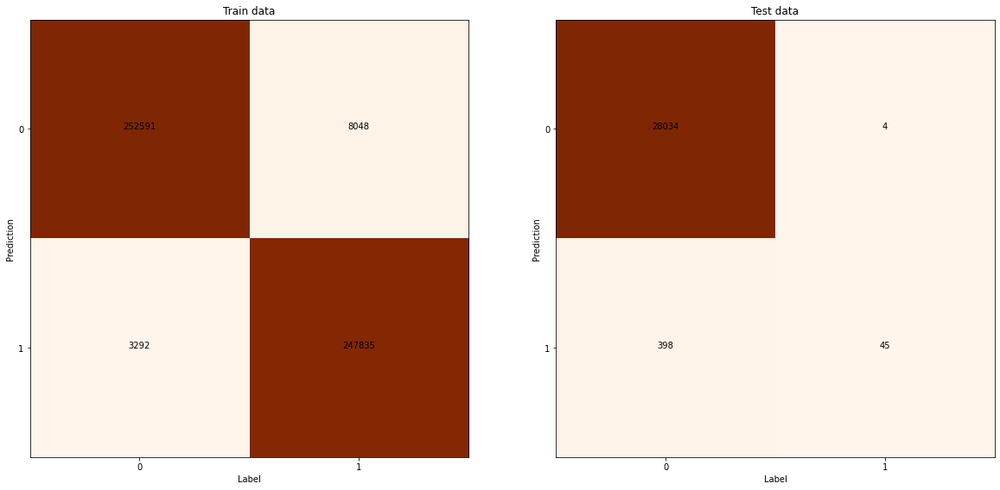

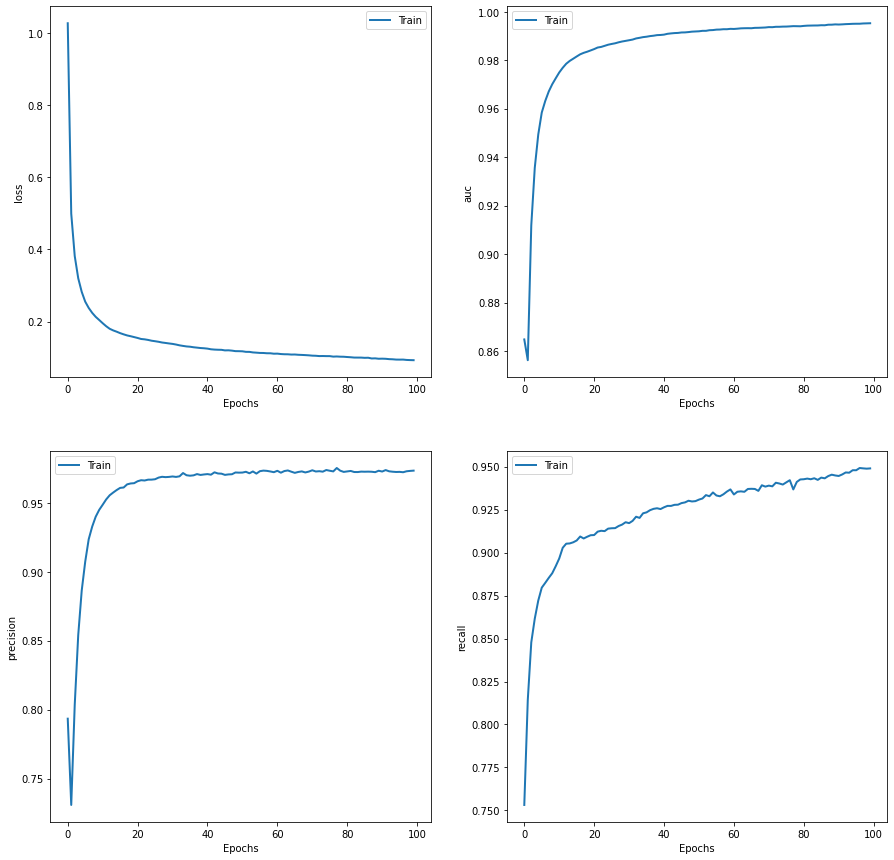

Area under ROC curve: 0.982
Area under Precision-Recall curve: 0.838
F1 Score: 0.183


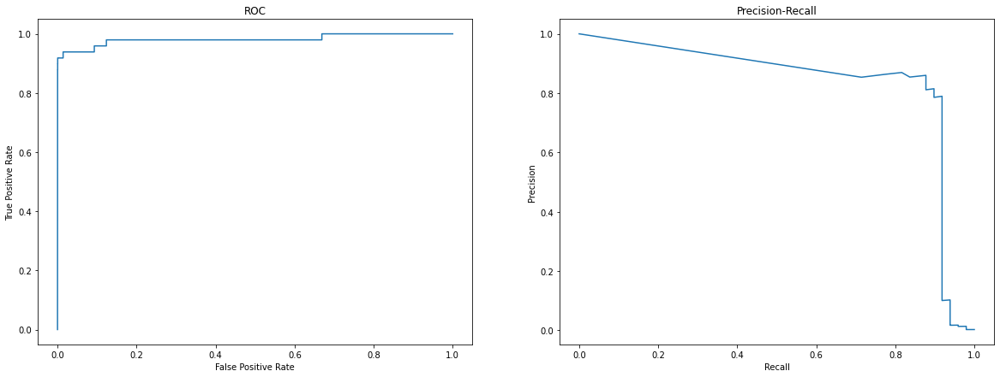

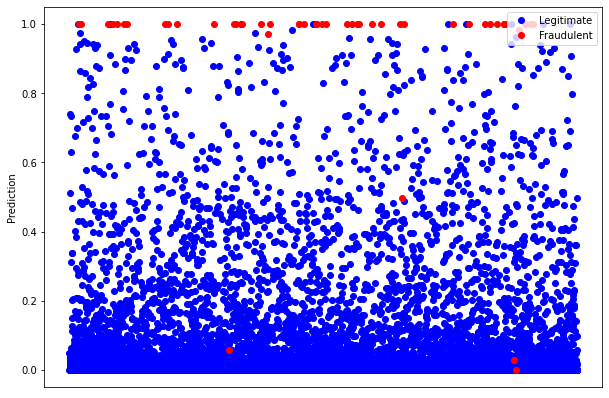

---------------------------------------------------------------
Model: "sequential_189"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_386 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_197 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_387 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Correct predictions for Train data: 97.974%
Train Precision: 98.816%
Train Recall: 97.112%
Correct predictions for Test data: 98.873%
Test Precision: 12.011%
Test Recall: 87.755%
Final Train auc: 99.601%
Final Train precision: 97.722%
Final Train recall: 95.335%


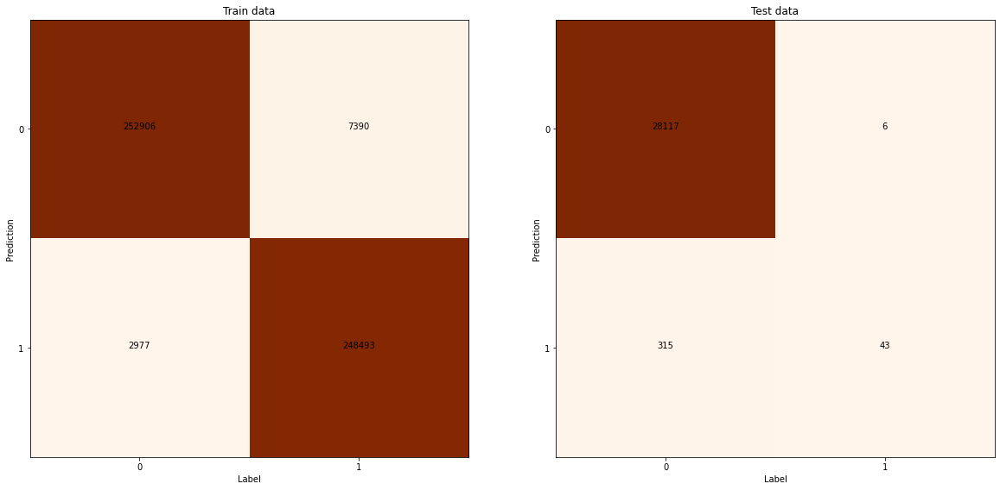

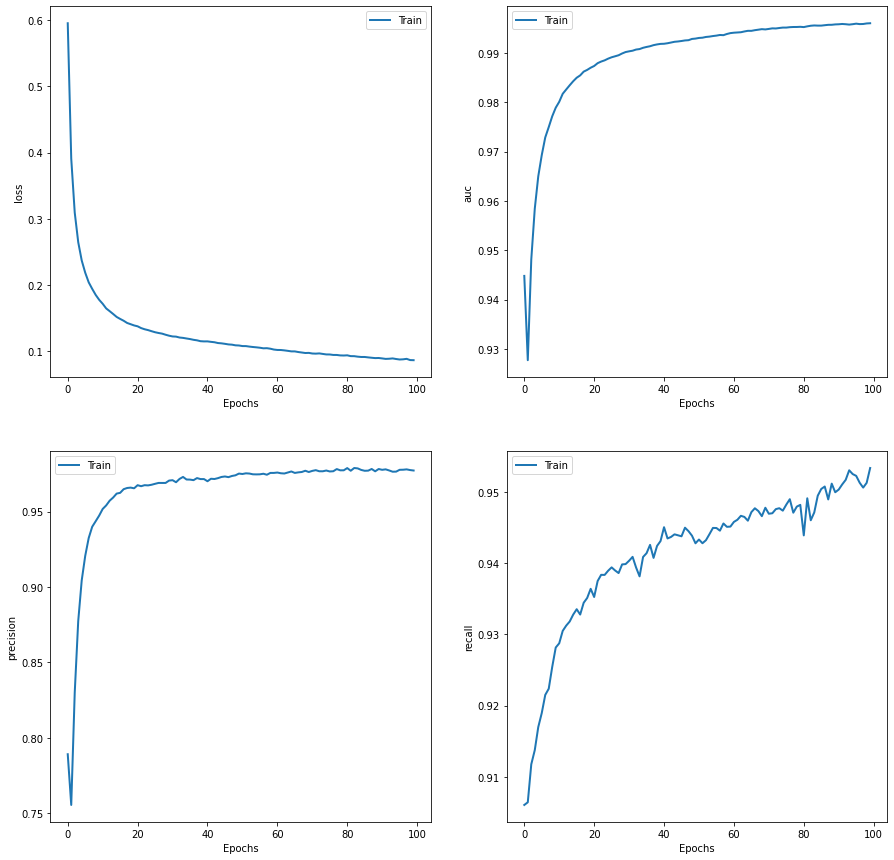

Area under ROC curve: 0.978
Area under Precision-Recall curve: 0.790
F1 Score: 0.211


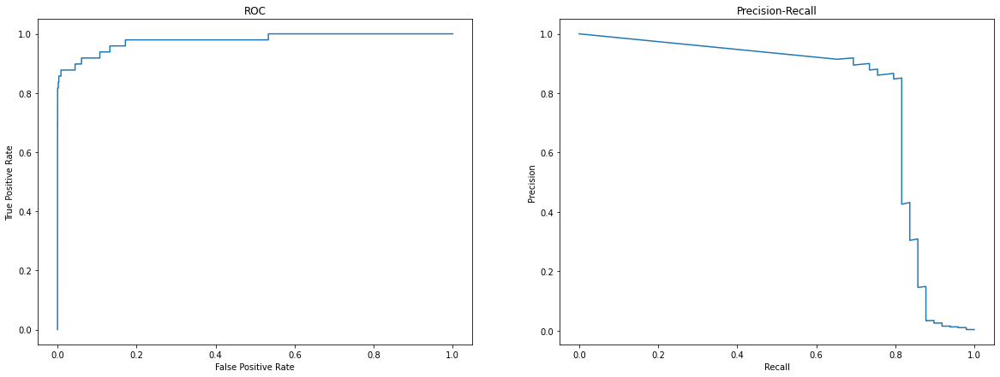

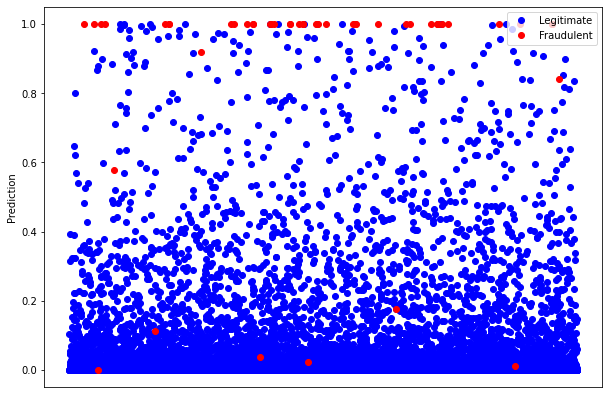

---------------------------------------------------------------
Model: "sequential_190"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_388 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_198 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_389 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Correct predictions for Train data: 96.805%
Train Precision: 98.524%
Train Recall: 95.033%
Correct predictions for Test data: 98.659%
Test Precision: 10.638%
Test Recall: 91.837%
Final Train auc: 99.419%
Final Train precision: 97.625%
Final Train recall: 93.720%


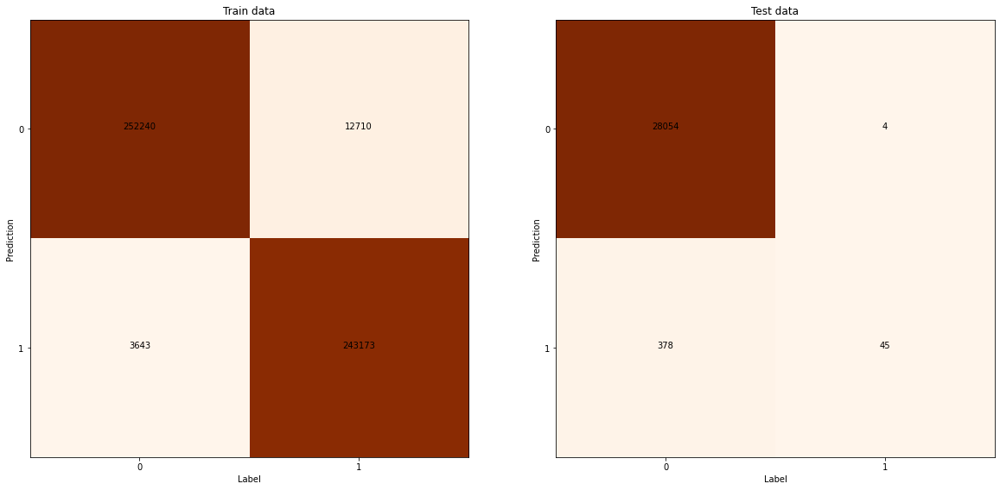

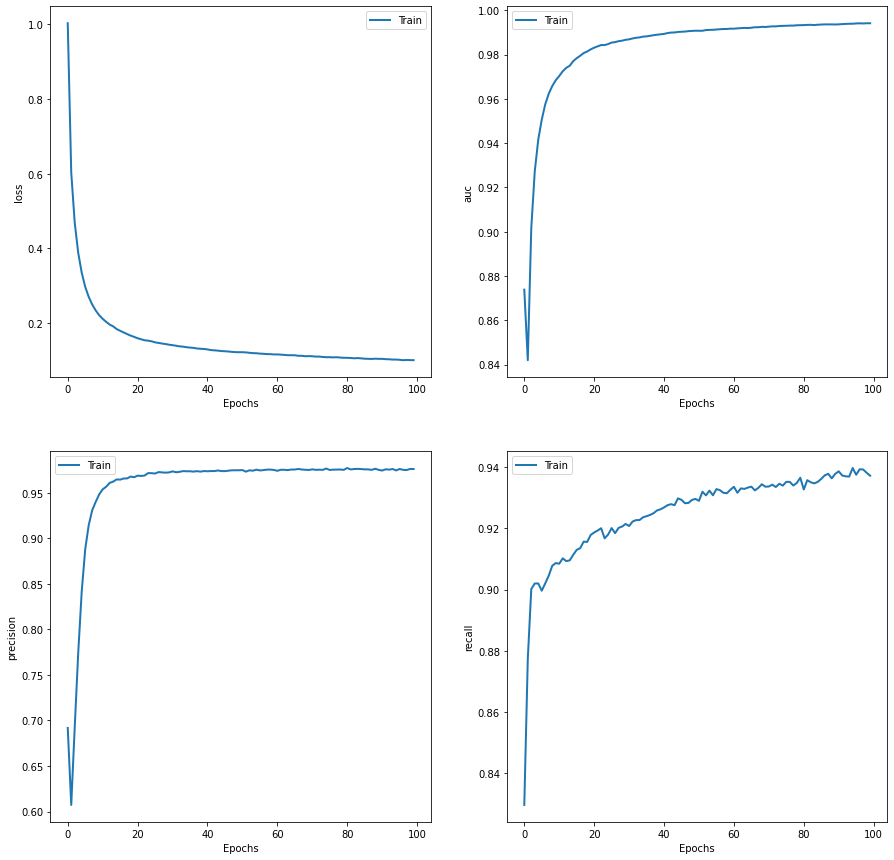

Area under ROC curve: 0.974
Area under Precision-Recall curve: 0.762
F1 Score: 0.191


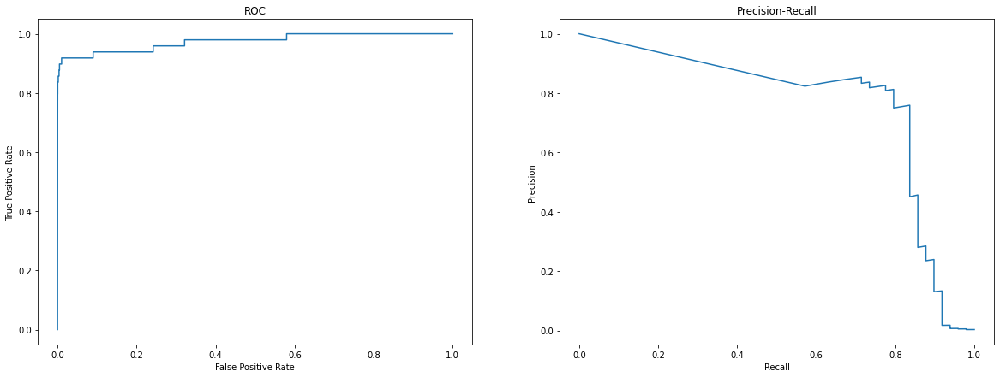

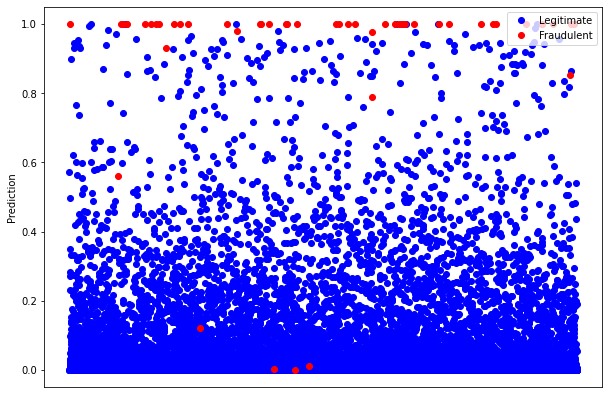

---------------------------------------------------------------
Model: "sequential_191"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_390 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_199 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_391 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Correct predictions for Train data: 97.606%
Train Precision: 98.799%
Train Recall: 96.384%
Correct predictions for Test data: 98.785%
Test Precision: 11.227%
Test Recall: 87.755%
Final Train auc: 99.547%
Final Train precision: 97.684%
Final Train recall: 95.049%


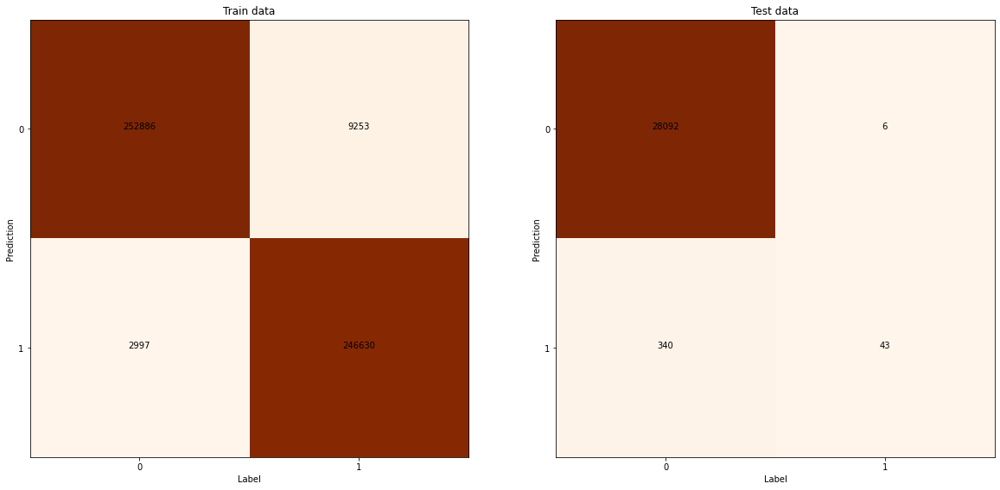

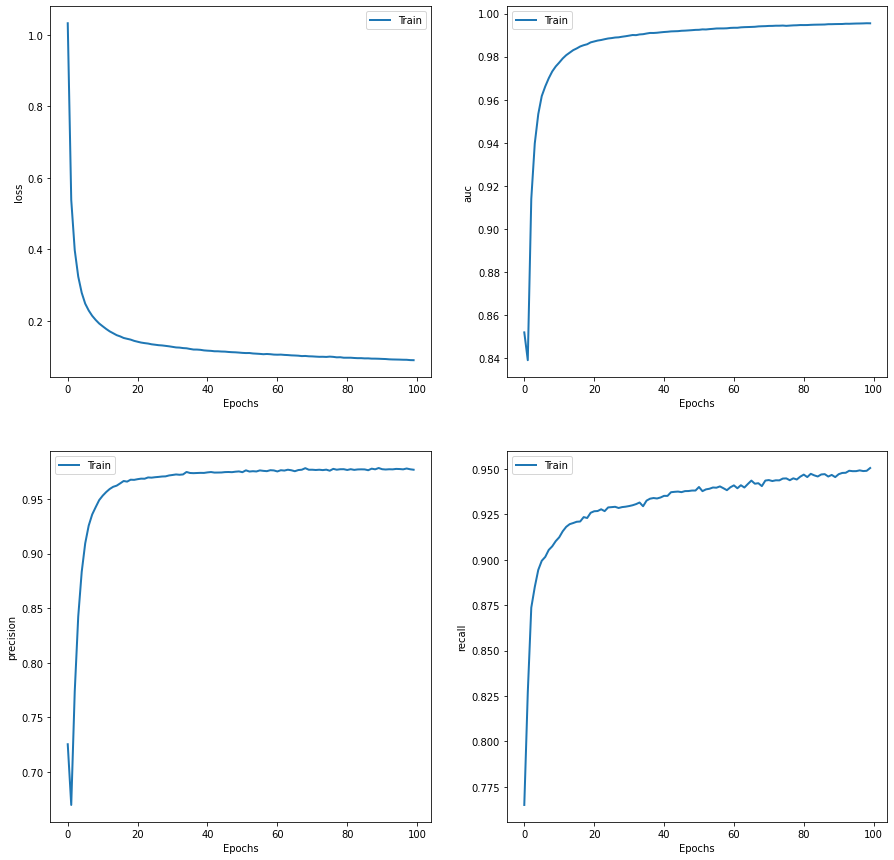

Area under ROC curve: 0.986
Area under Precision-Recall curve: 0.779
F1 Score: 0.199


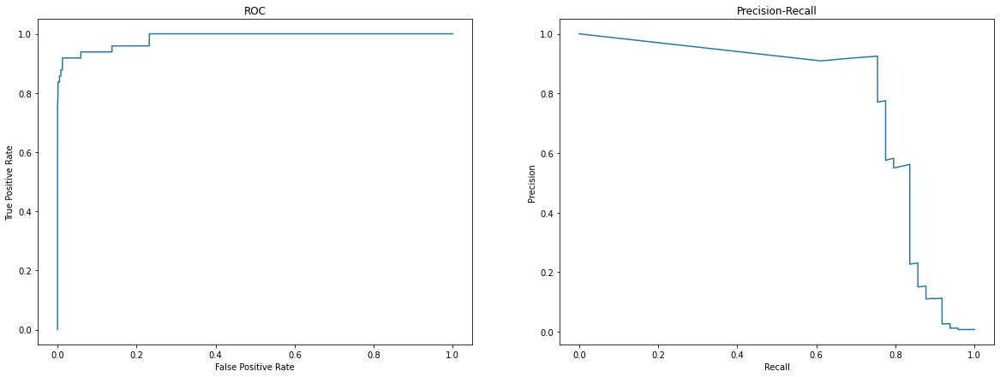

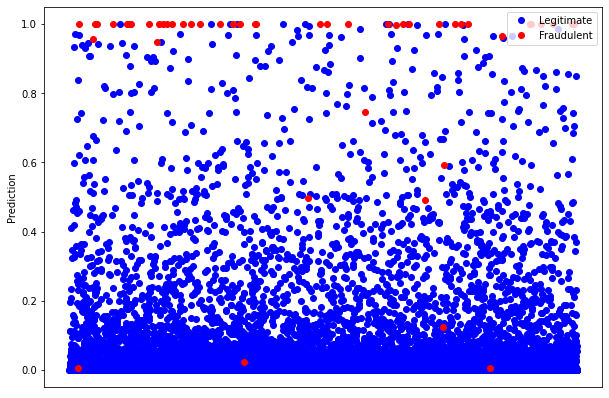

---------------------------------------------------------------
Model: "sequential_192"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_392 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_200 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_393 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Correct predictions for Train data: 98.244%
Train Precision: 98.915%
Train Recall: 97.557%
Correct predictions for Test data: 98.901%
Test Precision: 12.536%
Test Recall: 88.000%
Final Train auc: 99.633%
Final Train precision: 97.141%
Final Train recall: 95.993%


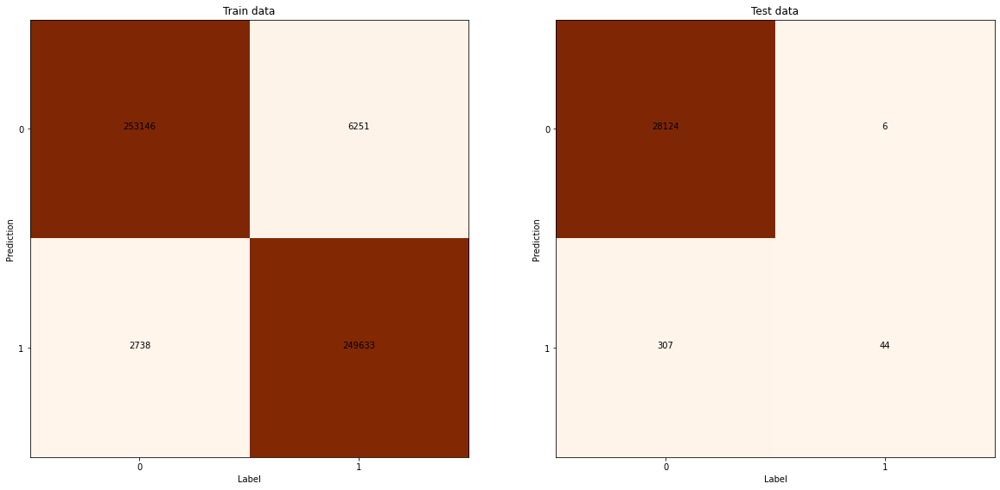

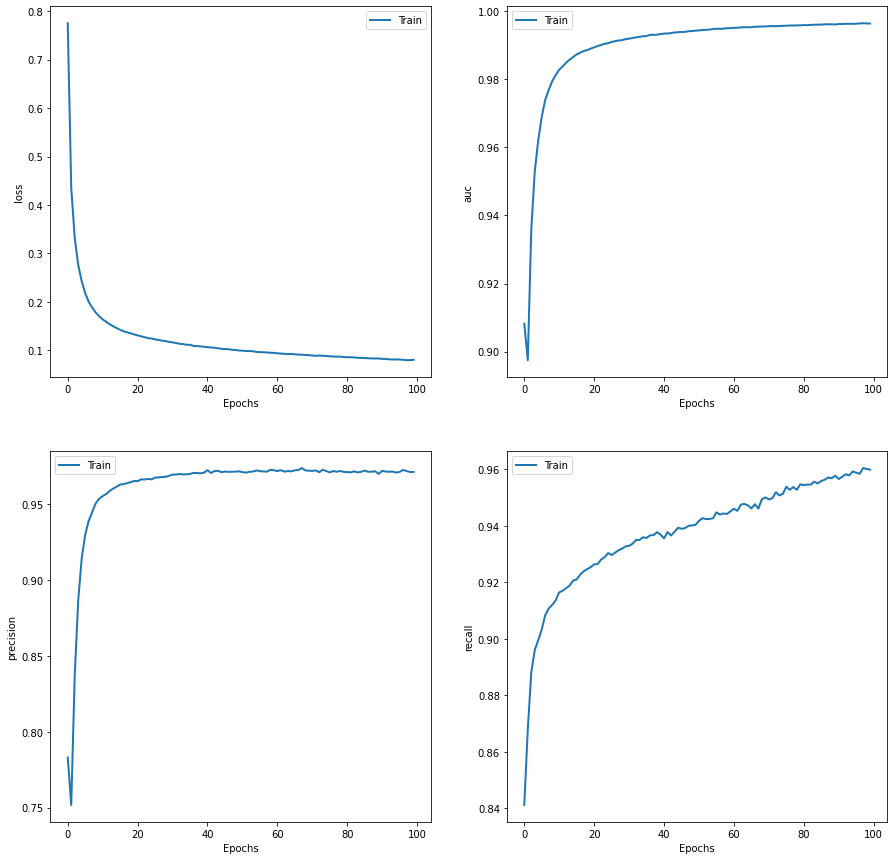

Area under ROC curve: 0.967
Area under Precision-Recall curve: 0.804
F1 Score: 0.219


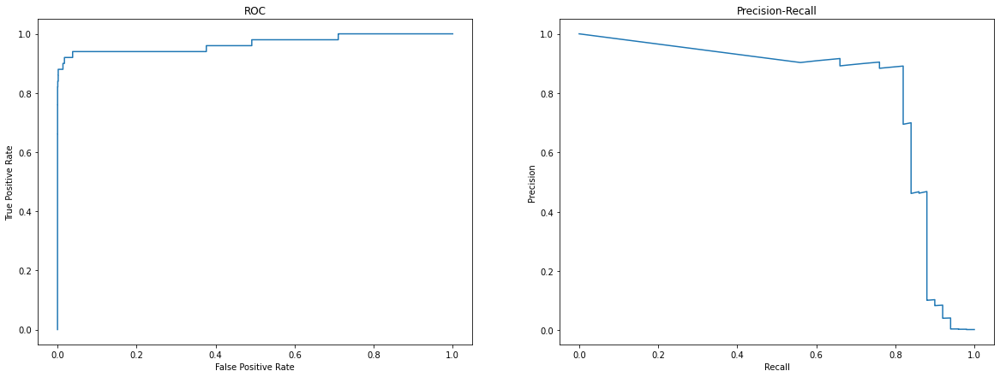

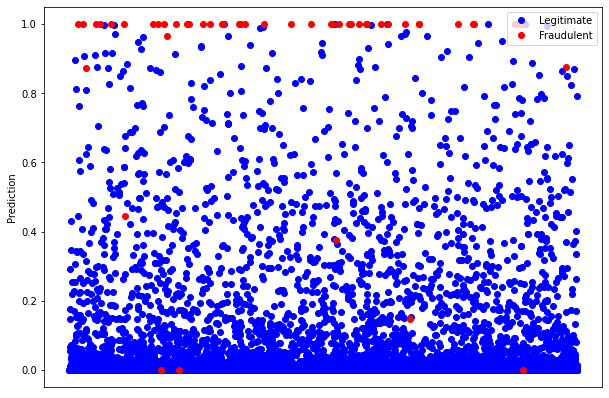

---------------------------------------------------------------
Model: "sequential_193"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_394 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_201 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_395 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Correct predictions for Train data: 97.391%
Train Precision: 98.758%
Train Recall: 95.989%
Correct predictions for Test data: 98.768%
Test Precision: 11.705%
Test Recall: 92.000%
Final Train auc: 99.492%
Final Train precision: 97.627%
Final Train recall: 94.550%


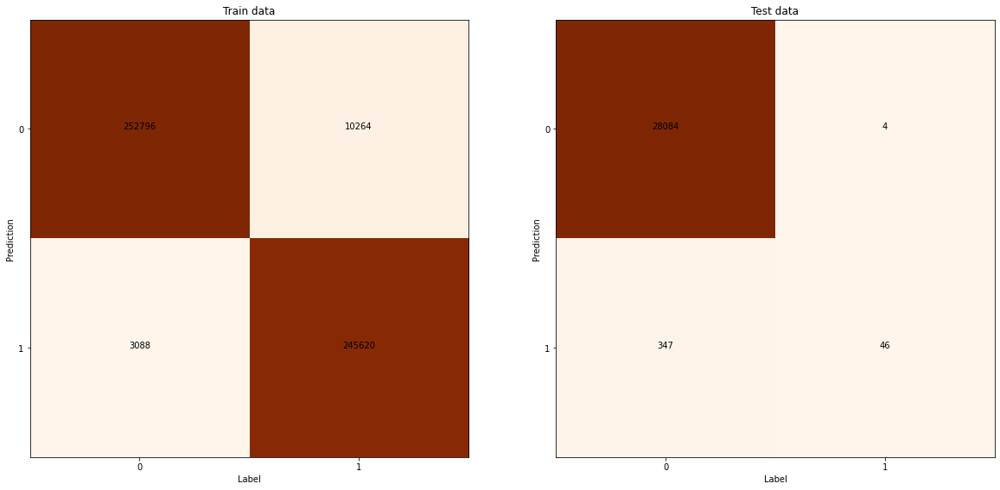

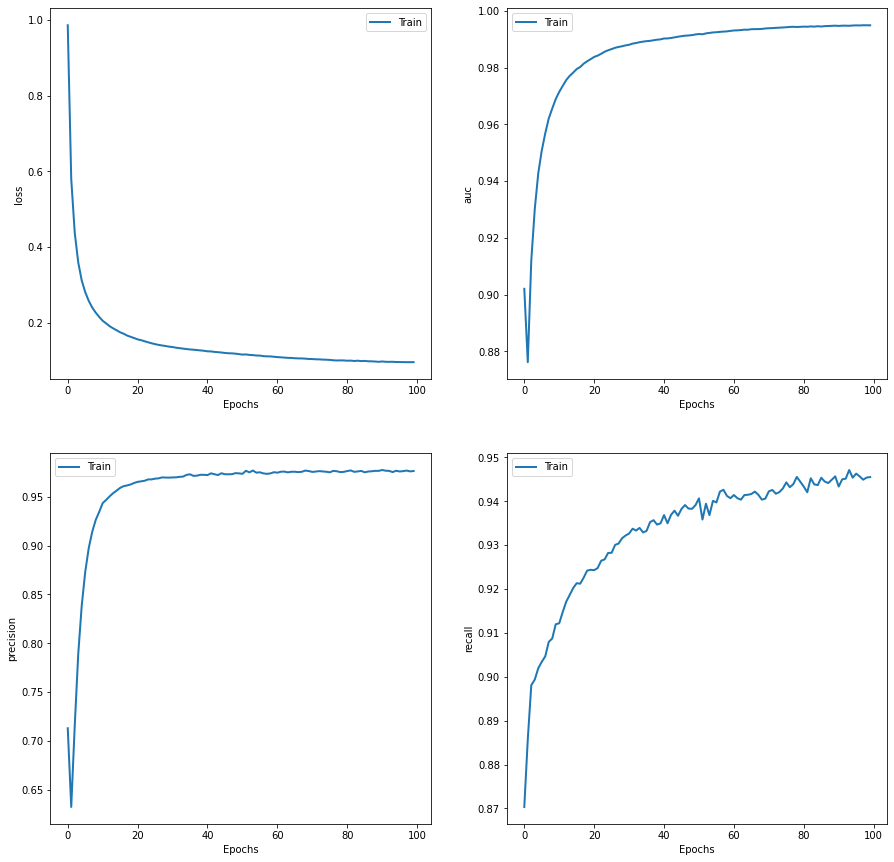

Area under ROC curve: 0.965
Area under Precision-Recall curve: 0.827
F1 Score: 0.208


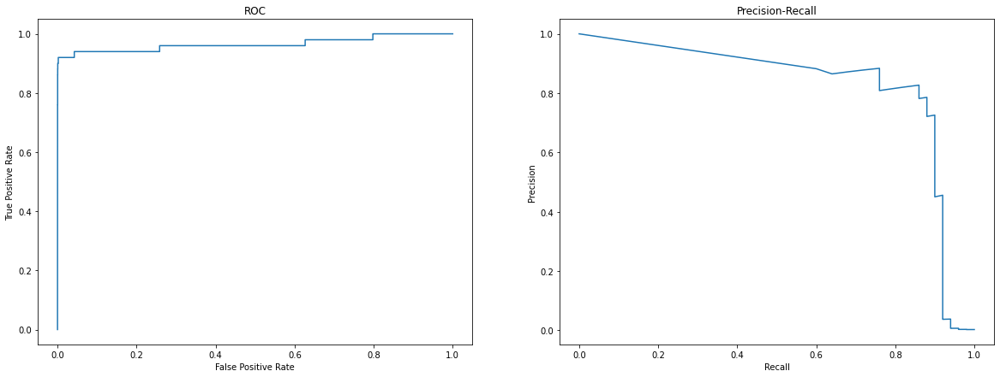

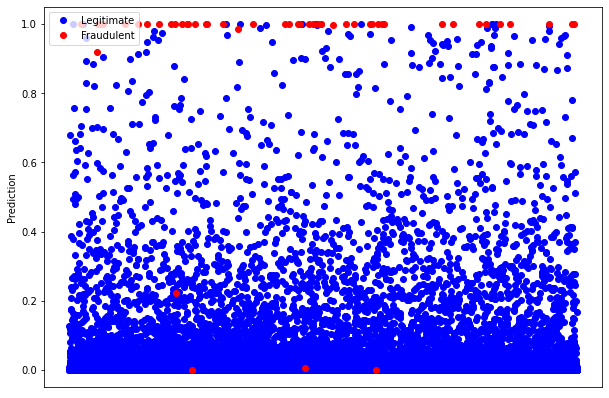

---------------------------------------------------------------
Model: "sequential_194"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_396 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_202 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_397 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Correct predictions for Train data: 96.917%
Train Precision: 98.697%
Train Recall: 95.089%
Correct predictions for Test data: 98.729%
Test Precision: 11.166%
Test Recall: 91.837%
Final Train auc: 99.375%
Final Train precision: 97.532%
Final Train recall: 93.934%


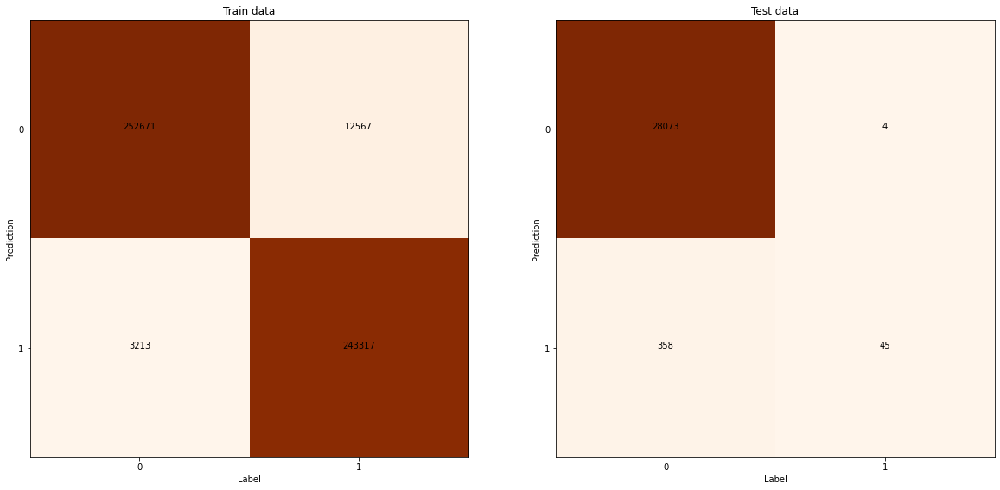

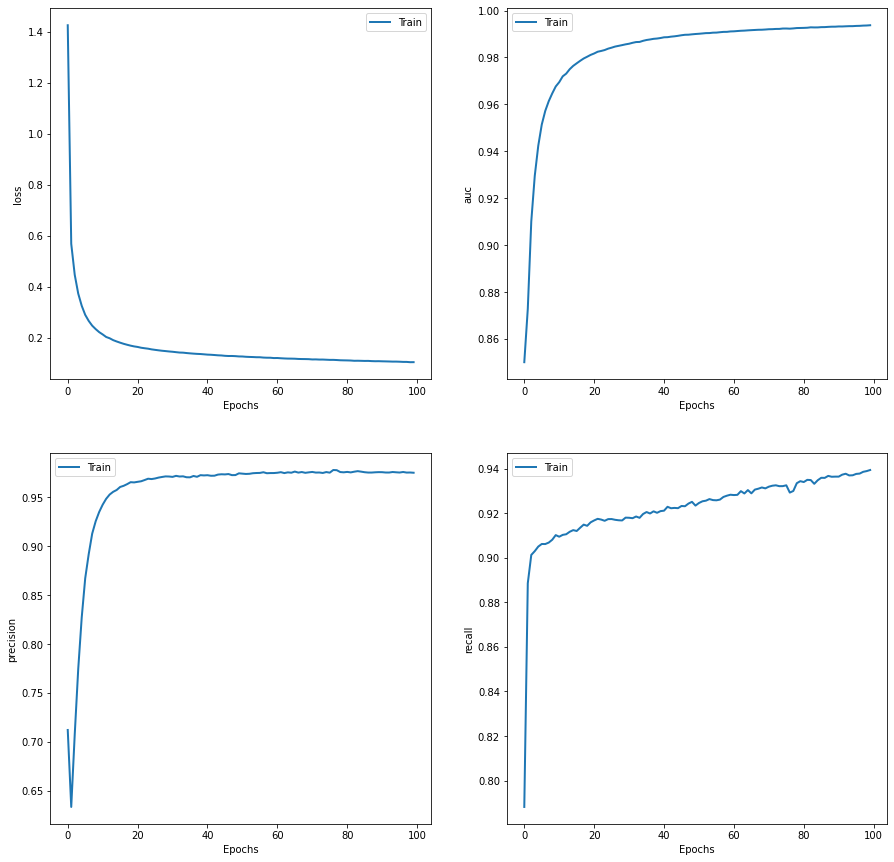

Area under ROC curve: 0.988
Area under Precision-Recall curve: 0.789
F1 Score: 0.199


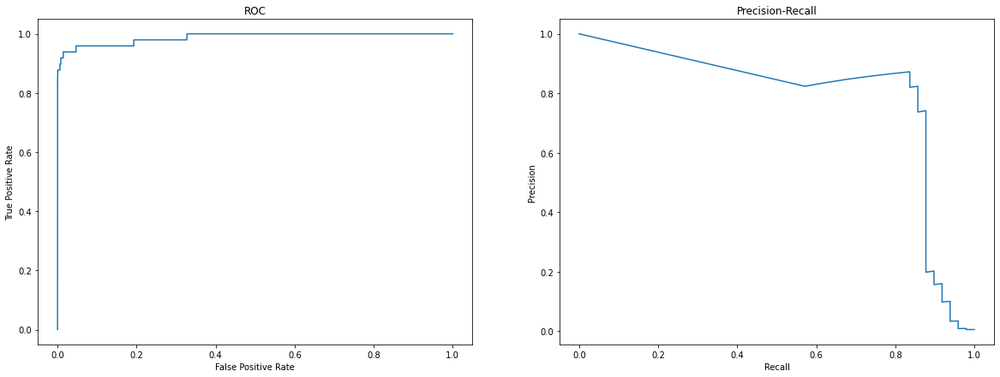

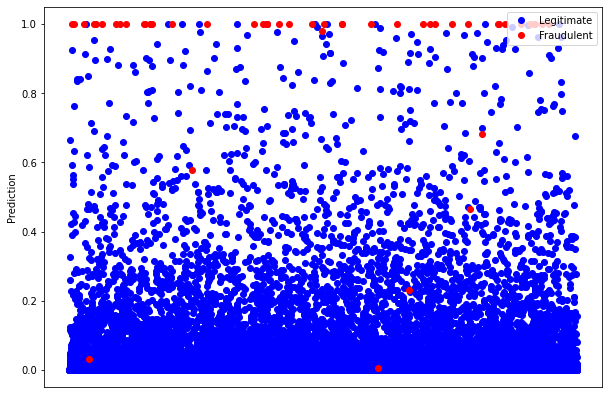

---------------------------------------------------------------
Model: "sequential_195"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_398 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_203 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_399 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Correct predictions for Train data: 98.783%
Train Precision: 98.448%
Train Recall: 99.129%
Correct predictions for Test data: 98.466%
Test Precision: 8.898%
Test Recall: 85.714%
Final Train auc: 99.579%
Final Train precision: 95.572%
Final Train recall: 98.470%


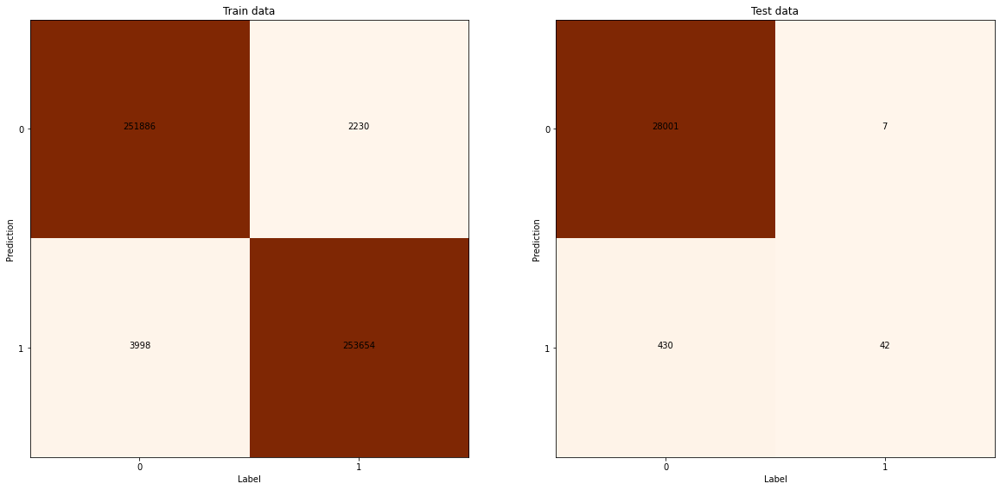

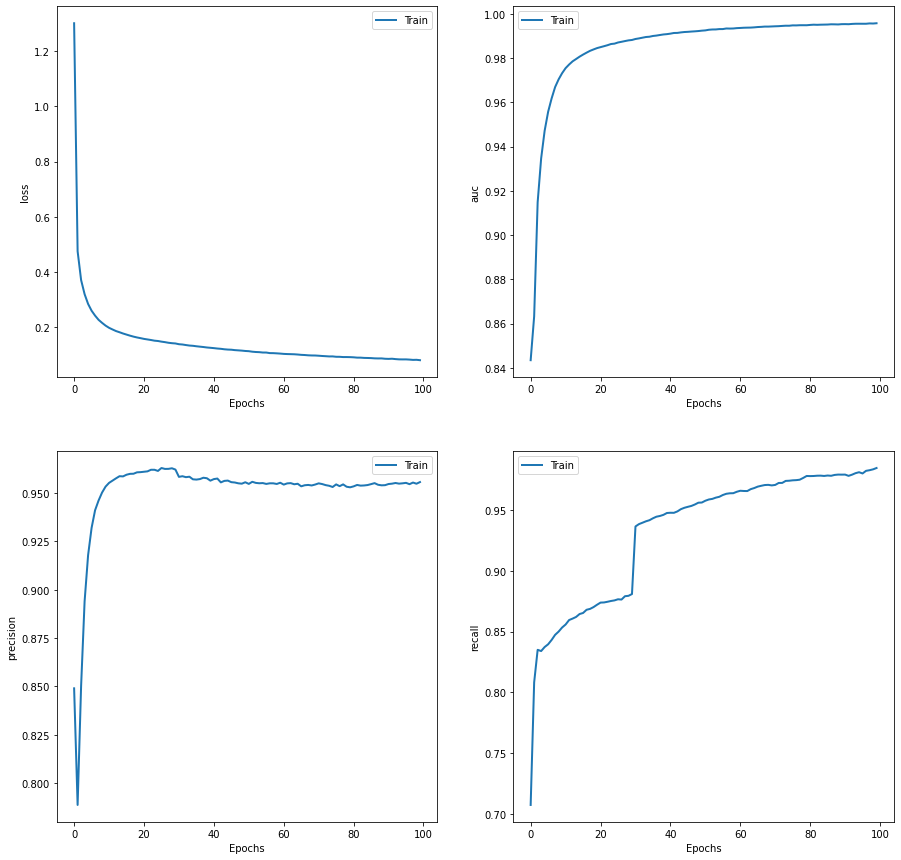

Area under ROC curve: 0.965
Area under Precision-Recall curve: 0.729
F1 Score: 0.161


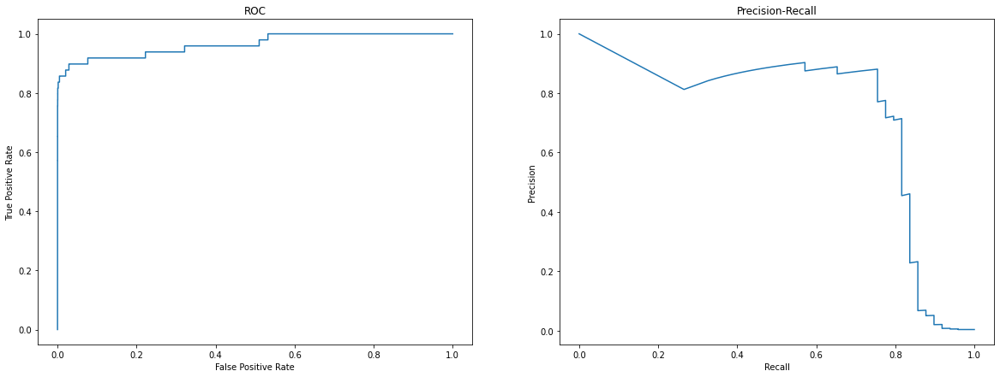

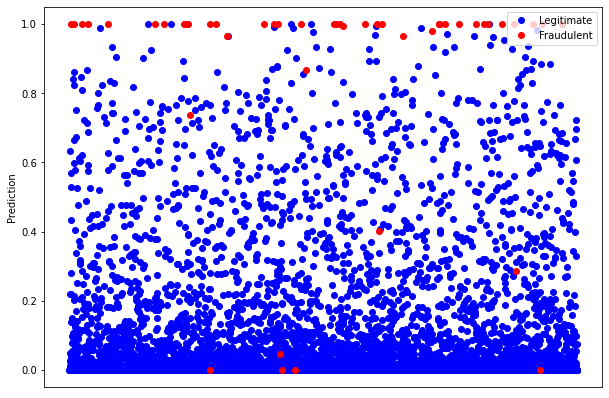

---------------------------------------------------------------
Model: "sequential_196"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_400 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_204 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_401 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Correct predictions for Train data: 97.691%
Train Precision: 98.785%
Train Recall: 96.569%
Correct predictions for Test data: 98.739%
Test Precision: 10.459%
Test Recall: 83.673%
Final Train auc: 99.628%
Final Train precision: 97.738%
Final Train recall: 95.304%


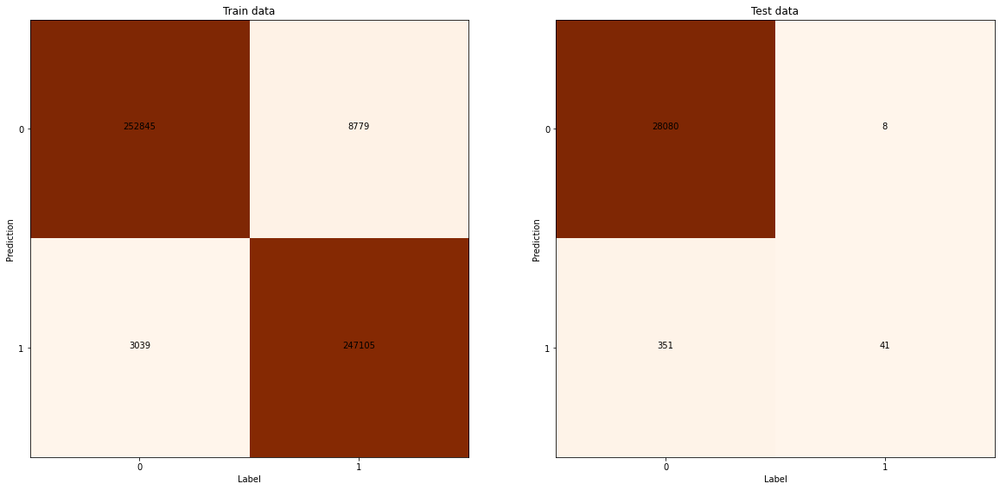

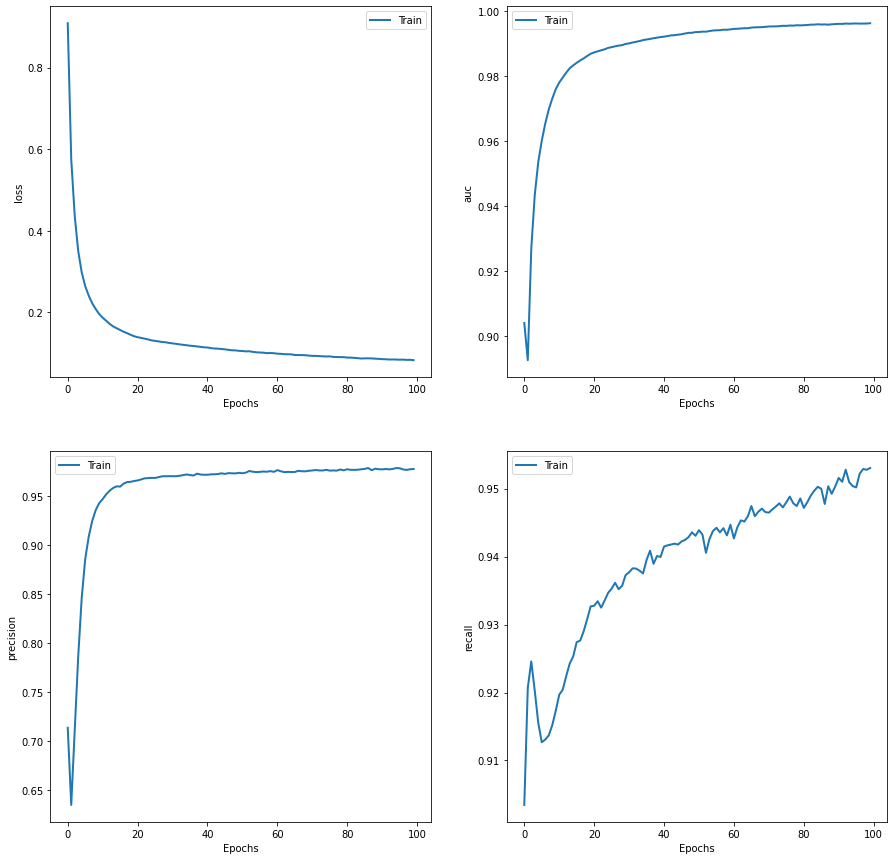

Area under ROC curve: 0.949
Area under Precision-Recall curve: 0.694
F1 Score: 0.186


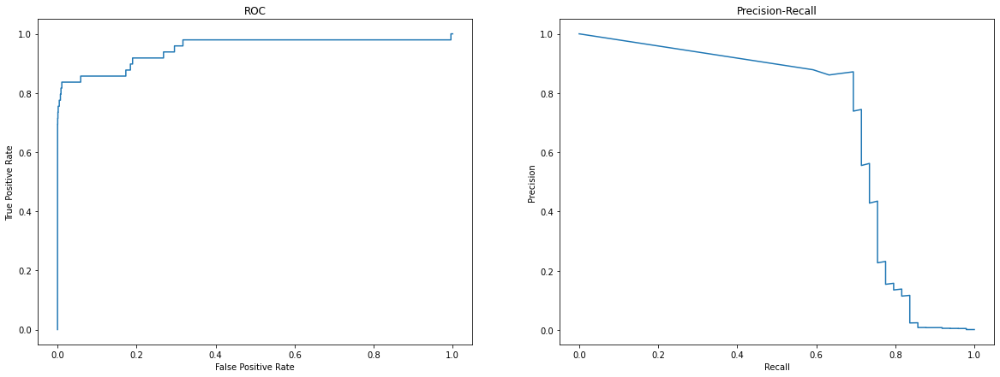

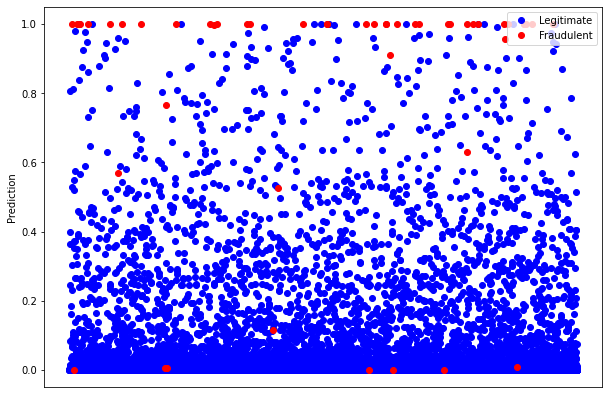

In [72]:
# Oversampling k-fold
oversamp_kfold = kfold(10, data, sampling="oversampling");

Final Train loss: 0.091231 (0.083246 - 0.099215)
Final Train auc: 0.995281 (0.994458 - 0.996104)
Final Train precision: 0.973670 (0.967416 - 0.979924)
Final Train recall: 0.951571 (0.938750 - 0.964391)


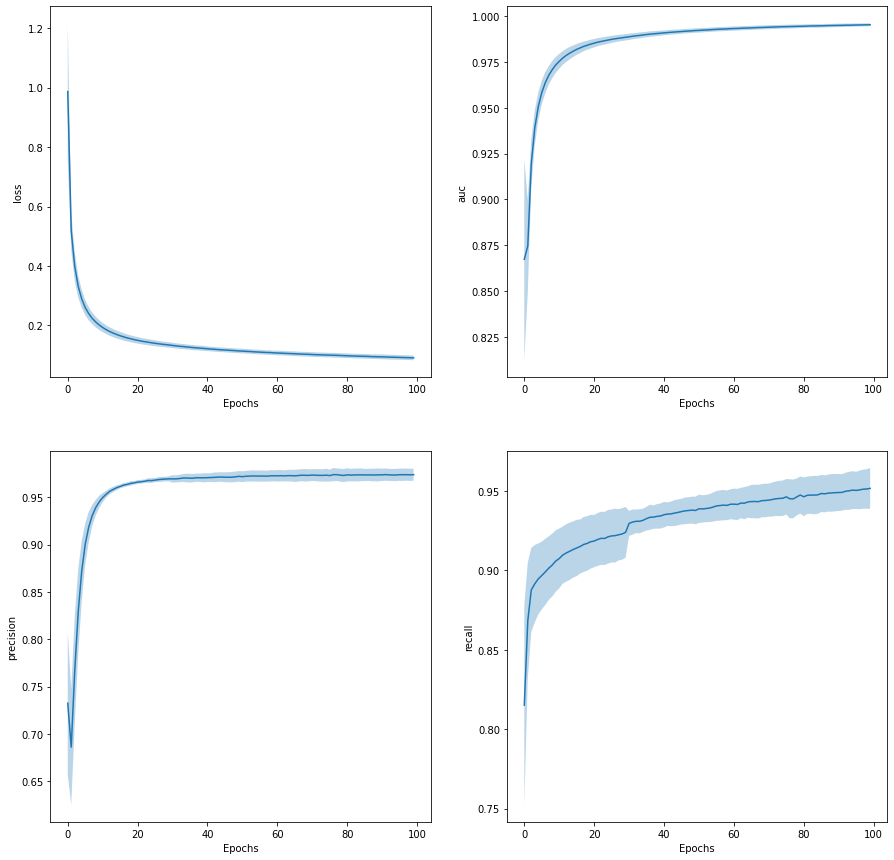

Test Precision: 0.111027 +/- 0.014570
Test Recall: 0.894309 +/- 0.032773


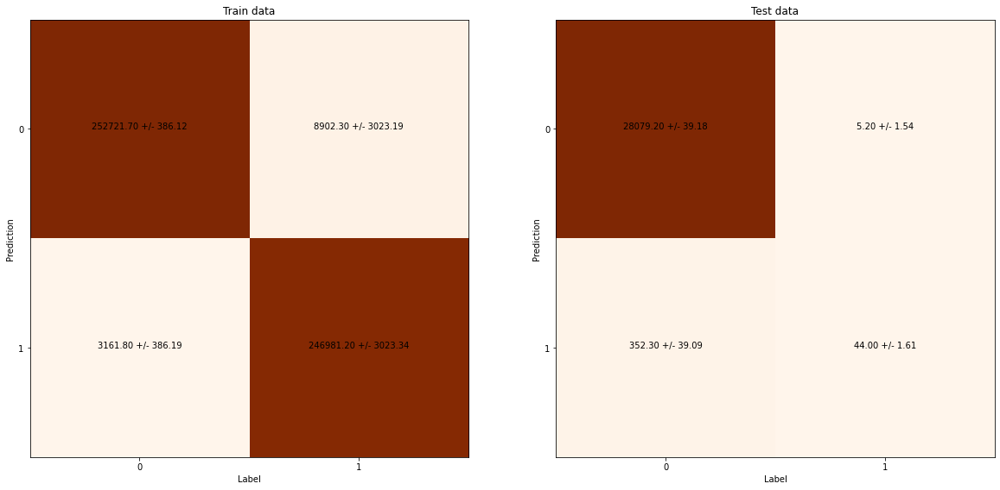

F1 Score: 0.199 +/- 0.019
Area under ROC curve: 0.965307 (0.941247 - 0.989367)
Area under Precision-Recall curve: 0.794816 (0.769304 - 0.820328)


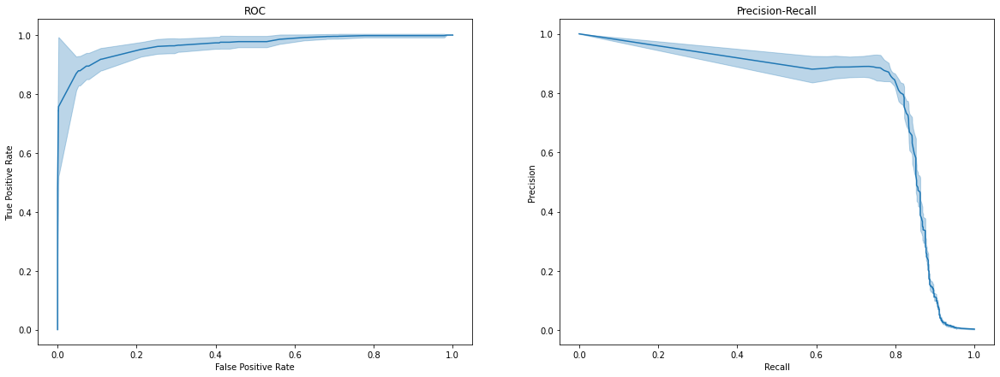

In [73]:
oversamp_stats = kfold_stats(*oversamp_kfold)

####Standard Sampling with Class Weights

---------------------------------------------------------------
Model: "sequential_197"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_402 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_205 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_403 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Correct predictions for Train data: 99.902%
Train Precision: 87.747%
Train Recall: 50.113%
Correct predictions for Test data: 99.923%
Test Precision: 84.615%
Test Recall: 67.347%
Final Train auc: 93.830%
Final Train precision: 83.871%
Final Train recall: 35.214%


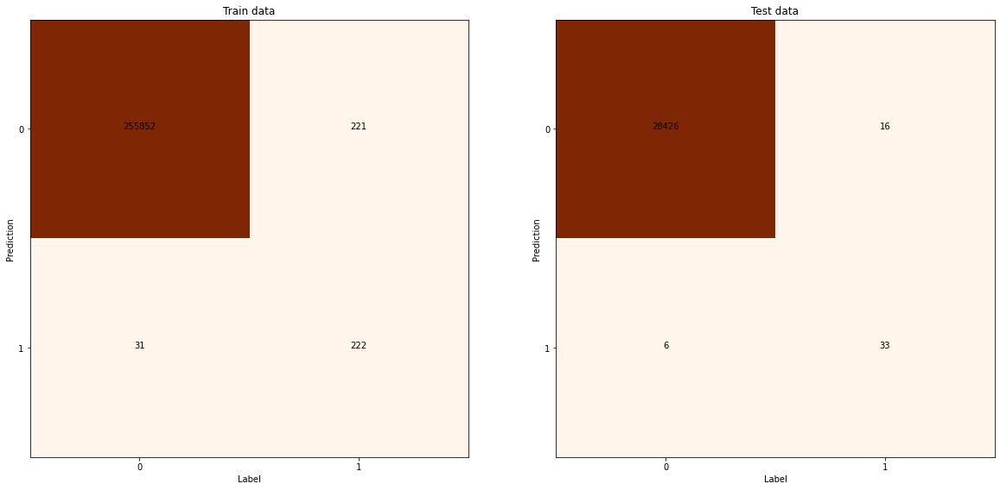

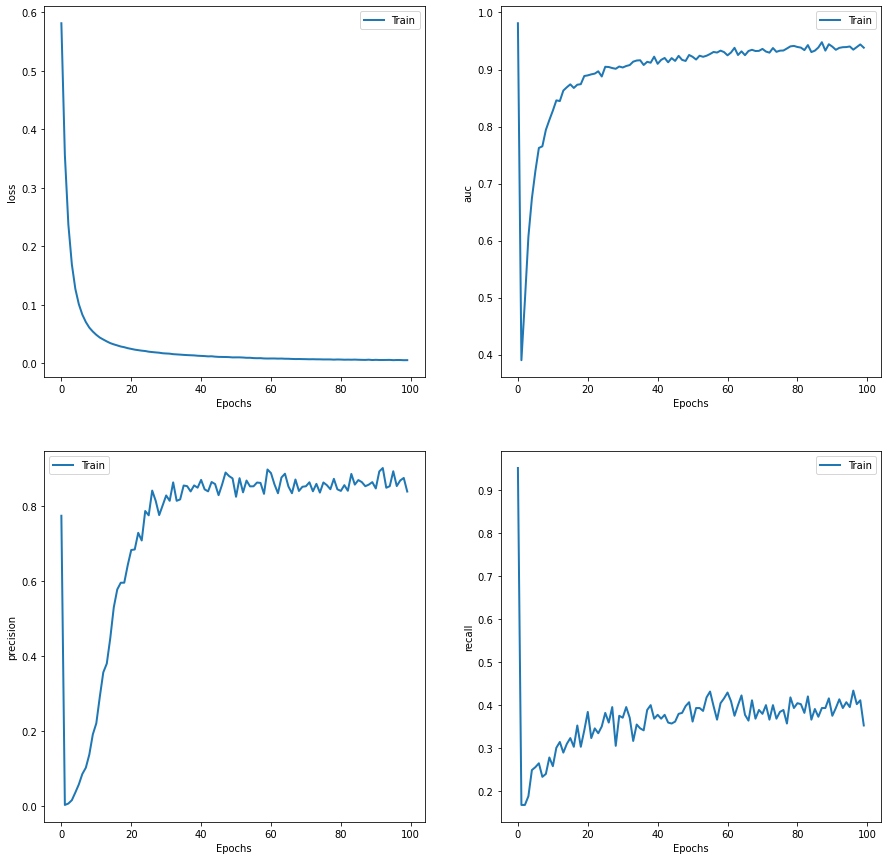

Area under ROC curve: 0.988
Area under Precision-Recall curve: 0.757
F1 Score: 0.750


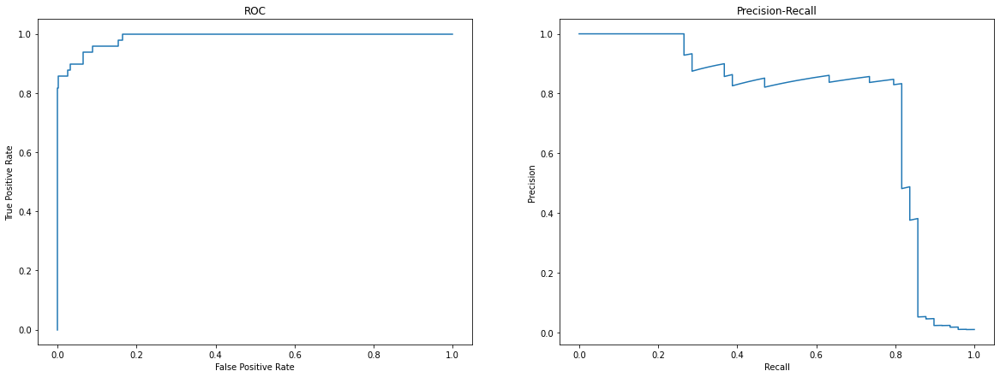

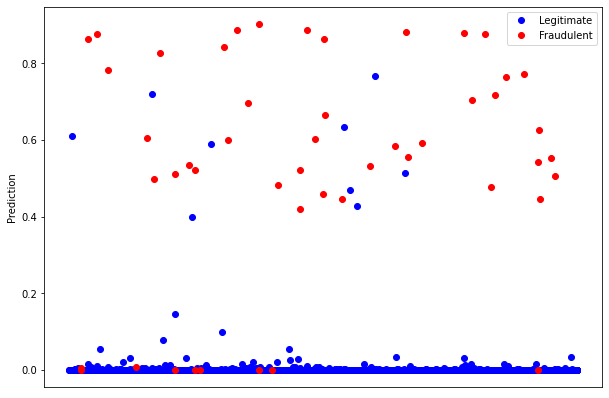

---------------------------------------------------------------
Model: "sequential_198"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_404 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_206 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_405 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Correct predictions for Train data: 99.943%
Train Precision: 88.010%
Train Recall: 77.878%
Correct predictions for Test data: 99.961%
Test Precision: 100.000%
Test Recall: 77.551%
Final Train auc: 94.361%
Final Train precision: 87.578%
Final Train recall: 63.657%


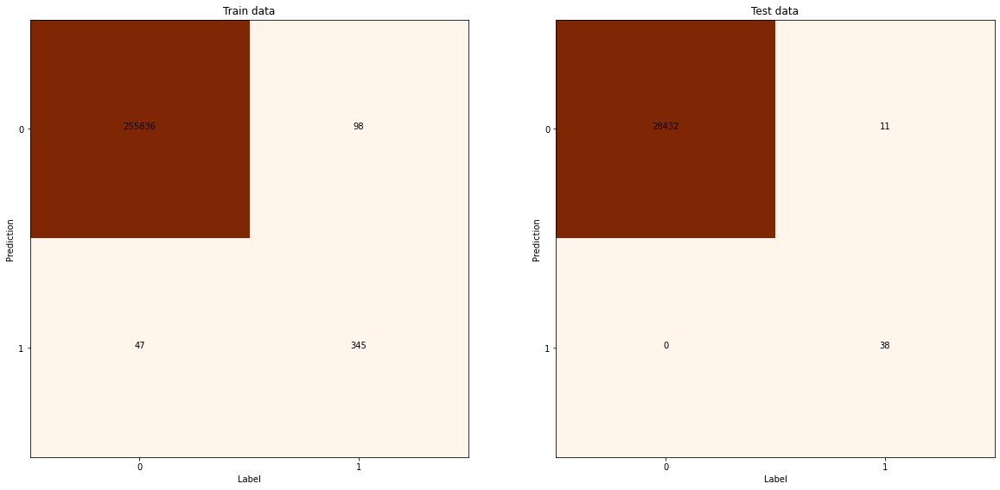

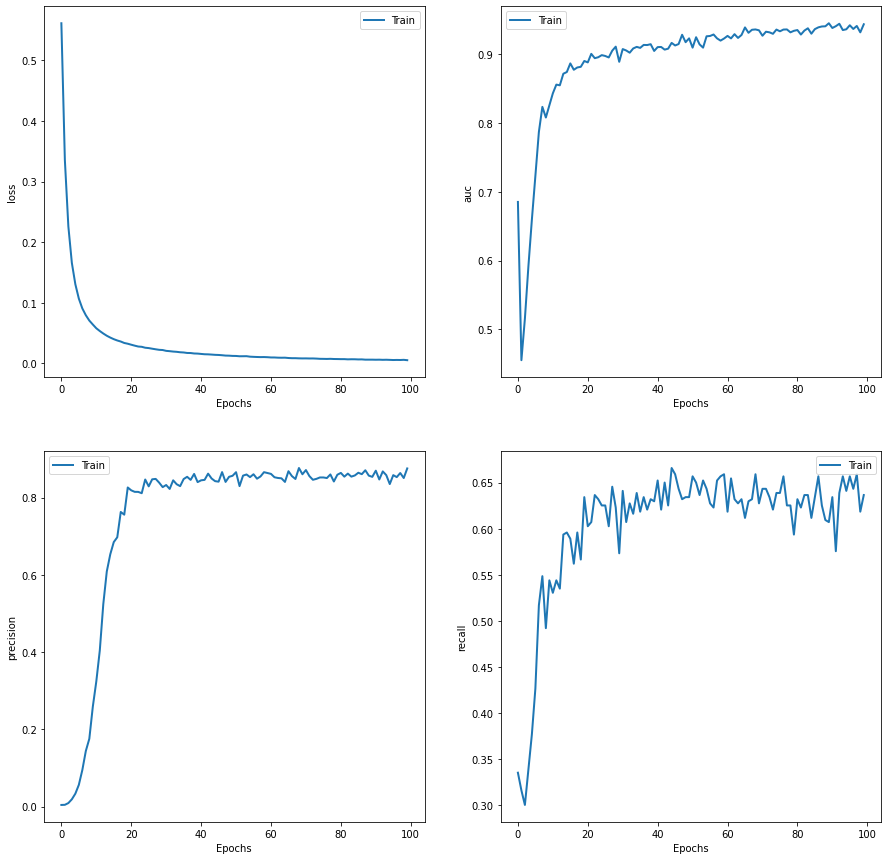

Area under ROC curve: 0.968
Area under Precision-Recall curve: 0.829
F1 Score: 0.874


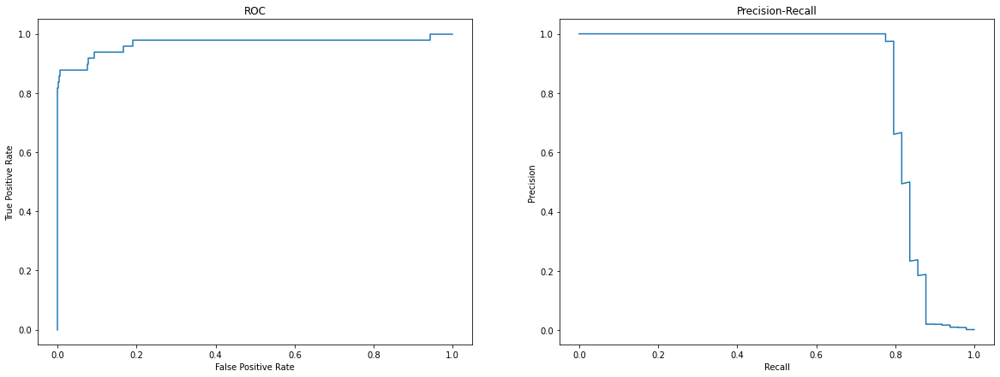

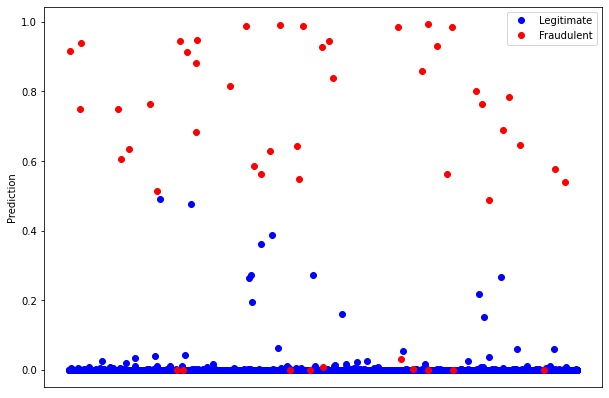

---------------------------------------------------------------
Model: "sequential_199"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_406 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_207 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_407 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Correct predictions for Train data: 99.940%
Train Precision: 88.360%
Train Recall: 75.395%
Correct predictions for Test data: 99.916%
Test Precision: 90.323%
Test Recall: 57.143%
Final Train auc: 95.339%
Final Train precision: 87.797%
Final Train recall: 58.465%


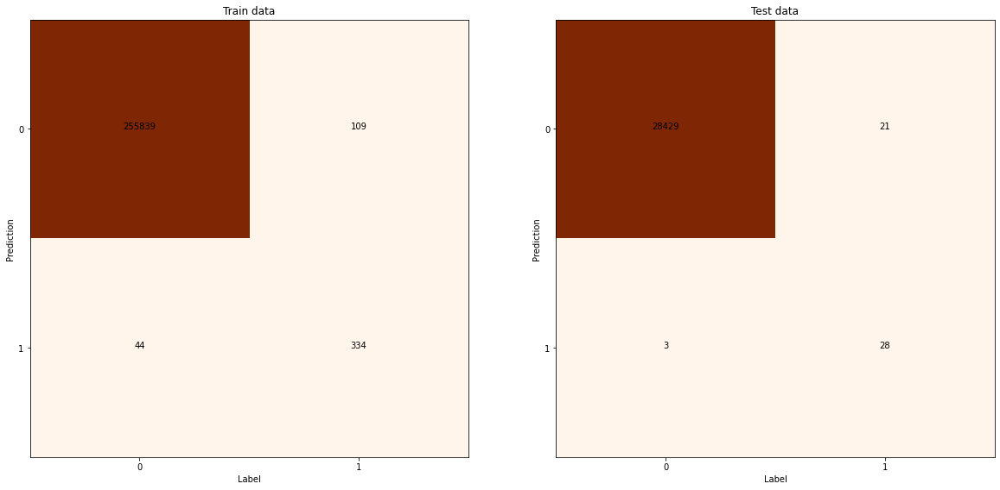

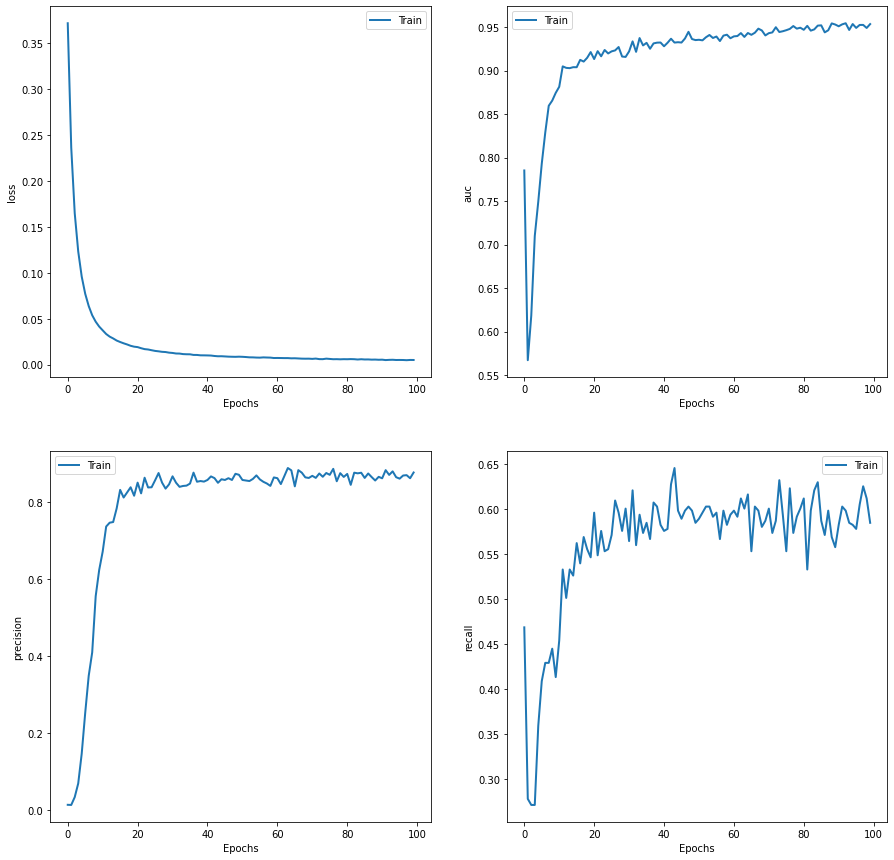

Area under ROC curve: 0.962
Area under Precision-Recall curve: 0.647
F1 Score: 0.700


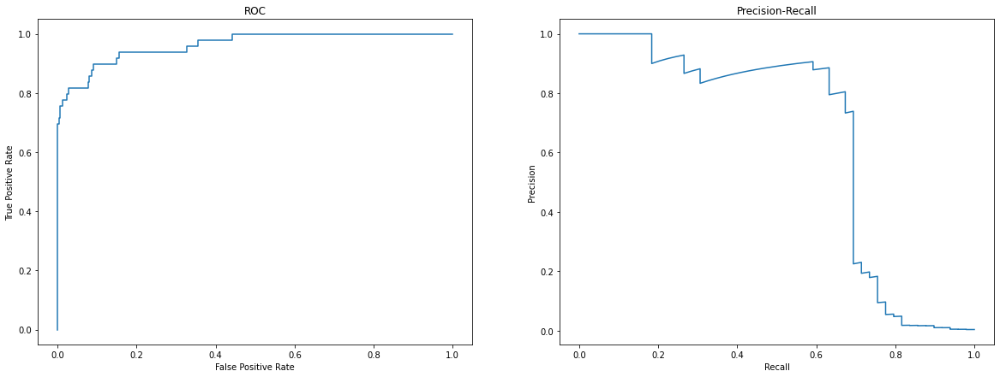

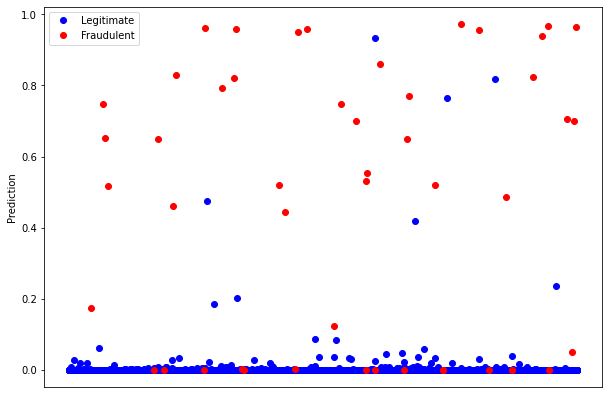

---------------------------------------------------------------
Model: "sequential_200"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_408 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_208 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_409 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Correct predictions for Train data: 99.935%
Train Precision: 88.154%
Train Recall: 72.235%
Correct predictions for Test data: 99.958%
Test Precision: 91.111%
Test Recall: 83.673%
Final Train auc: 94.256%
Final Train precision: 85.315%
Final Train recall: 55.079%


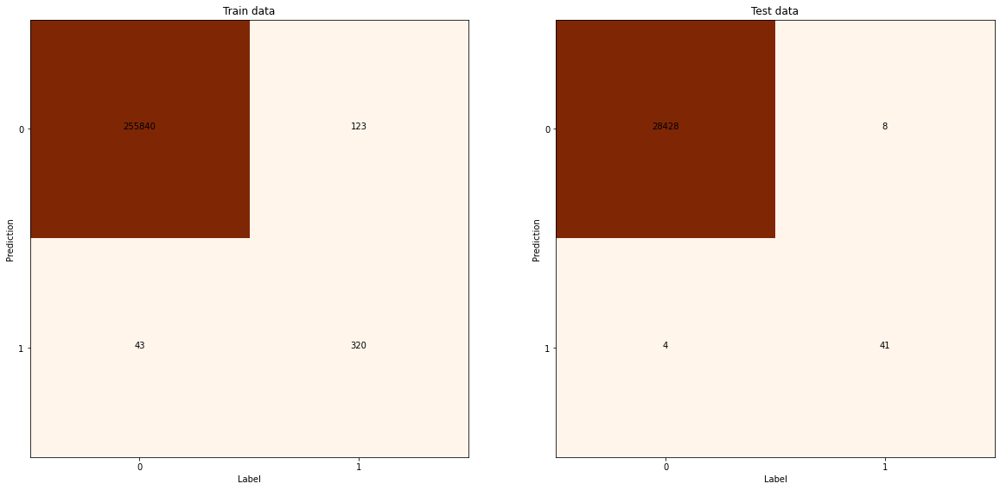

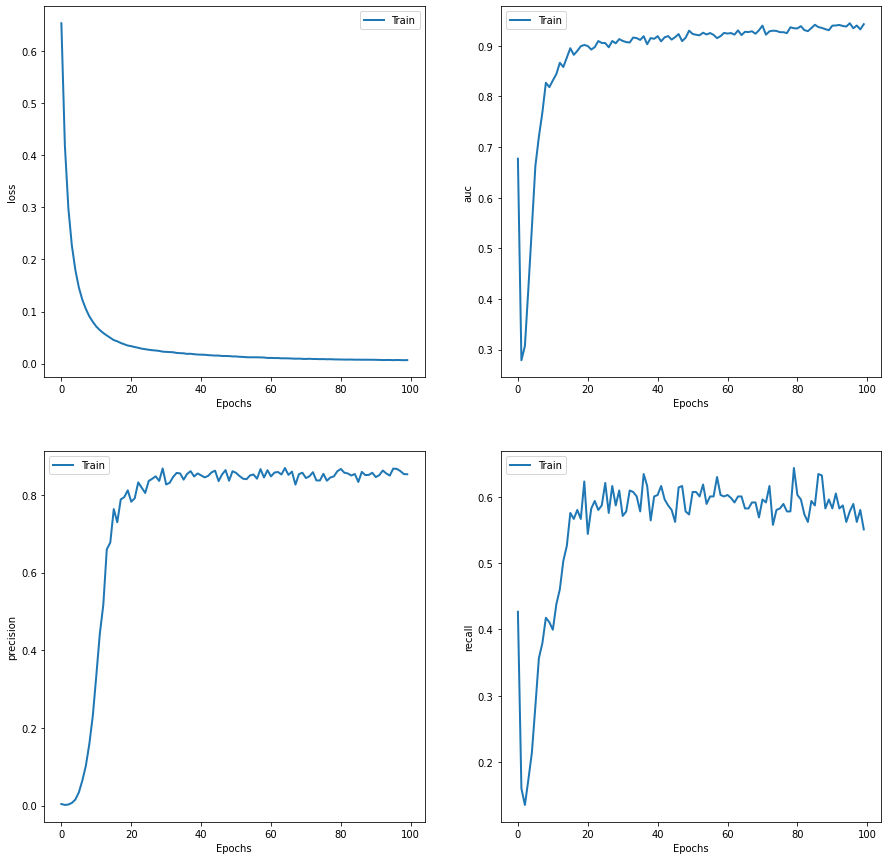

Area under ROC curve: 0.994
Area under Precision-Recall curve: 0.864
F1 Score: 0.872


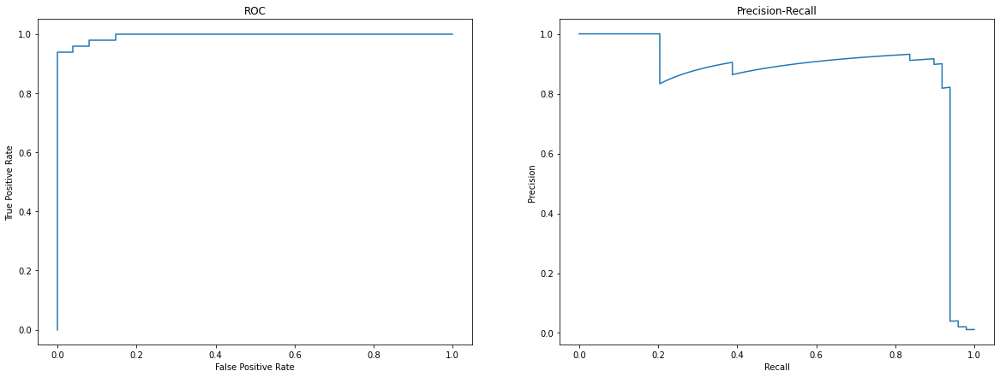

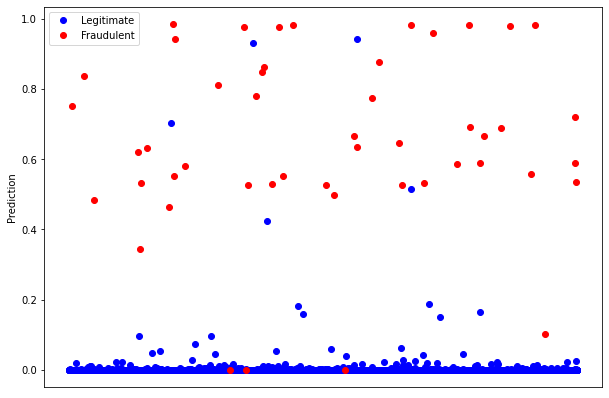

---------------------------------------------------------------
Model: "sequential_201"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_410 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_209 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_411 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Correct predictions for Train data: 99.942%
Train Precision: 89.096%
Train Recall: 75.621%
Correct predictions for Test data: 99.947%
Test Precision: 86.957%
Test Recall: 81.633%
Final Train auc: 93.380%
Final Train precision: 88.608%
Final Train recall: 63.205%


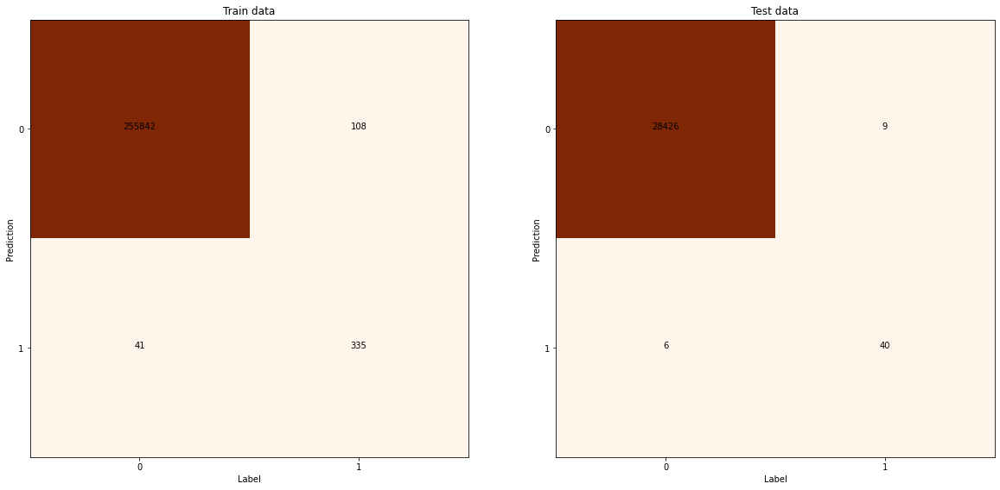

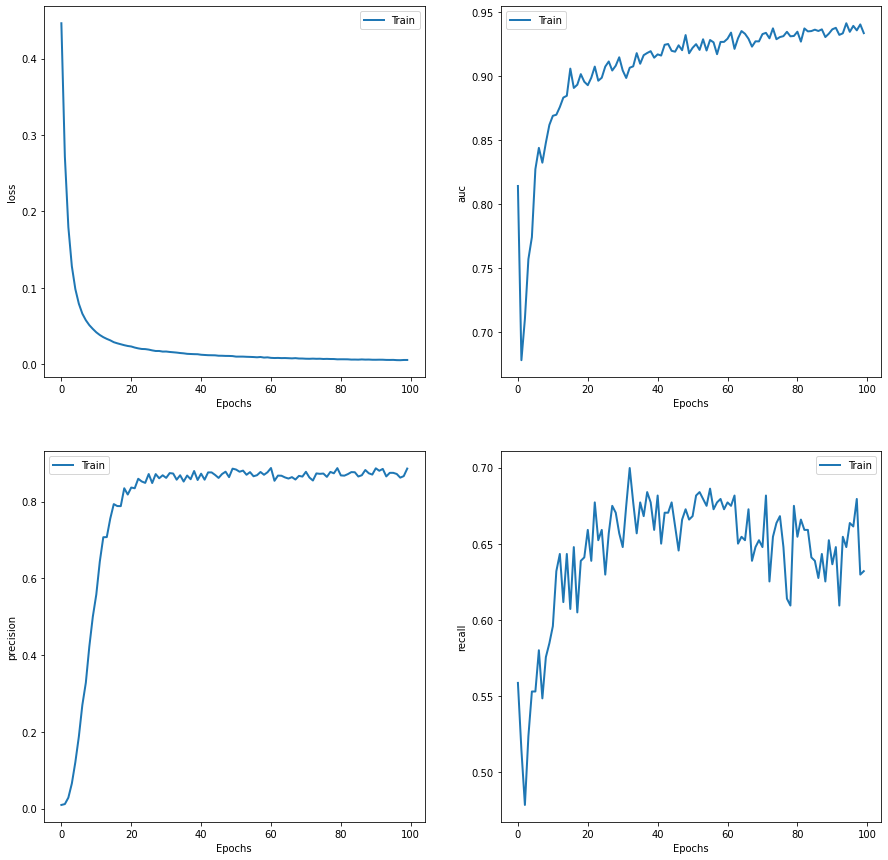

Area under ROC curve: 0.989
Area under Precision-Recall curve: 0.836
F1 Score: 0.842


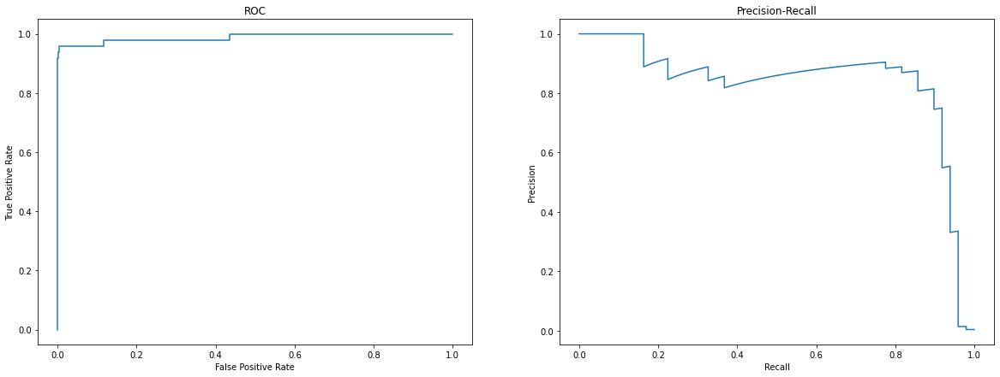

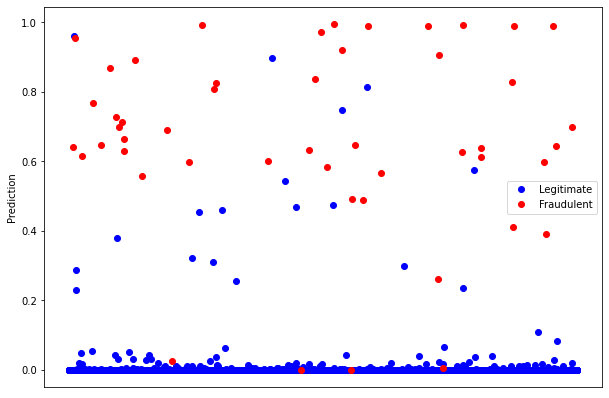

---------------------------------------------------------------
Model: "sequential_202"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_412 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_210 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_413 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Correct predictions for Train data: 99.946%
Train Precision: 88.776%
Train Recall: 78.733%
Correct predictions for Test data: 99.937%
Test Precision: 86.364%
Test Recall: 76.000%
Final Train auc: 93.560%
Final Train precision: 87.048%
Final Train recall: 65.385%


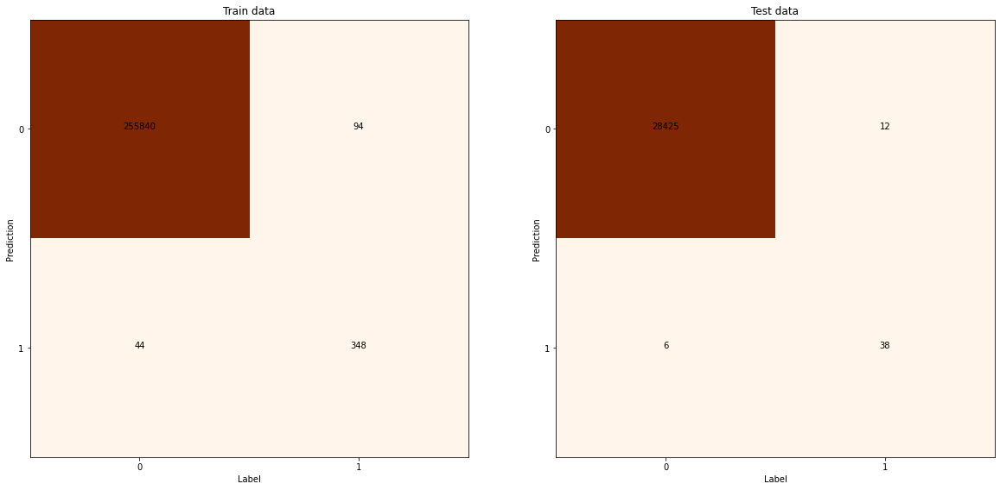

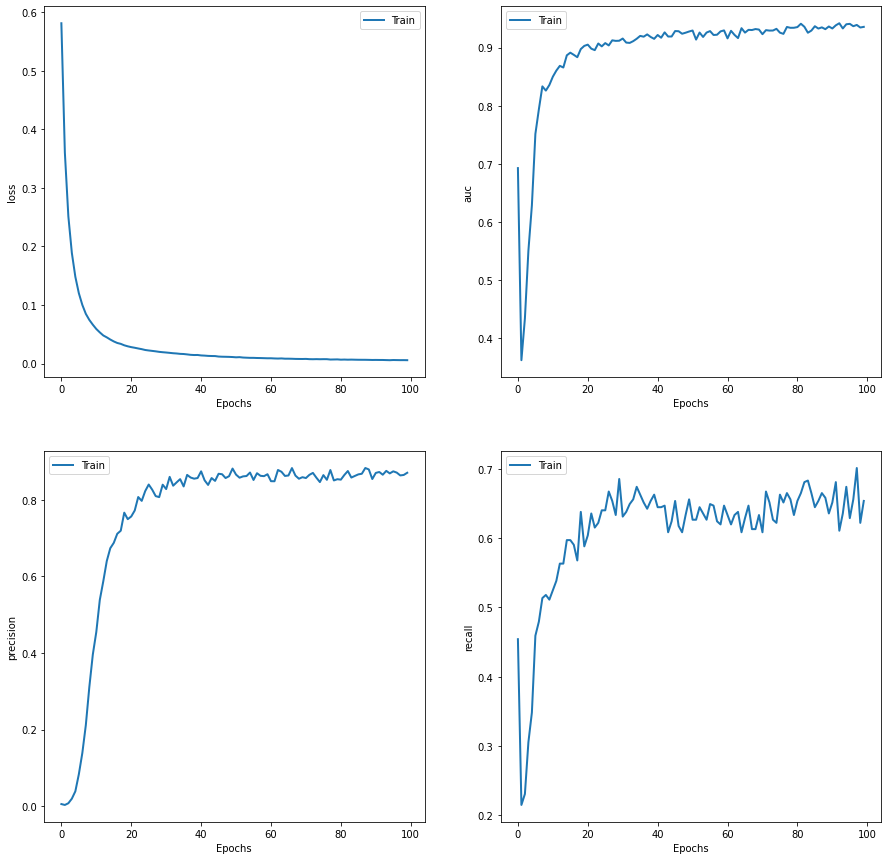

Area under ROC curve: 0.974
Area under Precision-Recall curve: 0.783
F1 Score: 0.809


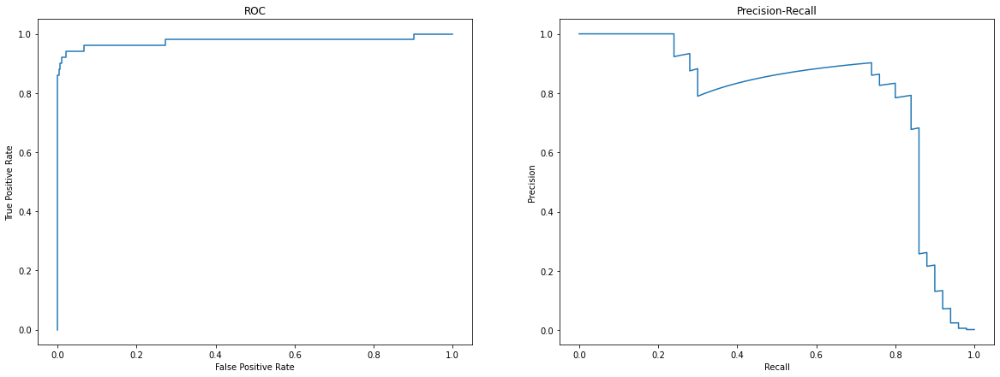

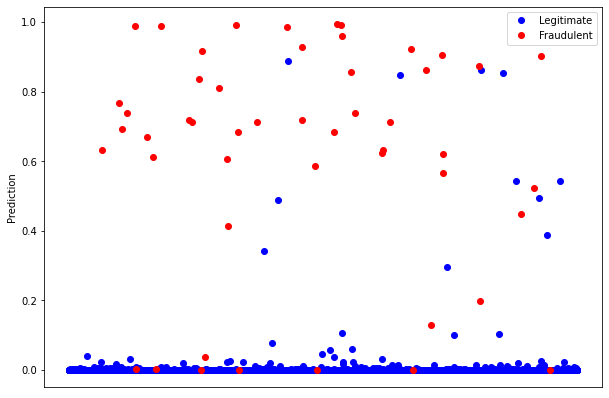

---------------------------------------------------------------
Model: "sequential_203"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_414 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_211 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_415 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Correct predictions for Train data: 99.936%
Train Precision: 88.796%
Train Recall: 71.719%
Correct predictions for Test data: 99.937%
Test Precision: 90.000%
Test Recall: 72.000%
Final Train auc: 93.922%
Final Train precision: 89.172%
Final Train recall: 63.348%


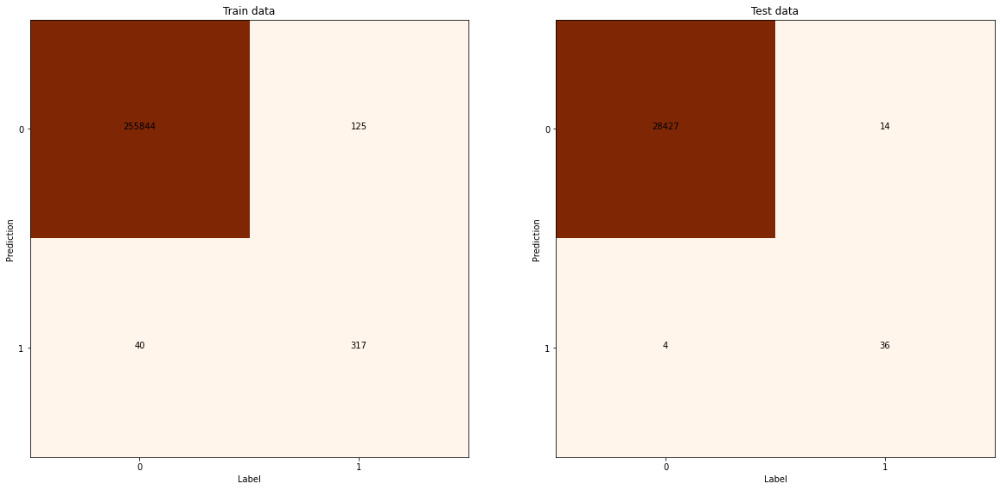

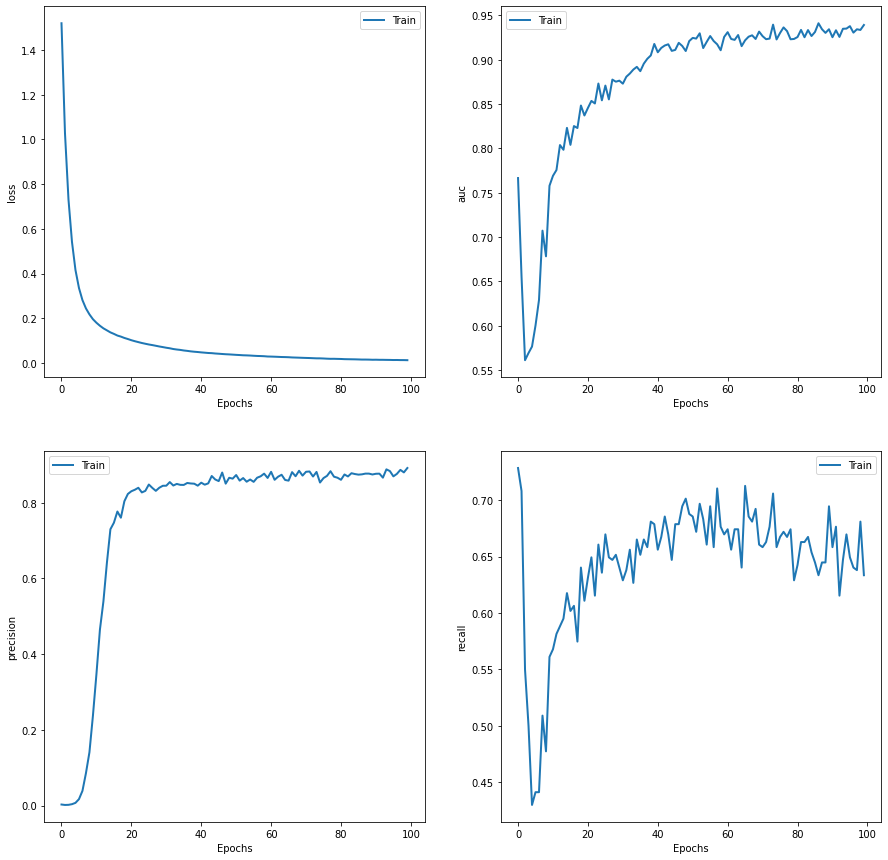

Area under ROC curve: 0.995
Area under Precision-Recall curve: 0.830
F1 Score: 0.800


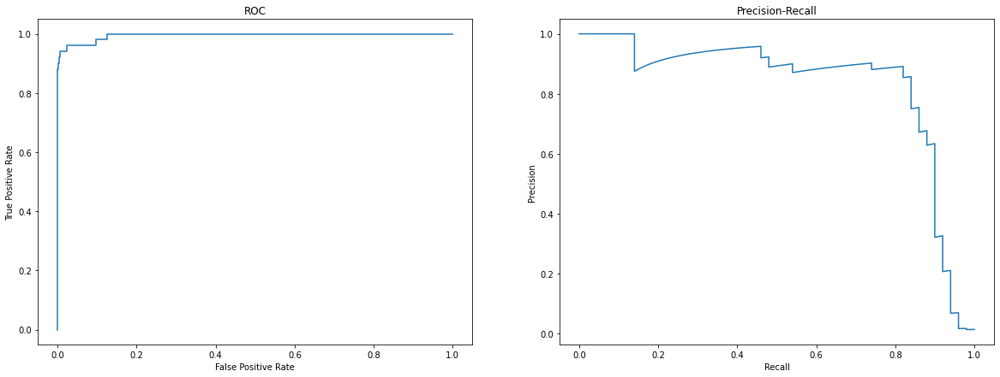

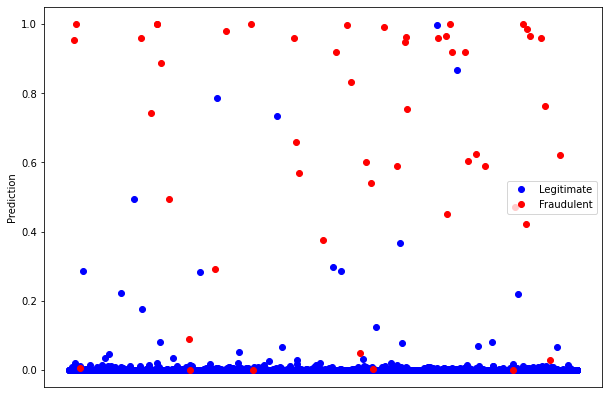

---------------------------------------------------------------
Model: "sequential_204"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_416 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_212 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_417 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Correct predictions for Train data: 99.931%
Train Precision: 89.349%
Train Recall: 68.172%
Correct predictions for Test data: 99.933%
Test Precision: 87.500%
Test Recall: 71.429%
Final Train auc: 93.999%
Final Train precision: 85.149%
Final Train recall: 58.239%


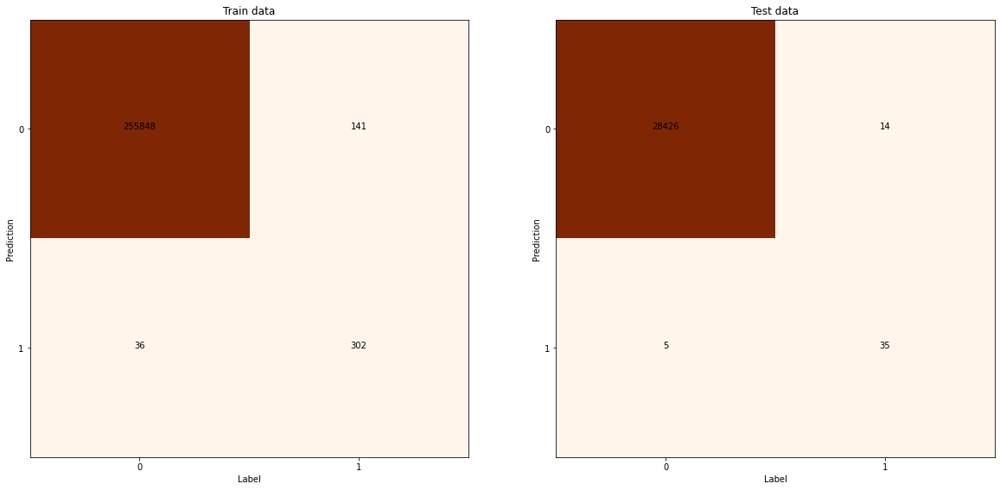

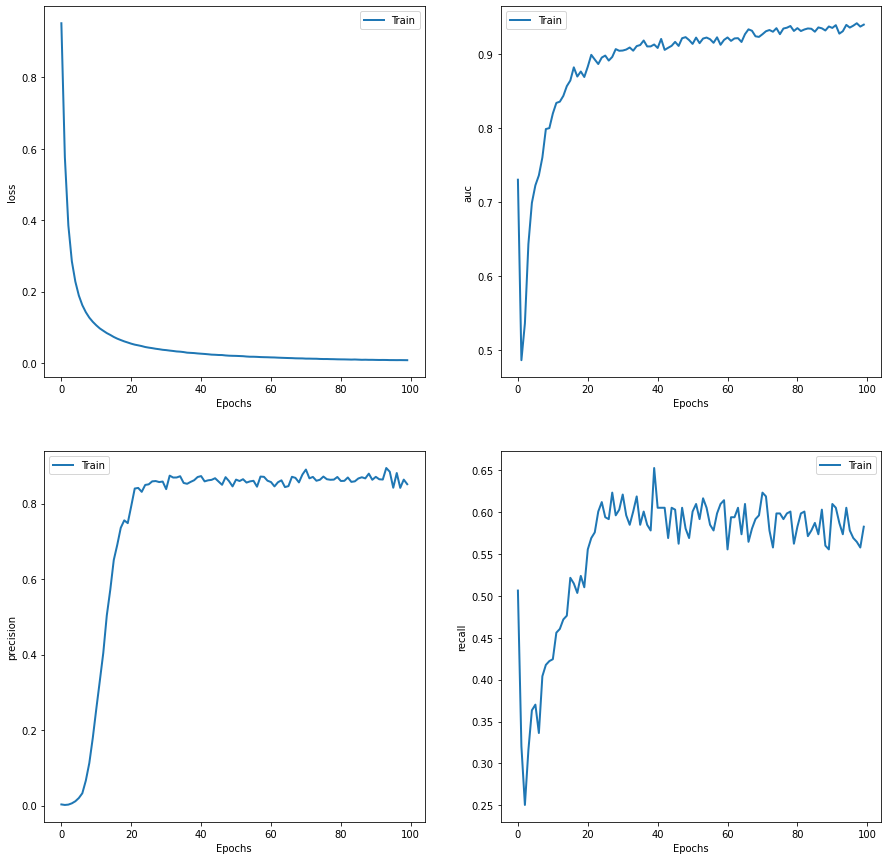

Area under ROC curve: 0.978
Area under Precision-Recall curve: 0.785
F1 Score: 0.787


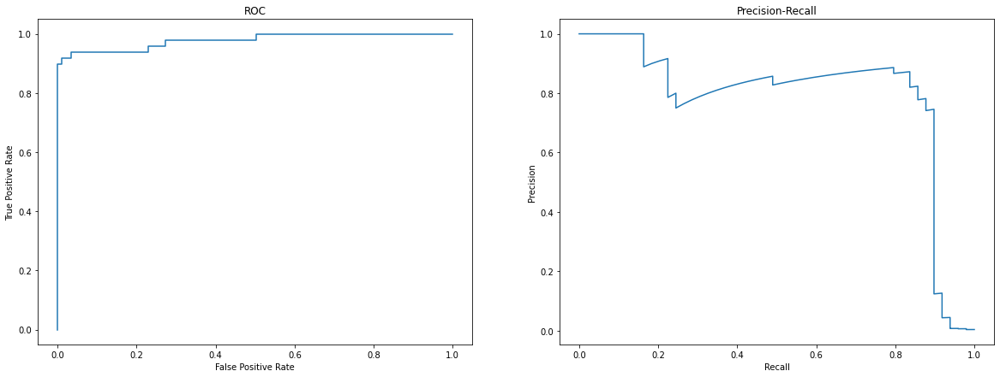

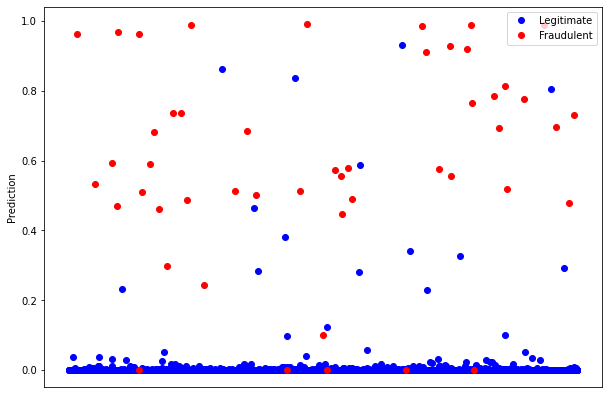

---------------------------------------------------------------
Model: "sequential_205"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_418 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_213 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_419 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Correct predictions for Train data: 99.915%
Train Precision: 88.660%
Train Recall: 58.239%
Correct predictions for Test data: 99.895%
Test Precision: 85.185%
Test Recall: 46.939%
Final Train auc: 93.759%
Final Train precision: 87.383%
Final Train recall: 42.212%


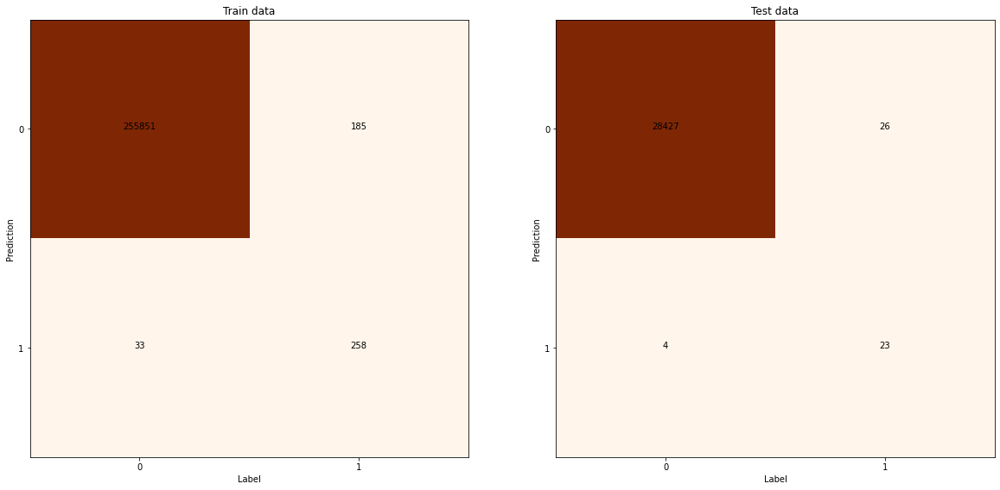

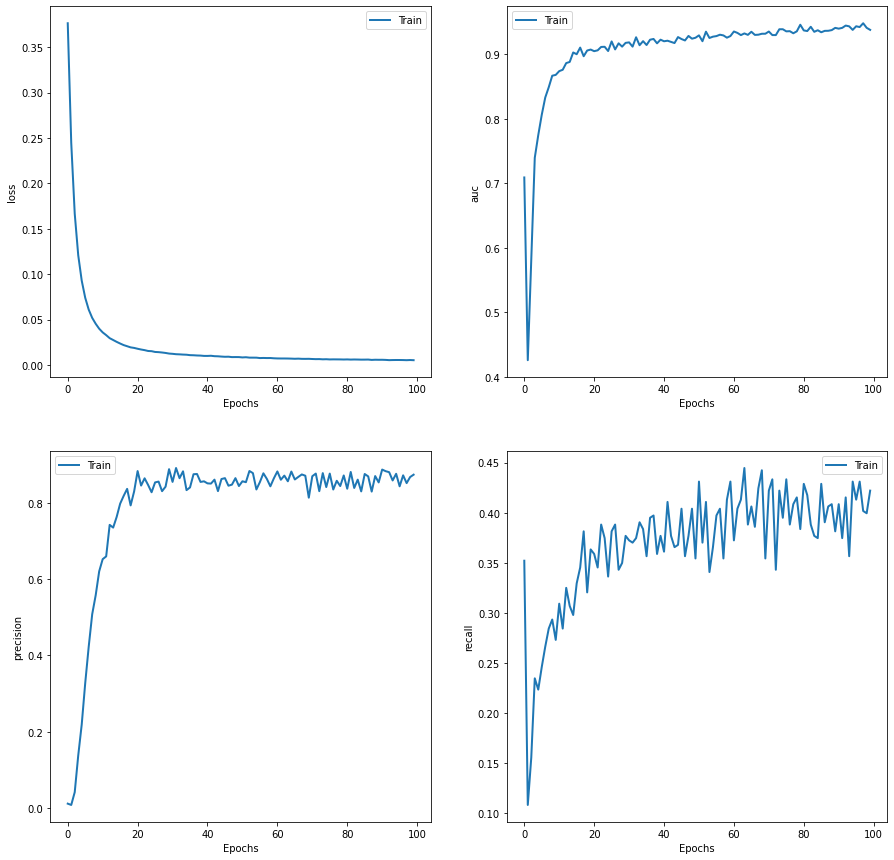

Area under ROC curve: 0.973
Area under Precision-Recall curve: 0.704
F1 Score: 0.605


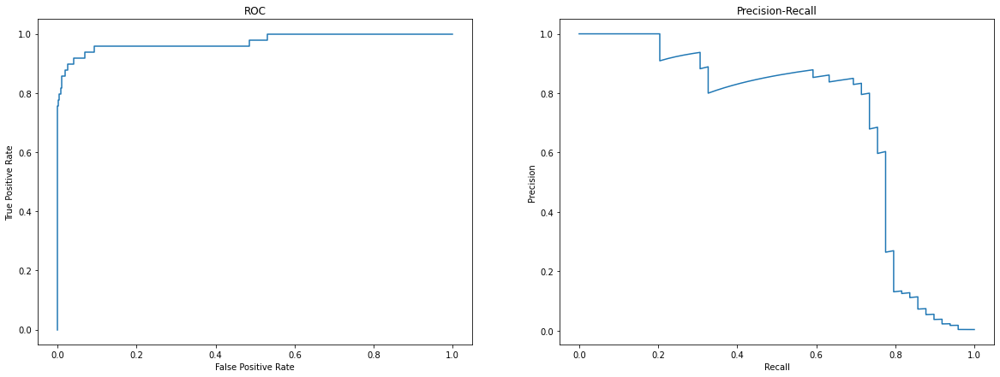

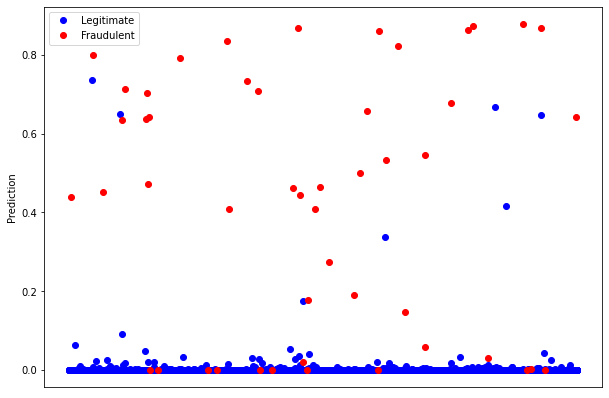

---------------------------------------------------------------
Model: "sequential_206"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_420 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_214 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_421 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Correct predictions for Train data: 99.943%
Train Precision: 89.211%
Train Recall: 76.524%
Correct predictions for Test data: 99.930%
Test Precision: 85.366%
Test Recall: 71.429%
Final Train auc: 93.956%
Final Train precision: 88.393%
Final Train recall: 67.043%


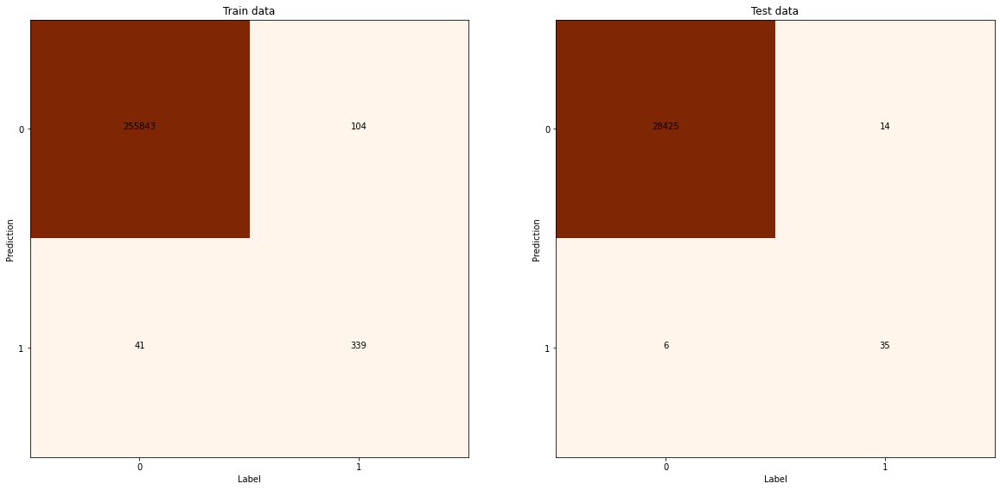

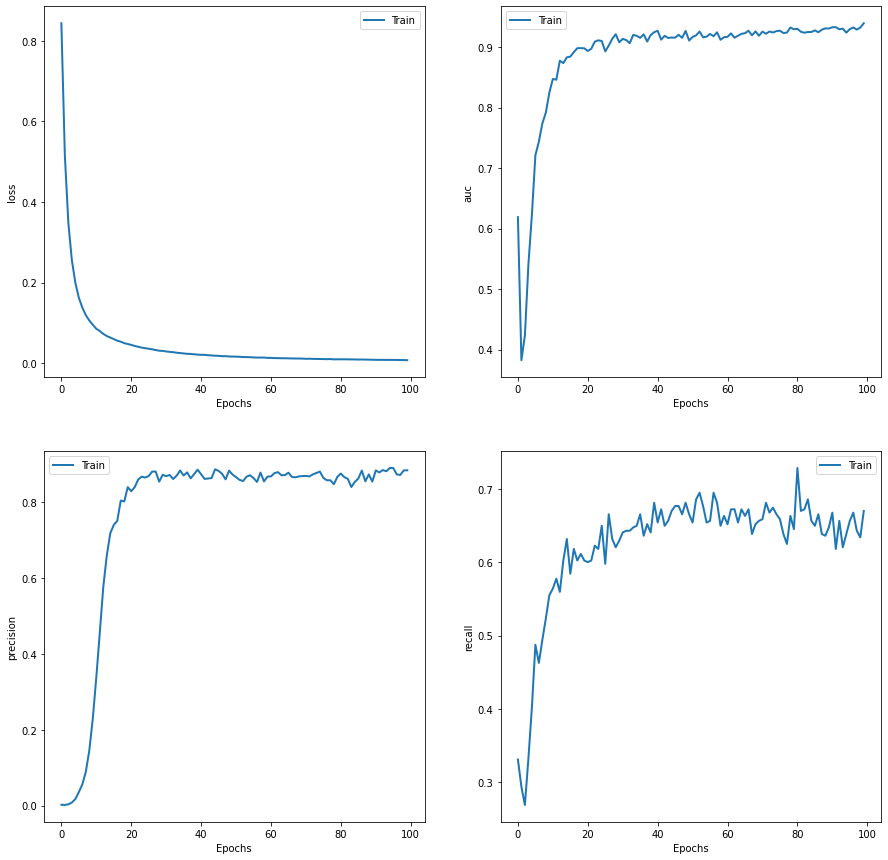

Area under ROC curve: 0.971
Area under Precision-Recall curve: 0.772
F1 Score: 0.778


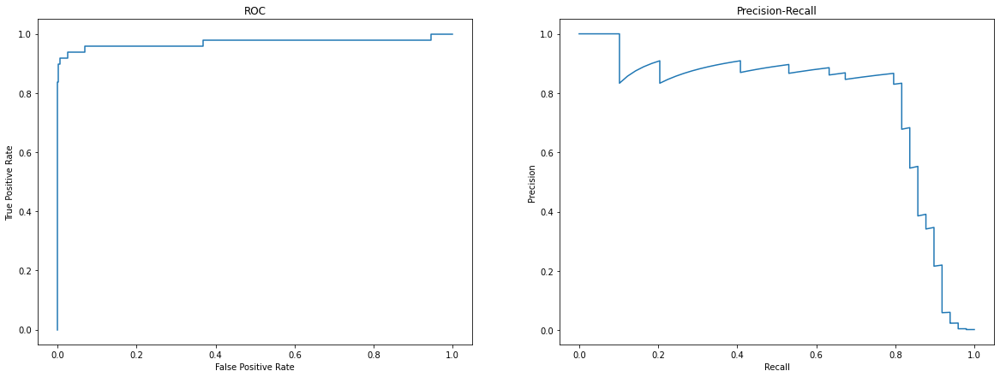

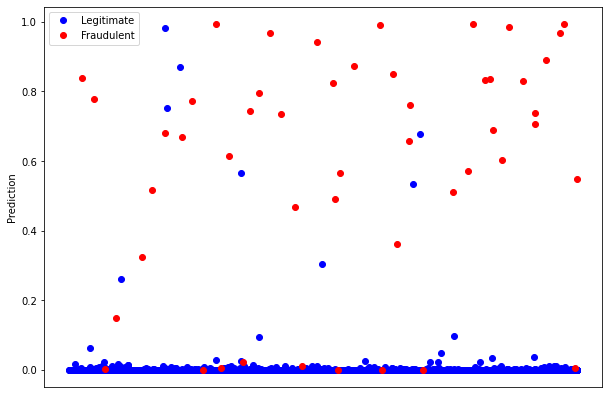

In [74]:
# Standard sampling with balanced class weights k-fold
stsampcw_kfold = kfold(10, data, class_weight=cw)

Final Train loss: 0.006625 (0.004615 - 0.008635)
Final Train auc: 0.940361 (0.935216 - 0.945507)
Final Train precision: 0.870312 (0.854061 - 0.886563)
Final Train recall: 0.571848 (0.472118 - 0.671578)


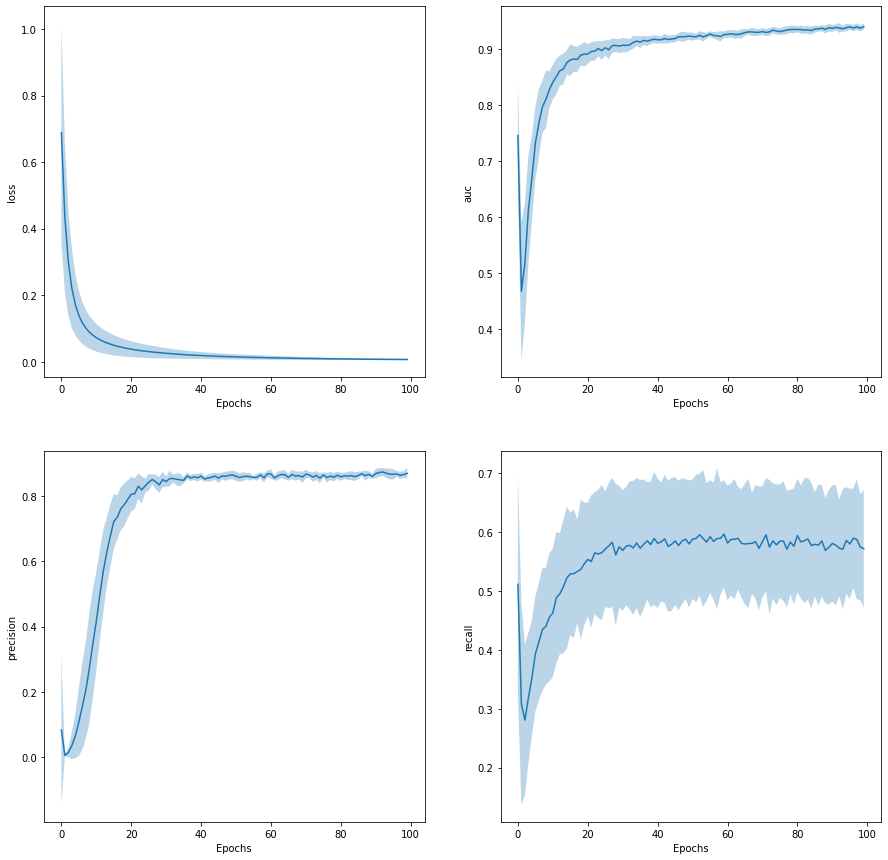

Test Precision: 0.887468 +/- 0.055978
Test Recall: 0.705285 +/- 0.106799


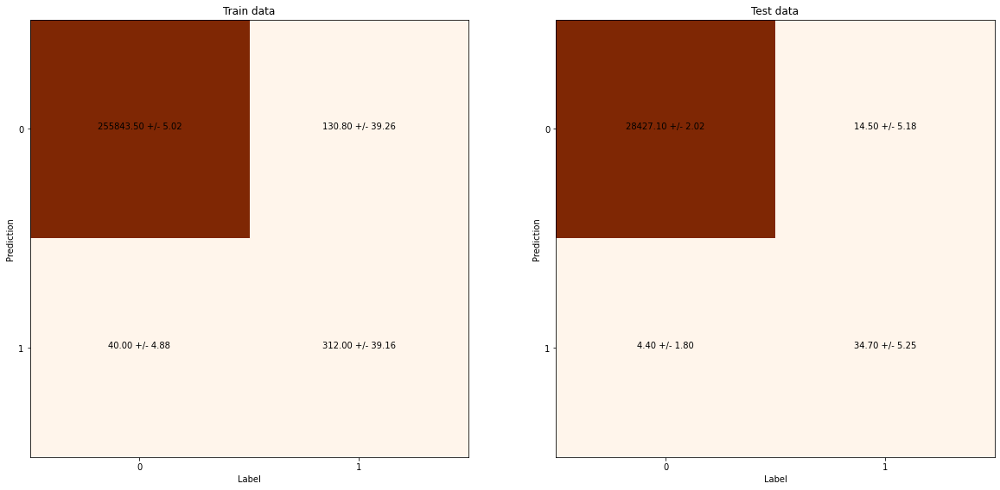

F1 Score: 0.782 +/- 0.078
Area under ROC curve: 0.920399 (0.776912 - 1.063887)
Area under Precision-Recall curve: 0.608834 (0.573011 - 0.644657)


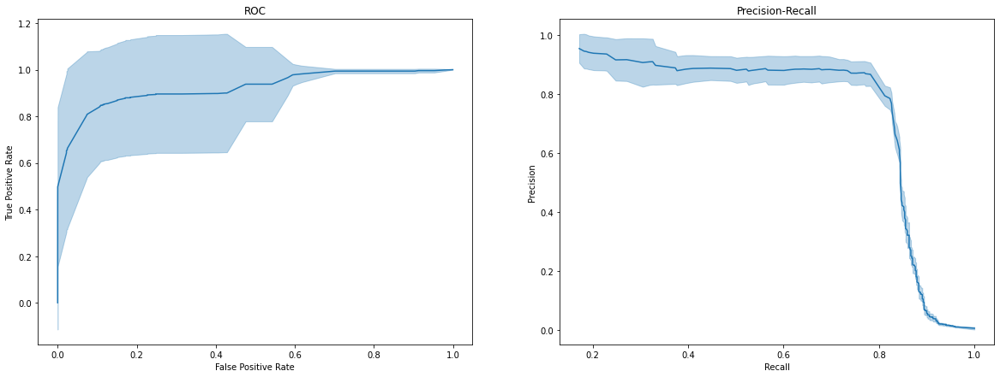

In [75]:
stsampcw_stats = kfold_stats(*stsampcw_kfold)

####SMOTE augmentation examples

(284807, 31)
(568630, 31)
284315


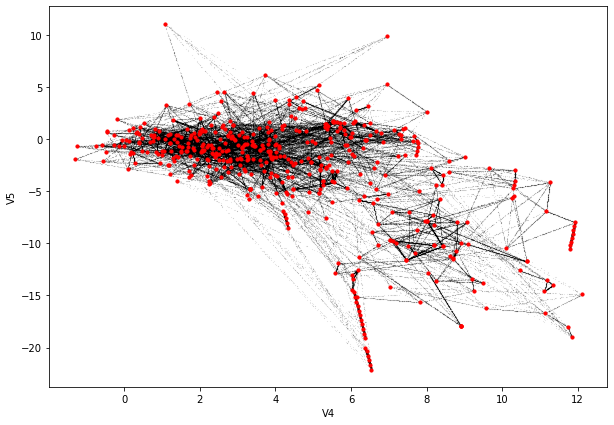

In [76]:
# Let's see an example of how SMOTE creates new data

data2 = np.copy(data)
x, y = SMOTE().fit_resample(data2[:,:-1], data2[:,-1])

data2 = np.concatenate((x, y.reshape((-1,1))), axis=1)

print(data.shape)
print(data2.shape)
print(len(np.where(data2[:,-1]==1)[0]))

plt.figure(figsize=(10,7))
plt.scatter(*data2[np.where(data2[:,-1]==1)[0],4:6].T, color="black", s=0.001, label="New Data")
plt.scatter(*data[np.where(data[:,-1]==1)[0],4:6].T, color="red", s=10, label="Original Data")
plt.xlabel(data_csv.columns[4])
plt.ylabel(data_csv.columns[5])
plt.show()

(284807, 31)
(568630, 31)
284315


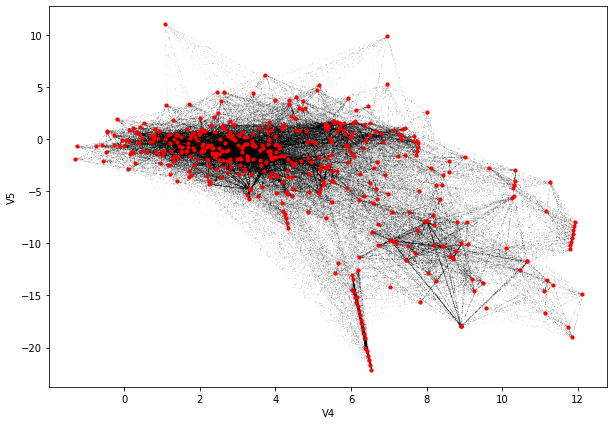

In [77]:
# What if we increase the number of nearest neighbors?

data2 = np.copy(data)
x, y = SMOTE(k_neighbors=30).fit_resample(data2[:,:-1], data2[:,-1])

data2 = np.concatenate((x, y.reshape((-1,1))), axis=1)

print(data.shape)
print(data2.shape)
print(len(np.where(data2[:,-1]==1)[0]))

plt.figure(figsize=(10,7))
plt.scatter(*data2[np.where(data2[:,-1]==1)[0],4:6].T, color="black", s=0.001, label="New Data")
plt.scatter(*data[np.where(data[:,-1]==1)[0],4:6].T, color="red", s=10, label="Original Data")
plt.xlabel(data_csv.columns[4])
plt.ylabel(data_csv.columns[5])
plt.show()

(284807, 31)
(568630, 31)
284315


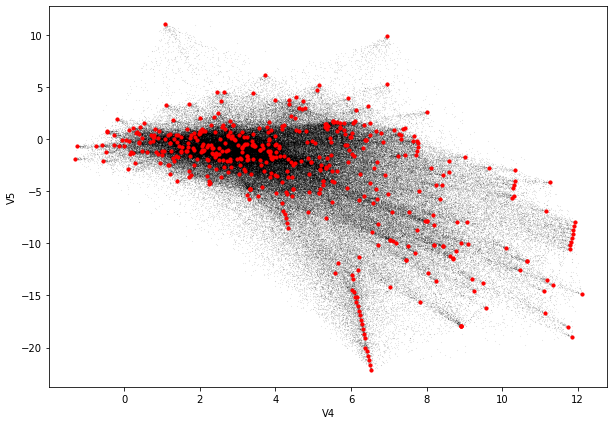

In [78]:
# What if we set the number of nearest neighbors to max possible?

data2 = np.copy(data)
data2_fraud = np.where(data2[:,-1]==1)[0]
x, y = SMOTE(k_neighbors=len(data2_fraud)-1).fit_resample(data2[:,:-1], data2[:,-1])

data2 = np.concatenate((x, y.reshape((-1,1))), axis=1)

print(data.shape)
print(data2.shape)
print(len(np.where(data2[:,-1]==1)[0]))

plt.figure(figsize=(10,7))
plt.scatter(*data2[np.where(data2[:,-1]==1)[0],4:6].T, color="black", s=0.001, label="New Data")
plt.scatter(*data[np.where(data[:,-1]==1)[0],4:6].T, color="red", s=10, label="Original Data")
plt.xlabel(data_csv.columns[4])
plt.ylabel(data_csv.columns[5])
plt.show()

####SMOTE sampling

---------------------------------------------------------------
Model: "sequential_207"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_422 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_215 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_423 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Correct predictions for Train data: 98.696%
Train Precision: 99.463%
Train Recall: 97.922%
Correct predictions for Test data: 99.459%
Test Precision: 21.622%
Test Recall: 81.633%
Final Train auc: 99.838%
Final Train precision: 99.030%
Final Train recall: 97.517%


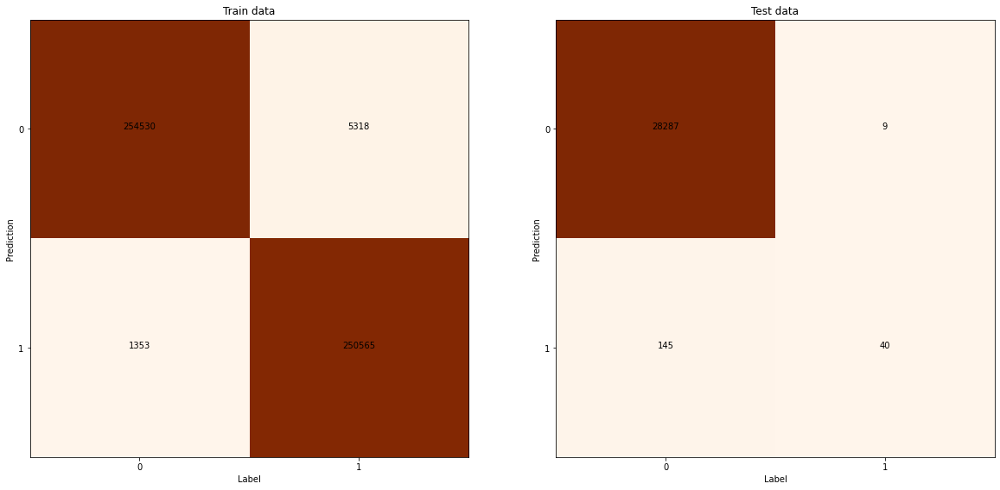

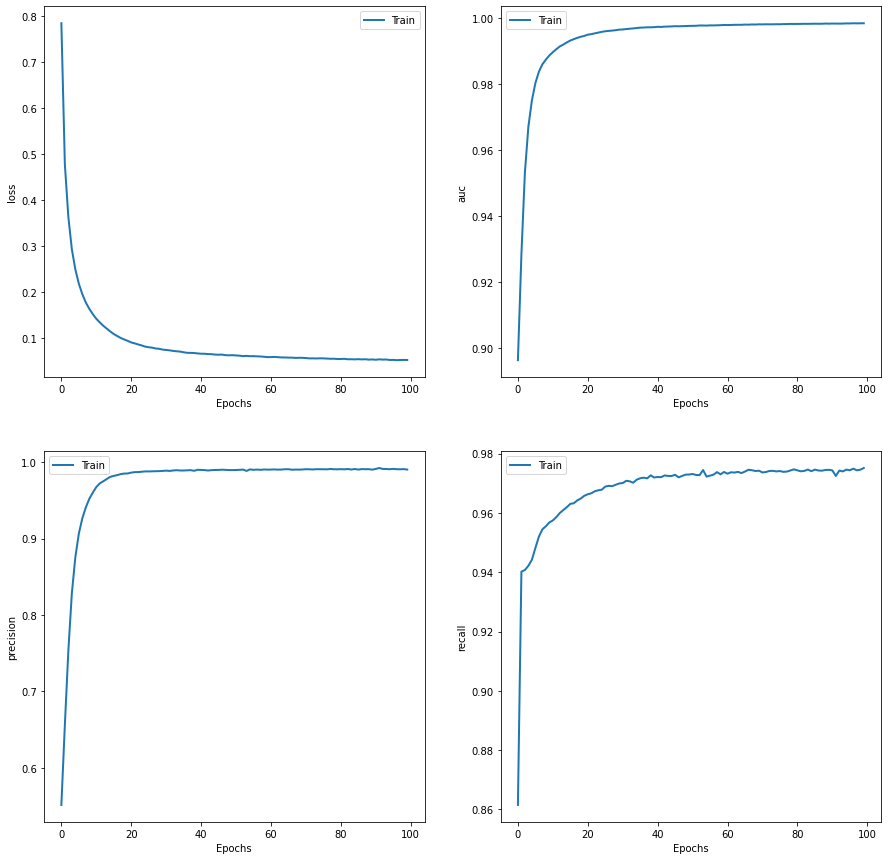

Area under ROC curve: 0.966
Area under Precision-Recall curve: 0.788
F1 Score: 0.342


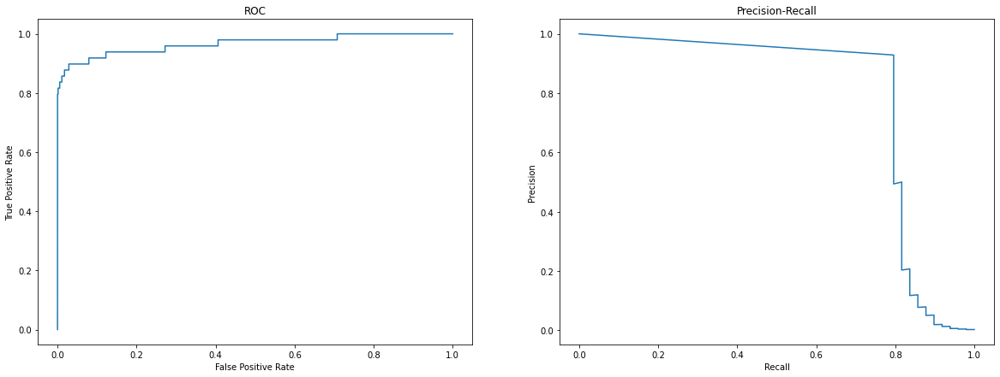

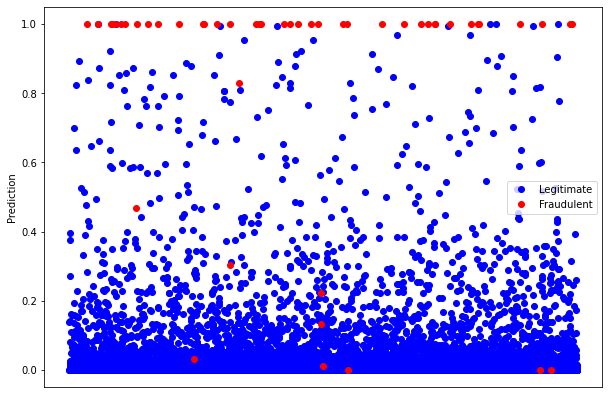

---------------------------------------------------------------
Model: "sequential_208"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_424 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_216 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_425 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Correct predictions for Train data: 98.819%
Train Precision: 99.422%
Train Recall: 98.209%
Correct predictions for Test data: 99.343%
Test Precision: 20.763%
Test Recall: 100.000%
Final Train auc: 99.810%
Final Train precision: 98.816%
Final Train recall: 97.250%


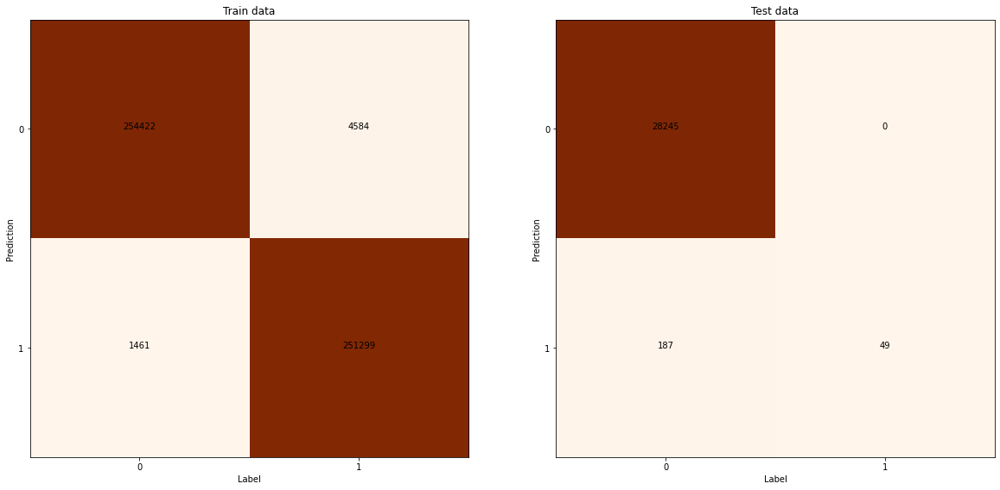

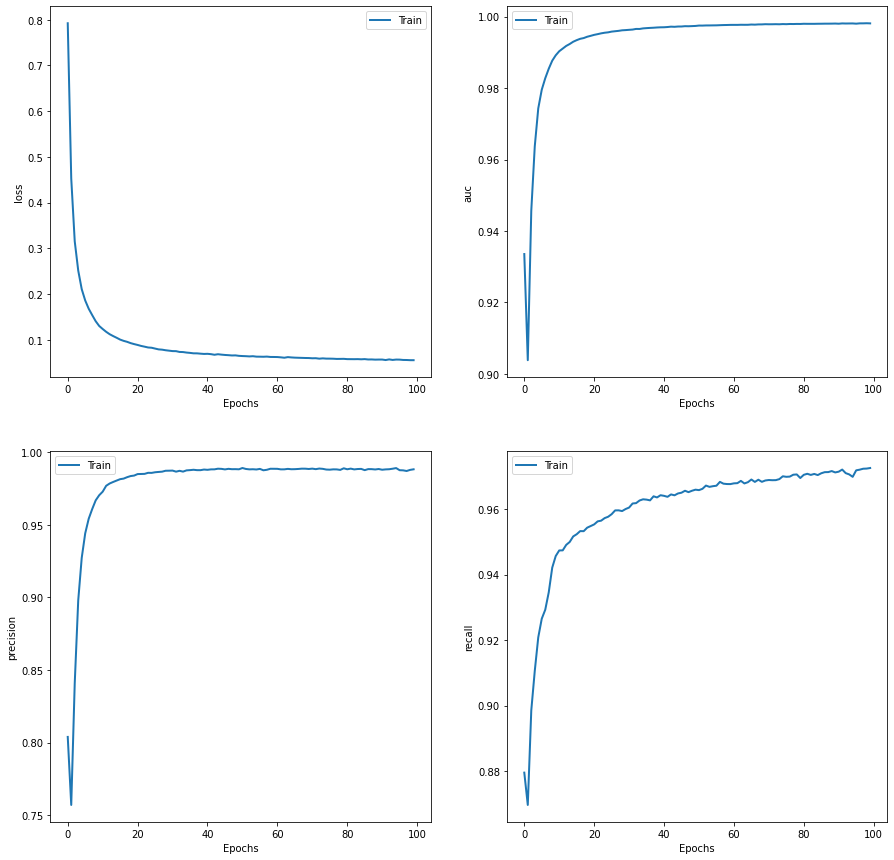

Area under ROC curve: 1.000
Area under Precision-Recall curve: 0.942
F1 Score: 0.344


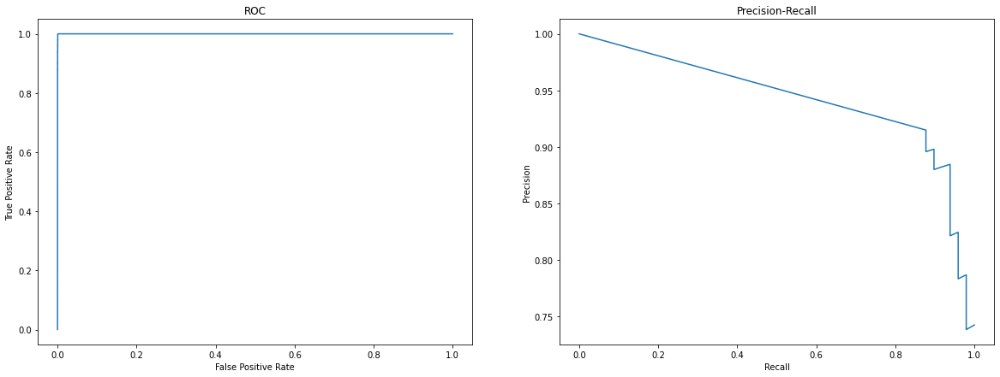

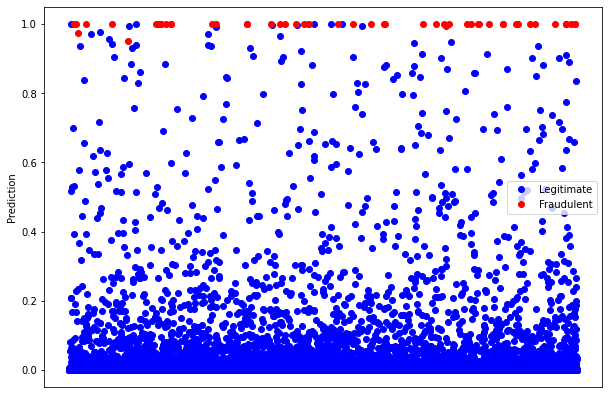

---------------------------------------------------------------
Model: "sequential_209"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_426 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_217 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_427 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Correct predictions for Train data: 98.997%
Train Precision: 99.562%
Train Recall: 98.426%
Correct predictions for Test data: 99.540%
Test Precision: 24.375%
Test Recall: 79.592%
Final Train auc: 99.871%
Final Train precision: 99.142%
Final Train recall: 97.807%


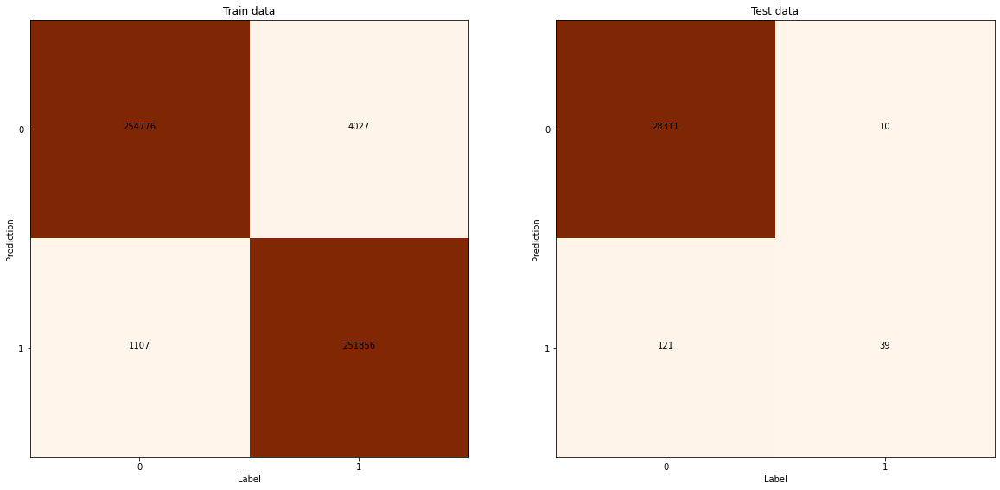

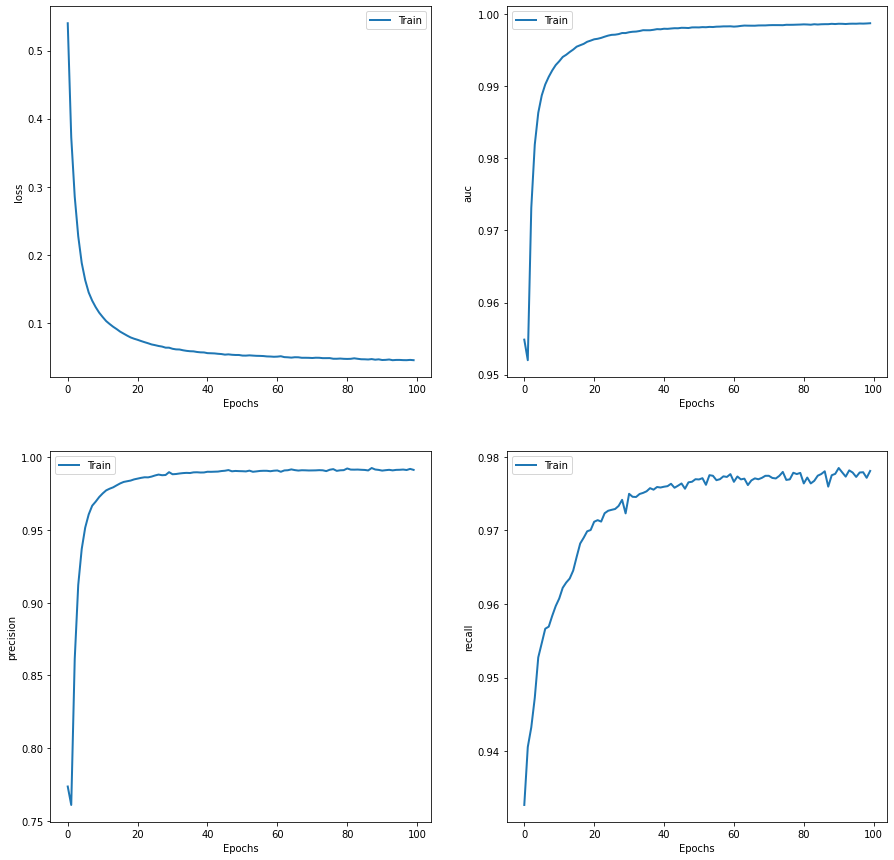

Area under ROC curve: 0.964
Area under Precision-Recall curve: 0.685
F1 Score: 0.373


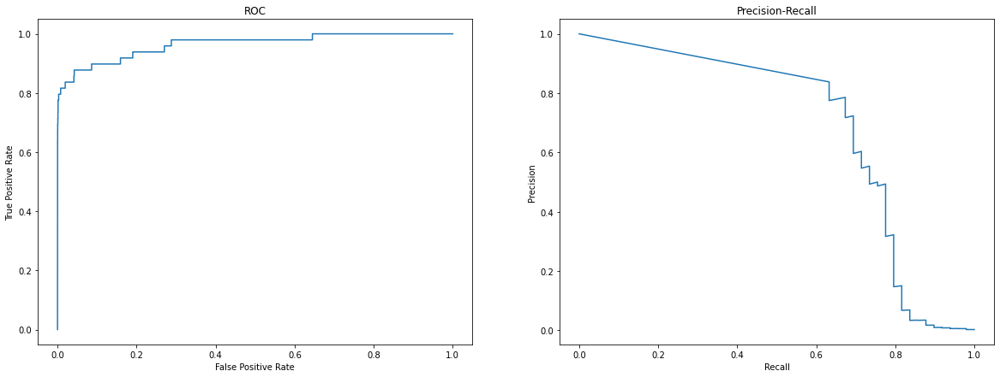

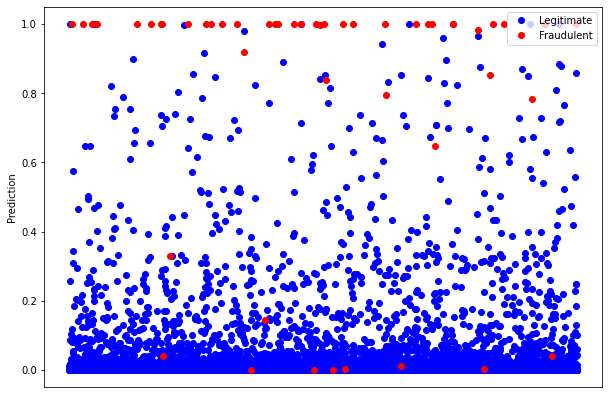

---------------------------------------------------------------
Model: "sequential_210"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_428 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_218 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_429 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Correct predictions for Train data: 98.728%
Train Precision: 99.541%
Train Recall: 97.906%
Correct predictions for Test data: 99.470%
Test Precision: 23.158%
Test Recall: 89.796%
Final Train auc: 99.799%
Final Train precision: 99.037%
Final Train recall: 96.952%


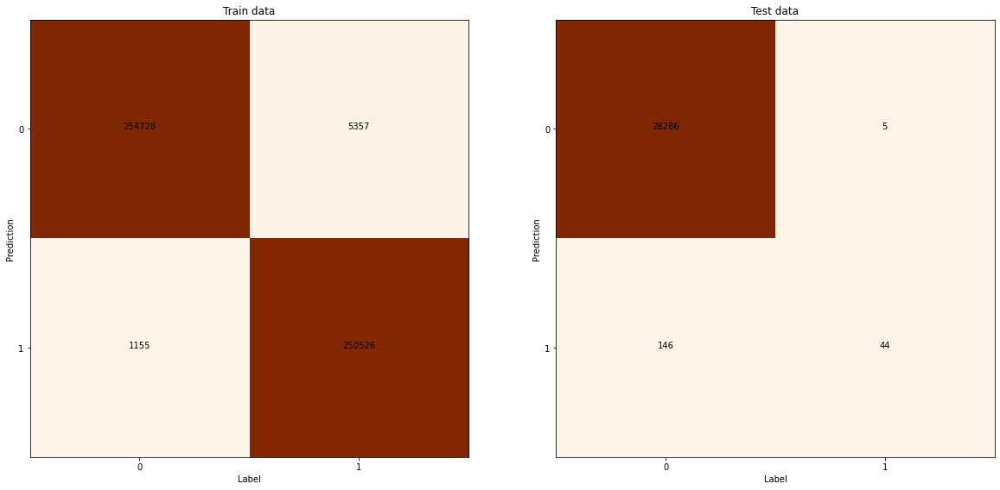

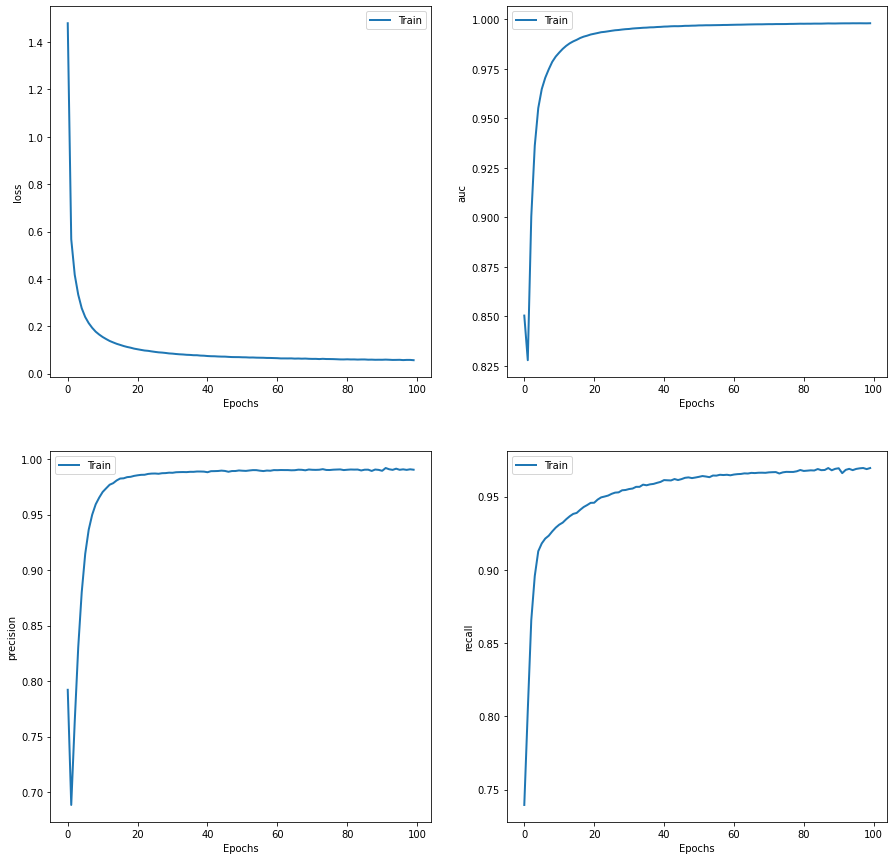

Area under ROC curve: 0.987
Area under Precision-Recall curve: 0.792
F1 Score: 0.368


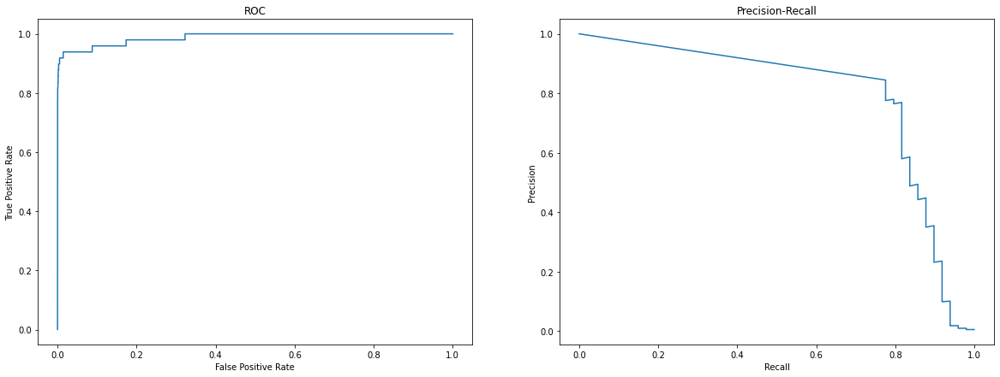

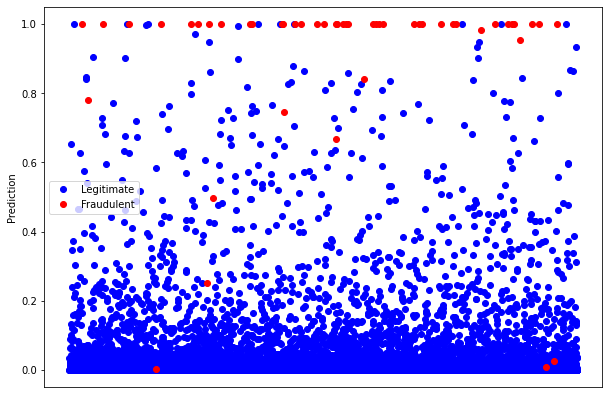

---------------------------------------------------------------
Model: "sequential_211"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_430 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_219 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_431 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Correct predictions for Train data: 98.702%
Train Precision: 99.402%
Train Recall: 97.994%
Correct predictions for Test data: 99.375%
Test Precision: 20.276%
Test Recall: 89.796%
Final Train auc: 99.829%
Final Train precision: 98.944%
Final Train recall: 97.575%


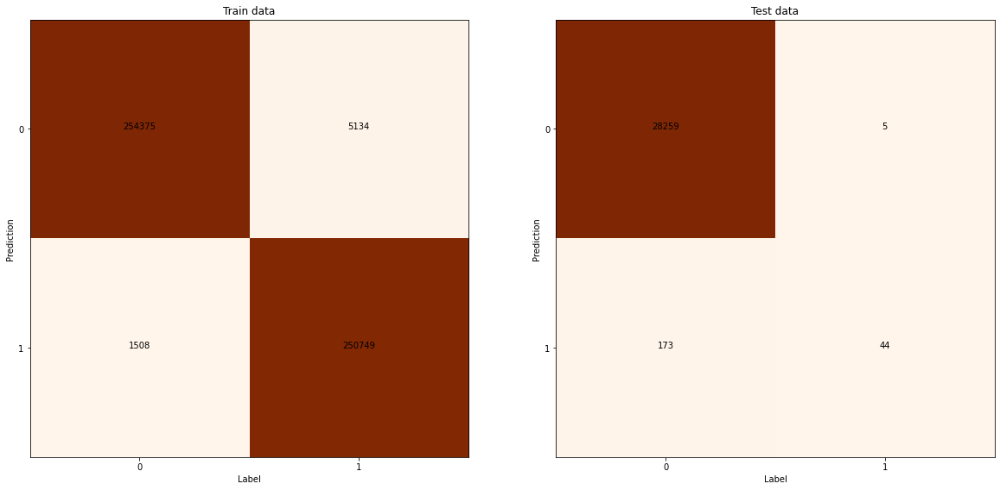

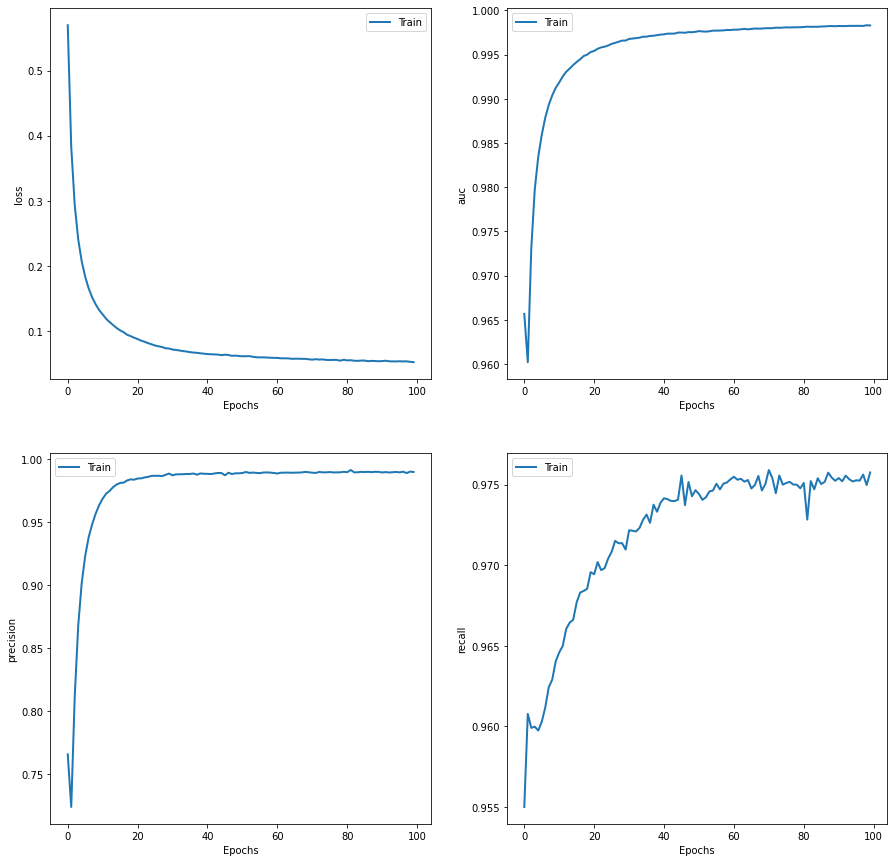

Area under ROC curve: 0.970
Area under Precision-Recall curve: 0.824
F1 Score: 0.331


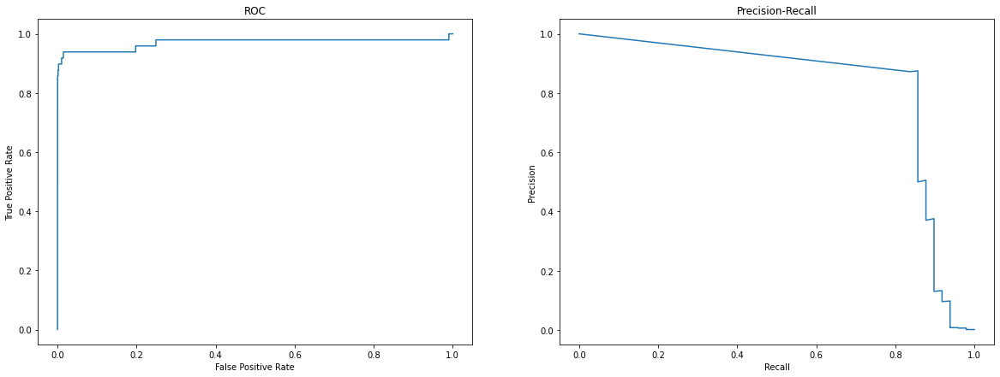

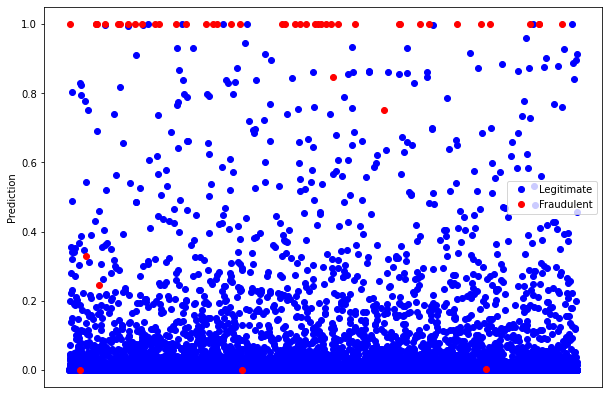

---------------------------------------------------------------
Model: "sequential_212"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_432 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_220 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_433 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Correct predictions for Train data: 98.846%
Train Precision: 99.543%
Train Recall: 98.143%
Correct predictions for Test data: 99.621%
Test Precision: 29.577%
Test Recall: 84.000%
Final Train auc: 99.835%
Final Train precision: 99.135%
Final Train recall: 97.519%


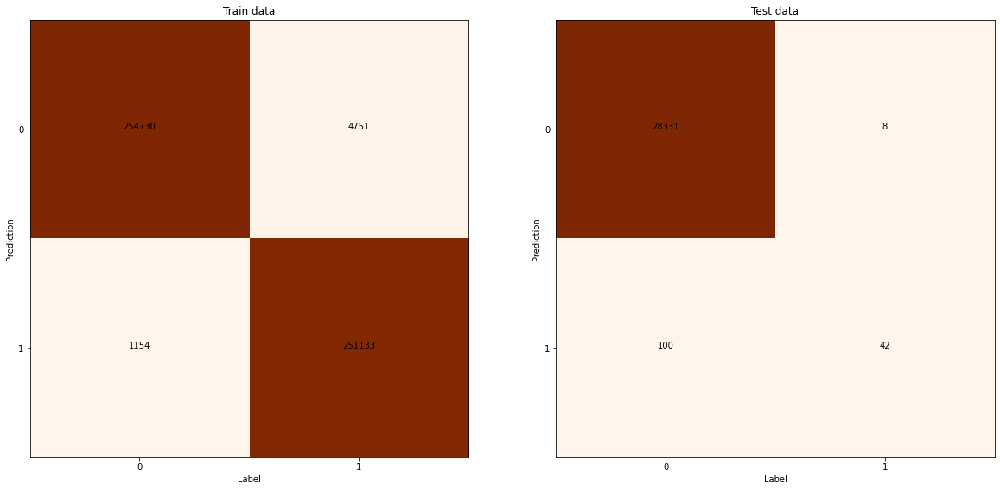

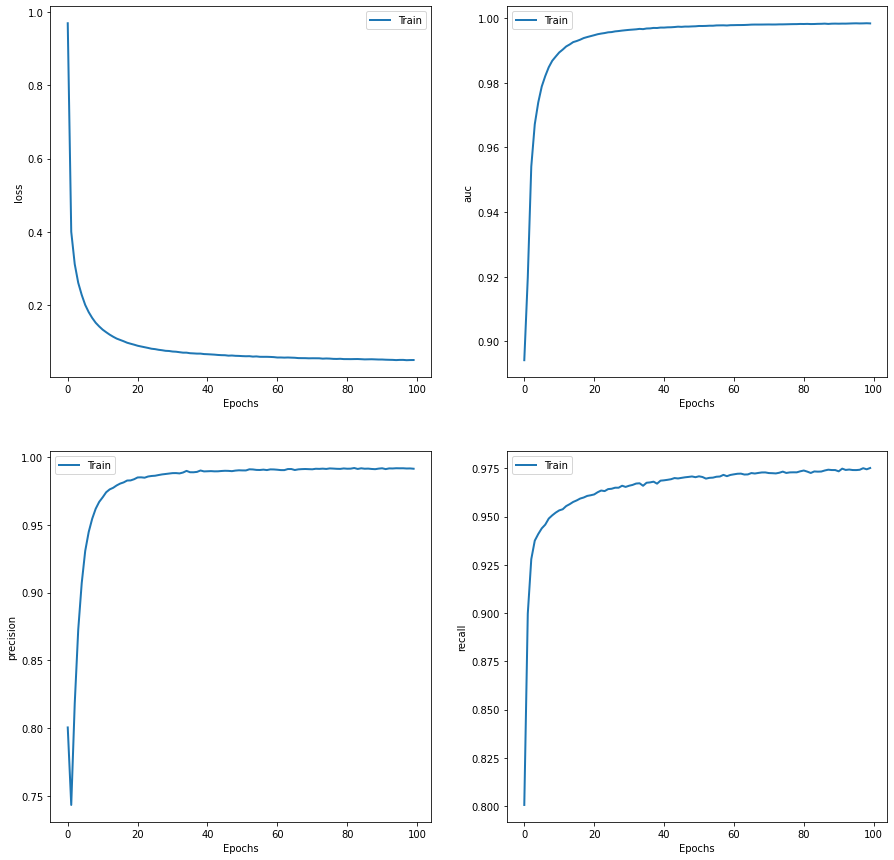

Area under ROC curve: 0.950
Area under Precision-Recall curve: 0.752
F1 Score: 0.438


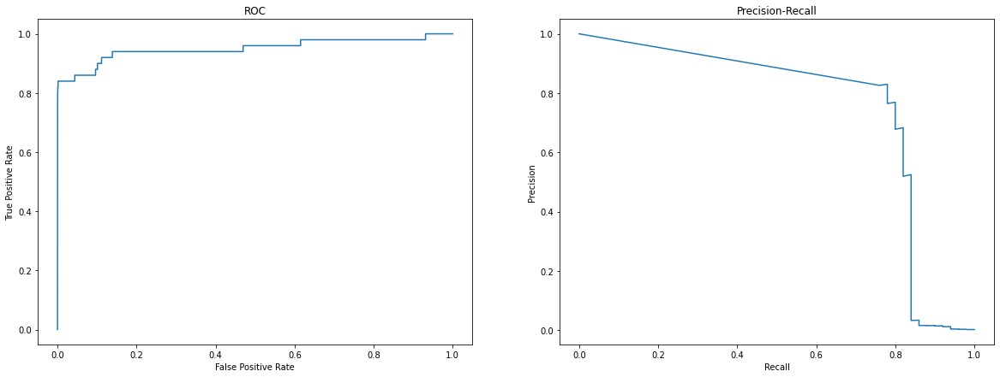

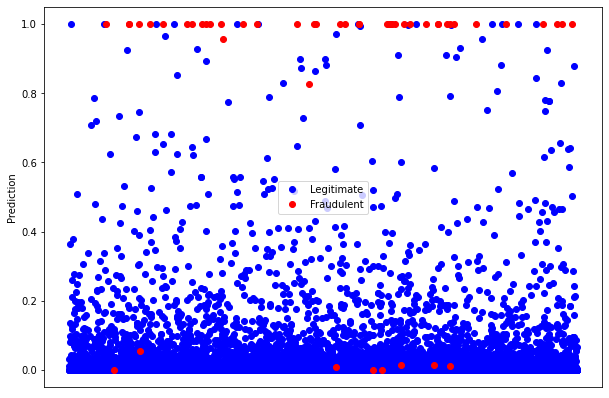

---------------------------------------------------------------
Model: "sequential_213"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_434 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_221 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_435 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Correct predictions for Train data: 98.789%
Train Precision: 99.464%
Train Recall: 98.107%
Correct predictions for Test data: 99.407%
Test Precision: 21.256%
Test Recall: 88.000%
Final Train auc: 99.826%
Final Train precision: 98.988%
Final Train recall: 97.382%


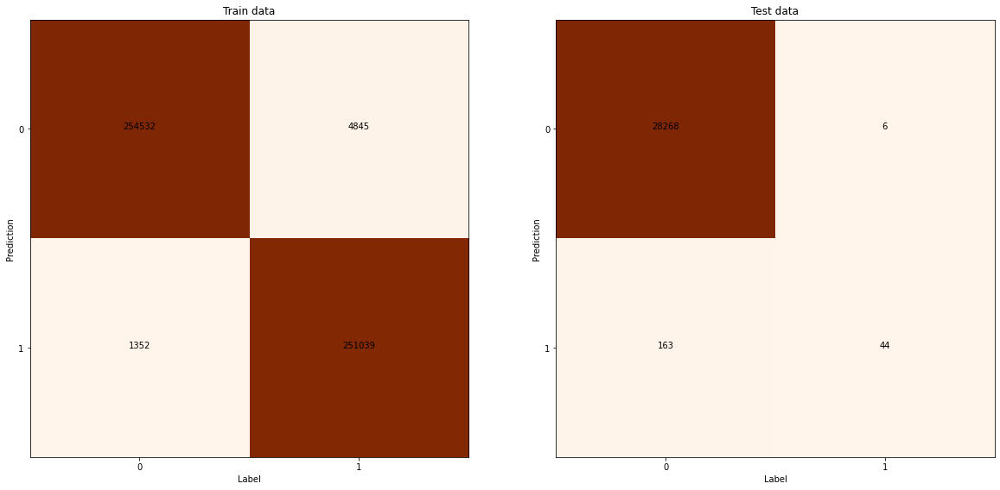

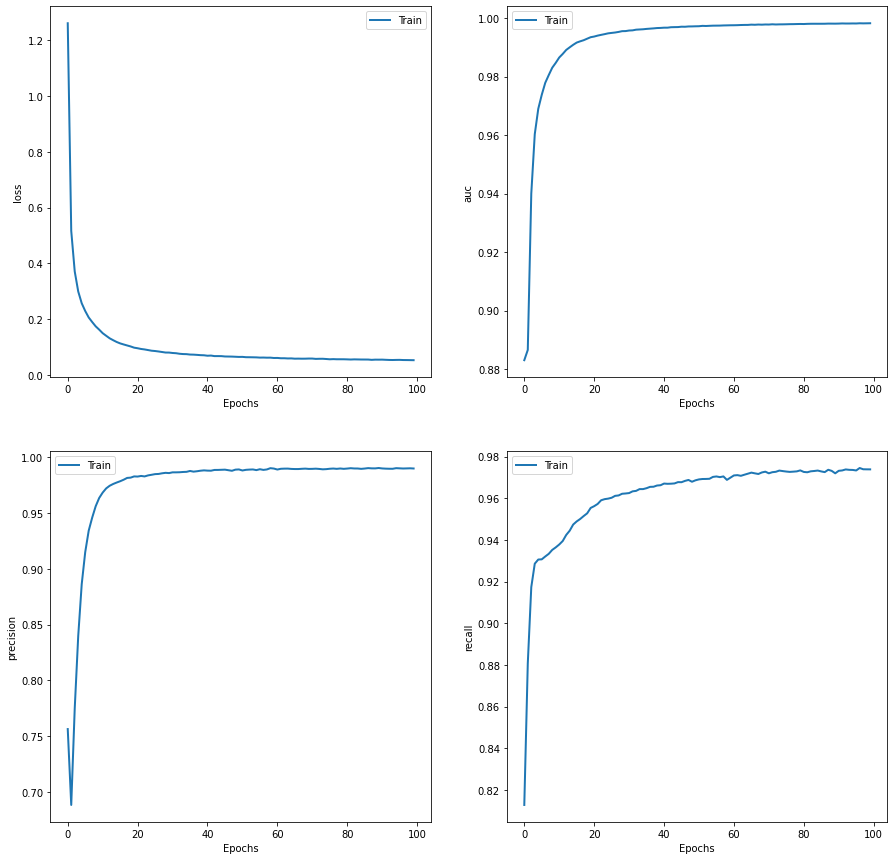

Area under ROC curve: 0.982
Area under Precision-Recall curve: 0.835
F1 Score: 0.342


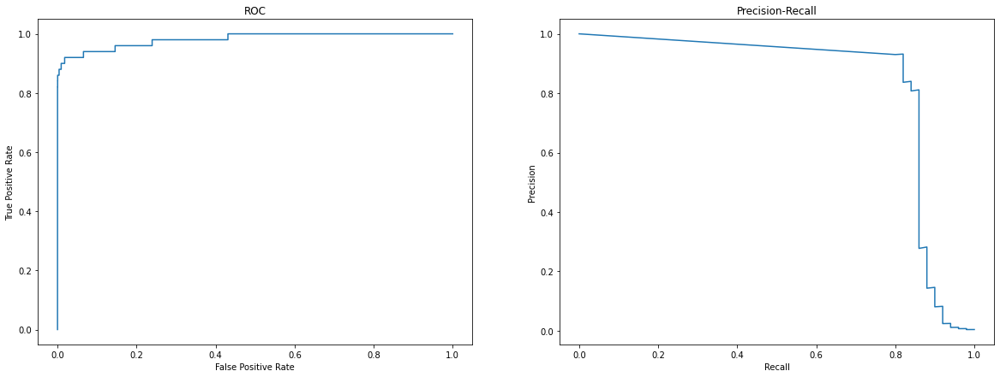

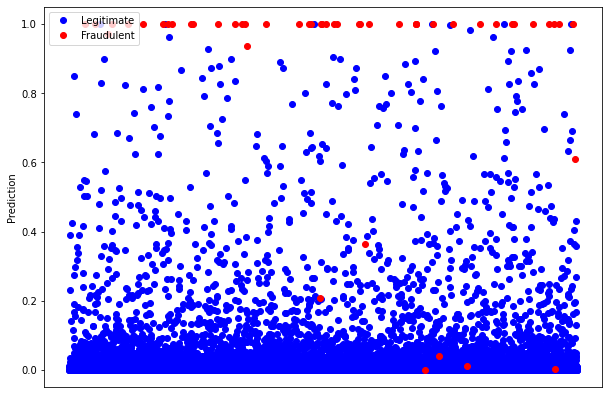

---------------------------------------------------------------
Model: "sequential_214"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_436 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_222 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_437 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Correct predictions for Train data: 98.456%
Train Precision: 99.324%
Train Recall: 97.577%
Correct predictions for Test data: 99.315%
Test Precision: 19.328%
Test Recall: 93.878%
Final Train auc: 99.794%
Final Train precision: 98.889%
Final Train recall: 97.163%


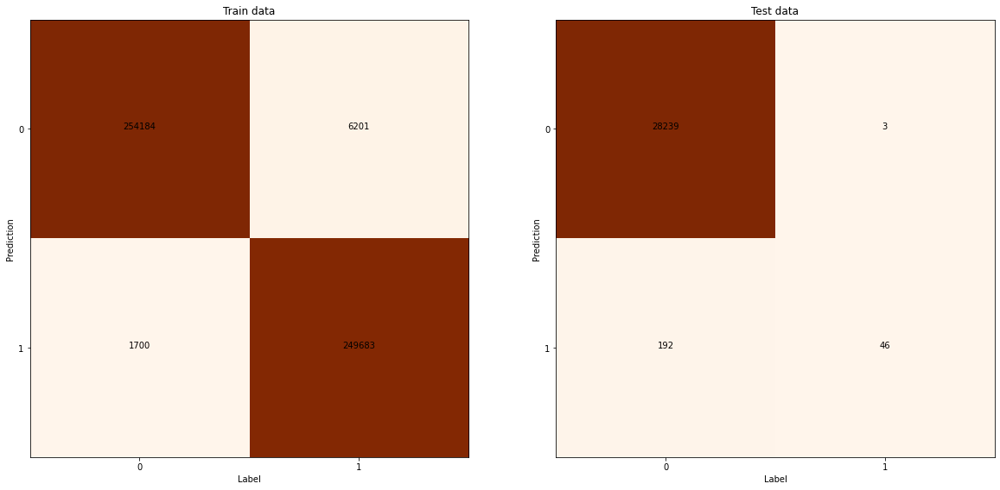

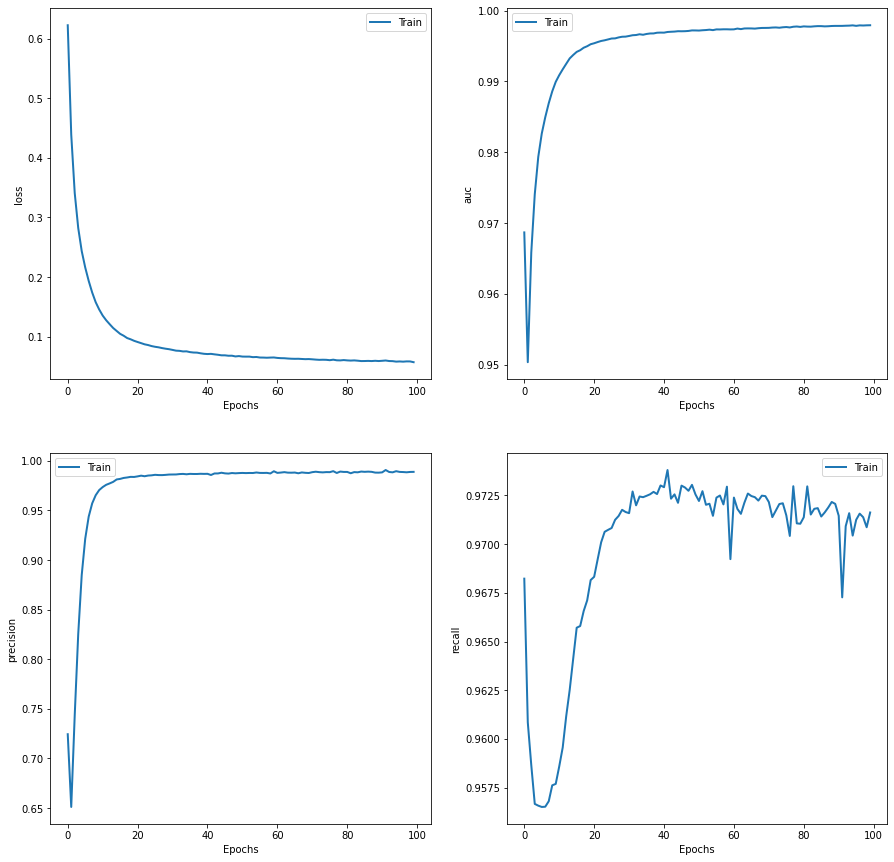

Area under ROC curve: 0.993
Area under Precision-Recall curve: 0.831
F1 Score: 0.321


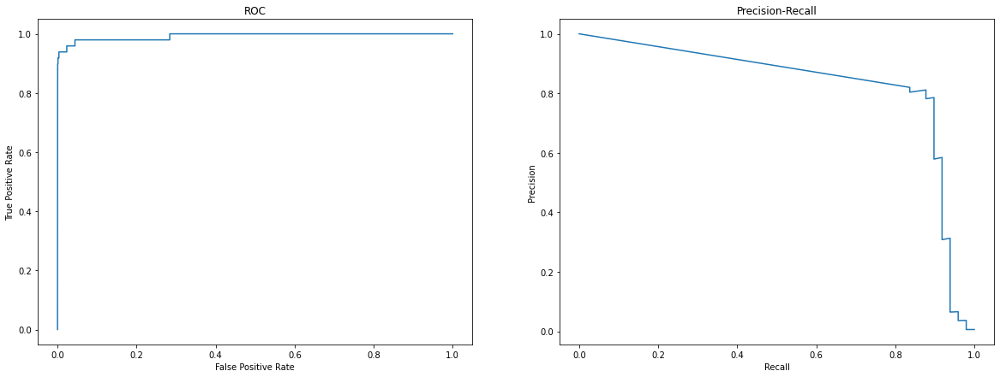

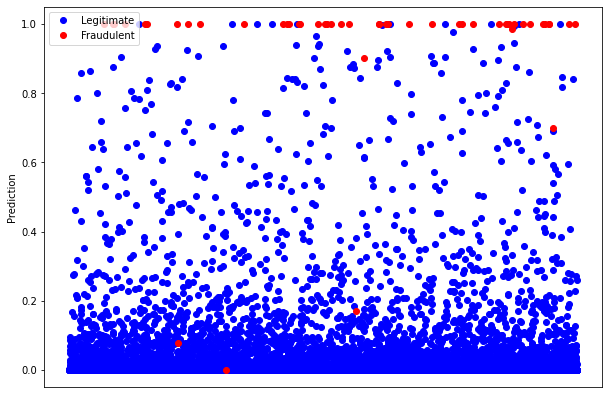

---------------------------------------------------------------
Model: "sequential_215"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_438 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_223 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_439 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Correct predictions for Train data: 98.618%
Train Precision: 99.397%
Train Recall: 97.829%
Correct predictions for Test data: 99.459%
Test Precision: 22.798%
Test Recall: 89.796%
Final Train auc: 99.820%
Final Train precision: 98.975%
Final Train recall: 97.389%


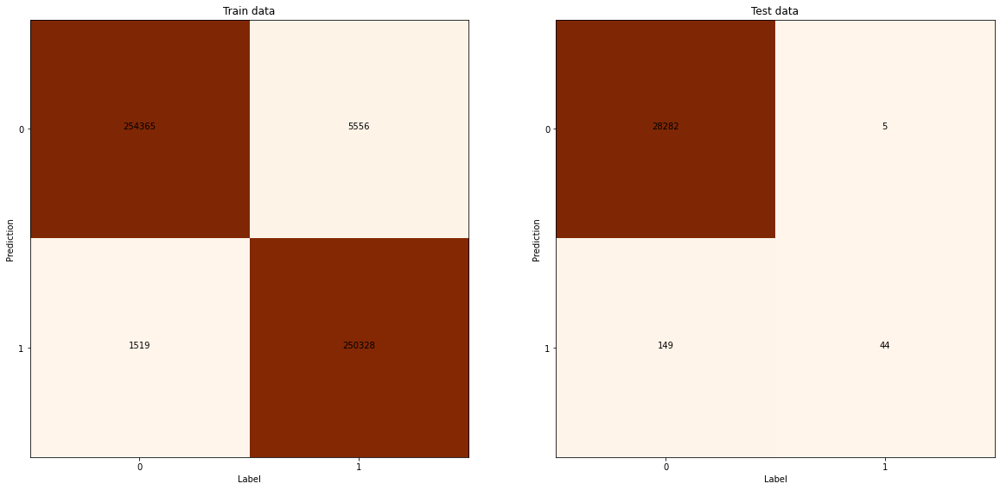

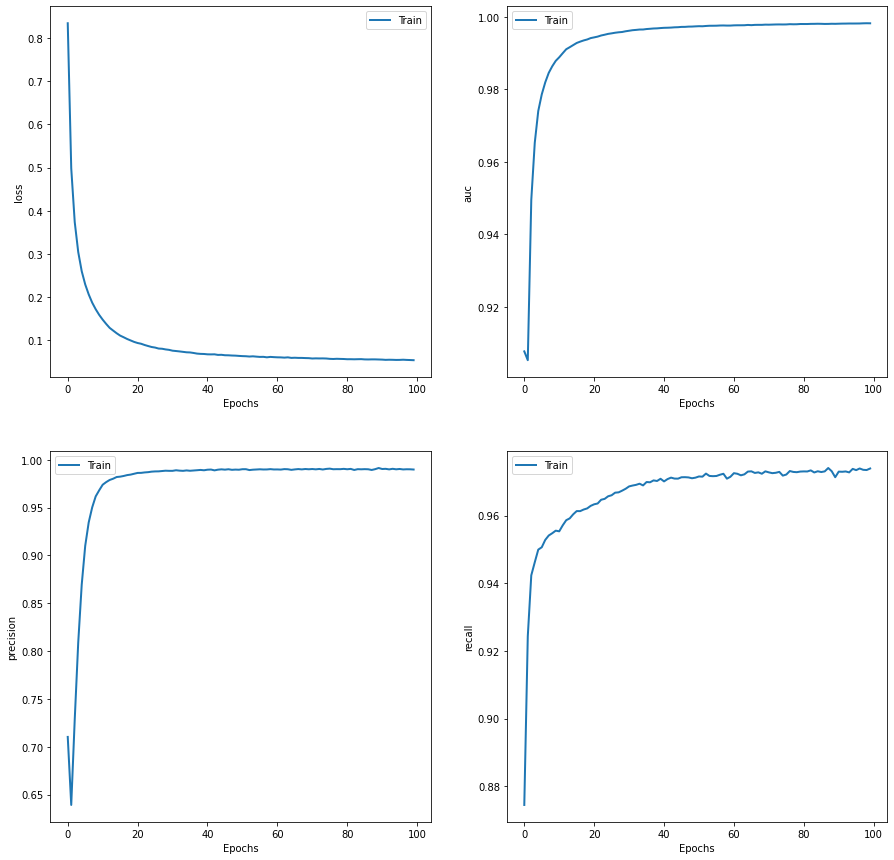

Area under ROC curve: 0.992
Area under Precision-Recall curve: 0.839
F1 Score: 0.364


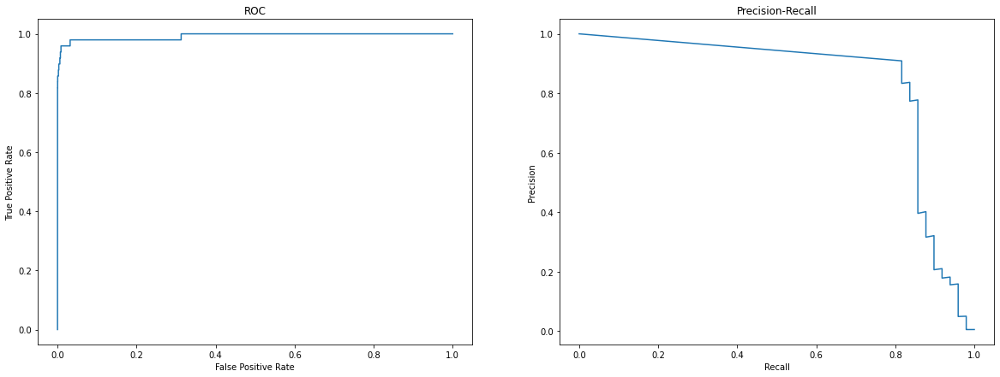

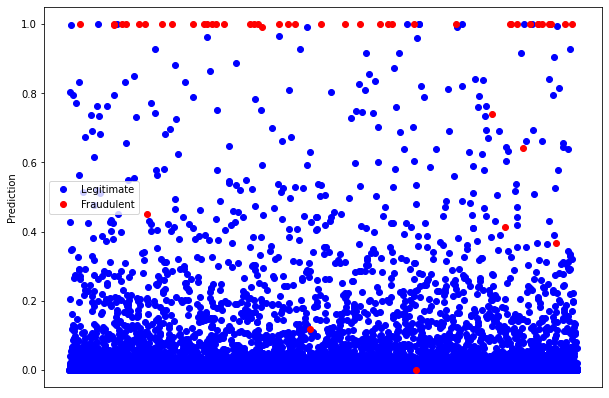

---------------------------------------------------------------
Model: "sequential_216"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_440 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_224 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_441 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Correct predictions for Train data: 98.698%
Train Precision: 99.493%
Train Recall: 97.896%
Correct predictions for Test data: 99.473%
Test Precision: 23.280%
Test Recall: 89.796%
Final Train auc: 99.848%
Final Train precision: 99.053%
Final Train recall: 97.373%


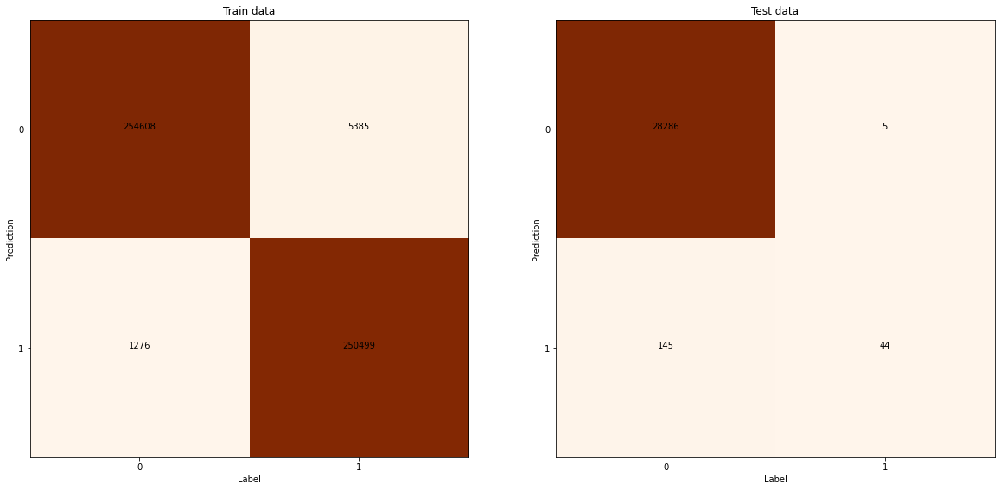

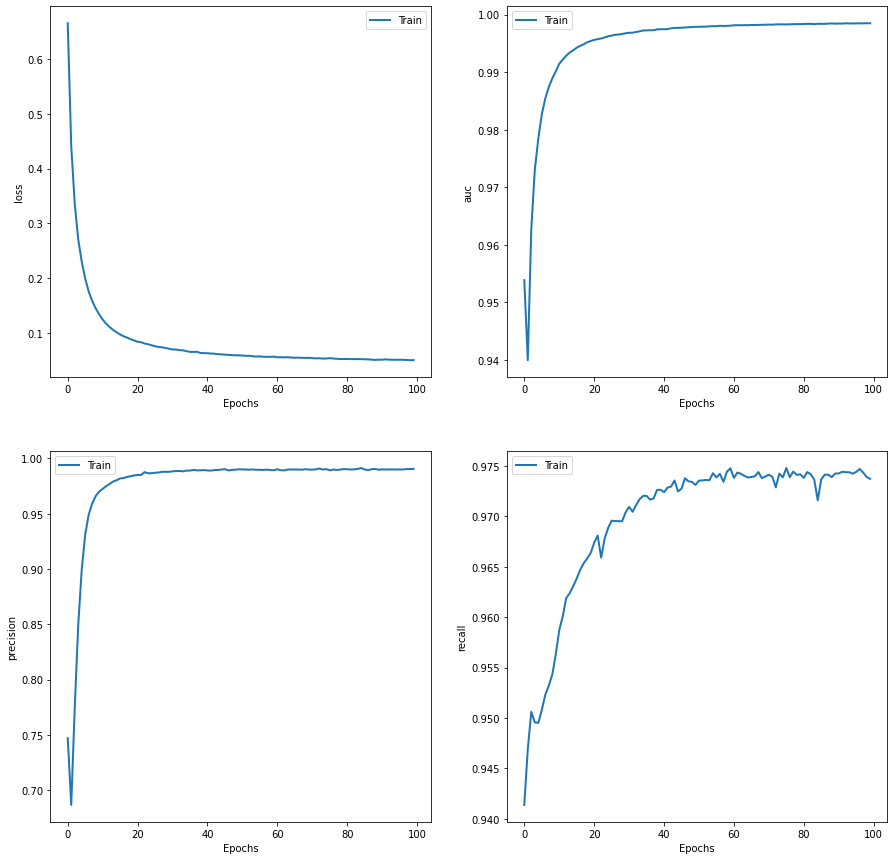

Area under ROC curve: 0.966
Area under Precision-Recall curve: 0.763
F1 Score: 0.370


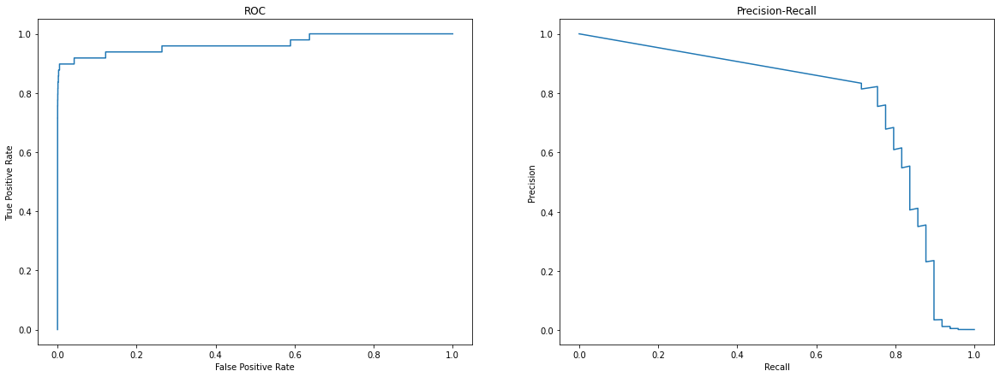

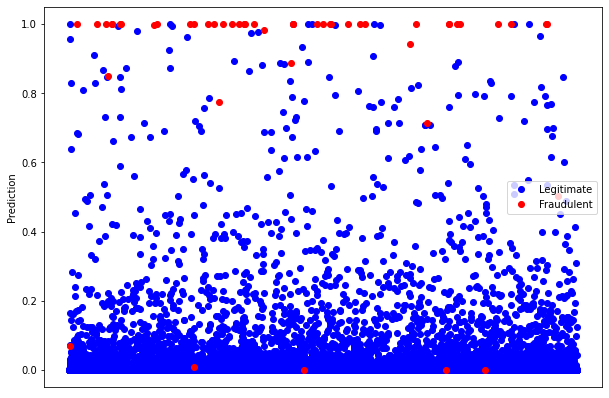

In [79]:
# SMOTE sampling k-fold
smotesamp_kfold = kfold(10, data, "SMOTE")

Final Train loss: 0.052695 (0.049464 - 0.055926)
Final Train auc: 0.998271 (0.998052 - 0.998489)
Final Train precision: 0.990009 (0.989042 - 0.990976)
Final Train recall: 0.973928 (0.971682 - 0.976175)


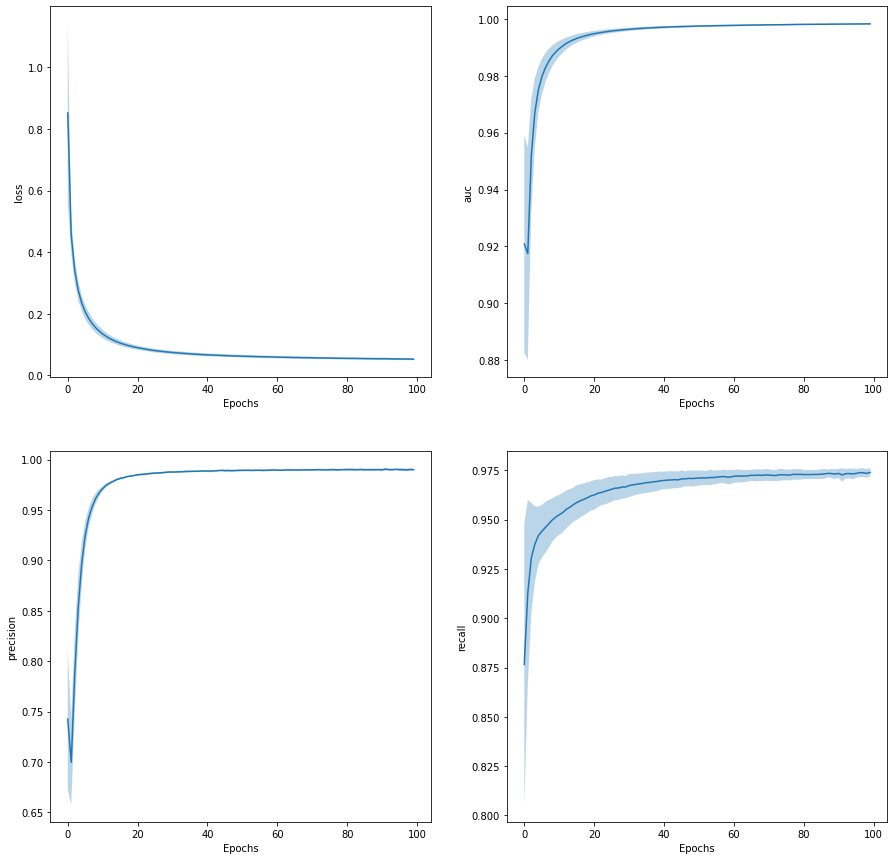

Test Precision: 0.222790 +/- 0.041222
Test Recall: 0.886179 +/- 0.054690


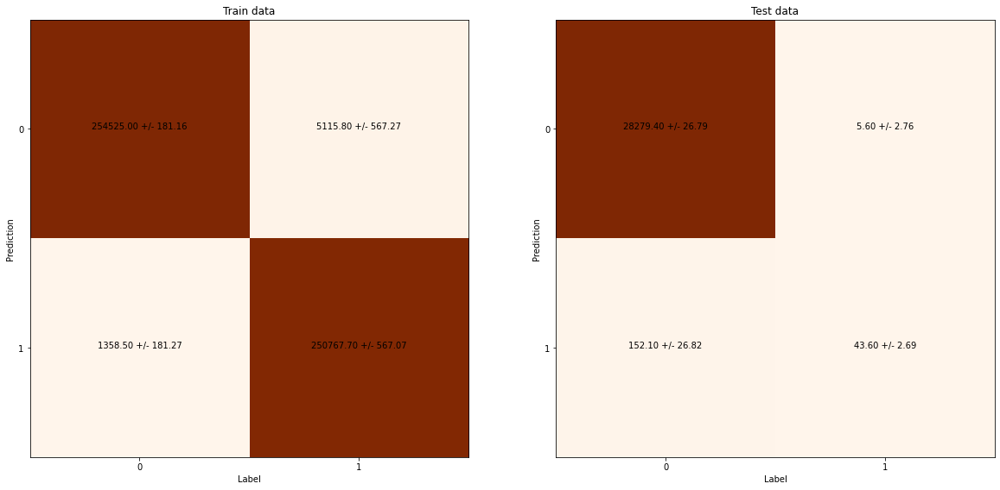

F1 Score: 0.359 +/- 0.031
Area under ROC curve: 0.964789 (0.938811 - 0.990767)
Area under Precision-Recall curve: 0.809235 (0.758270 - 0.860200)


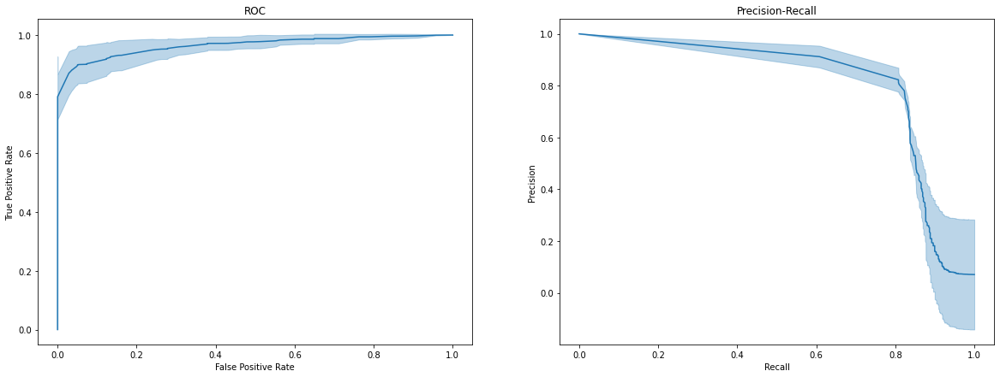

In [80]:
smotesamp_stats = kfold_stats(*smotesamp_kfold)

---------------------------------------------------------------
Model: "sequential_217"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_442 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_225 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_443 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Correct predictions for Train data: 98.692%
Train Precision: 99.574%
Train Recall: 97.801%
Correct predictions for Test data: 99.593%
Test Precision: 28.931%
Test Recall: 93.878%
Final Train auc: 99.799%
Final Train precision: 99.143%
Final Train recall: 97.447%


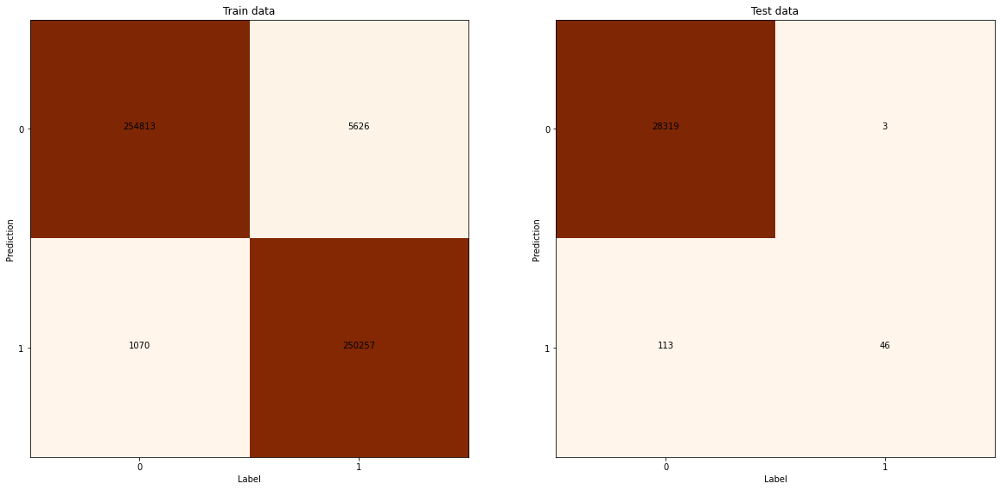

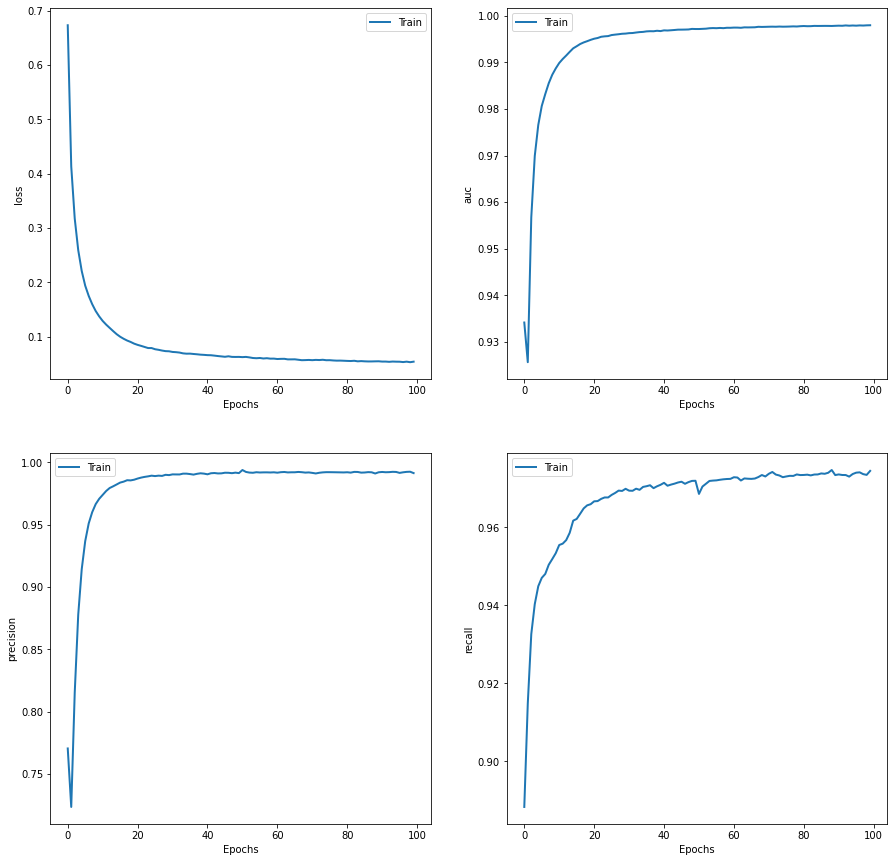

Area under ROC curve: 0.981
Area under Precision-Recall curve: 0.823
F1 Score: 0.442


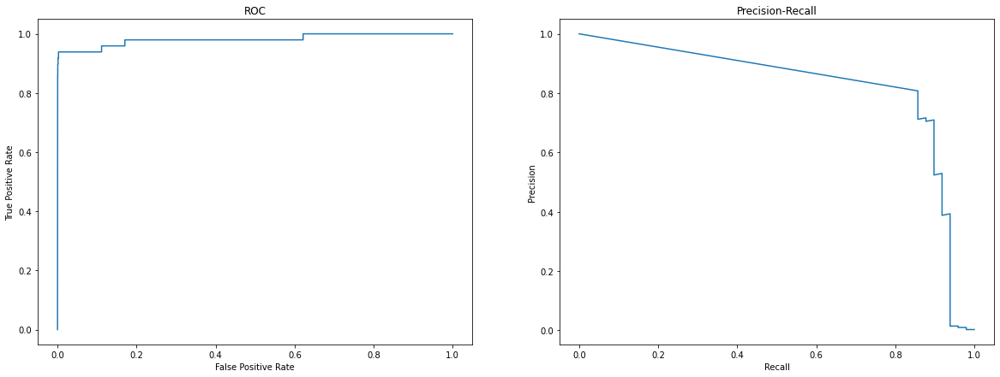

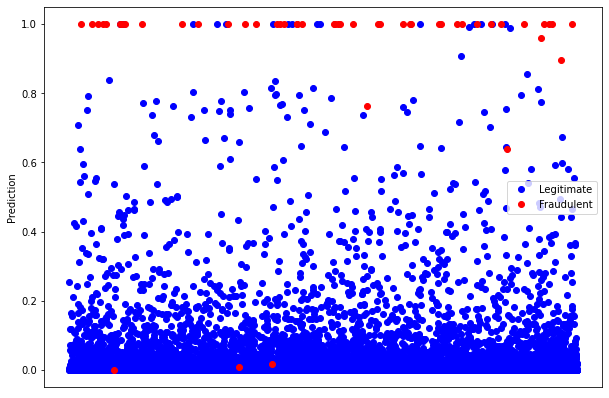

---------------------------------------------------------------
Model: "sequential_218"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_444 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_226 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_445 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Correct predictions for Train data: 98.798%
Train Precision: 99.639%
Train Recall: 97.950%
Correct predictions for Test data: 99.600%
Test Precision: 28.477%
Test Recall: 87.755%
Final Train auc: 99.830%
Final Train precision: 99.293%
Final Train recall: 97.285%


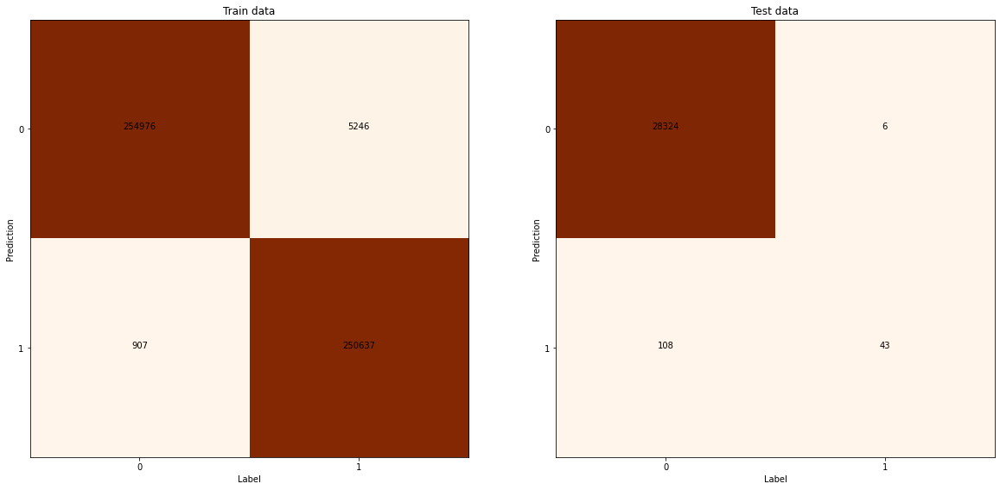

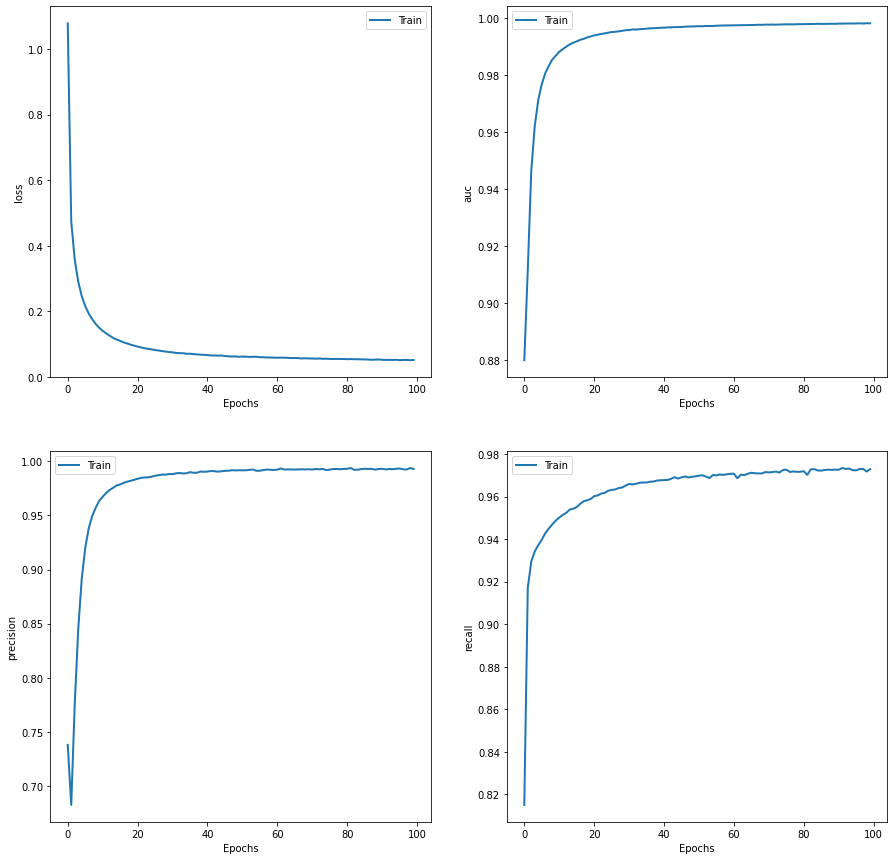

Area under ROC curve: 0.965
Area under Precision-Recall curve: 0.782
F1 Score: 0.430


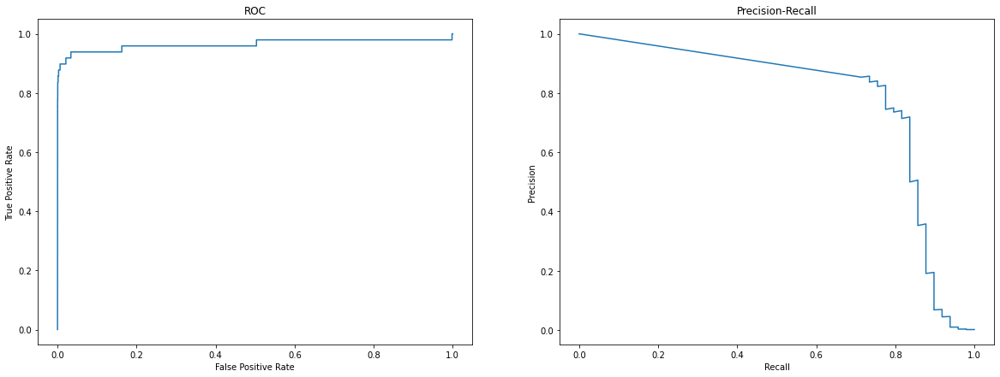

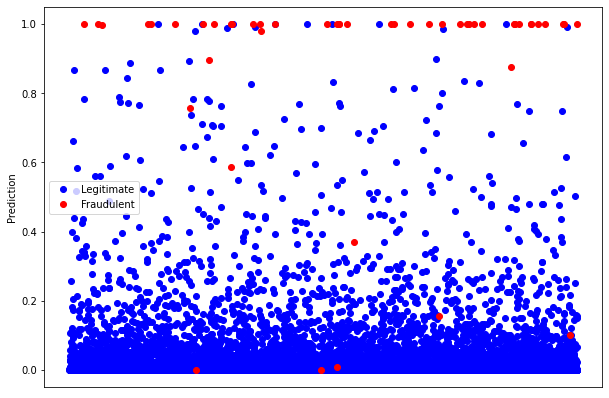

---------------------------------------------------------------
Model: "sequential_219"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_446 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_227 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_447 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Correct predictions for Train data: 98.939%
Train Precision: 99.624%
Train Recall: 98.249%
Correct predictions for Test data: 99.530%
Test Precision: 23.926%
Test Recall: 79.592%
Final Train auc: 99.844%
Final Train precision: 99.271%
Final Train recall: 97.638%


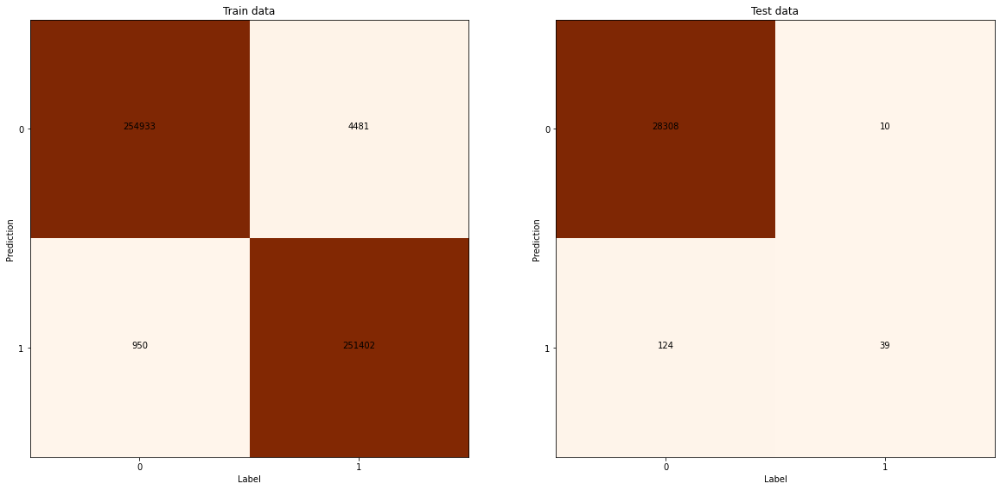

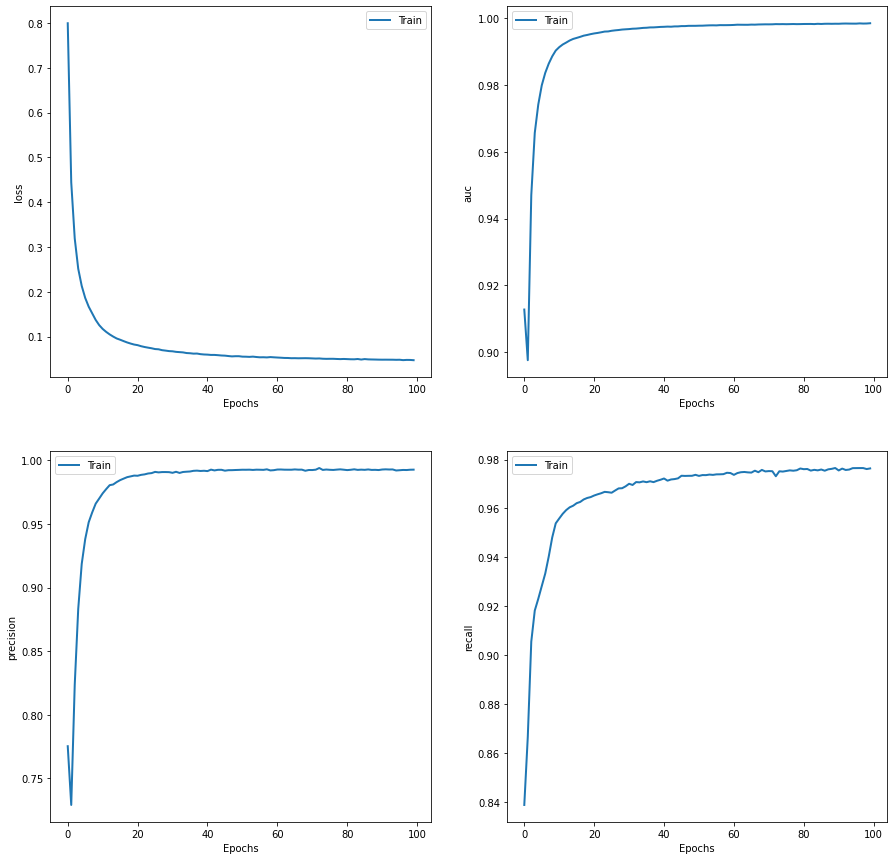

Area under ROC curve: 0.970
Area under Precision-Recall curve: 0.709
F1 Score: 0.368


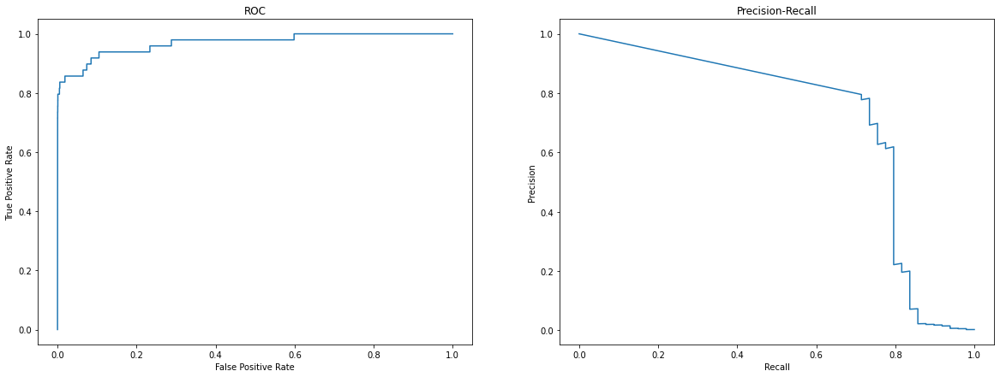

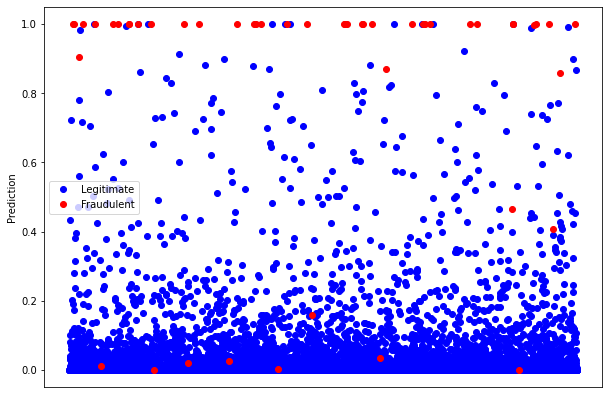

---------------------------------------------------------------
Model: "sequential_220"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_448 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_228 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_449 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Correct predictions for Train data: 98.711%
Train Precision: 99.550%
Train Recall: 97.865%
Correct predictions for Test data: 99.561%
Test Precision: 26.543%
Test Recall: 87.755%
Final Train auc: 99.820%
Final Train precision: 99.074%
Final Train recall: 97.556%


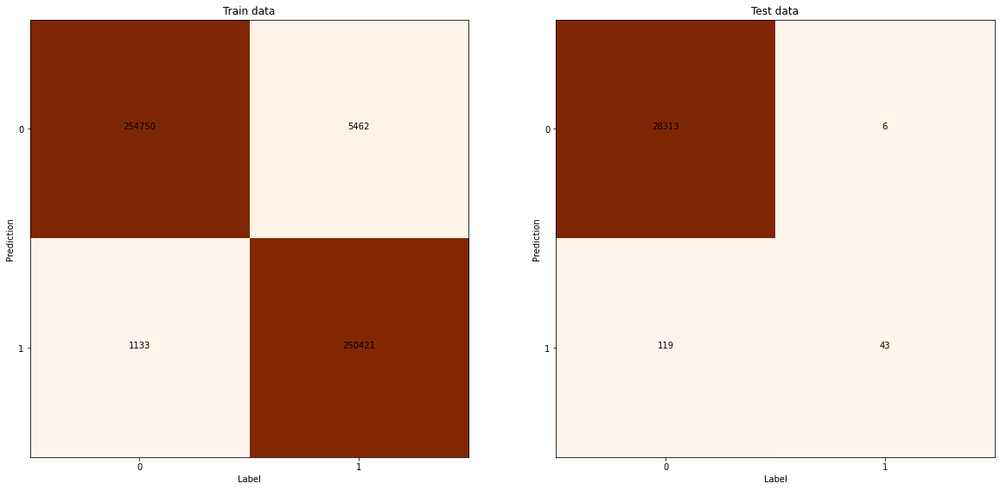

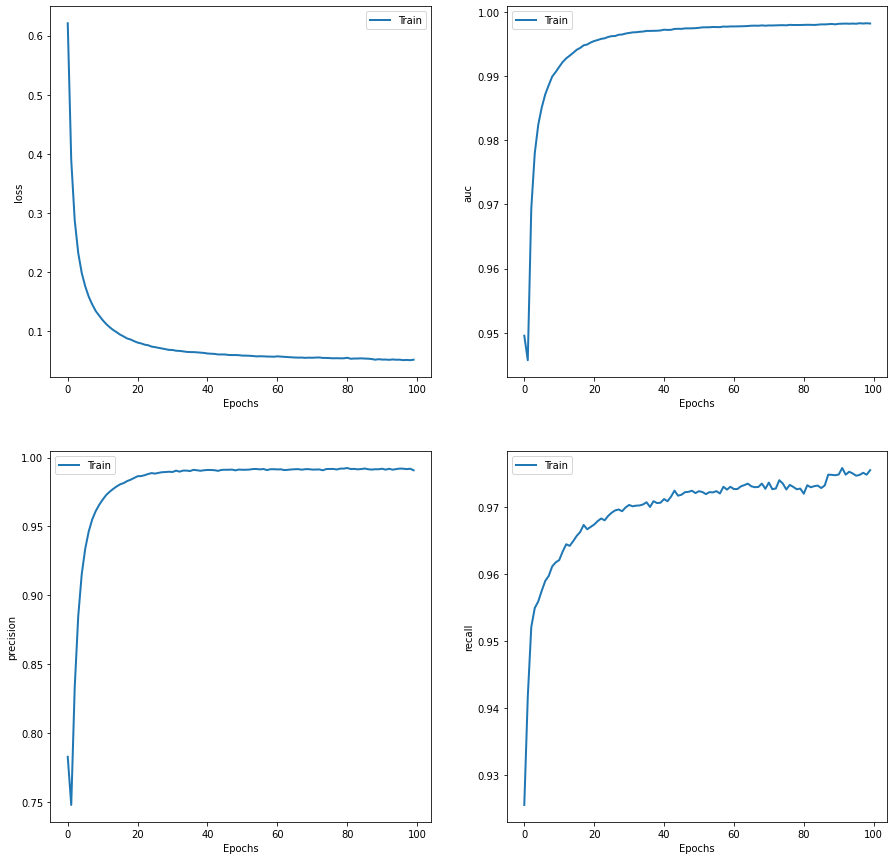

Area under ROC curve: 0.978
Area under Precision-Recall curve: 0.836
F1 Score: 0.408


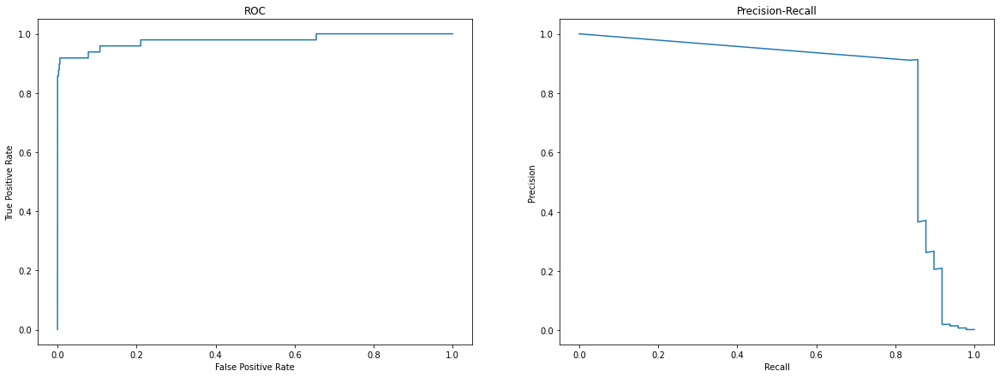

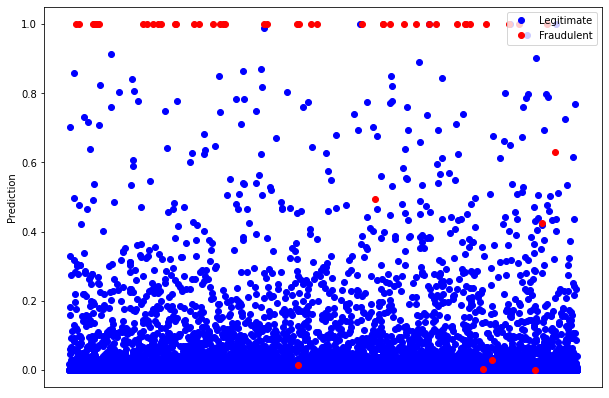

---------------------------------------------------------------
Model: "sequential_221"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_450 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_229 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_451 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Correct predictions for Train data: 98.966%
Train Precision: 99.515%
Train Recall: 98.411%
Correct predictions for Test data: 99.480%
Test Precision: 23.243%
Test Recall: 87.755%
Final Train auc: 99.845%
Final Train precision: 99.015%
Final Train recall: 97.512%


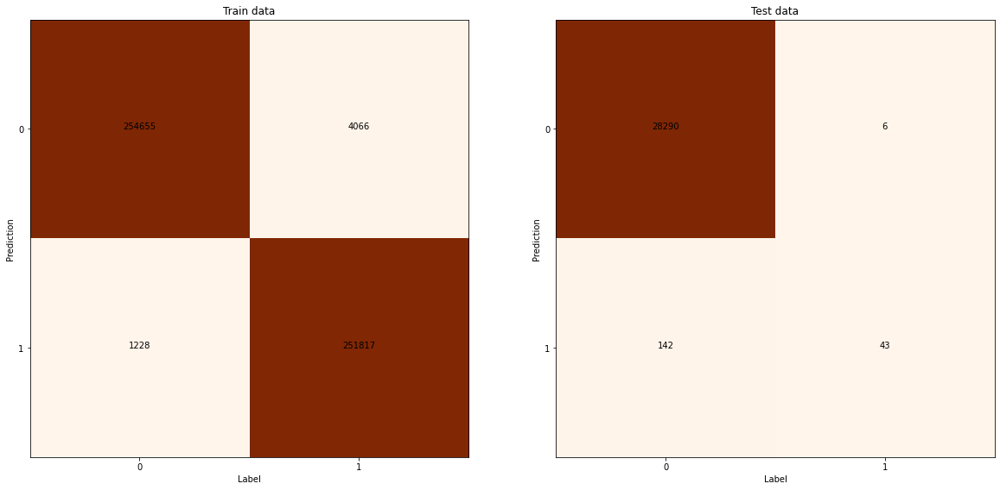

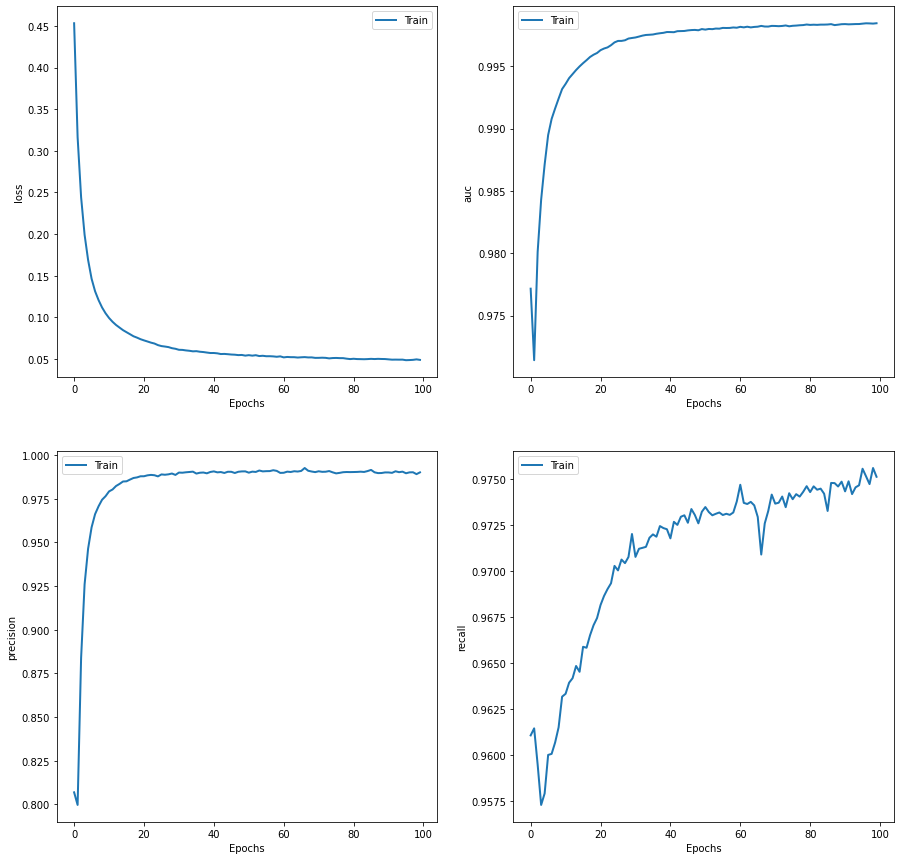

Area under ROC curve: 0.969
Area under Precision-Recall curve: 0.834
F1 Score: 0.368


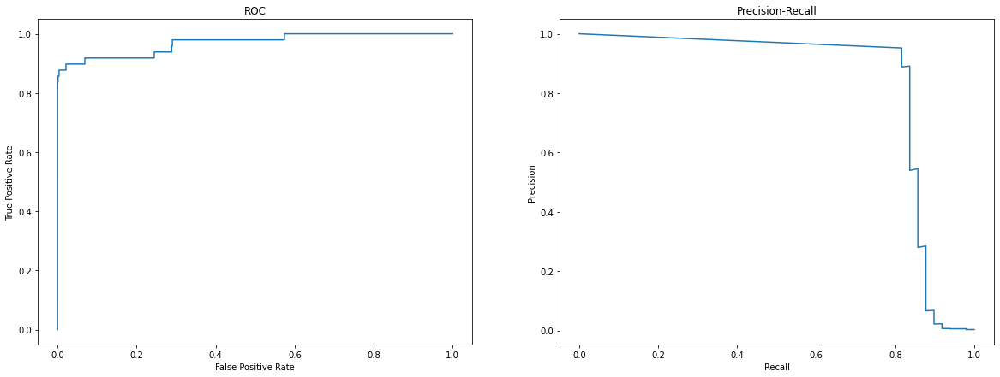

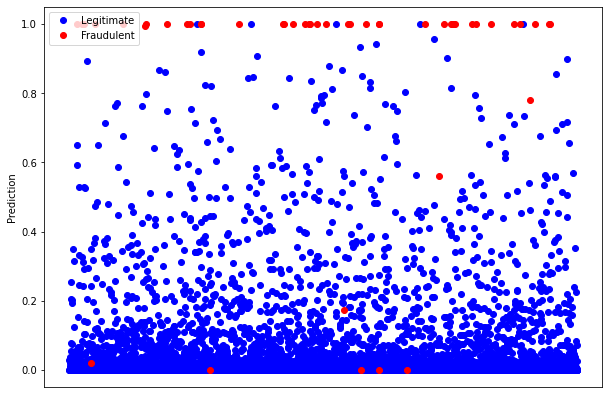

---------------------------------------------------------------
Model: "sequential_222"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_452 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_230 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_453 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Correct predictions for Train data: 98.804%
Train Precision: 99.600%
Train Recall: 98.001%
Correct predictions for Test data: 99.610%
Test Precision: 30.065%
Test Recall: 92.000%
Final Train auc: 99.843%
Final Train precision: 99.160%
Final Train recall: 97.370%


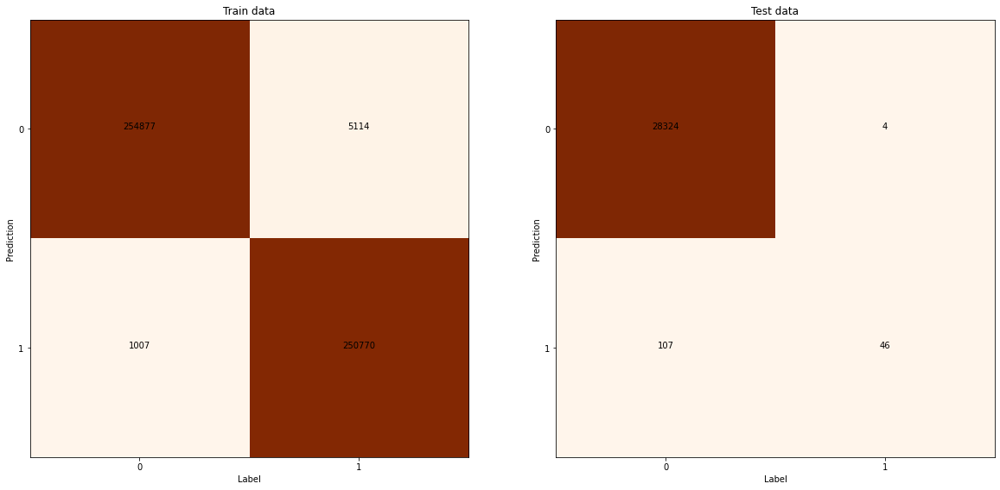

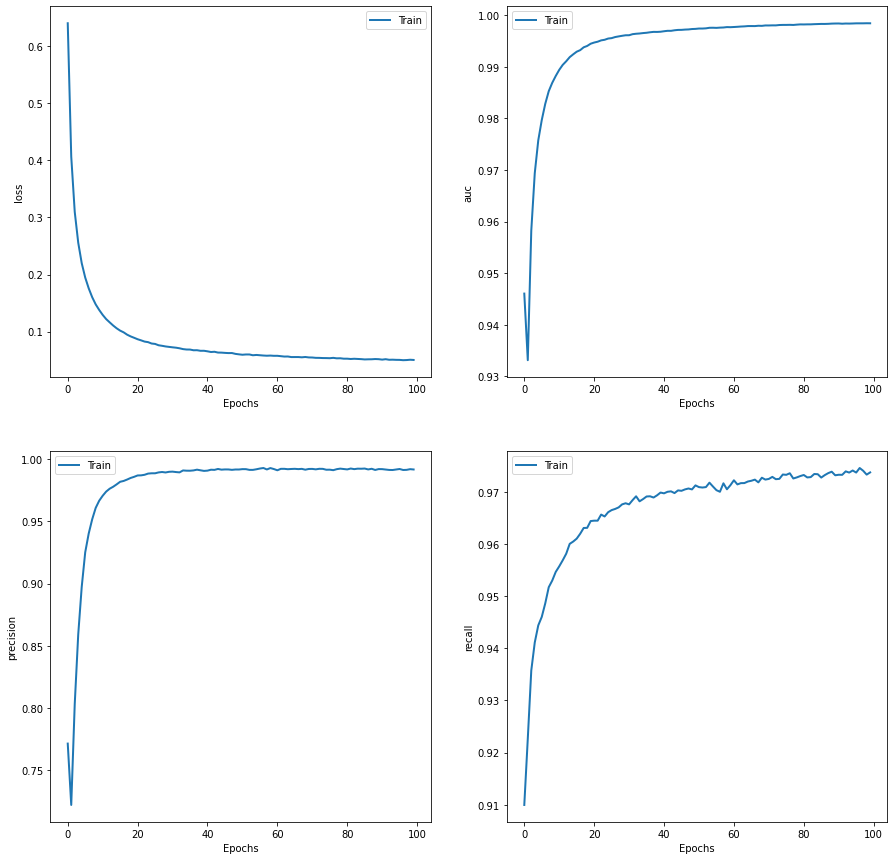

Area under ROC curve: 0.984
Area under Precision-Recall curve: 0.851
F1 Score: 0.453


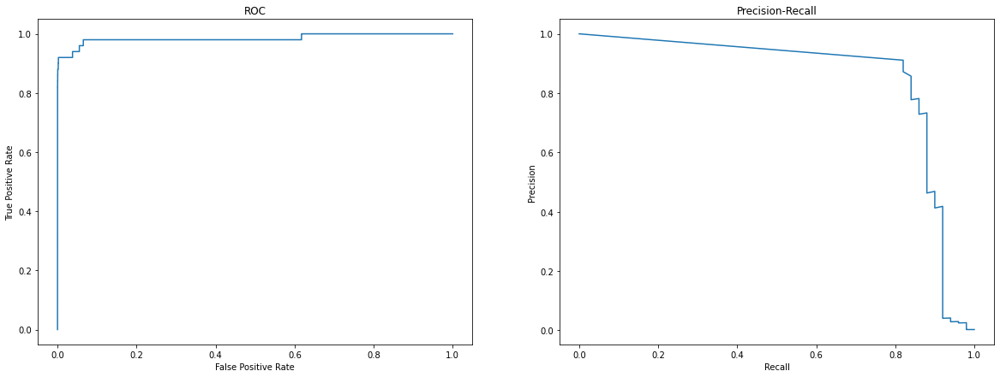

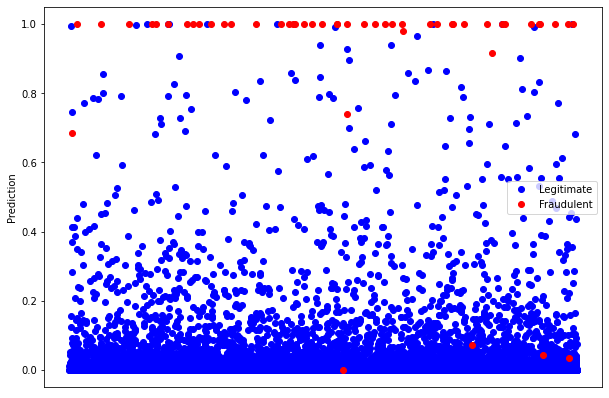

---------------------------------------------------------------
Model: "sequential_223"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_454 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_231 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_455 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Correct predictions for Train data: 98.779%
Train Precision: 99.565%
Train Recall: 97.987%
Correct predictions for Test data: 99.565%
Test Precision: 27.711%
Test Recall: 92.000%
Final Train auc: 99.822%
Final Train precision: 99.109%
Final Train recall: 97.381%


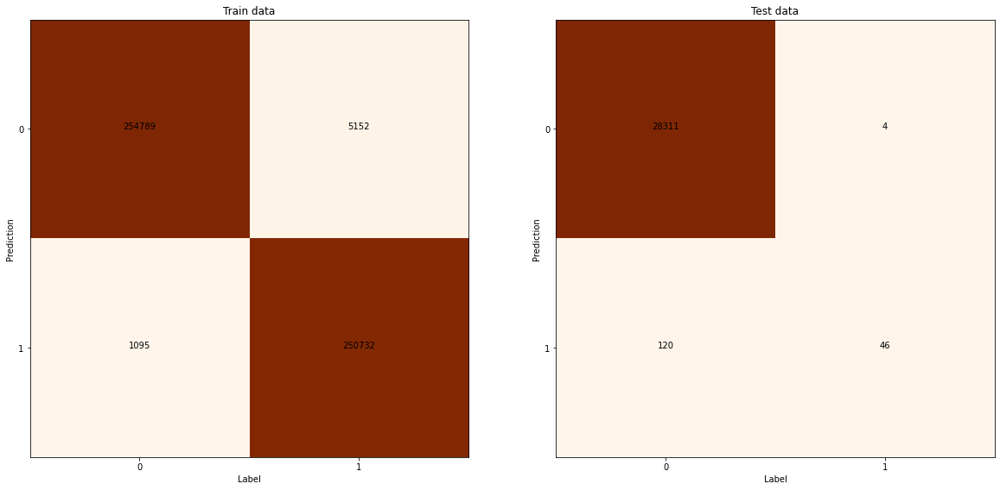

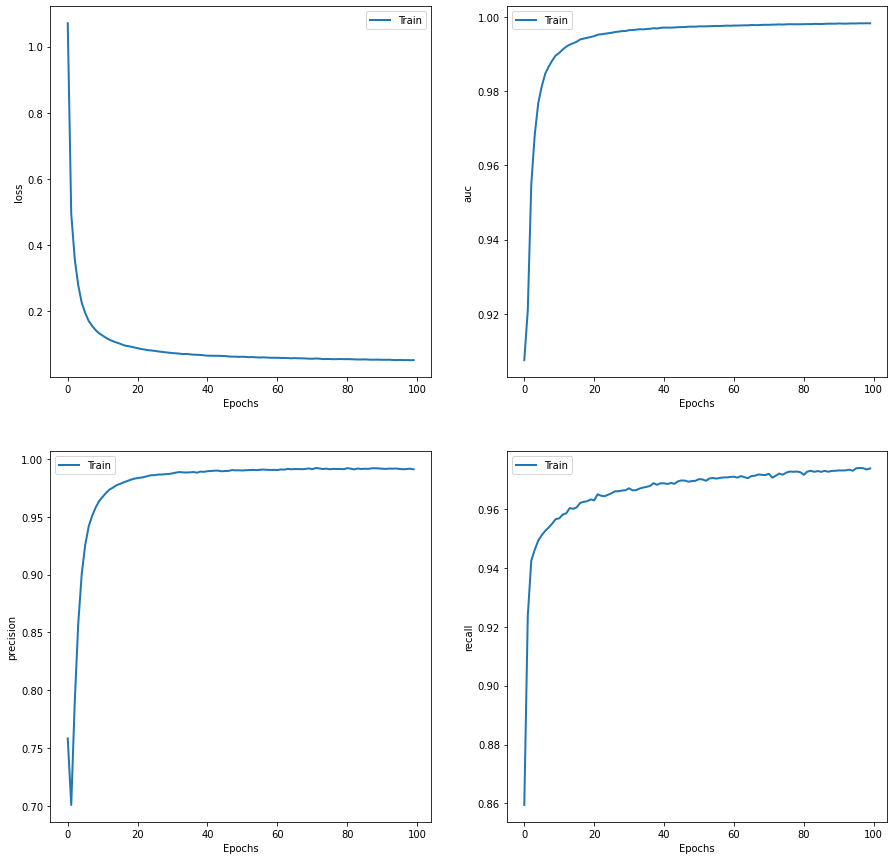

Area under ROC curve: 0.981
Area under Precision-Recall curve: 0.843
F1 Score: 0.426


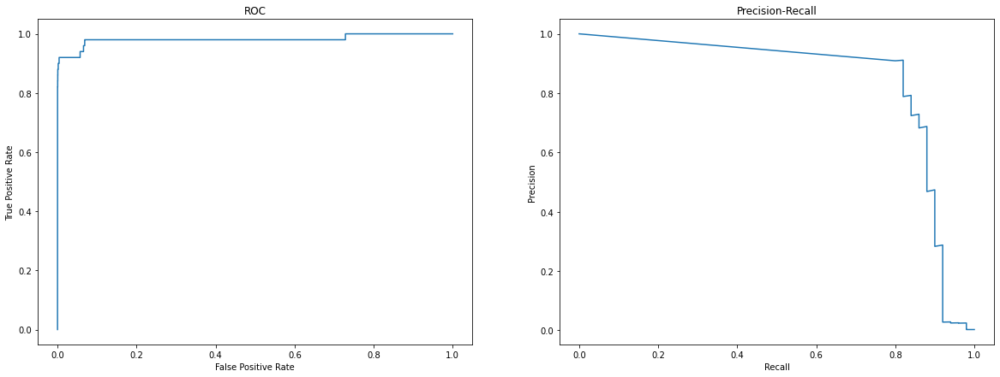

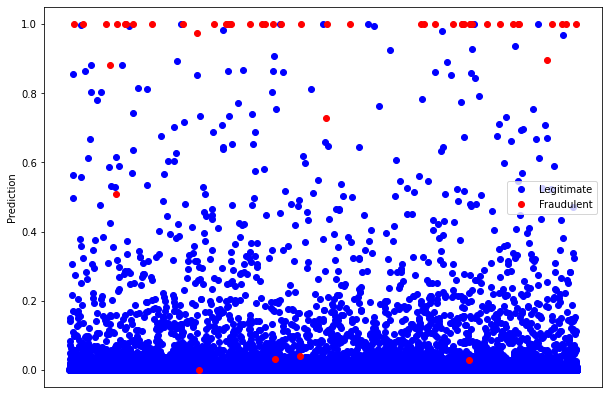

---------------------------------------------------------------
Model: "sequential_224"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_456 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_232 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_457 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Correct predictions for Train data: 98.843%
Train Precision: 99.603%
Train Recall: 98.078%
Correct predictions for Test data: 99.621%
Test Precision: 29.655%
Test Recall: 87.755%
Final Train auc: 99.814%
Final Train precision: 99.163%
Final Train recall: 97.177%


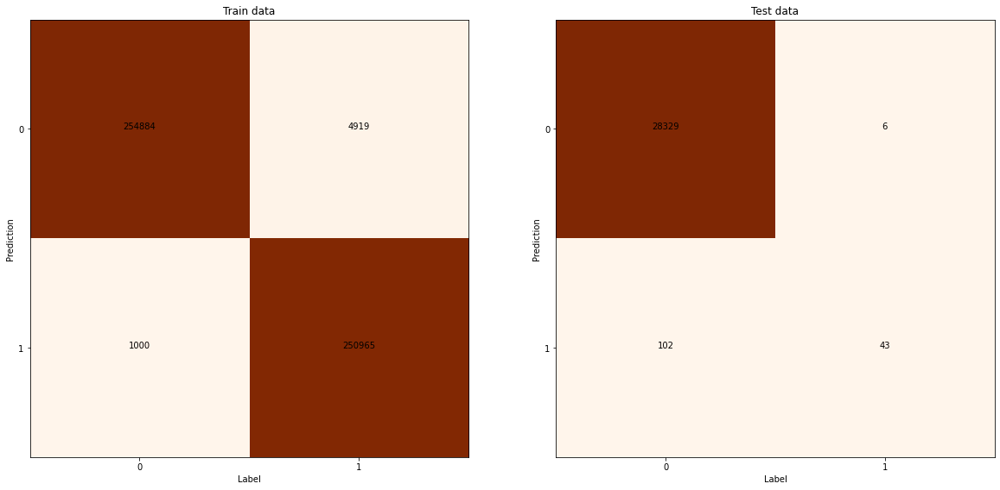

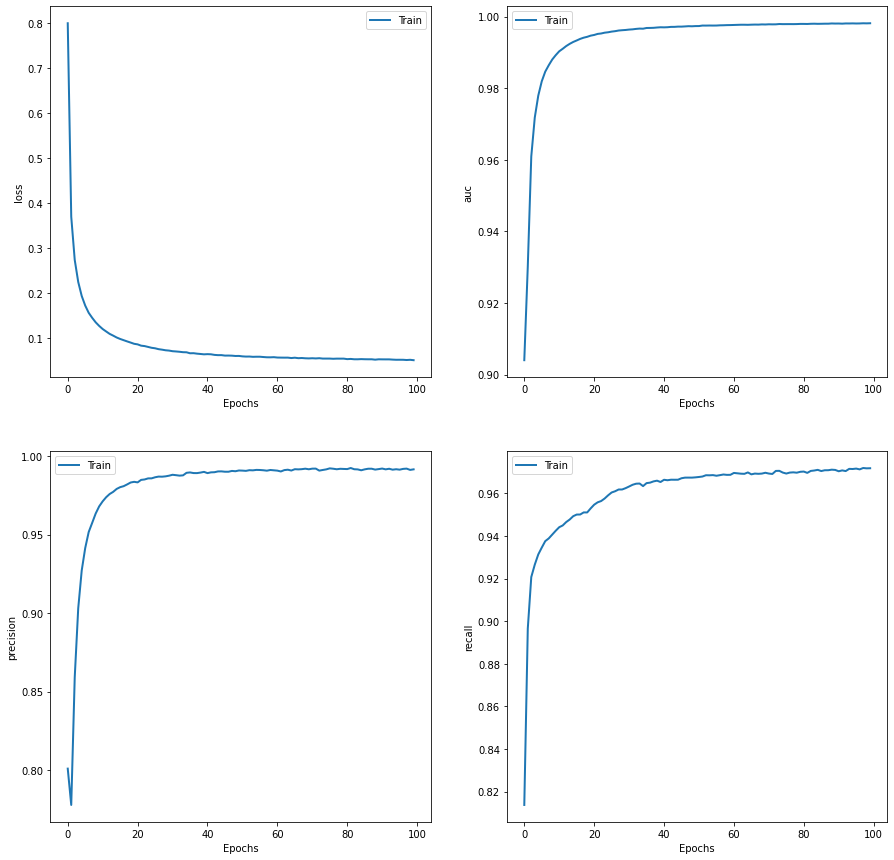

Area under ROC curve: 0.982
Area under Precision-Recall curve: 0.809
F1 Score: 0.443


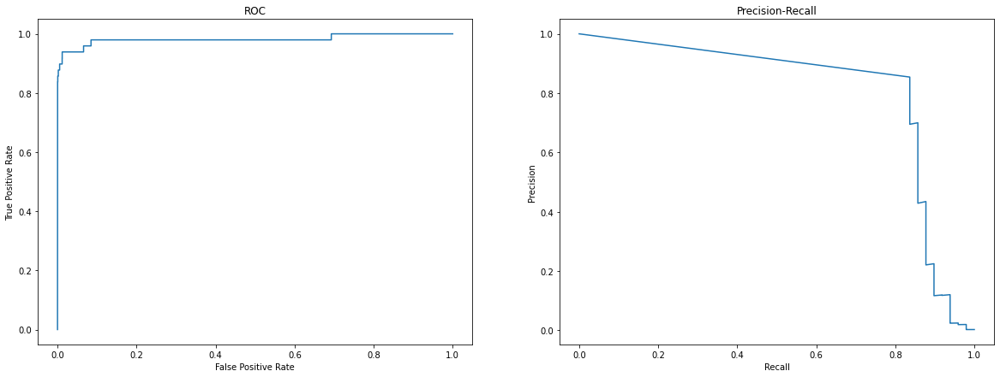

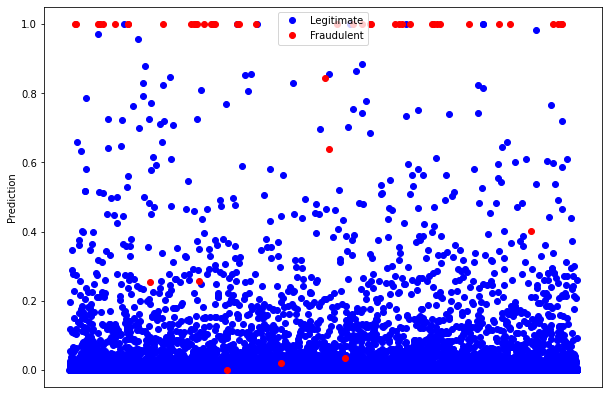

---------------------------------------------------------------
Model: "sequential_225"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_458 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_233 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_459 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Correct predictions for Train data: 98.605%
Train Precision: 99.499%
Train Recall: 97.701%
Correct predictions for Test data: 99.529%
Test Precision: 25.434%
Test Recall: 89.796%
Final Train auc: 99.800%
Final Train precision: 99.263%
Final Train recall: 97.306%


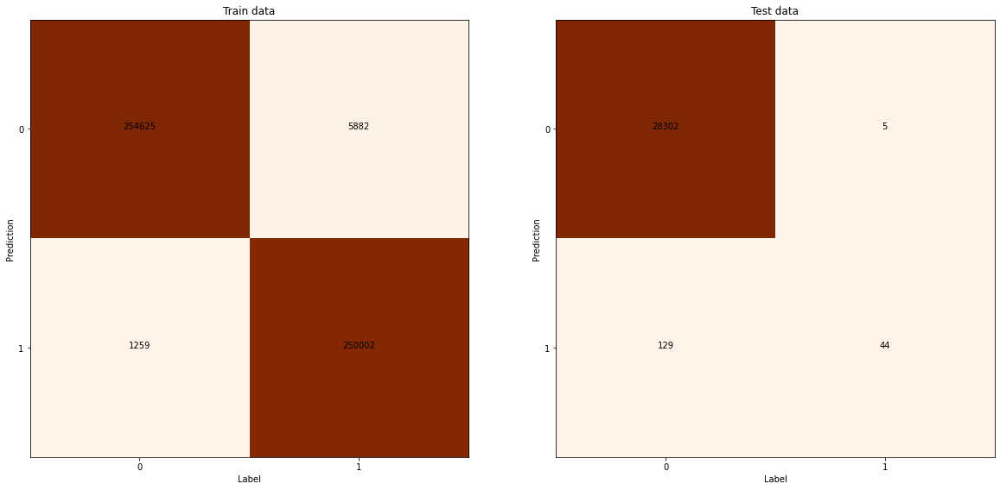

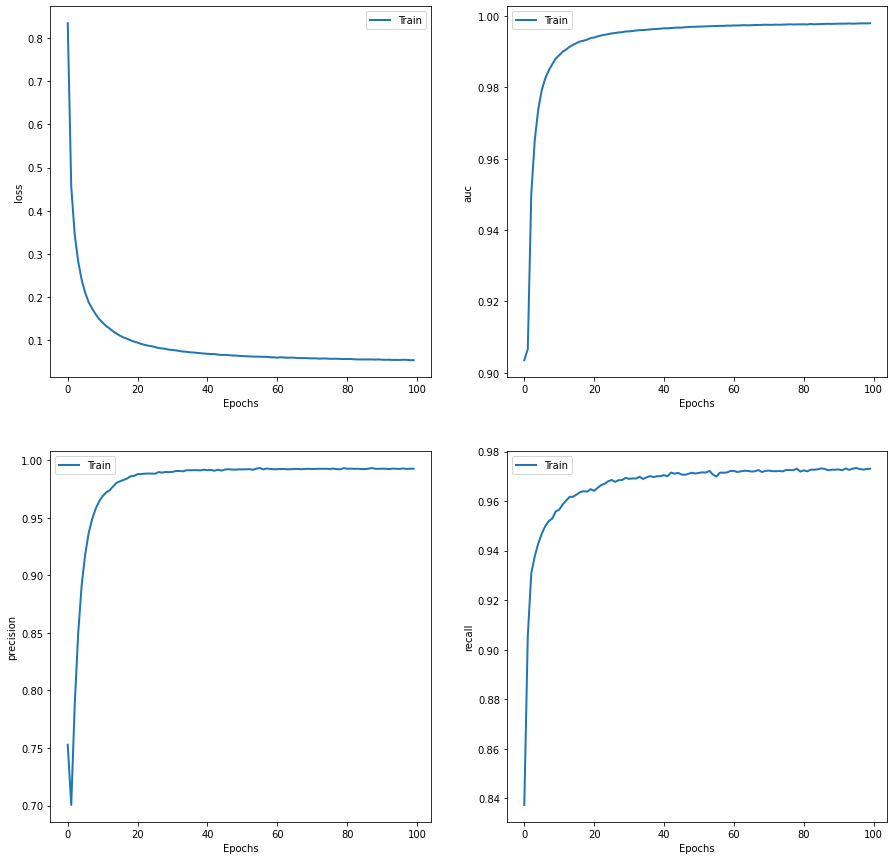

Area under ROC curve: 0.985
Area under Precision-Recall curve: 0.807
F1 Score: 0.396


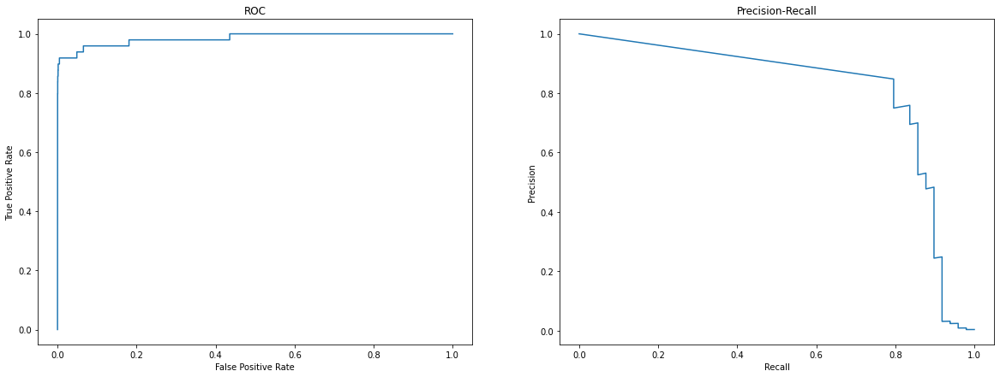

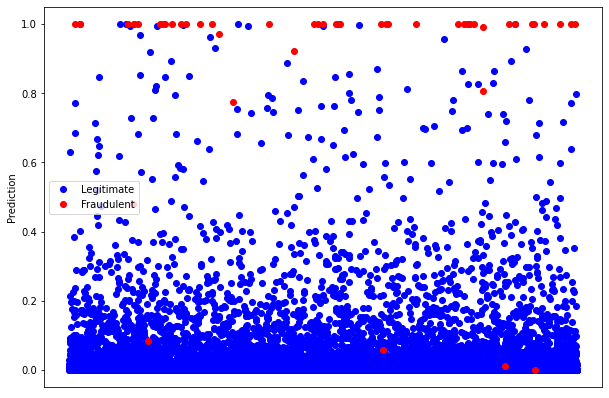

---------------------------------------------------------------
Model: "sequential_226"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_460 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_234 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_461 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Correct predictions for Train data: 98.709%
Train Precision: 99.507%
Train Recall: 97.902%
Correct predictions for Test data: 99.445%
Test Precision: 21.466%
Test Recall: 83.673%
Final Train auc: 99.810%
Final Train precision: 99.289%
Final Train recall: 97.529%


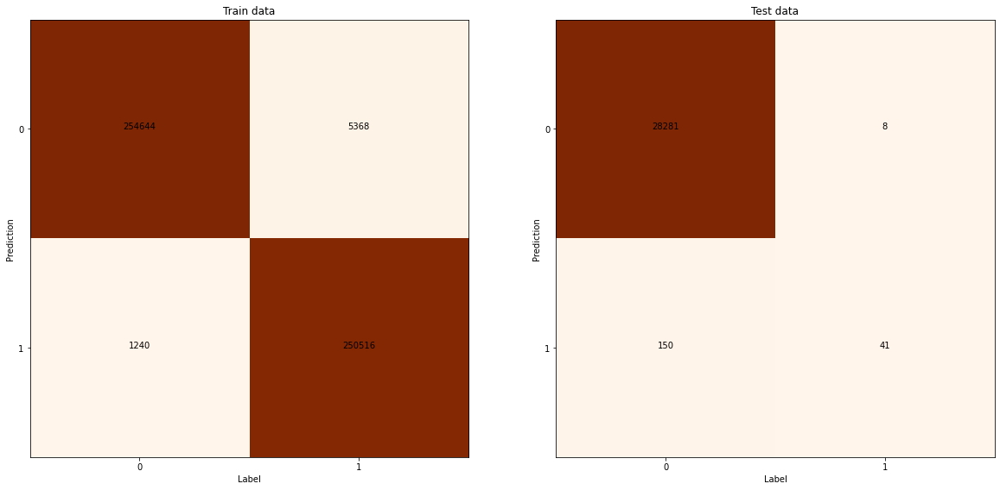

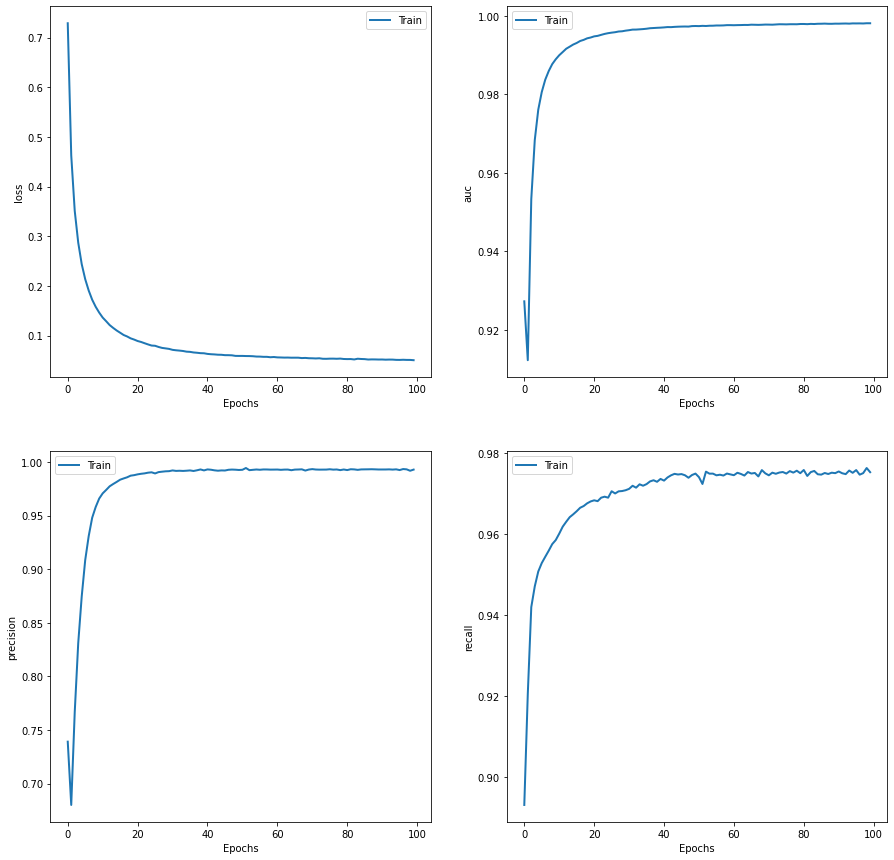

Area under ROC curve: 0.982
Area under Precision-Recall curve: 0.709
F1 Score: 0.342


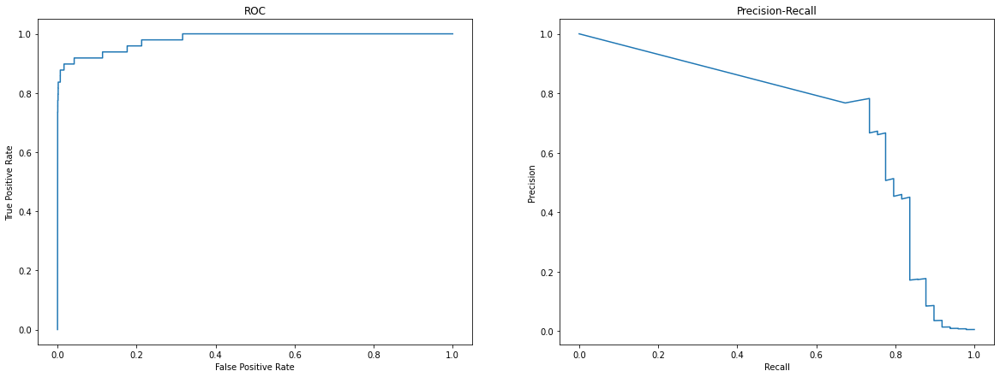

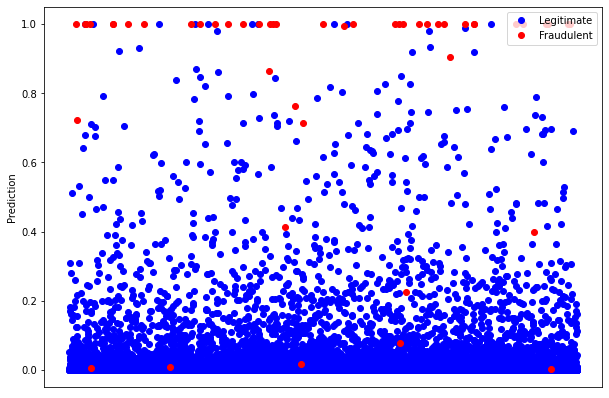

In [81]:
# SMOTE sampling k-fold with maximum number of neighbors possible
fraud_n = len(np.where(data[:,-1]==1)[0])
smote_all_samp_kfold = kfold(10, data, "SMOTE", smote_n=int(fraud_n*9/10)-1)

Final Train loss: 0.051185 (0.049276 - 0.053094)
Final Train auc: 0.998227 (0.998060 - 0.998394)
Final Train precision: 0.991781 (0.990857 - 0.992705)
Final Train recall: 0.974200 (0.972854 - 0.975546)


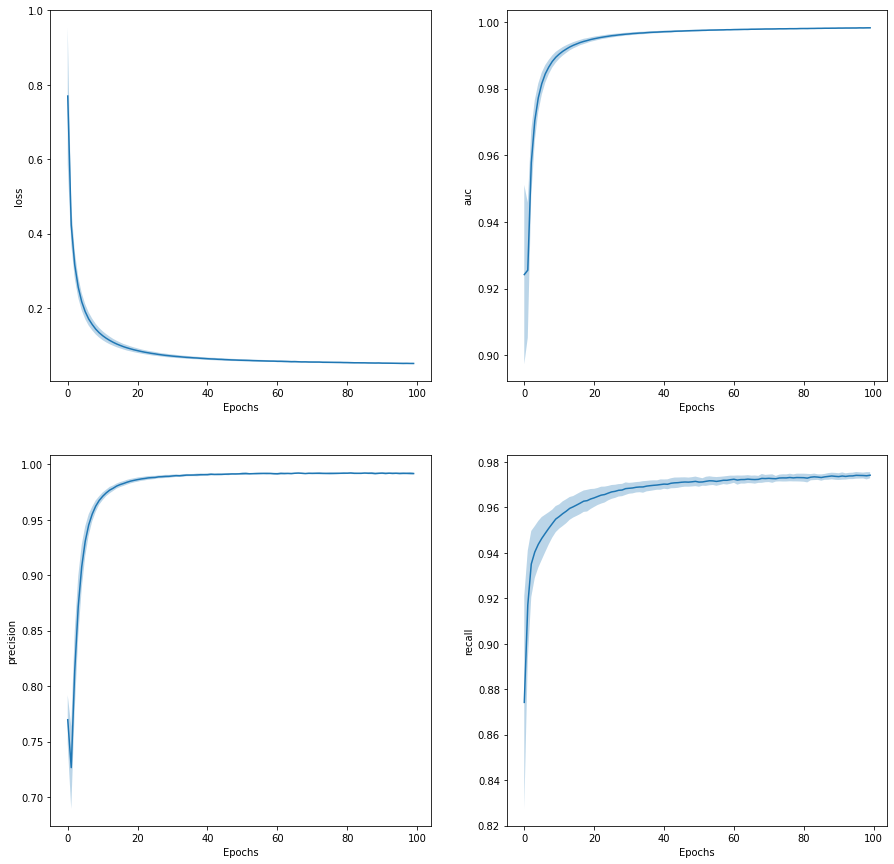

Test Precision: 0.263350 +/- 0.033051
Test Recall: 0.882114 +/- 0.043782


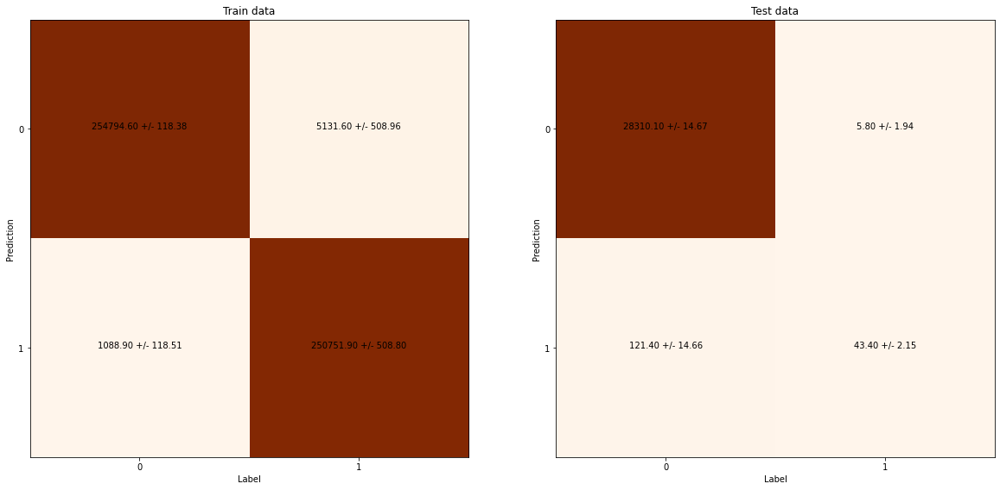

F1 Score: 0.408 +/- 0.036
Area under ROC curve: 0.963270 (0.931030 - 0.995510)
Area under Precision-Recall curve: 0.795562 (0.750169 - 0.840954)


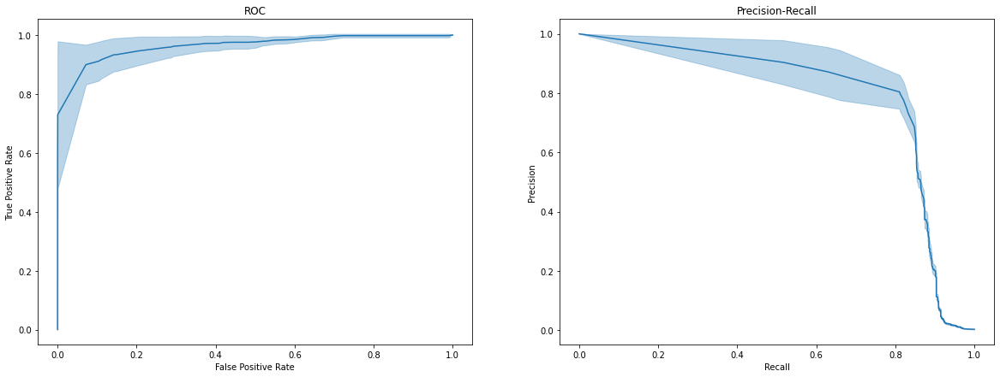

In [82]:
smote_all_samp_stats = kfold_stats(*smote_all_samp_kfold)

##Results Comparison

Area under ROC curve:
  Standard Sampling:  0.941508  (0.888977 - 0.994040)
  Undersampling:      0.969547  (0.946267 - 0.992826)
  Oversampling:       0.965307  (0.941247 - 0.989367)
  Weighted Sampling:  0.920399  (0.776912 - 1.063887)
  SMOTE (n=5):        0.964789  (0.938811 - 0.990767)
  SMOTE (n=max):      0.96327   (0.931030 - 0.995510) 

Area under P-R curve:
  Standard Sampling:  0.57522   (0.535700 - 0.614741)
  Undersampling:      0.735901  (0.697279 - 0.774522)
  Oversampling:       0.794816  (0.769304 - 0.820328)
  Weighted Sampling:  0.608834  (0.573011 - 0.644657)
  SMOTE (n=5):        0.809235  (0.758270 - 0.860200)
  SMOTE (n=max):      0.795562  (0.750169 - 0.840954) 

Precision:
  Standard Sampling:  0.882212  (0.826554 - 0.937869)
  Undersampling:      0.042153  (0.033812 - 0.050495)
  Oversampling:       0.111027  (0.096457 - 0.125597)
  Weighted Sampling:  0.887468  (0.831490 - 0.943446)
  SMOTE (n=5):        0.22279   (0.181568 - 0.264012)
  SMOTE (n=max):      0

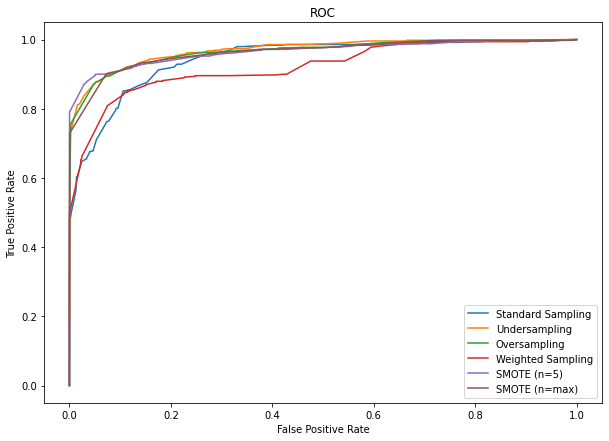

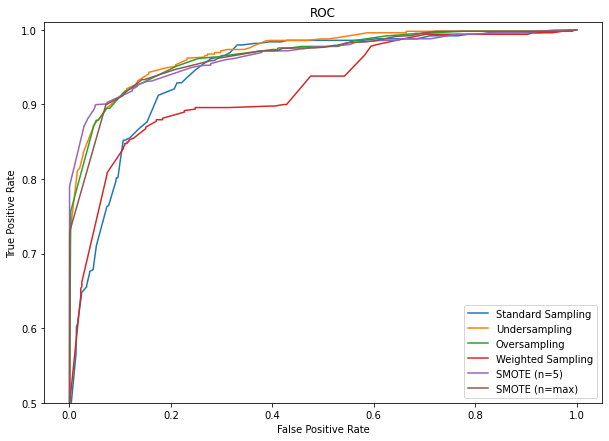

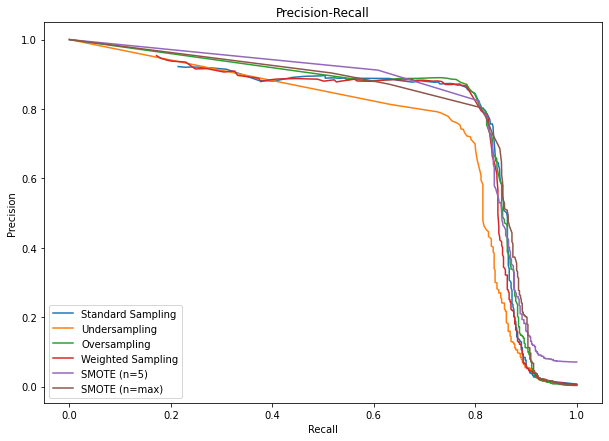

In [83]:
# Final results

stats = [stsamp_stats, undersamp_stats, oversamp_stats, stsampcw_stats, smotesamp_stats, smote_all_samp_stats]
labels = ["Standard Sampling", "Undersampling", "Oversampling", "Weighted Sampling", "SMOTE (n=5)", "SMOTE (n=max)"]
# cms_avg, cms_std, fpr_avg, fpr_std, tpr_avg, tpr_std, f1_avg, f1_std, p_avg, p_std, r_avg, r_std

from tabulate import tabulate

print("Area under ROC curve:")
table = []
for i in range(len(stats)):

    fpr_avg, tpr_avg, tpr_std = [stats[i][j] for j in [2,4,5]]

    area = auc(fpr_avg, tpr_avg)
    max_area = auc(fpr_avg, tpr_avg+tpr_std)
    min_area = auc(fpr_avg, tpr_avg-tpr_std)
    
    table.append(["    ", labels[i]+":", "%f"%area, "(%f - %f)" % (min_area, max_area)])
print(tabulate(table, tablefmt="plain"), "\n")

print("Area under P-R curve:")
table = []
for i in range(len(stats)):

    p_avg, p_std, r_avg = stats[i][8:11]

    area = auc(r_avg, p_avg)
    max_area = auc(r_avg, p_avg+p_std)
    min_area = auc(r_avg, p_avg-p_std)
    
    table.append(["    ", labels[i]+":", "%f"%area, "(%f - %f)" % (min_area, max_area)])
print(tabulate(table, tablefmt="plain"), "\n")

print("Precision:")
table = []
for i in range(len(stats)):

    cms_avg, cms_std = stats[i][:2]

    precision = cms_avg[-1][1,1]/(cms_avg[-1][1,1]+cms_avg[-1][0,1])
    precision_std = (cms_std[-1][1,1]*cms_avg[-1][0,1] + cms_std[-1][0,1]*cms_avg[-1][1,1])/(cms_avg[-1][1,1]+cms_avg[-1][0,1])**2
    
    table.append(["    ", labels[i]+":", "%f"%precision, "(%f - %f)" % (precision-precision_std, precision+precision_std)])
print(tabulate(table, tablefmt="plain"), "\n")

print("Recall:")
table = []
for i in range(len(stats)):

    cms_avg, cms_std = stats[i][:2]

    recall = cms_avg[-1][1,1]/(cms_avg[-1][1,1]+cms_avg[-1][1,0])
    recall_std = cms_std[-1][1,1]/(cms_avg[-1][1,1]+cms_avg[-1][1,0])

    table.append(["    ", labels[i]+":", "%f"%recall, "(%f - %f)" % (recall-recall_std, recall+recall_std)])
print(tabulate(table, tablefmt="plain"), "\n")

print("F1 Score:")
table = []
for i in range(len(stats)):

    table.append(["    ", labels[i]+":", "%f"%stats[i][6], "(%f - %f)" % (stats[i][6]-stats[i][7], stats[i][6]+stats[i][7])])
print(tabulate(table, tablefmt="plain"), "\n")

plt.figure(figsize=(10,7))
for i in range(len(stats)):

    plt.plot(stats[i][2], stats[i][4], label=labels[i])
    plt.legend()
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("ROC")
plt.show()

plt.figure(figsize=(10,7))
for i in range(len(stats)):

    plt.plot(stats[i][2], stats[i][4], label=labels[i])
    plt.legend()
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.ylim(0.5, 1.01)
    plt.title("ROC")
plt.show()

plt.figure(figsize=(10,7))
for i in range(len(stats)):

    plt.plot(stats[i][10], stats[i][8], label=labels[i])
    plt.legend()
    plt.xlabel("Recall")
    plt.ylabel("Precision")
    plt.title("Precision-Recall")
plt.show()

Considering Recall, which we want to maximize in a fraud detection situation, undersampling was the best method, followed by random oversampling, and then by SMOTe augmentation technique.

##Ensemble of sampling methods
Train with different sampling methods, and take the average of the results for each test sample

---------------------------------------------------------------
Model: "sequential_87"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_182 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_95 (Dropout)         (None, 16)                0         
_________________________________________________________________
dense_183 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Model: "sequential_88"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_184 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_96 (Dropout)         (None

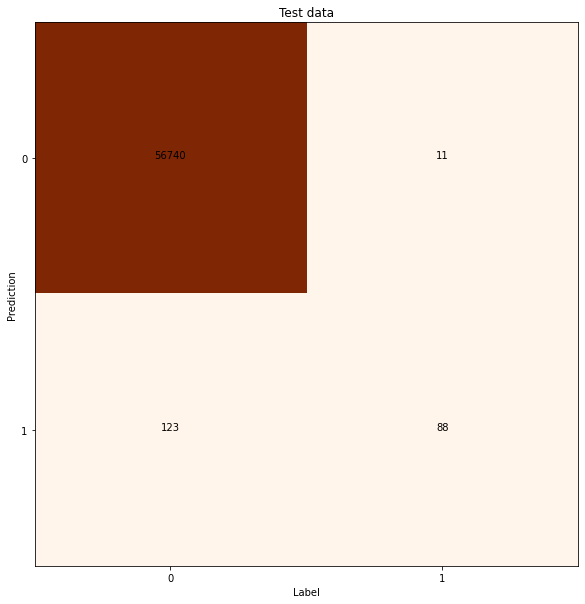

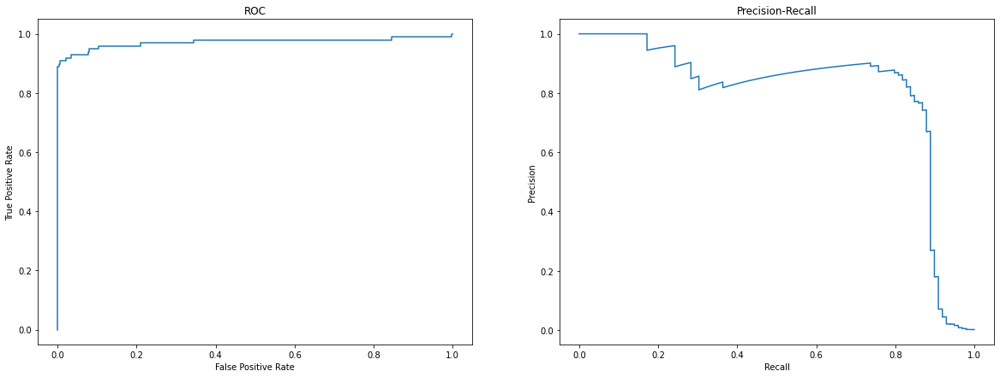

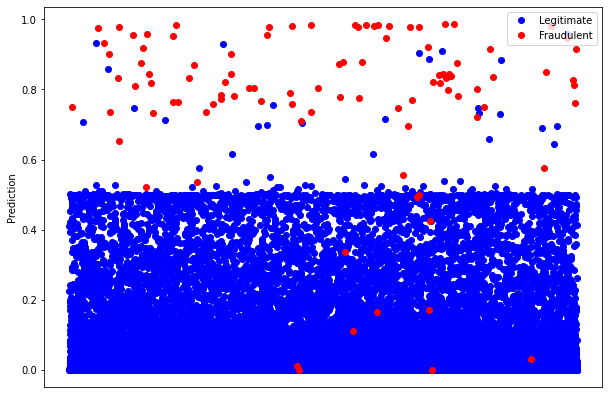

---------------------------------------------------------------
Model: "sequential_89"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_186 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_97 (Dropout)         (None, 16)                0         
_________________________________________________________________
dense_187 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Model: "sequential_90"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_188 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_98 (Dropout)         (None

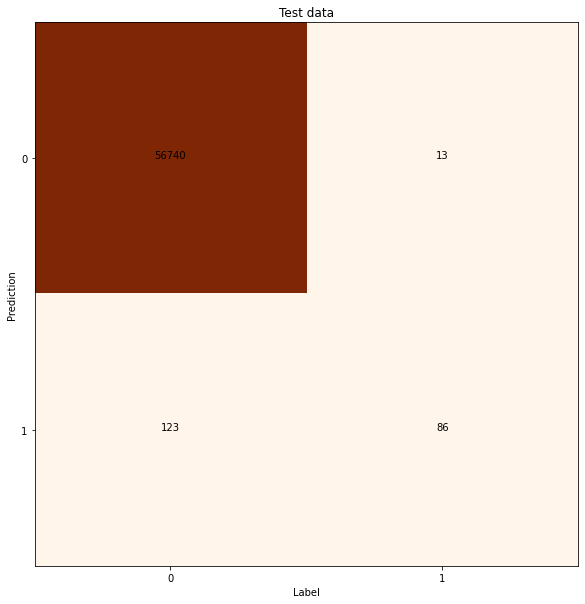

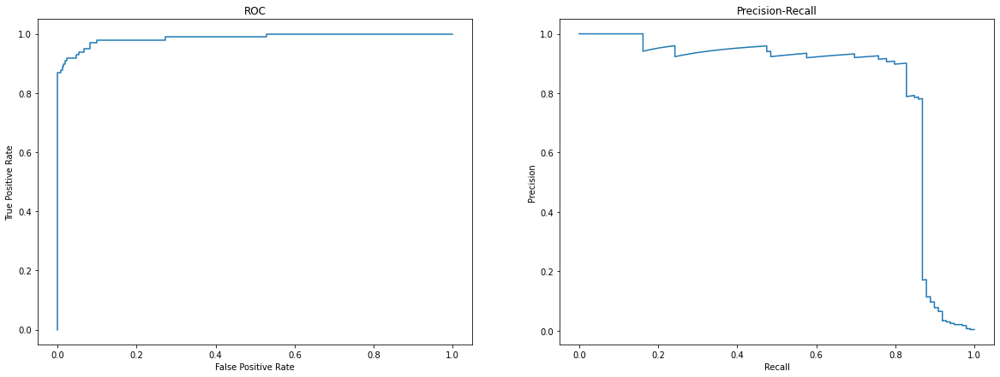

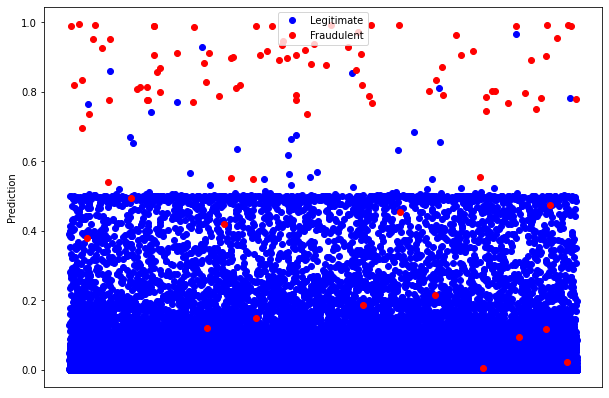

---------------------------------------------------------------
Model: "sequential_91"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_190 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_99 (Dropout)         (None, 16)                0         
_________________________________________________________________
dense_191 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Model: "sequential_92"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_192 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_100 (Dropout)        (None

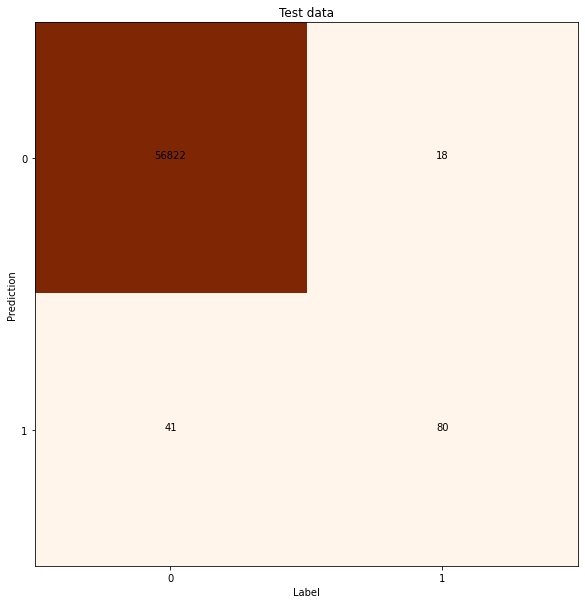

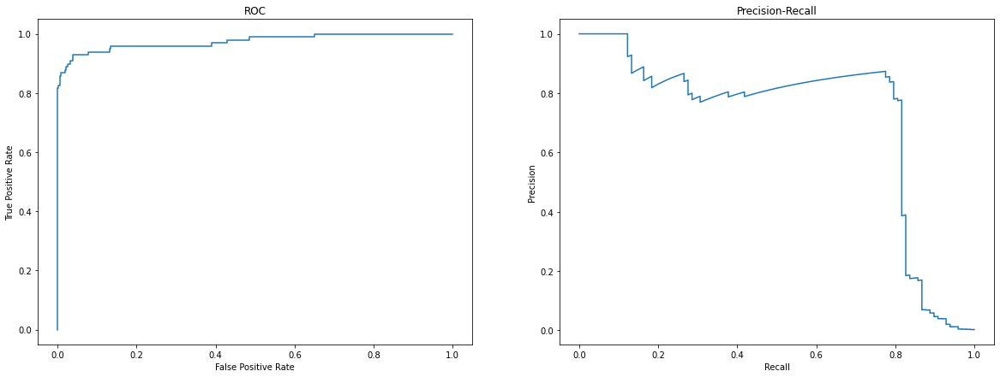

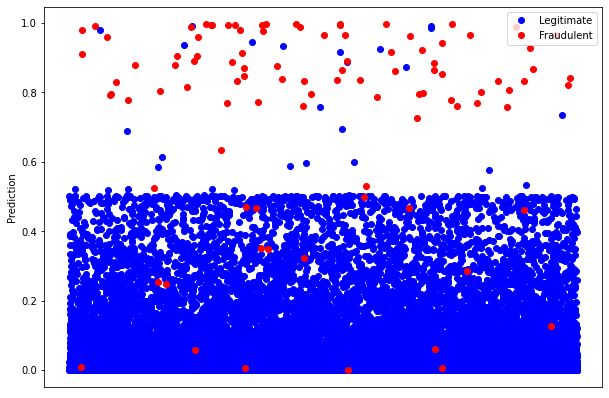

---------------------------------------------------------------
Model: "sequential_93"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_194 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_101 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_195 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Model: "sequential_94"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_196 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_102 (Dropout)        (None

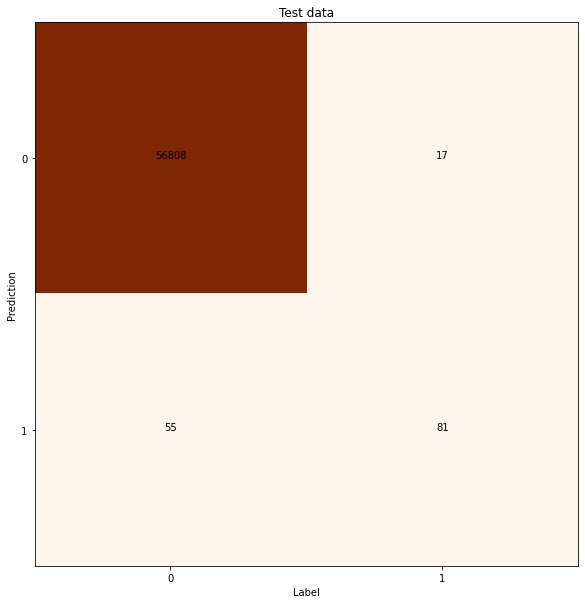

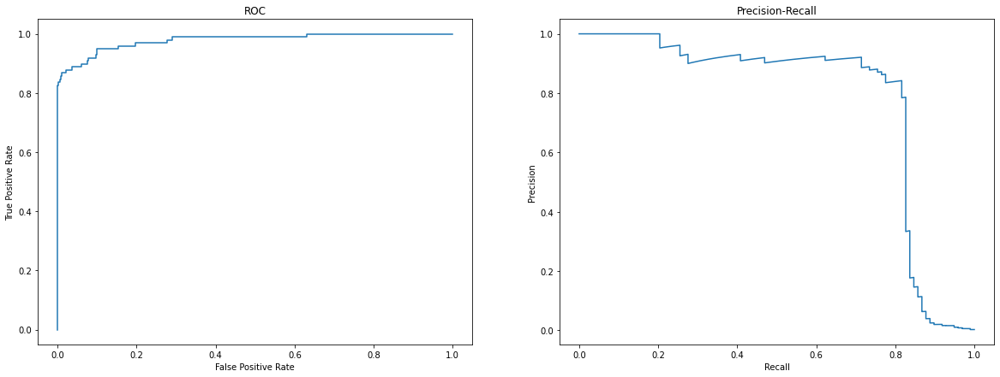

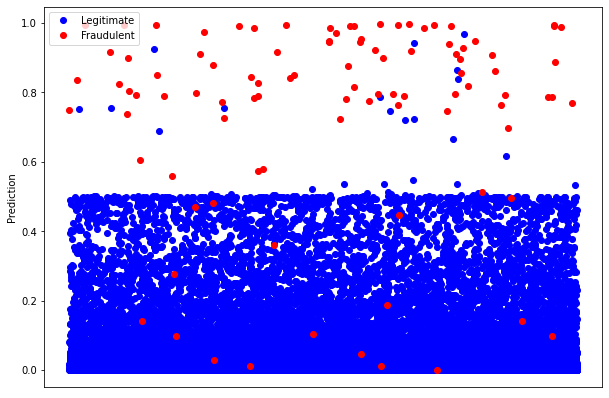

---------------------------------------------------------------
Model: "sequential_95"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_198 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_103 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_199 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Model: "sequential_96"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_200 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_104 (Dropout)        (None

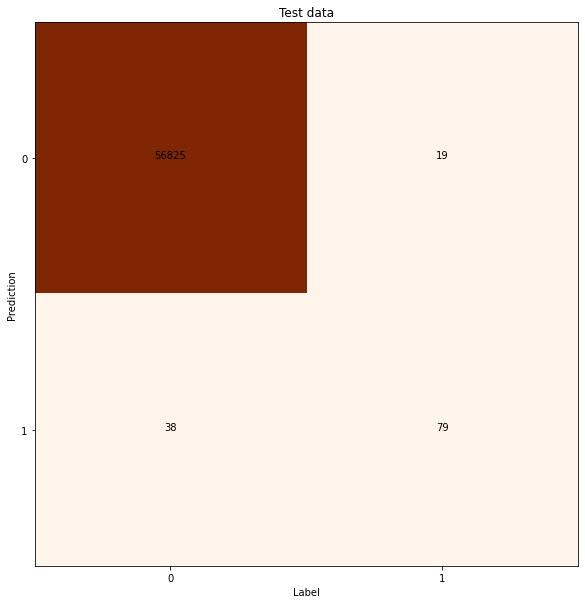

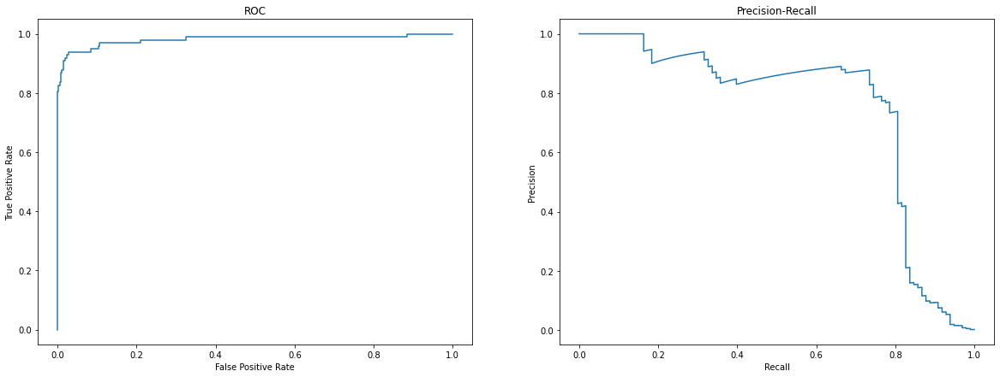

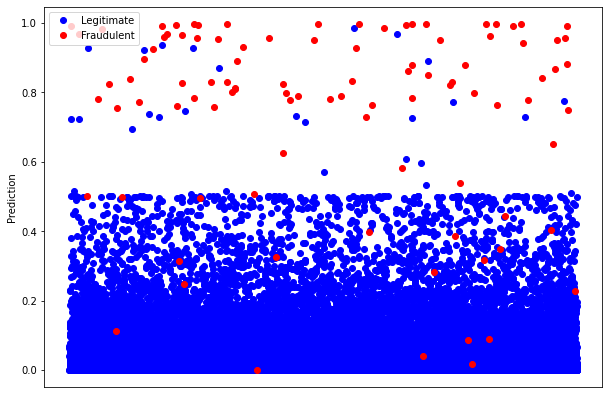

In [56]:
from sklearn.model_selection import StratifiedKFold

# Average of predictions of different sampling models

def kfold_av(k, data, samplings=["standard", "undersampling"], mid_activation="relu", class_weight=None, input_shape=(30,), smote_n=5):

    # Save lists of metrics for all folds
    cm = [] # confusion matrices
    roc = [] # roc curves
    pr = [] # precision-recall curves
    f1 = [] # F1 scores

    # Lists to save train and test sets for each fold
    test = []

    # List to save original training sets for scaling independent of sampling method
    orig_train = []

    # Separate k lists of train and test sets, both with the same proportions of each class existent in the dataset
    # This function returns k pair of lists of indexes of the data array, each pair with a list for train and the other for test
    skf = StratifiedKFold(k, shuffle=True)
    
    # Passing by all the pair of lists, we add the sets for each fold to the train and test lists
    for train_index, test_index in skf.split(data[:,:-1], data[:,-1]):

        # train.append(data[train_index])
        orig_train.append(data[train_index])
        test.append(data[test_index])

    # Fitting the model and generating metrics for each fold
    for i in range(k):
        
        # Save train sets for different sampling methods
        samplings_trains = []

        # Standard sampling
        if ("standard" in samplings):
            
            # Passing by all the pair of lists, we add the sets for each fold to the train and test lists
            samplings_trains.append(orig_train[i])

        # Undersampling
        if ("undersampling" in samplings):

            train_ = orig_train[i]
            train_fraud = train_[np.where(train_[:,-1]==1)[0]]

            # Get the indexes of the majority class in the training set, and sort just a few of them to have the same amount of samples as in the minority class
            train_legit_id = np.where(train_[:,-1]==0)[0]
            train_ = np.concatenate((train_fraud, train_[np.random.choice(train_legit_id, len(train_fraud))]), axis=0)
            
            np.random.shuffle(train_)
            samplings_trains.append(train_)

        # Oversampling
        if ("oversampling" in samplings):
            
            train_ = orig_train[i]
            train_legit = train_[np.where(train_[:,-1]==0)[0]]

            # Get the indexes of the minorty class in the training set, and sort many of them to have the same amount of samples as in the majority class
            train_fraud_id = np.where(train_[:,-1]==1)[0]
            train_ = np.concatenate((train_legit, train_[np.random.choice(train_fraud_id, len(train_legit))]), axis=0)
            
            np.random.shuffle(train_)
            samplings_trains.append(train_)

        # SMOTE
        if ("SMOTE" in samplings):

            train_ = orig_train[i]

            # Make SMOTE oversampling and add the new data to the original
            x, y = SMOTE(k_neighbors=smote_n).fit_resample(train_[:,:-1], train_[:,-1])
            train_ = np.concatenate((x, y.reshape(-1,1)), axis=1)
            
            np.random.shuffle(train_)
            samplings_trains.append(train_)

        print("---------------------------------------------------------------")

        # Scale data
        train_scaler = StandardScaler()
        train_scaler.fit(orig_train[i][:,:-1])

        for j in range(len(samplings)):

            samplings_trains[j][:,:-1] = train_scaler.transform(samplings_trains[j][:,:-1])

        test[i][:,:-1] = train_scaler.transform(test[i][:,:-1])

        # train_data = train[i][:,:-1]
        test_data = test[i][:,:-1]
        test_label = test[i][:,-1]

        # List to save models
        models = []

        # Build models
        for j in range(len(samplings)):

            models.append(make_model())
        
        # Save predictions from different models
        test_pred = []

        for j in range(len(models)):

            # Fit and save metrics' evolution through epochs
            model_fit(models[j], samplings_trains[j][:,:-1], samplings_trains[j][:,-1], None, None, 0, class_weight, 100, False)
            test_pred.append(models[j].predict(test_data))

        # train_pred = np.mean(np.array(train_pred), axis=0)
        test_pred = np.mean(np.array(test_pred), axis=0)

        # Calculate confusion matrices

        cm_test = confusion_matrix(test_label, np.round(test_pred))

        cms = [cm_test]

        precision = cm_test[1,1]/(cm_test[1,1]+cm_test[0,1])
        recall = cm_test[1,1]/(cm_test[1,1]+cm_test[1,0])
        print("Test Precision: %.3f%%" % (precision*100))
        print("Test Recall: %.3f%%" % (recall*100))

        # Plot confusion matrices
        plt.figure(figsize=(10*len(data_label),10))

        # plt.subplot(1,2,2)
        plt.imshow(cm_test.T, cmap="Oranges")
        for i in range(cm_test.shape[0]):
            for j in range(cm_test.shape[1]):
                plt.text(i, j, "%i"%cm_test[i,j], ha="center")
        plt.xticks([0,1])
        plt.yticks([0,1])
        plt.xlabel("Label")
        plt.ylabel("Prediction")
        plt.gca().set_title("Test data")

        # Calculate ROC and Precision-Recall curves, and F1 Score
        roc_, pr_, f1_ = roc_pr_f1_scores(test_label, test_pred)

        # Plot the separation between the predictions of the diffrent classes
        plot_separation(test_label, test_pred)

        cm.append(cms)
        roc.append(roc_)
        pr.append(pr_)
        f1.append(f1_)

    return cm, roc, pr, f1

cm, roc, pr, f1 = kfold_av(5, data);

Test Precision: 0.521411 +/- 0.138085
Test Recall: 0.841463 +/- 0.036016


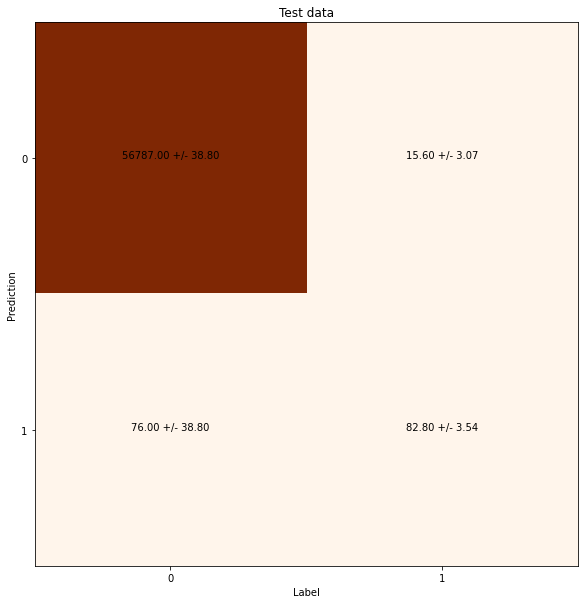

F1 Score: 0.657 +/- 0.078
Area under ROC curve: 0.973186 (0.956886 - 0.989487)
Area under Precision-Recall curve: 0.673916 (0.642855 - 0.704978)


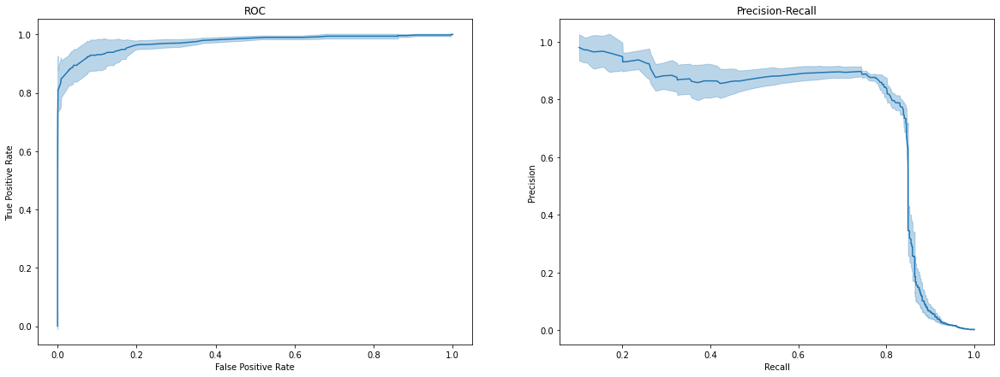

In [57]:
# Generate k-fold statistics
def kfold_av_stats(cm, roc, pr, f1):

    # Confusion matrix

    # List to save confusion matrices for train and test sets
    cms = []

    # Save the respective matrices on the lists
    for i in range(len(cm)):
        cms.append(cm[i])

    # Convert to array
    cms = np.array(cms)

    # Calculate averages and standard deviation of confusion matrices cells over the folds
    cms_avg = np.mean(cms, axis=0)[0]
    cms_std = np.std(cms, axis=0)[0]

    data_label = [test_data, test_label, "Test"]
    # Print results for the test set
        
    # Calculate precision, recall, and the respective standard deviations over folds
    precision = cms_avg[1,1]/(cms_avg[1,1]+cms_avg[0,1])
    precision_std = (cms_std[1,1]*cms_avg[0,1] + cms_std[0,1]*cms_avg[1,1])/(cms_avg[1,1]+cms_avg[0,1])**2
    recall = cms_avg[1,1]/(cms_avg[1,1]+cms_avg[1,0])
    recall_std = cms_std[1,1]/(cms_avg[1,1]+cms_avg[1,0])

    print("Test Precision: %f +/- %f" % (precision, precision_std))
    print("Test Recall: %f +/- %f" % (recall, recall_std))

    # Plot confusion matrices
    plt.figure(figsize=(30,10))
    plt.imshow(cms_avg.T, cmap="Oranges")
    for i in range(cms_avg.shape[0]):
        for j in range(cms_avg.shape[1]):
            plt.text(i, j, "%.2f +/- %.2f" % (cms_avg[i,j], cms_std[i,j]), ha="center")
    plt.xticks([0,1])
    plt.yticks([0,1])
    plt.xlabel("Label")
    plt.ylabel("Prediction")
    plt.gca().set_title("%s data" % (data_label[2]))
    plt.show()

    ############################################################################

    # F1 Score
    
    f1_avg = np.mean(f1)
    f1_std = np.std(f1)
    print("F1 Score: %.3f +/- %.3f" % (f1_avg, f1_std))

    ############################################################################

    # ROC + Precision-Recall

    # Lists to save FPR and TPR of each fold
    fpr = [roc[0][0]]
    tpr = [roc[0][1]]

    # Save all of them, interpolating to a same set o thresholds
    for i in range(1, len(roc)):
        
        # The .flip is needed as the threshold array generated by sklearn.metrics.roc_curve is decrescent
        fpr.append(np.interp(np.flip(roc[0][2]), np.flip(roc[i][2]), roc[i][0]))
        tpr.append(np.interp(np.flip(roc[0][2]), np.flip(roc[i][2]), roc[i][1]))

    # Convert to array
    tpr = np.array(tpr)
    fpr = np.array(fpr)

    # Calculate mean and standard deviation
    tpr_avg = np.mean(tpr, axis=0)
    tpr_std = np.std(tpr, axis=0)
    fpr_avg = np.mean(fpr, axis=0)
    fpr_std = np.std(fpr, axis=0)

    # Lists so save precision and recall curves of each fold
    p = [pr[0][0]]
    r = [pr[0][1]]

    # Save all of them, interpolating to a same set o thresholds
    for i in range(len(pr)):

        p.append(np.interp([0]+list(pr[0][2]), [0]+list(pr[i][2]), pr[i][0]))
        r.append(np.interp([0]+list(pr[0][2]), [0]+list(pr[i][2]), pr[i][1]))

    # Convert to array
    p = np.array(p)
    r = np.array(r)
    
    # Calculate average and standard deviation
    p_avg = np.mean(p, axis=0)
    p_std = np.std(p, axis=0)
    r_avg = np.mean(r, axis=0)
    r_std = np.std(r, axis=0)

    # Print results of area under ROC and Precision-Recall curves
    print("Area under ROC curve: %f (%f - %f)" % (auc(fpr_avg, tpr_avg), auc(fpr_avg, tpr_avg-tpr_std), auc(fpr_avg, tpr_avg+tpr_std)))
    print("Area under Precision-Recall curve: %f (%f - %f)" % (auc(r_avg, p_avg), auc(r_avg, p_avg-p_std), auc(r_avg, p_avg+p_std)))

    # Plot averages and deviations for ROC and Precision-Recall curves, with deviations considered only for the y-axis,
    # so the plot don't get very poluted
    plt.figure(figsize=(20,7))

    plt.subplot(1,2,1)
    plt.plot(fpr_avg, tpr_avg)
    plt.fill_between(fpr_avg, tpr_avg-tpr_std, tpr_avg+tpr_std, color="C0", alpha=0.3)
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("ROC")

    plt.subplot(1,2,2)
    plt.plot(r_avg, p_avg)
    plt.fill_between(r_avg, p_avg-p_std, p_avg+p_std, color="C0", alpha=0.3)
    plt.xlabel("Recall")
    plt.ylabel("Precision")
    plt.title("Precision-Recall")
    plt.show()

    return cms_avg, cms_std, fpr_avg, fpr_std, tpr_avg, tpr_std, f1_avg, f1_std, p_avg, p_std, r_avg, r_std

kfold_av_stats(cm, roc, pr, f1);

Combining standard and undersampling, we get a precision better than undersampling alone, but worse then standard sampling alone. The same way, we get a recall better than standard sampling alone, but worse than undersampling alone.

###Undersampling + SMOTE

---------------------------------------------------------------
Model: "sequential_97"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_202 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_105 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_203 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Model: "sequential_98"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_204 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_106 (Dropout)        (None

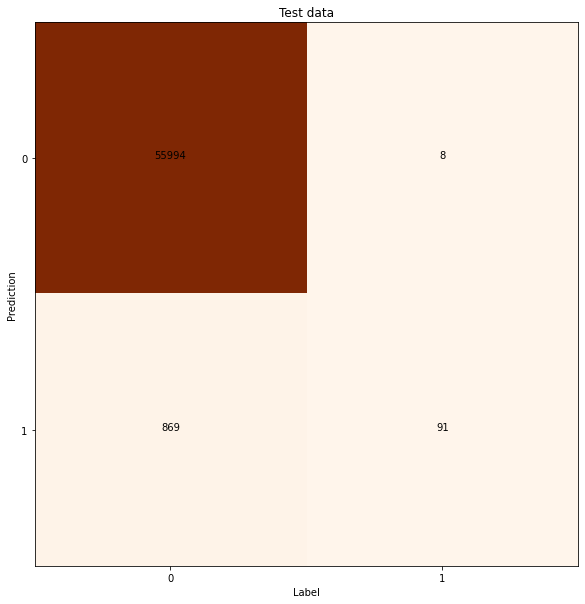

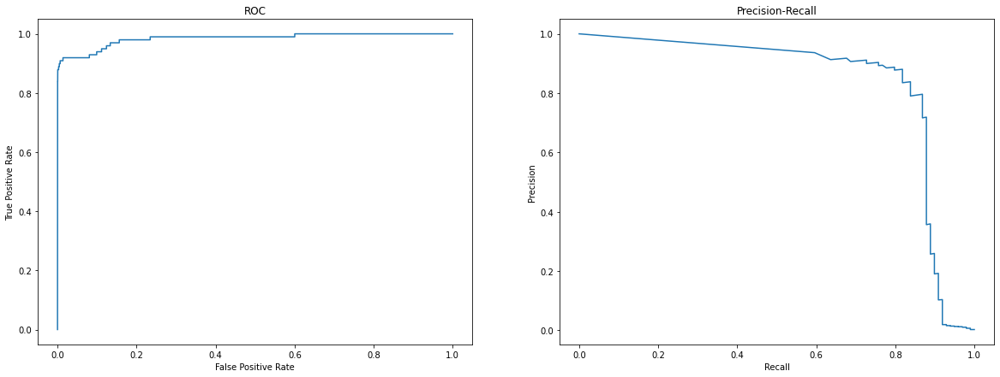

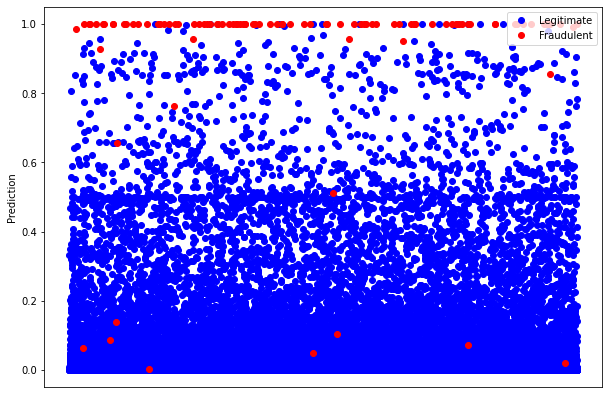

---------------------------------------------------------------
Model: "sequential_99"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_206 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_107 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_207 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Model: "sequential_100"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_208 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_108 (Dropout)        (Non

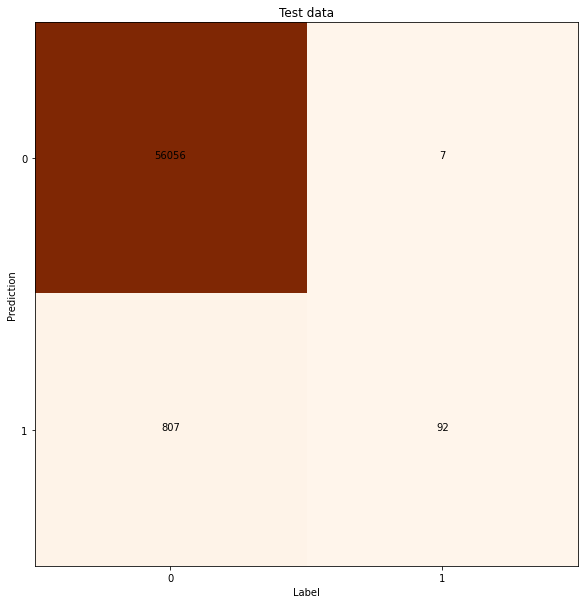

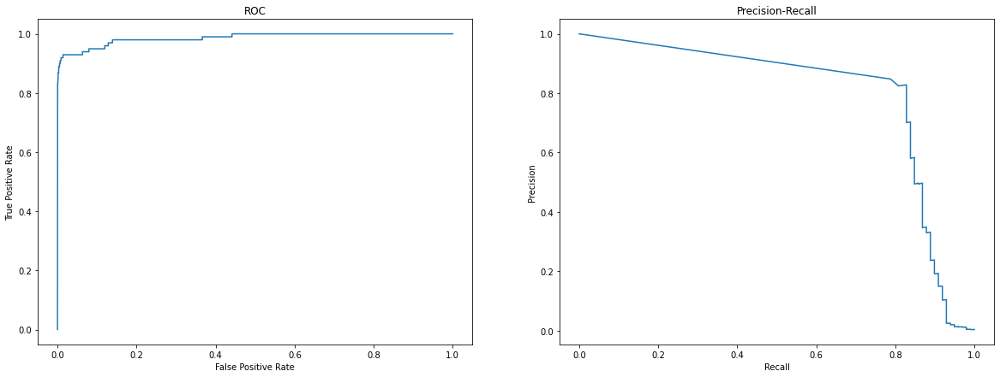

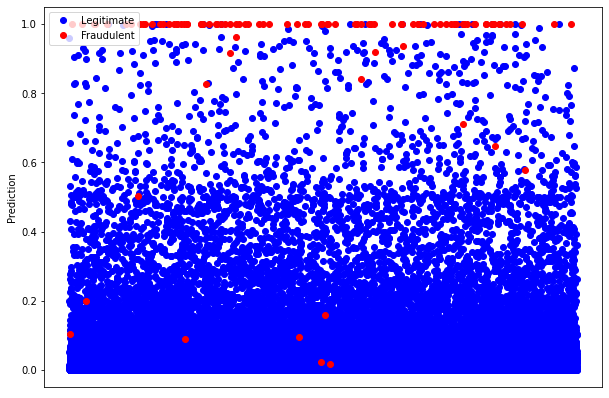

---------------------------------------------------------------
Model: "sequential_101"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_210 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_109 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_211 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Model: "sequential_102"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_212 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_110 (Dropout)        (No

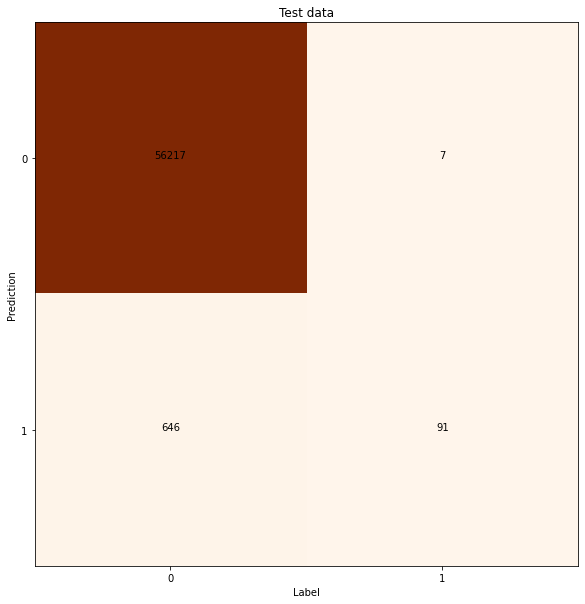

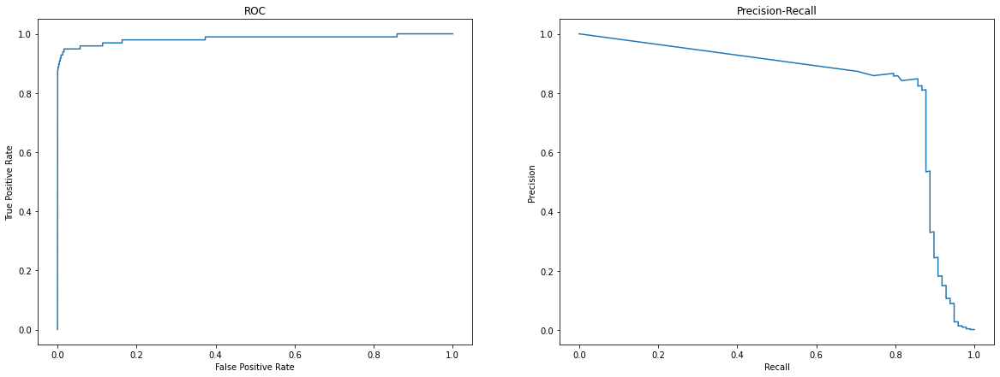

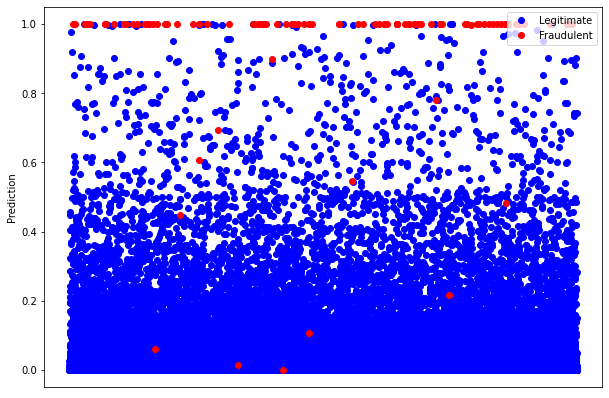

---------------------------------------------------------------
Model: "sequential_103"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_214 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_111 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_215 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Model: "sequential_104"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_216 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_112 (Dropout)        (No

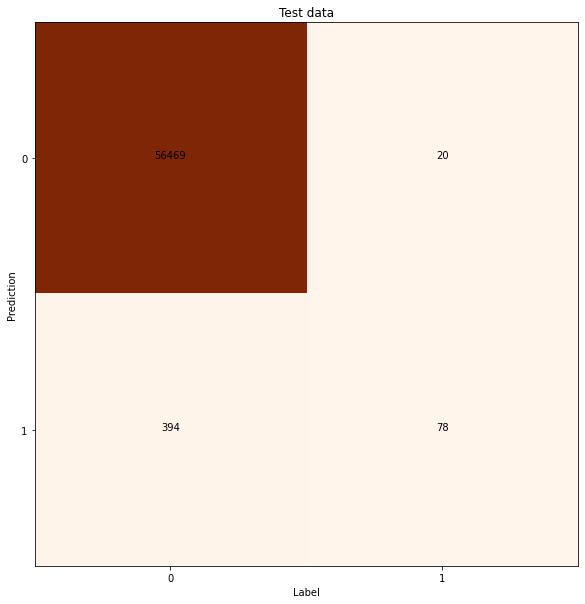

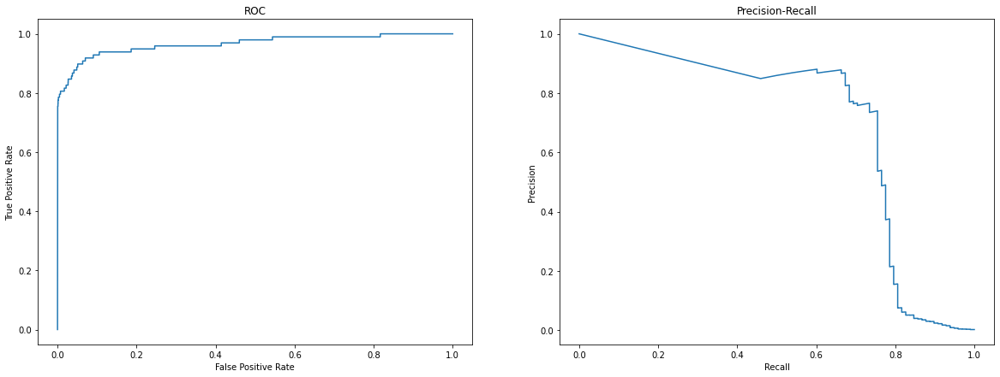

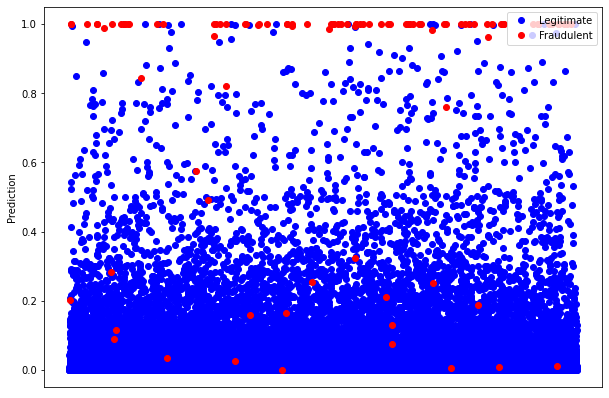

---------------------------------------------------------------
Model: "sequential_105"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_218 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_113 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_219 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Model: "sequential_106"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_220 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_114 (Dropout)        (No

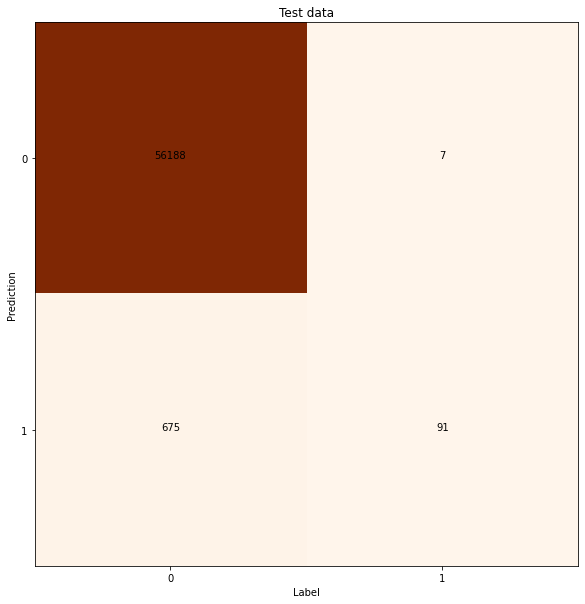

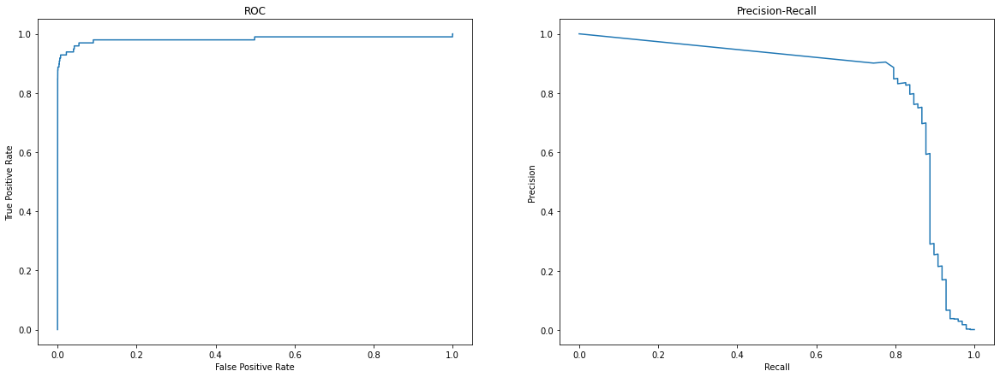

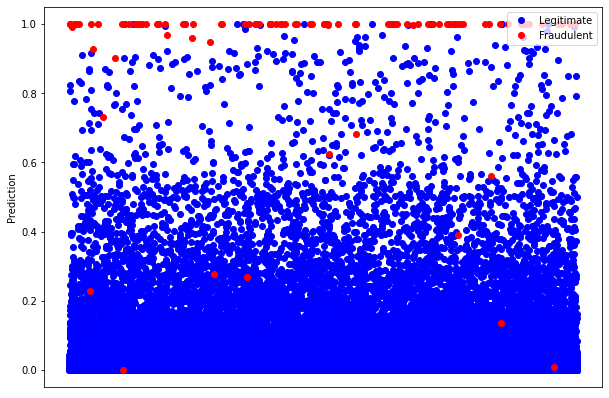

In [58]:
av4_kfold = kfold_av(5, data, samplings=["undersampling", "SMOTE"])

Test Precision: 0.115545 +/- 0.030872
Test Recall: 0.900407 +/- 0.054005


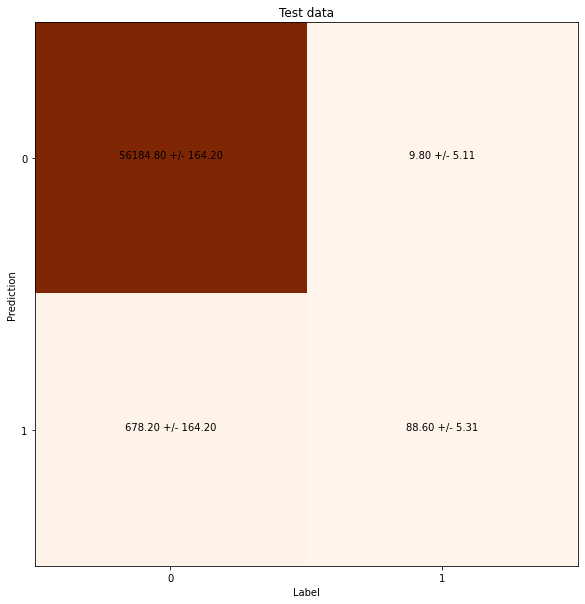

F1 Score: 0.212 +/- 0.035
Area under ROC curve: 0.973725 (0.951964 - 0.995486)
Area under Precision-Recall curve: 0.803084 (0.781611 - 0.824557)


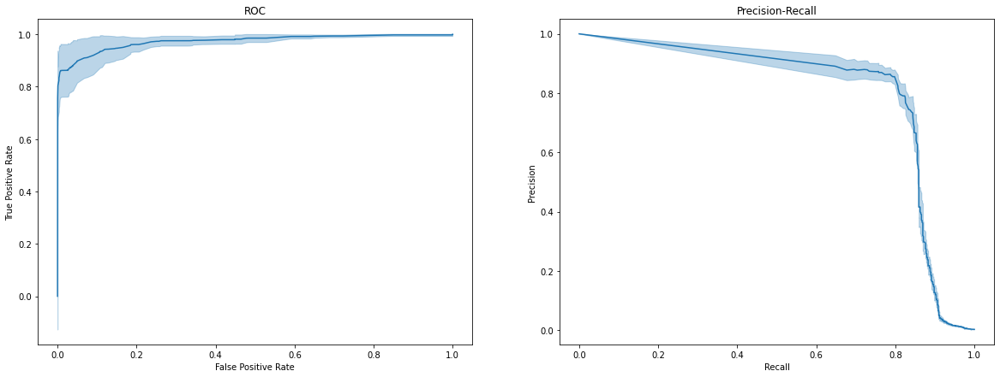

In [59]:
kfold_av_stats(*av4_kfold);

###Standard + Undersampling + Oversampling + SMOTE

---------------------------------------------------------------
Model: "sequential_107"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_222 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_115 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_223 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Model: "sequential_108"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_224 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_116 (Dropout)        (No

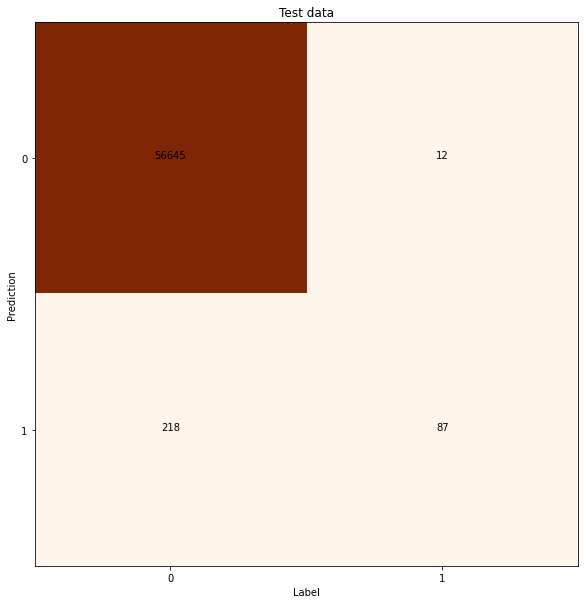

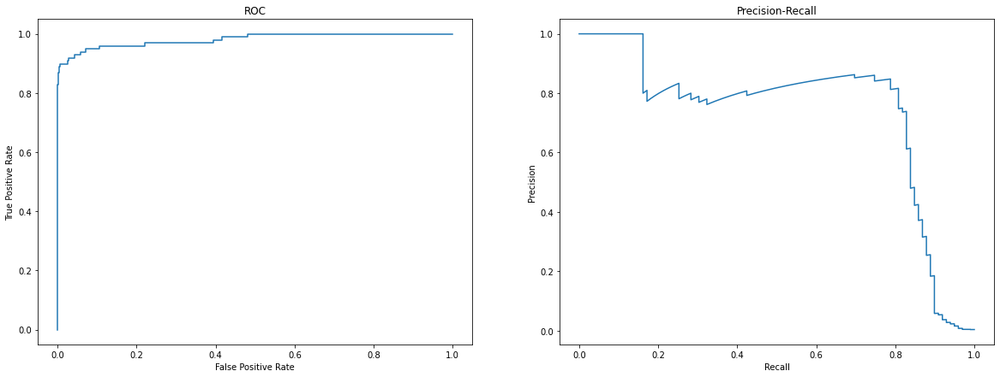

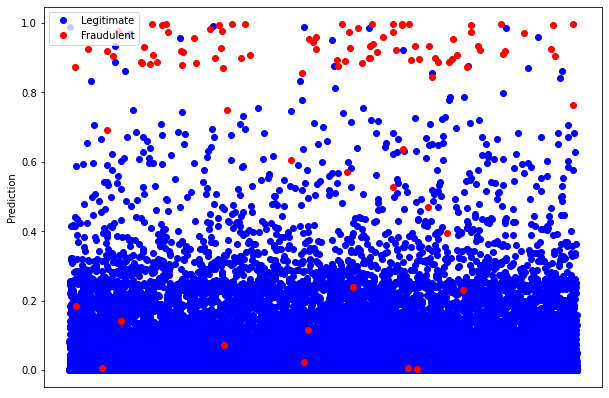

---------------------------------------------------------------
Model: "sequential_111"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_230 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_119 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_231 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Model: "sequential_112"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_232 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_120 (Dropout)        (No

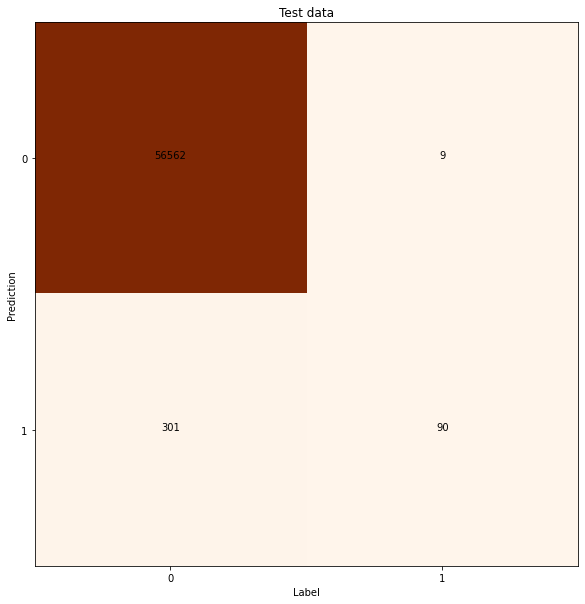

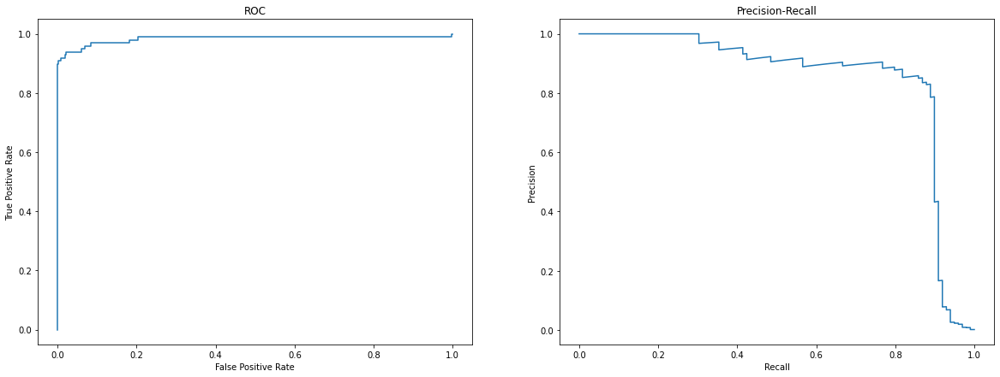

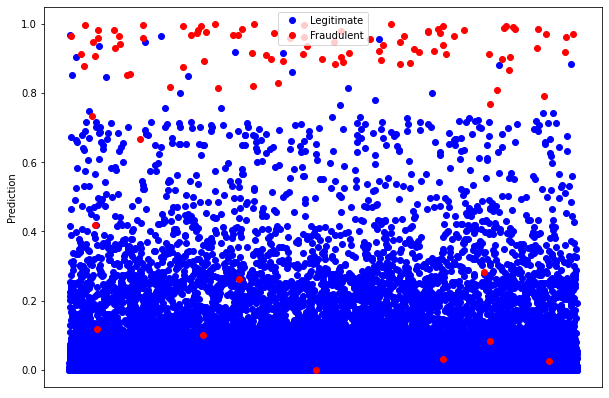

---------------------------------------------------------------
Model: "sequential_115"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_238 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_123 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_239 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Model: "sequential_116"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_240 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_124 (Dropout)        (No

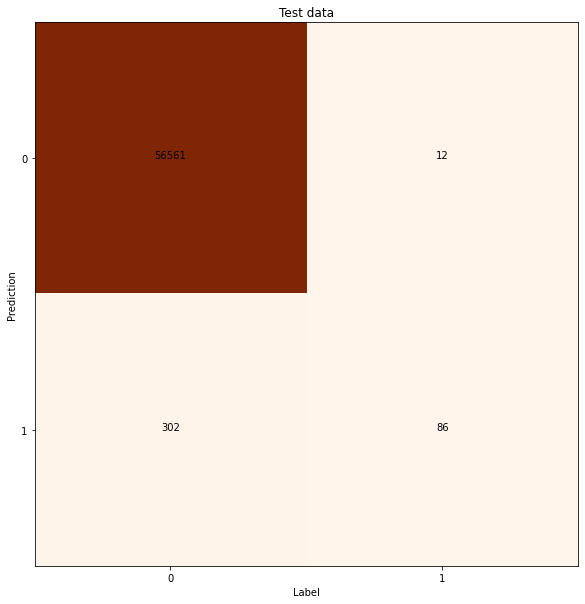

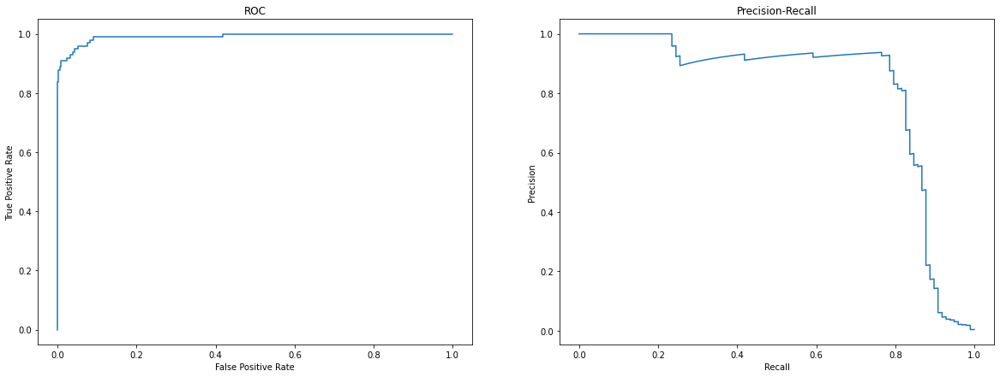

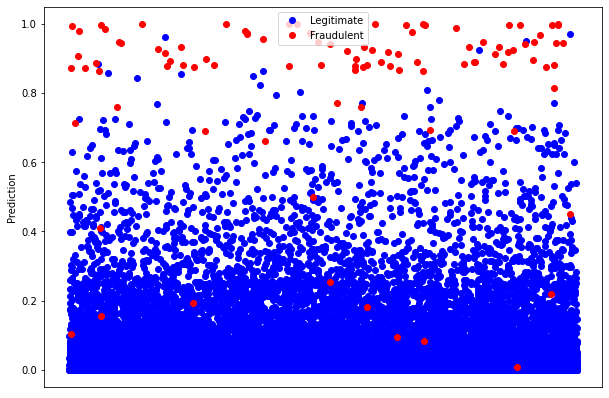

---------------------------------------------------------------
Model: "sequential_119"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_246 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_127 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_247 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Model: "sequential_120"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_248 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_128 (Dropout)        (No

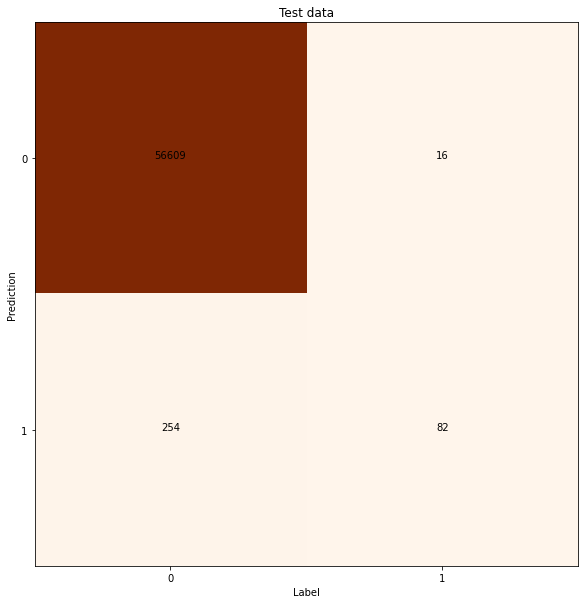

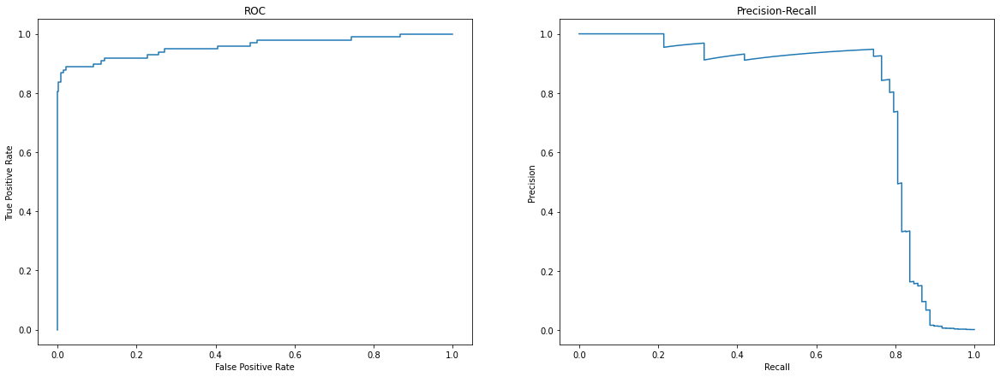

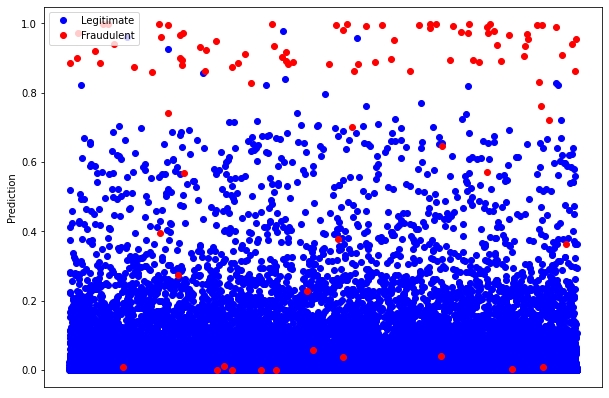

---------------------------------------------------------------
Model: "sequential_123"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_254 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_131 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_255 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Model: "sequential_124"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_256 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_132 (Dropout)        (No

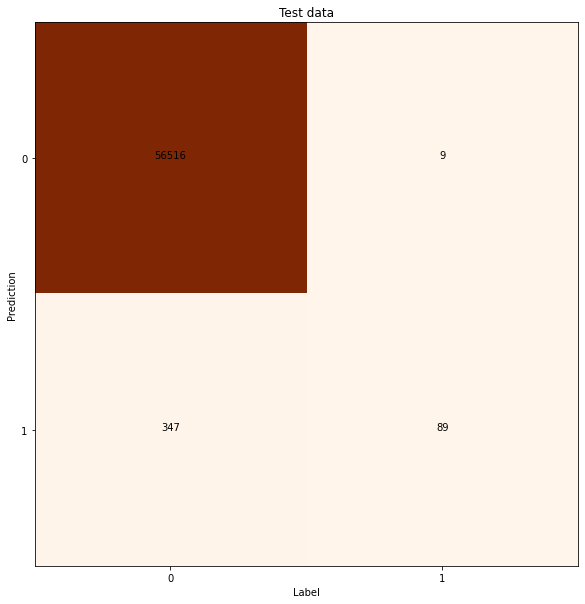

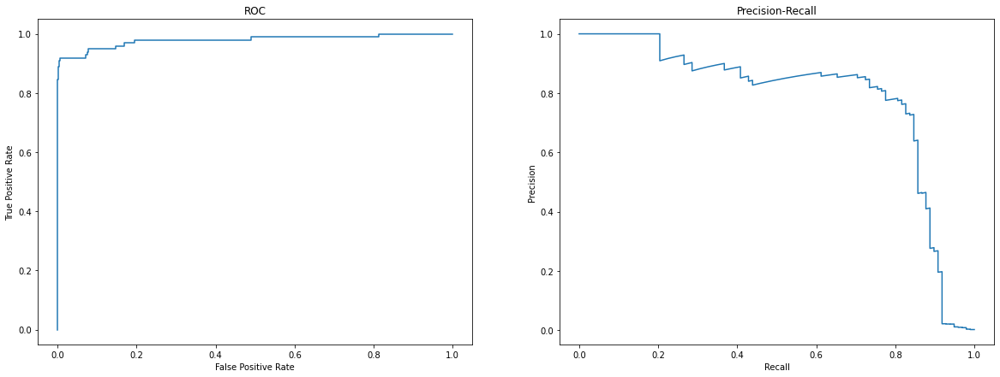

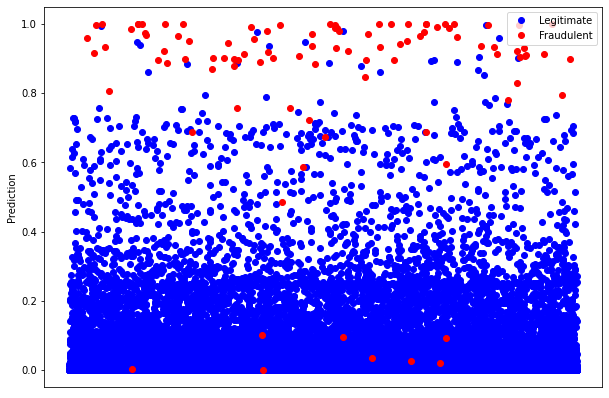

In [60]:
av4_kfold = kfold_av(5, data, samplings=["standard", "undersampling", "oversampling", "SMOTE"])

Test Precision: 0.233836 +/- 0.033692
Test Recall: 0.882114 +/- 0.028310


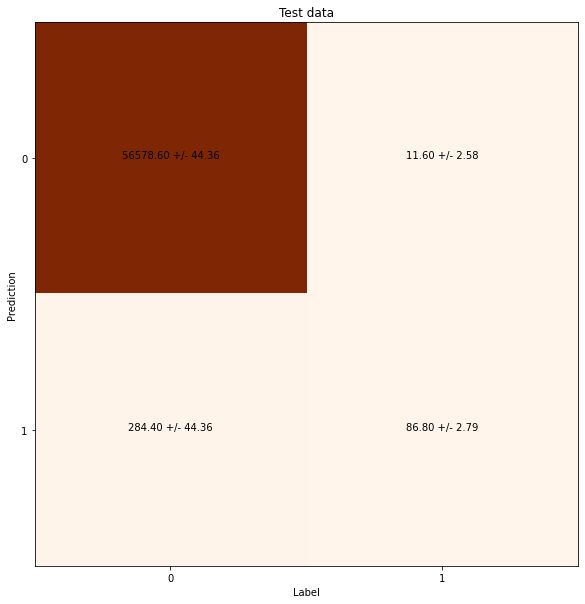

F1 Score: 0.373 +/- 0.033
Area under ROC curve: 0.966373 (0.948728 - 0.984017)
Area under Precision-Recall curve: 0.711306 (0.670179 - 0.752433)


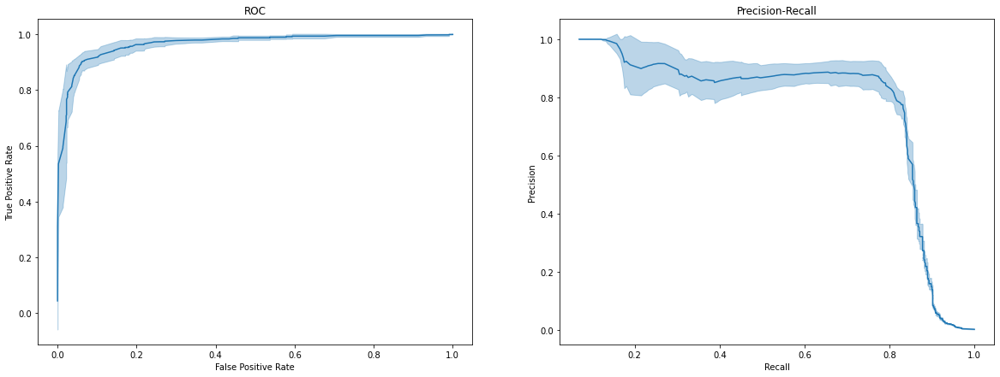

In [61]:
kfold_av_stats(*av4_kfold);

##Ensemble of sampling methods with weighted averages
Train with different sampling methods, and take the weighted average of the results for each test sample

---------------------------------------------------------------
Model: "sequential_127"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_262 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_135 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_263 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Model: "sequential_128"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_264 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_136 (Dropout)        (No

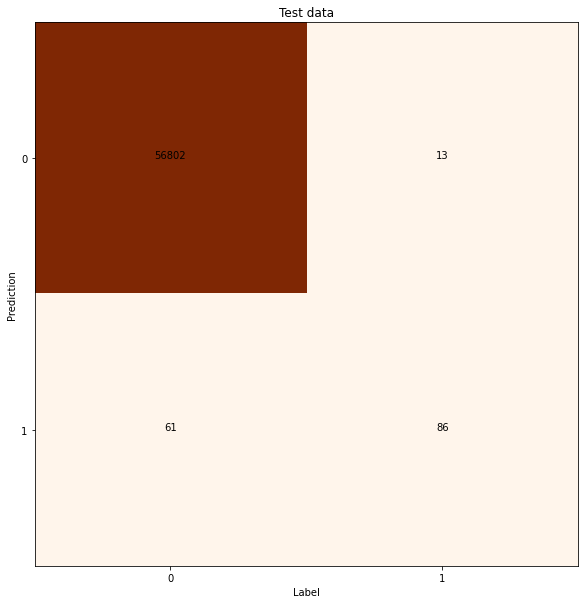

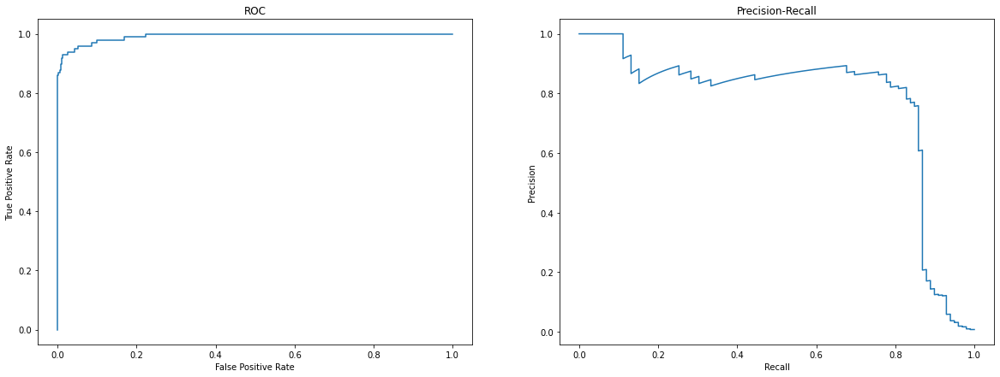

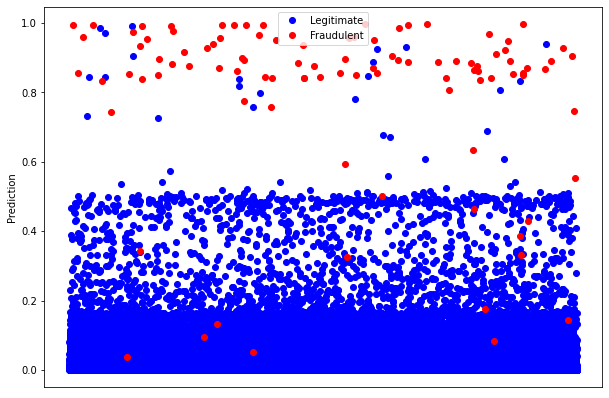

---------------------------------------------------------------
Model: "sequential_129"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_266 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_137 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_267 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Model: "sequential_130"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_268 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_138 (Dropout)        (No

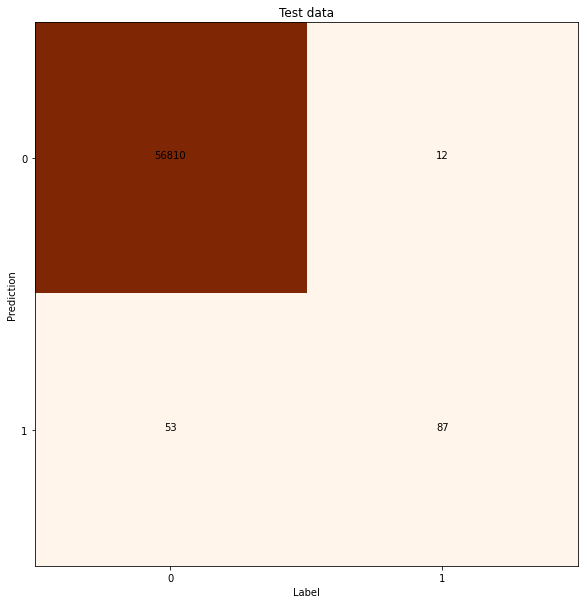

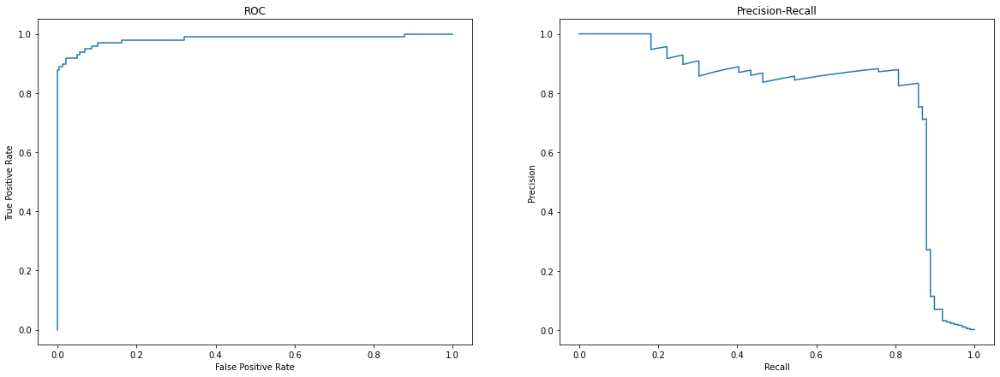

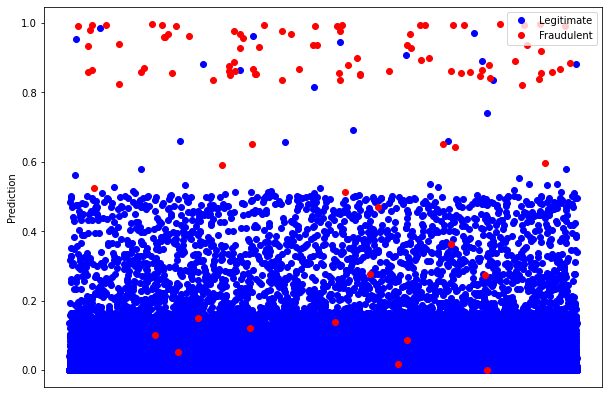

---------------------------------------------------------------
Model: "sequential_131"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_270 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_139 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_271 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Model: "sequential_132"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_272 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_140 (Dropout)        (No

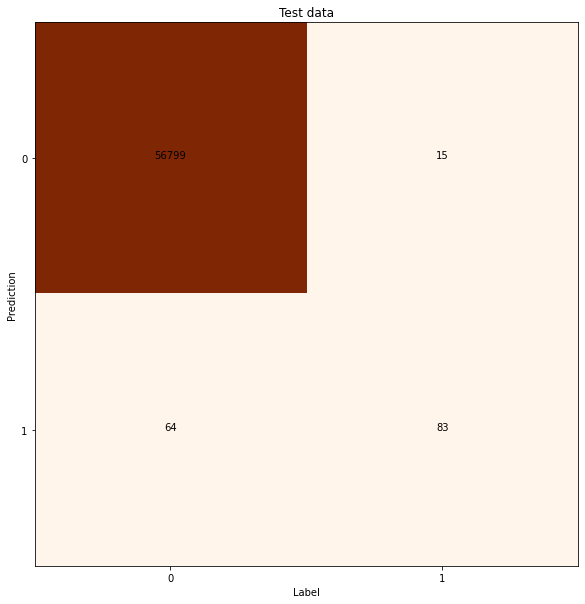

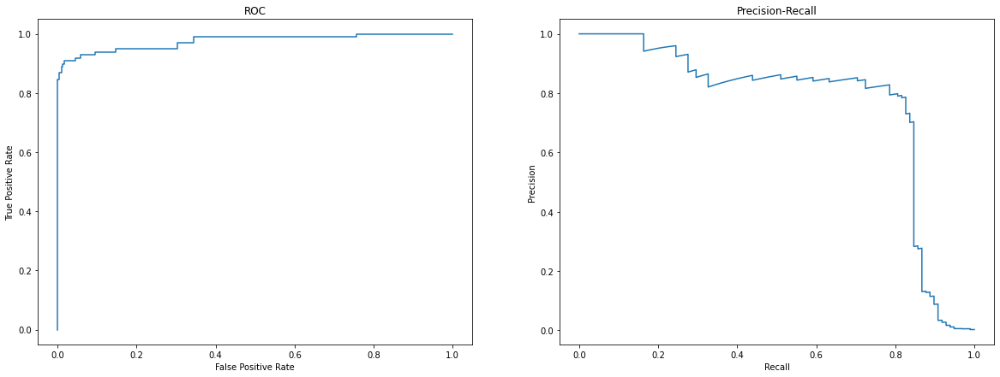

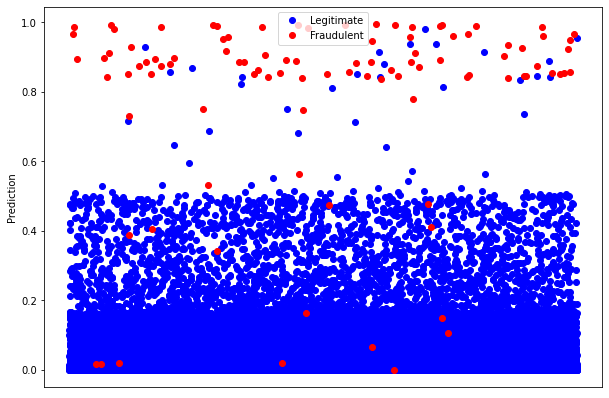

---------------------------------------------------------------
Model: "sequential_133"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_274 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_141 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_275 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Model: "sequential_134"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_276 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_142 (Dropout)        (No

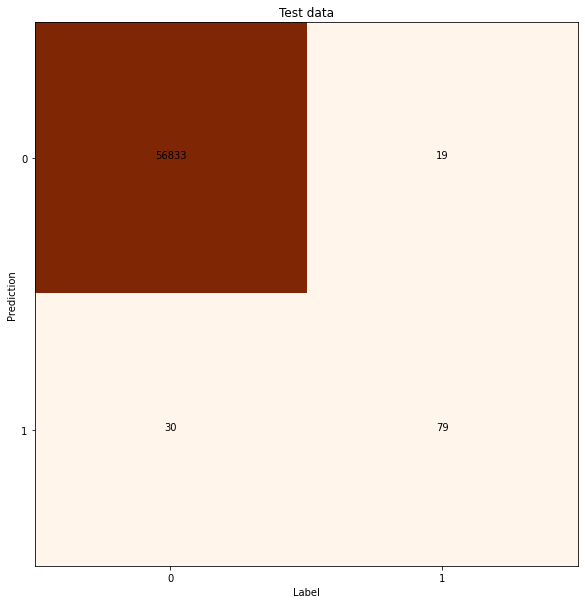

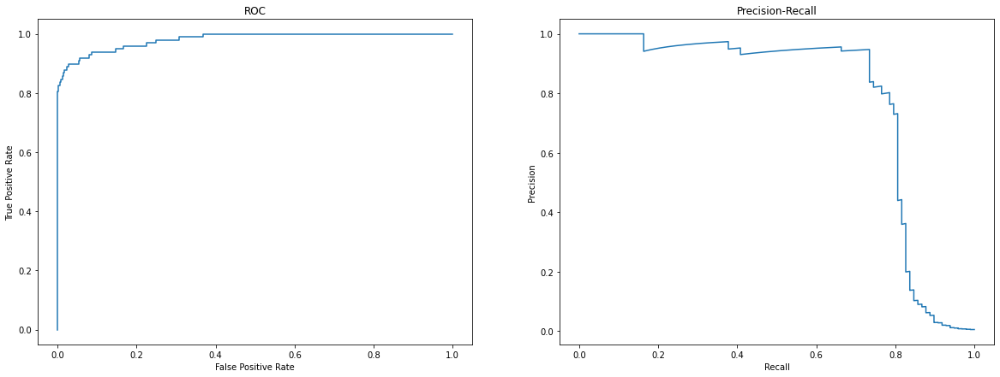

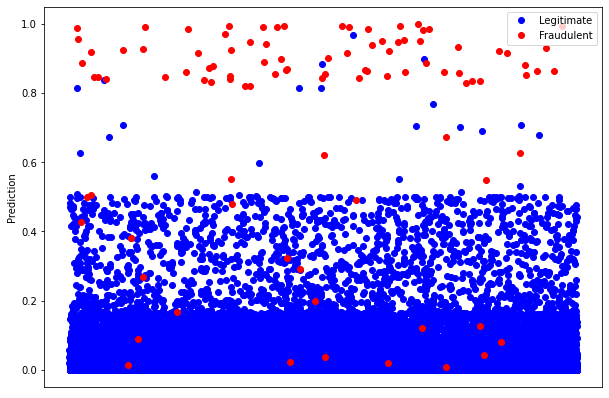

---------------------------------------------------------------
Model: "sequential_135"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_278 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_143 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_279 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Model: "sequential_136"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_280 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_144 (Dropout)        (No

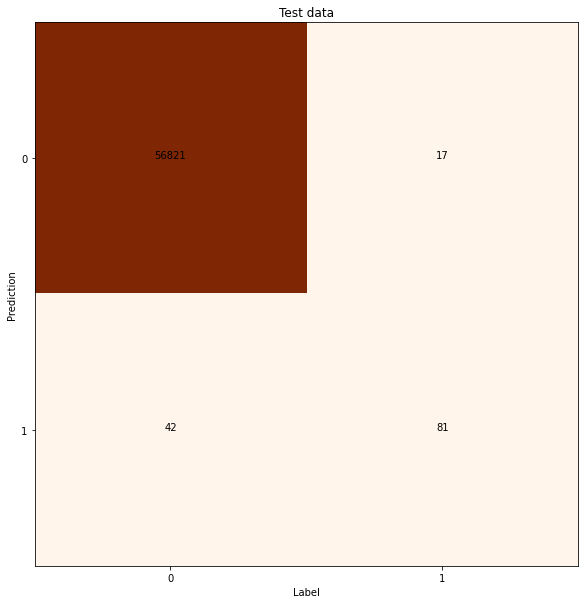

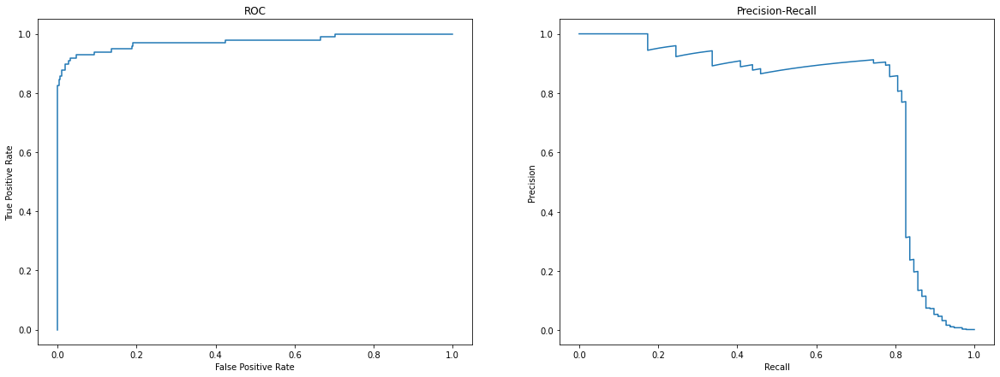

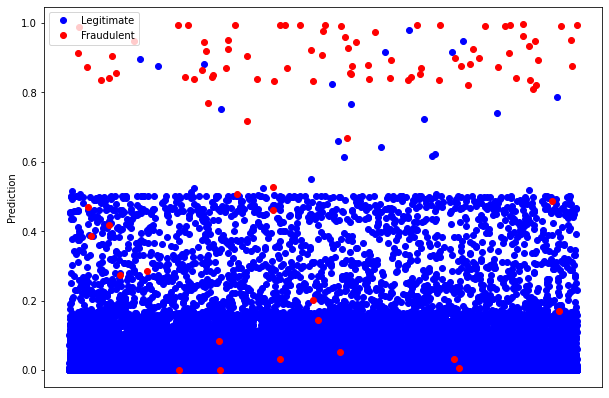

In [62]:
from sklearn.model_selection import StratifiedKFold

# Average of predictions of different sampling models

def kfold_av(k, data, samplings=["standard", "undersampling"], mid_activation="relu", class_weight=None, input_shape=(30,), smote_n=5):

    # Save lists of metrics for all folds
    cm = [] # confusion matrices
    roc = [] # roc curves
    pr = [] # precision-recall curves
    f1 = [] # F1 scores

    # Lists to save train and test sets for each fold
    test = []

    # List to save original training sets for scaling independent of sampling method
    orig_train = []

    # Separate k lists of train and test sets, both with the same proportions of each class existent in the dataset
    # This function returns k pair of lists of indexes of the data array, each pair with a list for train and the other for test
    skf = StratifiedKFold(k, shuffle=True)
    
    # Passing by all the pair of lists, we add the sets for each fold to the train and test lists
    for train_index, test_index in skf.split(data[:,:-1], data[:,-1]):

        # train.append(data[train_index])
        orig_train.append(data[train_index])
        test.append(data[test_index])

    # Fitting the model and generating metrics for each fold
    for i in range(k):
        
        # Save train sets for different sampling methods
        samplings_trains = []

        # Standard sampling
        if ("standard" in samplings):
            
            # Passing by all the pair of lists, we add the sets for each fold to the train and test lists
            samplings_trains.append(orig_train[i])

        # Undersampling
        if ("undersampling" in samplings):

            train_ = orig_train[i]
            train_fraud = train_[np.where(train_[:,-1]==1)[0]]

            # Get the indexes of the majority class in the training set, and sort just a few of them to have the same amount of samples as in the minority class
            train_legit_id = np.where(train_[:,-1]==0)[0]
            train_ = np.concatenate((train_fraud, train_[np.random.choice(train_legit_id, len(train_fraud))]), axis=0)
            
            np.random.shuffle(train_)
            samplings_trains.append(train_)

        # Oversampling
        if ("oversampling" in samplings):
            
            train_ = orig_train[i]
            train_legit = train_[np.where(train_[:,-1]==0)[0]]

            # Get the indexes of the minorty class in the training set, and sort many of them to have the same amount of samples as in the majority class
            train_fraud_id = np.where(train_[:,-1]==1)[0]
            train_ = np.concatenate((train_legit, train_[np.random.choice(train_fraud_id, len(train_legit))]), axis=0)
            
            np.random.shuffle(train_)
            samplings_trains.append(train_)

        # SMOTE
        if ("SMOTE" in samplings):

            train_ = orig_train[i]

            # Make SMOTE oversampling and add the new data to the original
            x, y = SMOTE(k_neighbors=smote_n).fit_resample(train_[:,:-1], train_[:,-1])
            train_ = np.concatenate((x, y.reshape(-1,1)), axis=1)
            
            np.random.shuffle(train_)
            samplings_trains.append(train_)

        print("---------------------------------------------------------------")

        # Scale data
        train_scaler = StandardScaler()
        train_scaler.fit(orig_train[i][:,:-1])

        for j in range(len(samplings)):

            samplings_trains[j][:,:-1] = train_scaler.transform(samplings_trains[j][:,:-1])

        test[i][:,:-1] = train_scaler.transform(test[i][:,:-1])

        # train_data = train[i][:,:-1]
        test_data = test[i][:,:-1]
        test_label = test[i][:,-1]

        # List to save models
        models = []

        # Build models
        for j in range(len(samplings)):

            models.append(make_model())
        
        # Save predictions from different models
        test_pred = []

        for j in range(len(models)):

            # Fit and save metrics' evolution through epochs
            model_fit(models[j], samplings_trains[j][:,:-1], samplings_trains[j][:,-1], None, None, 0, class_weight, 100, False)
            test_pred.append(models[j].predict(test_data))

        weights = np.copy(test_pred)

        weights = np.max((weights, 1-weights), axis=0)

        test_pred = np.average(np.array(test_pred), axis=0, weights=weights)

        # Calculate confusion matrices

        cm_test = confusion_matrix(test_label, np.round(test_pred))

        cms = [cm_test]

        precision = cm_test[1,1]/(cm_test[1,1]+cm_test[0,1])
        recall = cm_test[1,1]/(cm_test[1,1]+cm_test[1,0])
        print("Test Precision: %.3f%%" % (precision*100))
        print("Test Recall: %.3f%%" % (recall*100))

        # Plot confusion matrices
        plt.figure(figsize=(10*len(data_label),10))

        # plt.subplot(1,2,2)
        plt.imshow(cm_test.T, cmap="Oranges")
        for i in range(cm_test.shape[0]):
            for j in range(cm_test.shape[1]):
                plt.text(i, j, "%i"%cm_test[i,j], ha="center")
        plt.xticks([0,1])
        plt.yticks([0,1])
        plt.xlabel("Label")
        plt.ylabel("Prediction")
        plt.gca().set_title("Test data")

        # Calculate ROC and Precision-Recall curves, and F1 Score
        roc_, pr_, f1_ = roc_pr_f1_scores(test_label, test_pred)

        # Plot the separation between the predictions of the diffrent classes
        plot_separation(test_label, test_pred)

        cm.append(cms)
        roc.append(roc_)
        pr.append(pr_)
        f1.append(f1_)

    return cm, roc, pr, f1

cm, roc, pr, f1 = kfold_av(5, data);

Test Precision: 0.624625 +/- 0.067380
Test Recall: 0.845528 +/- 0.030420


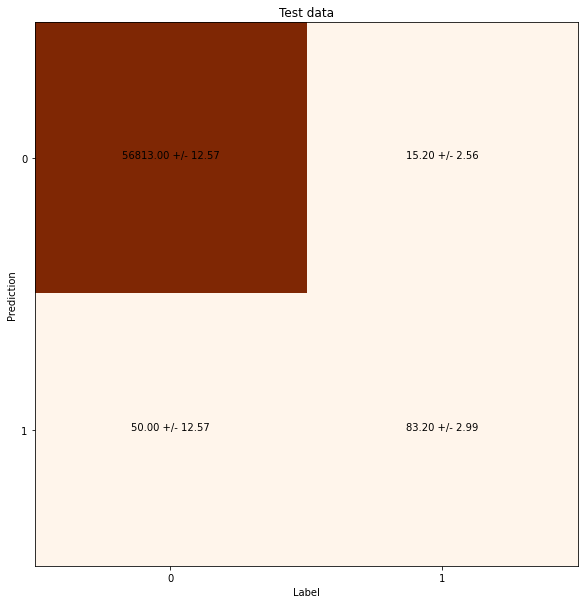

F1 Score: 0.720 +/- 0.029
Area under ROC curve: 0.970384 (0.951460 - 0.989308)
Area under Precision-Recall curve: 0.772520 (0.743382 - 0.801657)


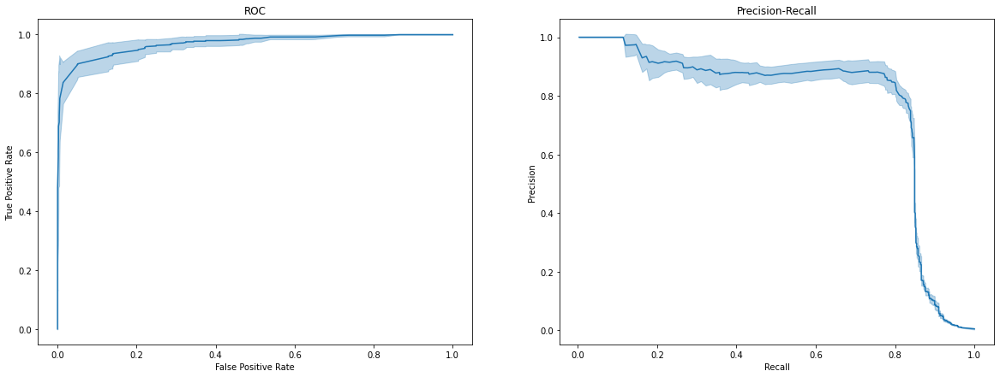

In [63]:
# Generate k-fold statistics
def kfold_av_stats(cm, roc, pr, f1):

    # Confusion matrix

    # List to save confusion matrices for train and test sets
    cms = []

    # Save the respective matrices on the lists
    for i in range(len(cm)):
        cms.append(cm[i])

    # Convert to array
    cms = np.array(cms)

    # Calculate averages and standard deviation of confusion matrices cells over the folds
    cms_avg = np.mean(cms, axis=0)[0]
    cms_std = np.std(cms, axis=0)[0]

    data_label = [test_data, test_label, "Test"]
    # Print results for the test set
        
    # Calculate precision, recall, and the respective standard deviations over folds
    precision = cms_avg[1,1]/(cms_avg[1,1]+cms_avg[0,1])
    precision_std = (cms_std[1,1]*cms_avg[0,1] + cms_std[0,1]*cms_avg[1,1])/(cms_avg[1,1]+cms_avg[0,1])**2
    recall = cms_avg[1,1]/(cms_avg[1,1]+cms_avg[1,0])
    recall_std = cms_std[1,1]/(cms_avg[1,1]+cms_avg[1,0])

    print("Test Precision: %f +/- %f" % (precision, precision_std))
    print("Test Recall: %f +/- %f" % (recall, recall_std))

    # Plot confusion matrices
    plt.figure(figsize=(30,10))
    plt.imshow(cms_avg.T, cmap="Oranges")
    for i in range(cms_avg.shape[0]):
        for j in range(cms_avg.shape[1]):
            plt.text(i, j, "%.2f +/- %.2f" % (cms_avg[i,j], cms_std[i,j]), ha="center")
    plt.xticks([0,1])
    plt.yticks([0,1])
    plt.xlabel("Label")
    plt.ylabel("Prediction")
    plt.gca().set_title("%s data" % (data_label[2]))
    plt.show()

    ############################################################################

    # F1 Score
    
    f1_avg = np.mean(f1)
    f1_std = np.std(f1)
    print("F1 Score: %.3f +/- %.3f" % (f1_avg, f1_std))

    ############################################################################

    # ROC + Precision-Recall

    # Lists to save FPR and TPR of each fold
    fpr = [roc[0][0]]
    tpr = [roc[0][1]]

    # Save all of them, interpolating to a same set o thresholds
    for i in range(1, len(roc)):
        
        # The .flip is needed as the threshold array generated by sklearn.metrics.roc_curve is decrescent
        fpr.append(np.interp(np.flip(roc[0][2]), np.flip(roc[i][2]), roc[i][0]))
        tpr.append(np.interp(np.flip(roc[0][2]), np.flip(roc[i][2]), roc[i][1]))

    # Convert to array
    tpr = np.array(tpr)
    fpr = np.array(fpr)

    # Calculate mean and standard deviation
    tpr_avg = np.mean(tpr, axis=0)
    tpr_std = np.std(tpr, axis=0)
    fpr_avg = np.mean(fpr, axis=0)
    fpr_std = np.std(fpr, axis=0)

    # Lists so save precision and recall curves of each fold
    p = [pr[0][0]]
    r = [pr[0][1]]

    # Save all of them, interpolating to a same set o thresholds
    for i in range(len(pr)):

        p.append(np.interp([0]+list(pr[0][2]), [0]+list(pr[i][2]), pr[i][0]))
        r.append(np.interp([0]+list(pr[0][2]), [0]+list(pr[i][2]), pr[i][1]))

    # Convert to array
    p = np.array(p)
    r = np.array(r)
    
    # Calculate average and standard deviation
    p_avg = np.mean(p, axis=0)
    p_std = np.std(p, axis=0)
    r_avg = np.mean(r, axis=0)
    r_std = np.std(r, axis=0)

    # Print results of area under ROC and Precision-Recall curves
    print("Area under ROC curve: %f (%f - %f)" % (auc(fpr_avg, tpr_avg), auc(fpr_avg, tpr_avg-tpr_std), auc(fpr_avg, tpr_avg+tpr_std)))
    print("Area under Precision-Recall curve: %f (%f - %f)" % (auc(r_avg, p_avg), auc(r_avg, p_avg-p_std), auc(r_avg, p_avg+p_std)))

    # Plot averages and deviations for ROC and Precision-Recall curves, with deviations considered only for the y-axis,
    # so the plot don't get very poluted
    plt.figure(figsize=(20,7))

    plt.subplot(1,2,1)
    plt.plot(fpr_avg, tpr_avg)
    plt.fill_between(fpr_avg, tpr_avg-tpr_std, tpr_avg+tpr_std, color="C0", alpha=0.3)
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("ROC")

    plt.subplot(1,2,2)
    plt.plot(r_avg, p_avg)
    plt.fill_between(r_avg, p_avg-p_std, p_avg+p_std, color="C0", alpha=0.3)
    plt.xlabel("Recall")
    plt.ylabel("Precision")
    plt.title("Precision-Recall")
    plt.show()

    return cms_avg, cms_std, fpr_avg, fpr_std, tpr_avg, tpr_std, f1_avg, f1_std, p_avg, p_std, r_avg, r_std

kfold_av_stats(cm, roc, pr, f1);

---------------------------------------------------------------
Model: "sequential_137"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_282 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_145 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_283 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Model: "sequential_138"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_284 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_146 (Dropout)        (No

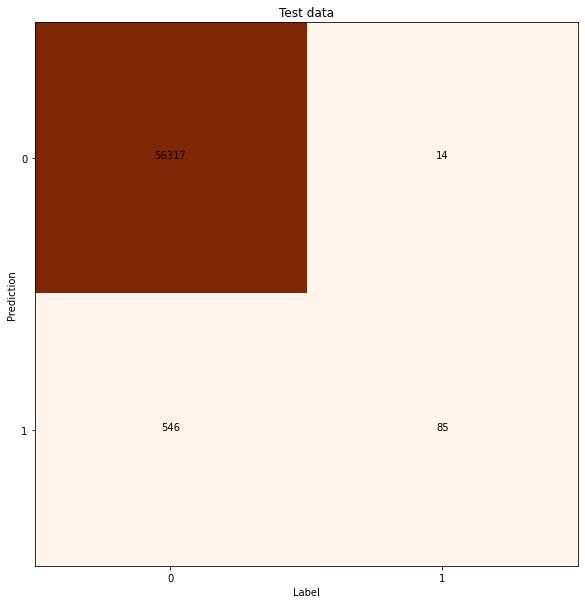

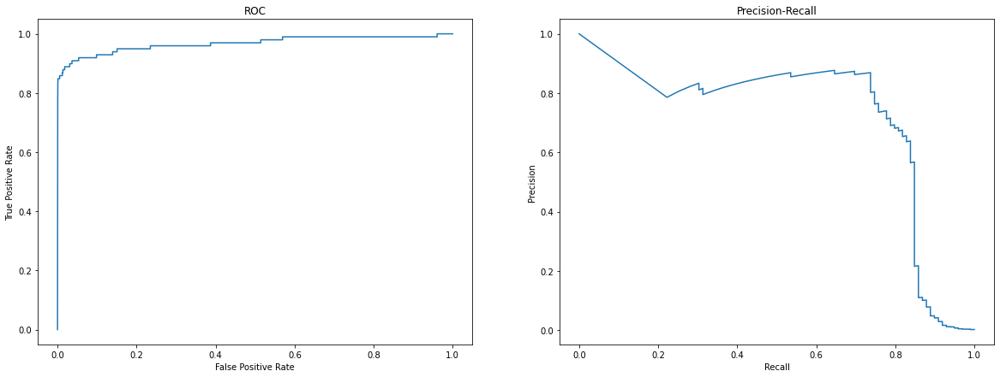

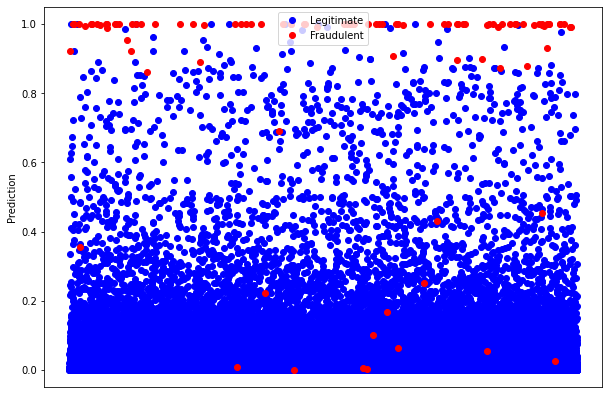

---------------------------------------------------------------
Model: "sequential_139"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_286 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_147 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_287 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Model: "sequential_140"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_288 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_148 (Dropout)        (No

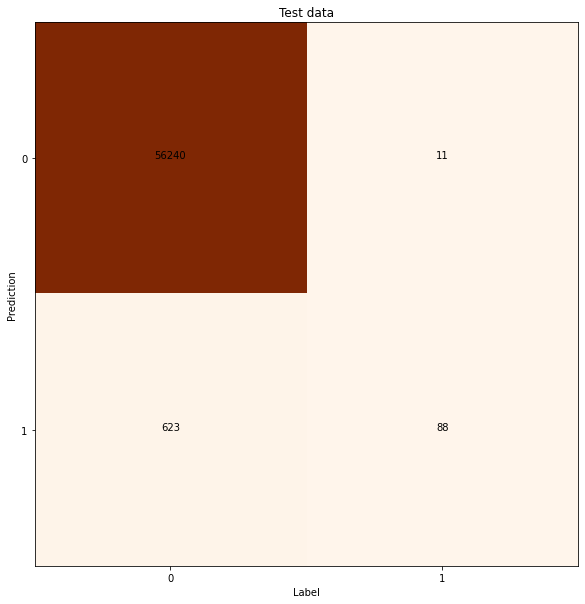

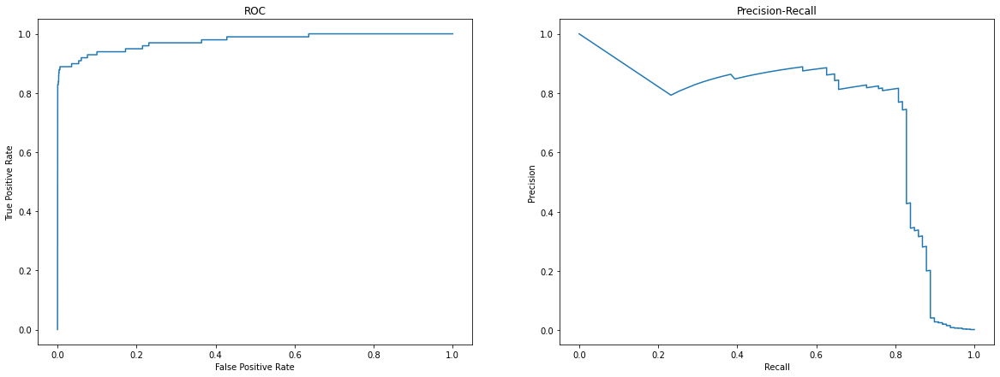

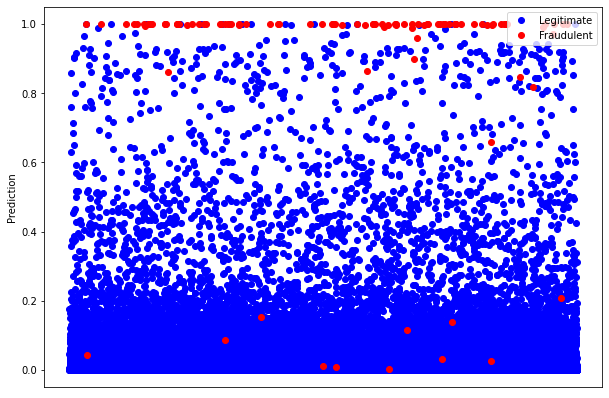

---------------------------------------------------------------
Model: "sequential_141"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_290 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_149 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_291 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Model: "sequential_142"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_292 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_150 (Dropout)        (No

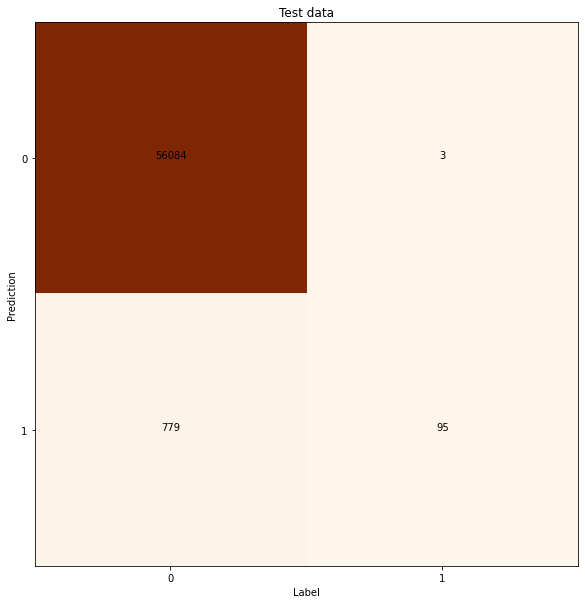

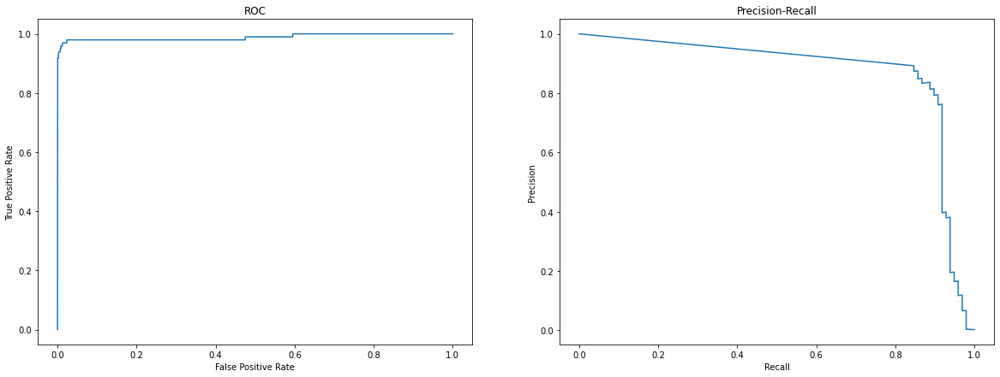

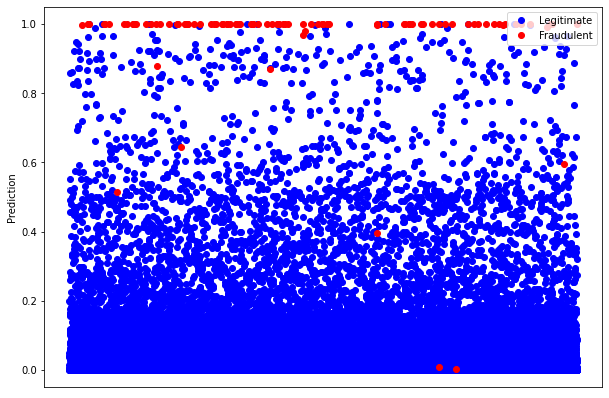

---------------------------------------------------------------
Model: "sequential_143"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_294 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_151 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_295 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Model: "sequential_144"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_296 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_152 (Dropout)        (No

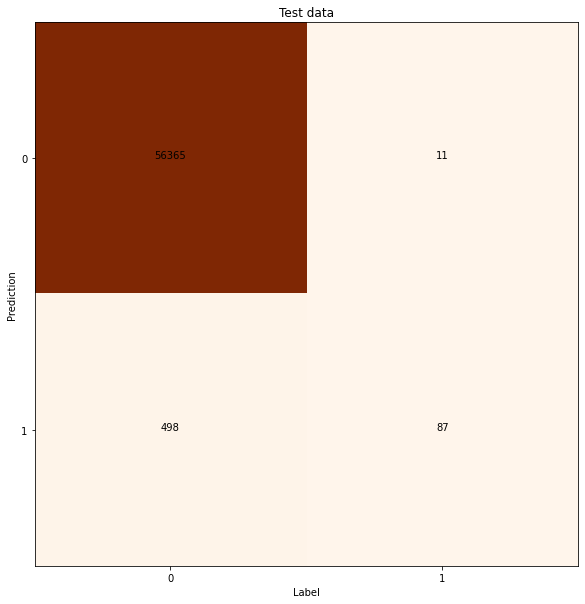

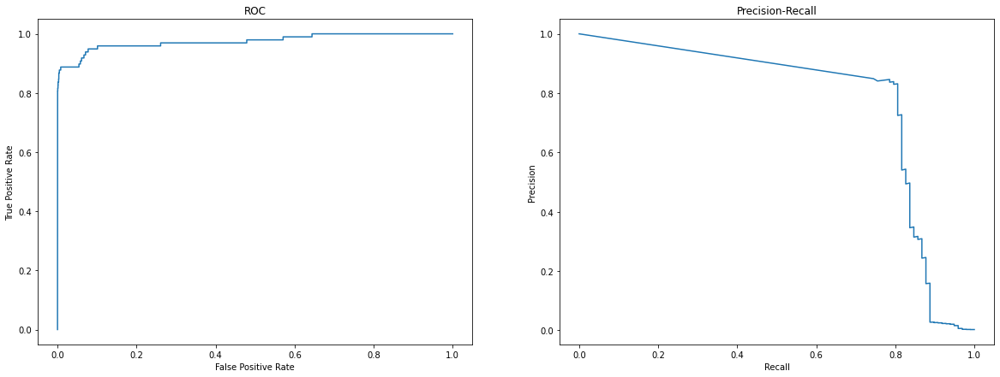

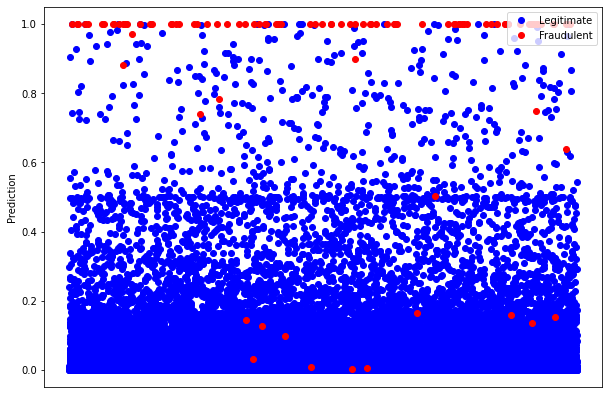

---------------------------------------------------------------
Model: "sequential_145"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_298 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_153 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_299 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Model: "sequential_146"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_300 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_154 (Dropout)        (No

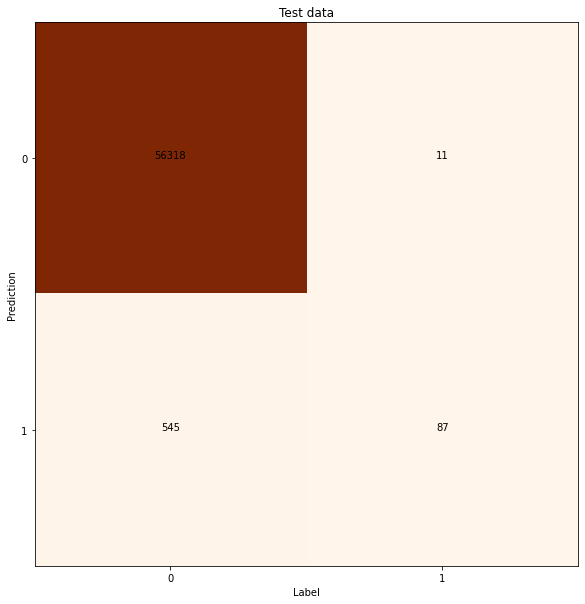

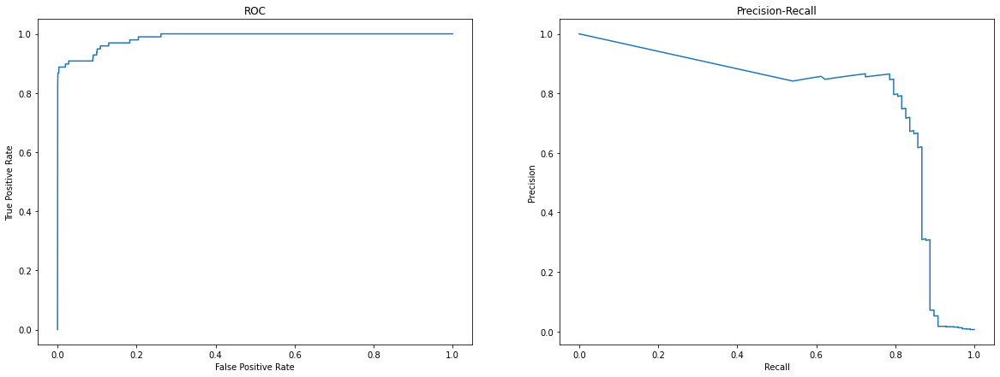

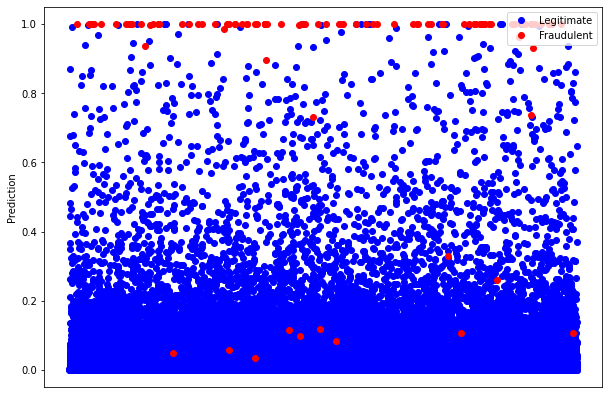

In [64]:
av4_kfold = kfold_av(5, data, samplings=["undersampling", "SMOTE"])

Test Precision: 0.128750 +/- 0.022911
Test Recall: 0.898374 +/- 0.034969


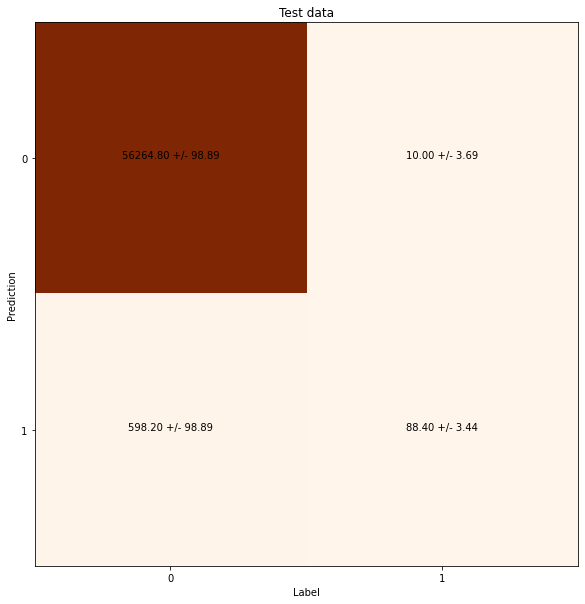

F1 Score: 0.228 +/- 0.020
Area under ROC curve: 0.976296 (0.964028 - 0.988563)
Area under Precision-Recall curve: 0.756017 (0.732263 - 0.779771)


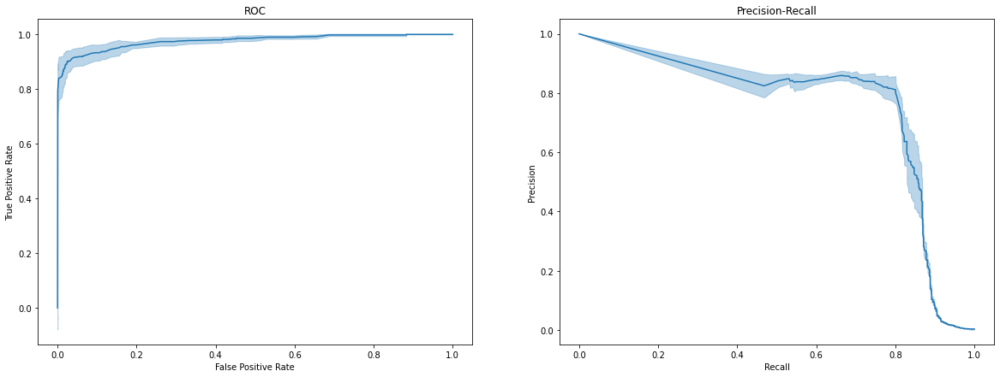

In [65]:
kfold_av_stats(*av4_kfold);

---------------------------------------------------------------
Model: "sequential_147"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_302 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_155 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_303 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Model: "sequential_148"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_304 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_156 (Dropout)        (No

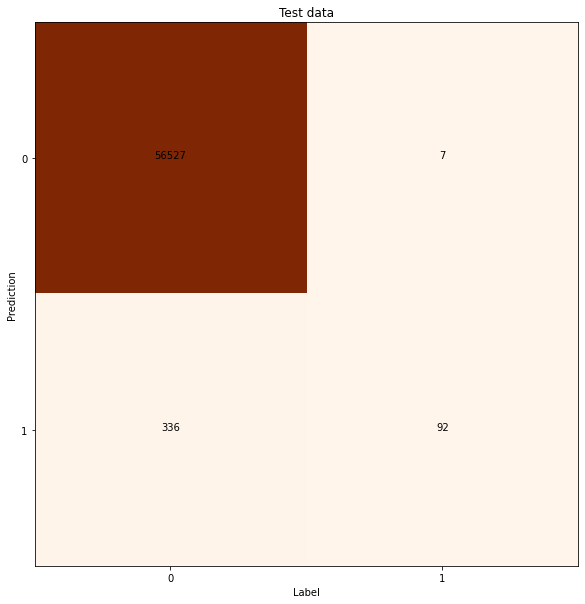

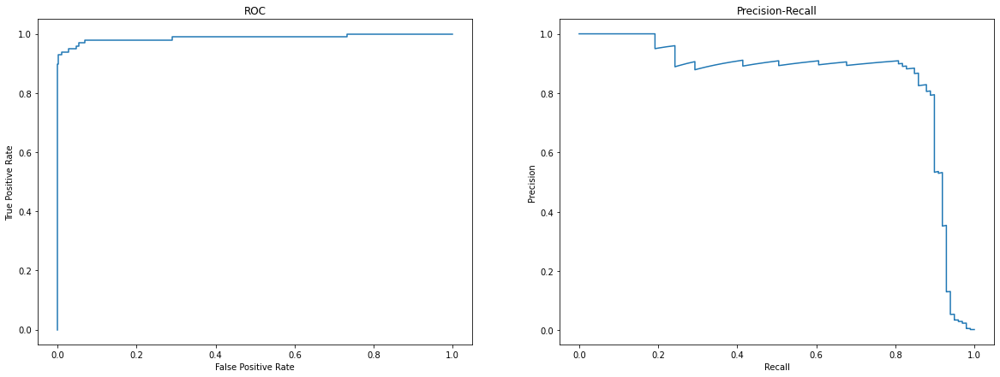

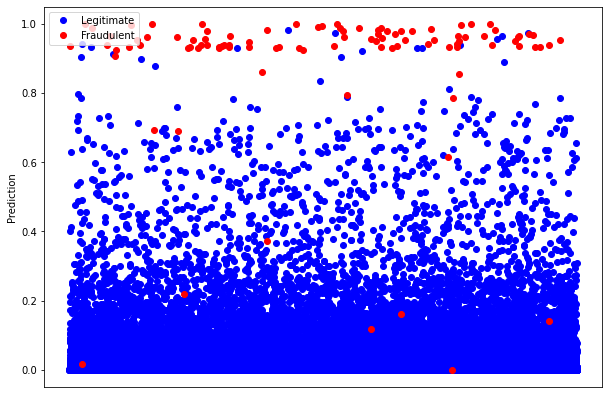

---------------------------------------------------------------
Model: "sequential_151"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_310 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_159 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_311 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Model: "sequential_152"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_312 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_160 (Dropout)        (No

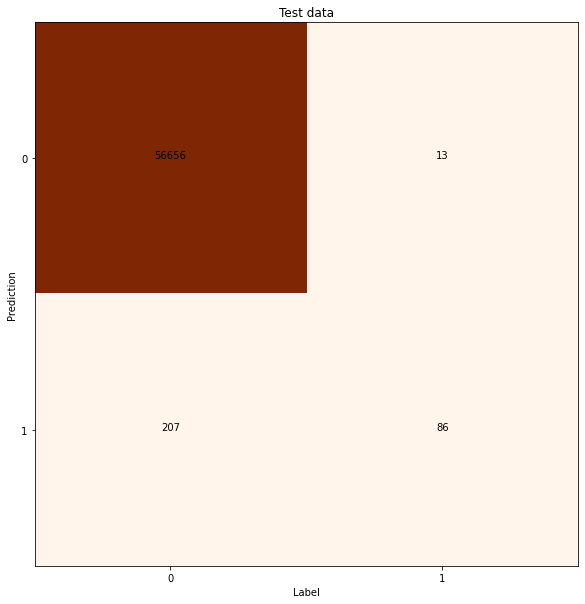

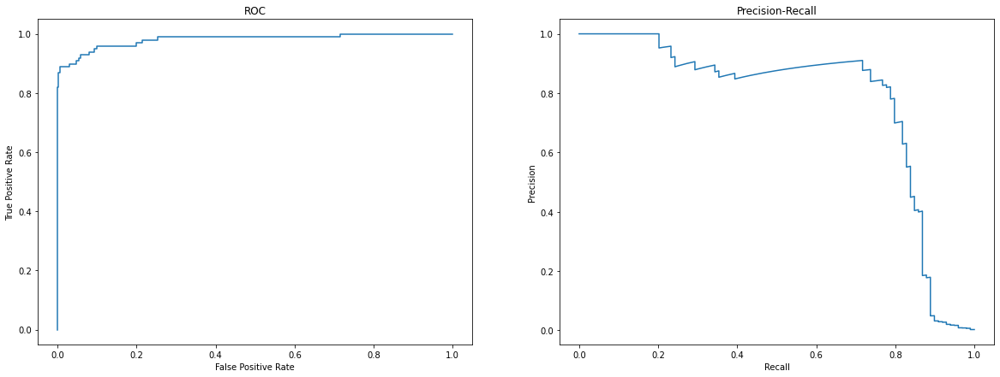

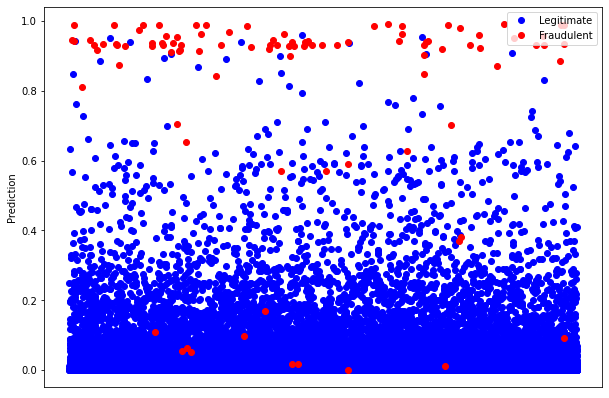

---------------------------------------------------------------
Model: "sequential_155"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_318 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_163 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_319 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Model: "sequential_156"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_320 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_164 (Dropout)        (No

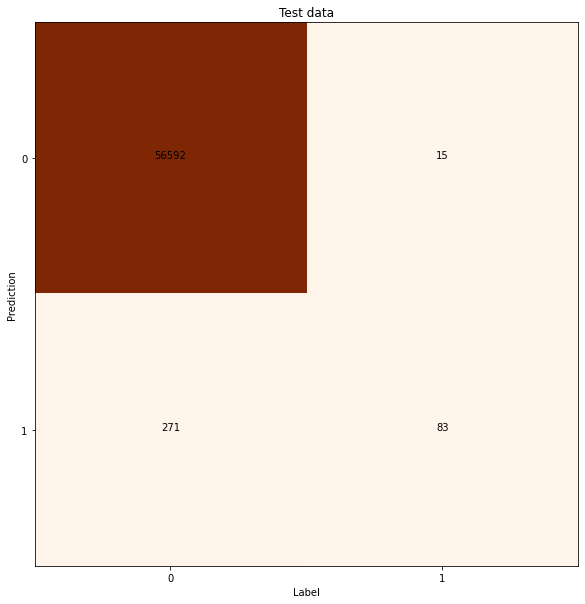

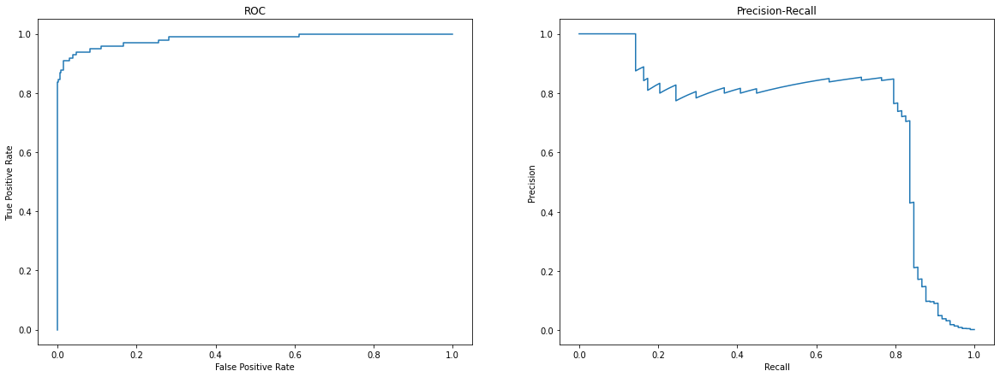

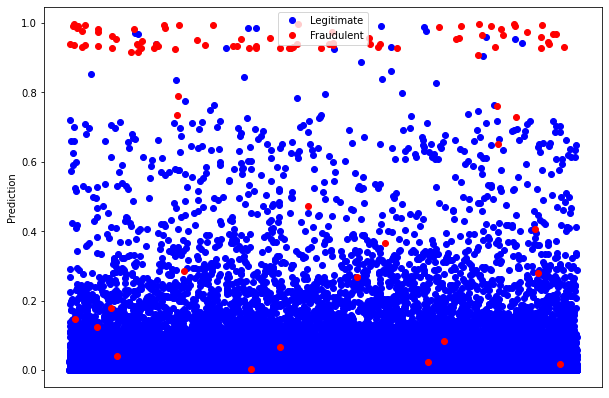

---------------------------------------------------------------
Model: "sequential_159"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_326 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_167 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_327 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Model: "sequential_160"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_328 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_168 (Dropout)        (No

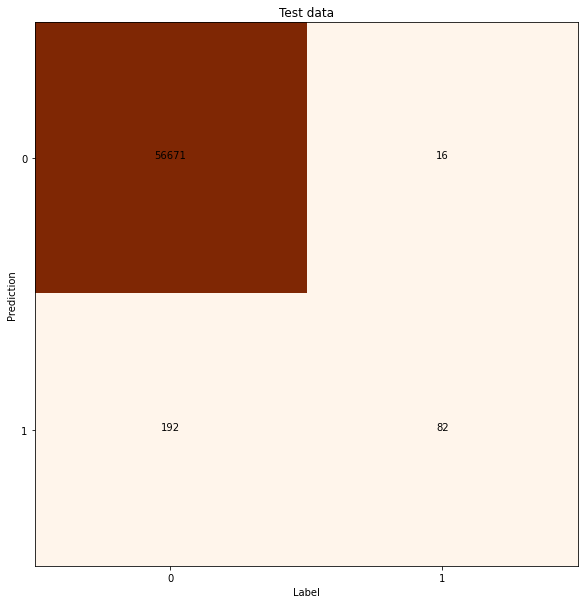

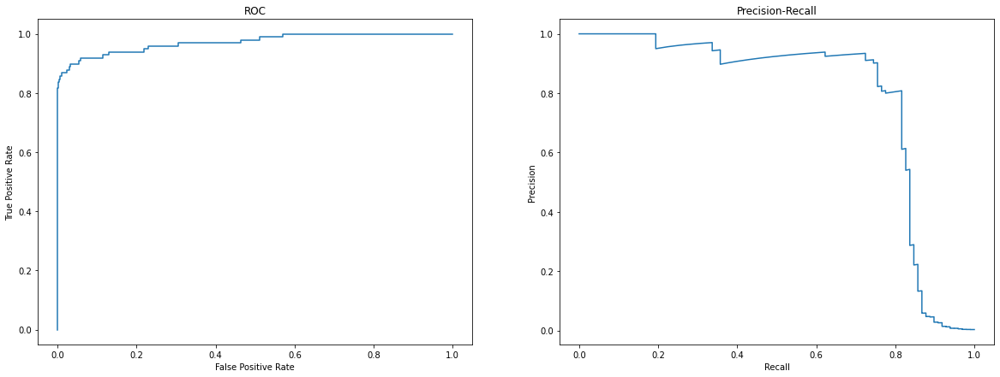

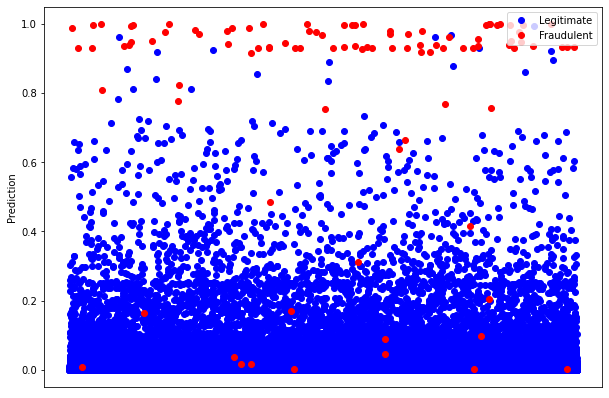

---------------------------------------------------------------
Model: "sequential_163"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_334 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_171 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_335 (Dense)            (None, 1)                 17        
Total params: 513
Trainable params: 513
Non-trainable params: 0
_________________________________________________________________
Model: "sequential_164"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_336 (Dense)            (None, 16)                496       
_________________________________________________________________
dropout_172 (Dropout)        (No

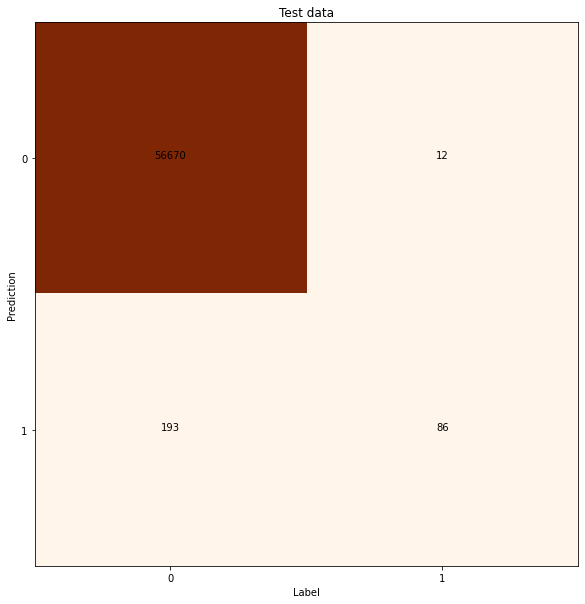

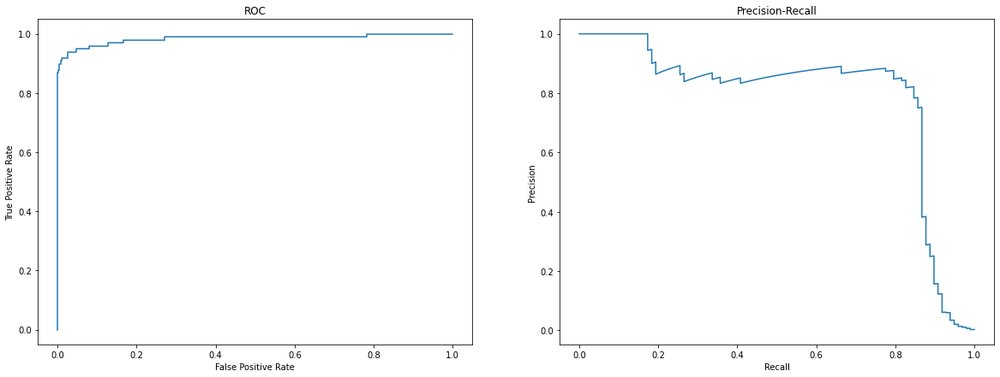

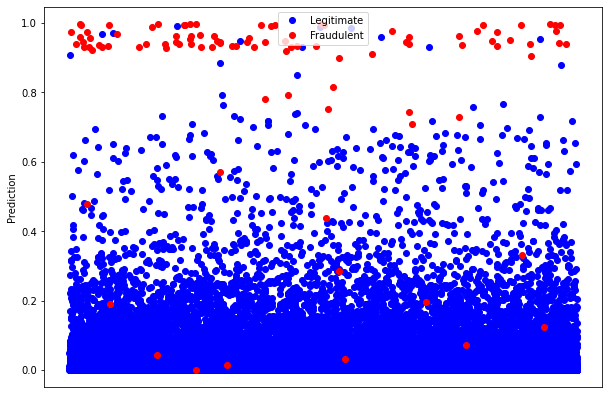

In [66]:
av4_kfold = kfold_av(5, data, samplings=["standard", "undersampling", "oversampling", "SMOTE"])

Test Precision: 0.263514 +/- 0.053352
Test Recall: 0.871951 +/- 0.035438


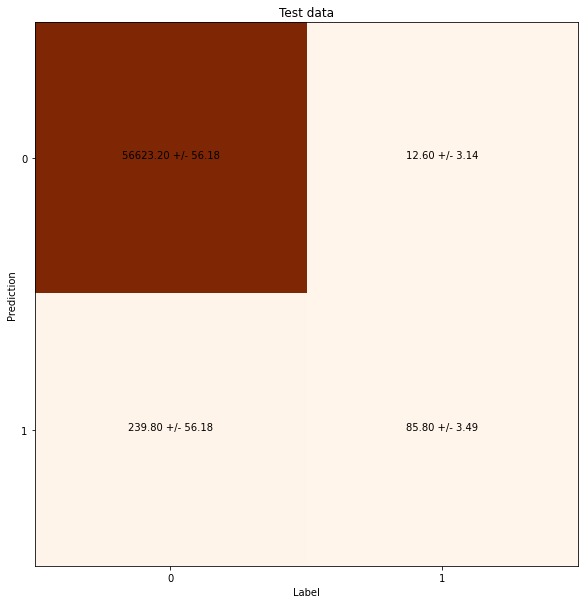

F1 Score: 0.410 +/- 0.043
Area under ROC curve: 0.978698 (0.966639 - 0.990757)
Area under Precision-Recall curve: 0.791699 (0.760071 - 0.823326)


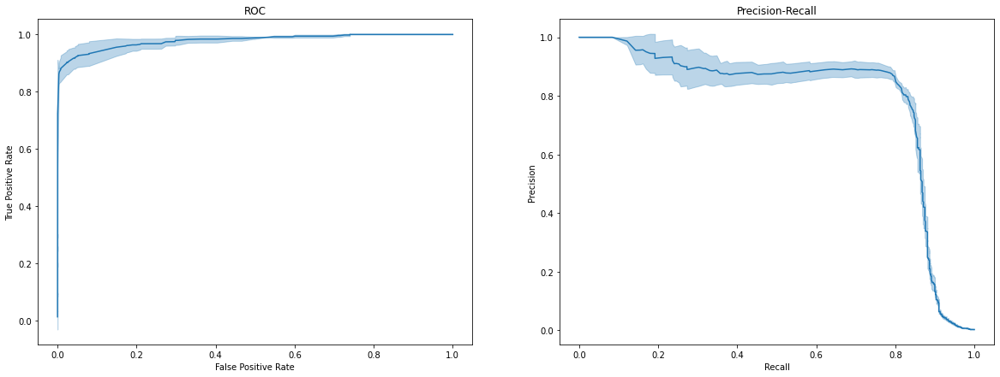

In [67]:
kfold_av_stats(*av4_kfold);